```
# Code: Diastolic correlation code
<!- see corr-->
# Author: Naveen Gangadharan, 2020
```

In [1]:

# corr

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
from numpy import math
import statistics 
from numpy import NaN, Inf, arange, isscalar, asarray, array
import scipy
import pandas as pd
import csv
from scipy.signal import savgol_filter
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
from matplotlib import style
import numpy as np
from scipy.signal import butter, filtfilt
from math import pi, log
from scipy import fft, ifft
from scipy.optimize import curve_fit
from scipy.signal import butter, lfilter, freqz, iirnotch
from scipy.signal import find_peaks, peak_prominences, peak_widths
from scipy.ndimage import gaussian_filter1d
from scipy import stats
import os
from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns
from scipy import interpolate
%pylab inline

Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python3.7/dist-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['log', 'fft', 'pi', 'ifft']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [3]:

def butter_highpass_filter(data, cutoff, fs, order=5):
  nyq = 0.5 * fs
  normal_cutoff = cutoff / nyq
  b, a = butter(order, normal_cutoff, btype='high', analog=False)
  y = filtfilt(b, a, data)
  return y

def butter_lowpass_filter(data, cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    y = filtfilt(b, a, data)
    return y


In [4]:
def peak_detect(x):
  inx, _ = find_peaks(x, prominence=0.000000001, distance=230)
  prominences = peak_prominences(x, inx)[0]
  peaks = [prominences[np.where(inx==i)] if i in inx else 0 for i in range(len(x))]
  return peaks

In [5]:
def peak_and_valley_detect(x, prominence=0.0025, distance=230, width= [10,700]):
  inx, _ = find_peaks(x, prominence=prominence, distance=distance, width=width)
  prominences = peak_prominences(x, inx)[0]
  widths = peak_widths (x,inx)[0]

  # widths= [widths[np.where(inx==i)][0] if i in inx else 0 for i in range(len(x))]
  peaks = [prominences[np.where(inx==i)][0] if i in inx else 0 for i in range(len(x))]
  inx, _ = find_peaks(-x, prominence=prominence, distance=distance)
  prominences = peak_prominences(-x, inx)[0]
  valleys = [-prominences[np.where(inx==i)][0] if i in inx else 0 for i in range(len(x))]
  return np.array(peaks)+np.array(valleys), widths


In [6]:
def peak_and_valley_detect(x, prominence=0.0005, distance=230, width= [10,700]):
  inx, _ = find_peaks(x, prominence=prominence, distance=distance, width=width)
  prominences = peak_prominences(x, inx)[0]
  widths = peak_widths (x,inx)[0]
  peaks = [prominences[np.where(inx==i)][0] if i in inx else 0 for i in range(len(x))]
  # widths= [widths[np.where(inx==i)][0] if i in inx else 0 for i in range(len(x))]
  
  inx1, _ = find_peaks(-x, prominence=prominence, distance=distance)
  prominences = peak_prominences(-x, inx1)[0]
  valleys = [-prominences[np.where(inx1==i)][0] if i in inx1 else 0 for i in range(len(x))]
  return np.array(peaks)+np.array(valleys), widths, inx, inx1

In [7]:
def sigmoid_5pl(x, a, b, c,d, e):
  return d + ((a-d)/(1+(x/c)**b)**e)

def sigmoid_4pl(x, a, b, c,d):
  return d + ((a-d)/1+(x/c)**b)

In [8]:
def save_df(df=None, filename=''):
    df.to_csv(filename, index=True)
    !cp -r $filename "/content/drive/My Drive/data40/sphygmo/"

Bottom cell and the one below that with chnage to nibp2.txt only.(only action2)

final decided : mean for threshold and its 1 2 3 ,  

use 0.75 factor finally  (0.75* threshold), corr =0.8

d0 d02 d08 d015 added variables for cormin (not useful though)

added zscore<3 for op and op_new as it was affecting the mean

check diastolic analysis folder excel sheets. aucr thresh with mean is better than median as it underestimates. 
also, 0.75 aucr and 0.8 corr together is better and works as final conclusion.
correln feature prevents overestimation too. and anot too much underestimation since it is still low 0.8.

In [9]:
class NIBPProcessor(object):
 
  def __init__(self, filepath=''):
    time, ch1, ch2, ch3= np.loadtxt(filepath, dtype=('f4, f4, f4, f4'),unpack=True,delimiter = '\t')
    ip = pd.DataFrame()
    ip['time'] = time
    ip['ref_ppg'] = ch2 + 4
    ip['occ_ppg'] = ch3 + 4
    ip['pressure'] = ch1
    self.ip = ip
    self.op=0
    self.op_new=0
    self.op_new1=0
    self.op_new2=0


  
  
  def save_peak_locations(self):
    self.ip['ref_peaks'],ref_wid, inxref,inx1ref = peak_and_valley_detect(self.ip['ref_ppg'])
    self.ip['occ_peaks'],occ_wid, inxocc, inx1occ = peak_and_valley_detect(self.ip['occ_ppg'], prominence=0.00005)

    self.ip['std']= self.ip['occ_ppg'].rolling(2000).std()
    self.ip['stdr']= self.ip['ref_ppg'].rolling(2000).std()
    self.ip['occ1d'] = np.gradient(self.ip['occ_ppg'].values,100)
    self.ip['occ1d_peaks'] = peak_detect(self.ip['occ1d'])
    self.ip['ref1d'] = np.gradient(self.ip['ref_ppg'].values)
    self.ip['ref1d_peaks'] = peak_detect(self.ip['ref1d'])

  def detect_plateaus(self):
    plateau_width = 3000
    # Making a list of plateaus
    hts = np.linspace(0.0001, 1, 100)
    peaks, _ = find_peaks(self.ip['pressure'], width=plateau_width)

    plateaus = []
    for peak in peaks:
      for ht in hts:
        width, height, left, right = peak_widths(self.ip['pressure'], np.array([peak]), rel_height=ht)
        if width > plateau_width:
          break
      plateaus.append(self.ip.loc[left[0]:right[0]])
    # Finding mean pressure for each plateau
    mean_pressures = []
    mean_occppg=[]
    mean_refppg=[]
    for plateau in plateaus:
      # plateau.drop(plateau.head(1000).index, inplace=True) 
      # plateau.drop(plateau.tail(500).index, inplace=True)
      mean_pressures.extend([plateau['pressure'].mean()] * len(plateau))
      mean_occppg.extend([plateau[plateau['occ_peaks']>0]['occ_peaks'].median()] * len(plateau))
      mean_refppg.extend([plateau[plateau['ref_peaks']>0]['ref_peaks'].median()] * len(plateau))

    self.ip = pd.concat(plateaus)
    self.ip['mean_pressure'] = mean_pressures
    self.ip['mean_occppg'] = mean_occppg
    self.ip['mean_refppg'] = mean_refppg
    self.ip = self.ip[np.invert(self.ip.index.duplicated())]
    return plateaus
  


  def separate_into_cycles(self, ppg='ref', separate_by_peak=True):
    detected_plateaus = self.ip['mean_pressure'].reindex(self.ip.index, fill_value=0).values

    # Making a list of occ ppg cycles
    cycles = []
    peaks = (self.ip[self.ip[f'{ppg}_peaks'] > 0].index).tolist()
    valleys = (self.ip[self.ip[f'{ppg}_peaks'] < 0].index).tolist()

    separator = peaks if separate_by_peak else valleys
    not_separator = valleys if separate_by_peak else peaks
    for i in range(1, len(separator)):
      # if (not_separator[i]>separator[i-1])&(not_separator[i]<separator[i]):
      cycles.append(self.ip.loc[separator[i - 1]:separator[i]])
    # to check if there are cycles with no valleys in between in ref arm, such cycles are ignored.
    cycles = [cycle for cycle in cycles if len(np.where((not_separator>cycle.index[0])&(not_separator<cycle.index[-1]))[0]) != 0]
    begin = self.ip.loc[:separator[0]]
    return cycles



  def separate_into_occcycles(self):
    detected_plateaus = self.ip['mean_pressure'].reindex(self.ip.index, fill_value=0).values

    # Making a list of occ ppg cycles
    cycles = []
    peaks = (self.ip[self.ip['occ_peaks'] > 0].index).tolist()
    for i in range(1, len(peaks)):
      cycles.append(self.ip.loc[peaks[i - 1]:peaks[i]])
    # to check if there are cycles with no valleys in between in ref arm, such cycles are ignored.
    cycles = [cycle for cycle in cycles if len(cycle[(cycle['occ_peaks'] < 0)]) != 0]
    begin = self.ip.loc[:peaks[0]]
    return cycles
    
  

  def separate_into_refcycles(self):

    detected_plateaus = self.ip['mean_pressure'].reindex(self.ip.index, fill_value=0).values

    # Making a list of ref ppg cycles
    cycles = []
    valleys = (self.ip[self.ip['ref_peaks'] < 0].index).tolist()
    for i in range(1, len(valleys)):
      cycles.append(self.ip.loc[valleys[i - 1]:valleys[i]])
    # to check if there are cycles with no peaks in between in ref arm, such cycles are ignored.
    cycles = [cycle for cycle in cycles if len(cycle[(cycle['ref_peaks'] > 0)]) != 0]
    begin = self.ip.loc[:valleys[0]]
    return cycles

    

  def compute_ita(self):
    ita=[]
    cycle_pressure=[]
    cycles = self.separate_into_occcycles()
    for i,cycle in enumerate(cycles):
      if (cycle ['mean_pressure'].values[0] == cycle['mean_pressure'].values).all():
        tt1=cycle[cycle['occ_peaks']>0]['time'].values[0]
        pp1=cycle[cycle['occ_peaks']>0]['occ_peaks'].values[0]

        tt2=cycle[cycle['occ_peaks']<0]['time'].values[0]
        pp2=cycle[cycle['occ_peaks']<0]['occ_peaks'].values[0]

        tt3=cycle[cycle['occ_peaks']>0]['time'].values[-1]
        pp3=cycle[cycle['occ_peaks']>0]['occ_peaks'].values[-1]

        cycle_pressure.append(cycle['mean_pressure'].values[0])

        tt4=tt2-tt1
        tt5=tt3-tt2
        ita_cycle=(0.5*( (pp1*tt5) + (pp3*tt4)))
        ita.append(ita_cycle)

    itapd = pd.DataFrame()
    itapd['ita']=ita
    itapd['pressure']=cycle_pressure
    threshold = itapd['ita'].max()/50

    if len(itapd[itapd['ita']<threshold])!=0:
      first_zero = itapd[itapd['ita']<threshold]['pressure'].min()
    else:
      first_zero = itapd[itapd['ita']==(itapd['ita'].min())]['pressure'].min()
    return itapd, first_zero

  def fit_sigmoid(self, data, x, y):
    (a, b, c, d, e), _ = curve_fit(sigmoid_5pl, data[x], data[y], maxfev=5000)
    
    data['fit'] = sigmoid_5pl(data[x], a, b, c, d, e)
    # save_df(self.op, '_profile_pd.csv')

    fit = pd.DataFrame()
    fit['x'] = list(range(int(data[x].min()), int(data[x].max())))
    fit['y'] = np.interp(fit['x'], data[x], data['fit'])
    order = (fit['x'].max() - fit['x'].min()) / 10
    fit['d1'] = np.gradient(gaussian_filter1d(fit['y'], order))
    fit['d2'] = np.gradient(fit['d1'])
    return fit

  def fitting(self,input_file='', name=''):
    amplitude = []
    cycle_pressure = []
    plateau_pressure = []
    ref_amplitude = []
    # na=[]
    na.append(name)
    print(name)

    stdev = []
    auc = []
    occ1d = []
    delay = []
    ref_auc = []
    vol = []
    ref_vol = []
    full_auc = []
    corr=[]
    auc_r=[]
    list_pres=[]
    list_ratio=[]
    list_cor=[]
    list_amp=[]
    list_amponly=[]
    list_auconly=[]
    cycles = self.separate_into_refcycles()
    # added 24th
    diast=0
    upd=0
    upd1=0
    diamax=0
    diafinal=0
    auci=0
    refi=0
    ai=0
    for i in range(len(cycles)):
      if (cycles[i]['mean_pressure'].values[0] == cycles[i]['mean_pressure'].values).all():
        stdev.append(cycles[i]['std'].values[0])
        c,v=scipy.stats.pearsonr(cycles[i]['ref_ppg'], cycles[i]['occ_ppg'])
        corr.append (c )
        ref_amplitude.append(
          cycles[i][(cycles[i]['ref_peaks'] >0)]['ref_peaks'].values[0])
        ri=(cycles[i][(cycles[i]['ref_peaks'] >0)]['ref_peaks'].values[0])
        plateau_pressure.append(cycles[i]['mean_pressure'].values[0])
        ppi=(cycles[i]['mean_pressure'].values[0])
        cycle_pressure.append(cycles[i]['pressure'].mean())
        max = cycles[i]['occ_ppg'].values.max()
        maxref = cycles[i]['ref_ppg'].values.max()
        min = cycles[i]['occ_ppg'].values.min()
        minref = cycles[i]['ref_ppg'].values.min()
        delay_samples = abs(cycles[i][cycles[i]['ref_ppg']==maxref].index[0] - cycles[i][cycles[i]['occ_ppg']==max].index[0])
        # dich_inx = cycles[i][cycles[i]['ref1d_peaks']>0].index[-1]+delay_samples
        ref_inx = np.sort(np.array([cycles[i][cycles[i]['ref_ppg']==maxref].index[0],cycles[i][cycles[i]['ref_ppg']==minref].index[0]]))
        occ_inx = np.sort(np.array([cycles[i][cycles[i]['occ_ppg']==max].index[0],cycles[i][cycles[i]['occ_ppg']==min].index[0]]))
        # amplitude.append(max - cycles[i]['occ_ppg'].min())
        # ai=(max - cycles[i]['occ_ppg'].max())
        delay.append(delay_samples)
        occ1d.append(cycles[i]['occ1d'].max())
        auc.append((cycles[i].loc[:cycles[i][cycles[i]['occ_ppg']==max].index[0]]['occ_ppg'].values - cycles[i]['occ_ppg'].min()).sum())
        auci=((cycles[i].loc[:cycles[i][cycles[i]['occ_ppg']==max].index[0]]['occ_ppg'].values - cycles[i]['occ_ppg'].min()).sum())

        full_auc.append((cycles[i]['occ_ppg'].values - cycles[i]['occ_ppg'].min()).sum())
        ref_auc.append((cycles[i].loc[:cycles[i][cycles[i]['ref_ppg']==maxref].index[0]]['ref_ppg'].values - cycles[i]['ref_ppg'].min()).sum())
        refi=((cycles[i].loc[:cycles[i][cycles[i]['ref_ppg']==maxref].index[0]]['ref_ppg'].values - cycles[i]['ref_ppg'].min()).sum())
        vol.append((cycles[i].loc[occ_inx[0]:occ_inx[1]]['occ_ppg'].values - min).sum())
        ref_vol.append((cycles[i].loc[ref_inx[0]:ref_inx[1]]['ref_ppg'].values - minref).sum())




        if len(cycles[i][(cycles[i]['occ_peaks'] >0)]) != 0:
          ai=cycles[i][(cycles[i]['occ_peaks'] >0)]['occ_peaks'].values[0]
          amplitude.append(
            cycles[i][(cycles[i]['occ_peaks'] >0)]['occ_peaks'].values[0])
        else:
          ai=0
          amplitude.append(0)

        auc_r=(np.divide(auci,refi))
        amp_r=(np.divide(ai,ri))

        # if(c>=0):
        # print(ppi, auc_r)
        list_pres.append(ppi)
        list_ratio.append(auc_r)
        list_amp.append(amp_r)
        list_cor.append(c)
        list_amponly.append(ai)
        list_auconly.append(auci)

    


    # Putting the output variables in anot
    op = pd.DataFrame()
    op['plateau_pressure'] = plateau_pressure
    op['amplitude'] = amplitude
    op['cycle_pressure'] = cycle_pressure
    op['ref_amplitude'] = ref_amplitude
    op['ratio'] = np.divide(np.array(amplitude), np.array(ref_amplitude))


    op['stdev'] = stdev
    op['auc'] = auc
    op['occ1d'] = occ1d
    op['delay'] = delay
    op['ref_auc'] = ref_auc
    op['vol'] = vol
    op['ref_vol'] = ref_vol
    op['full_auc'] = full_auc
    op['occ_radius'] = np.sqrt(np.divide(op['auc'].values, np.ones(len(op))*np.pi))
    op['ref_radius'] = np.sqrt(np.divide(op['ref_auc'].values, np.ones(len(op))*np.pi))
    op['auc_ratio'] = np.divide(op['auc'].values, op['ref_auc'])
    op['corr']=corr

    op_new = pd.DataFrame()
    op_new['ppi']= list_pres
    op_new['aucr']=list_ratio
    op_new['ampr']=list_amp
    op_new['corl']=list_cor
    op_new['amponly']=list_amponly
    op_new['auconly']=list_auconly
    op_new = op_new[(np.abs(stats.zscore(op_new)) < 3).all(axis=1)]
    op_new = op_new.sort_values('ppi')
    self.op_new=op_new

    op_new1=pd.DataFrame()
    

    op_new2=pd.DataFrame()
    

    # Removing outliers (helps fitting)
    op = op[(np.abs(stats.zscore(op)) <3).all(axis=1)]
    op = op.sort_values('plateau_pressure')
    self.op=op

    threshold = np.max(op_new.groupby('ppi').mean()['aucr'].values)
    threshold4 = np.max(op_new.groupby('ppi').median()['aucr'].values)
    threshold1 = np.max(op_new.groupby('ppi').mean()['ampr'].values)
    threshold2 = np.max(op_new.groupby('ppi').mean()['amponly'].values)
    threshold3 = np.max(op_new.groupby('ppi').mean()['auconly'].values)

    # threshold = np.max(op.groupby('plateau_pressure').mean()['auc_ratio'].values)
    # threshold1 = np.max(op.groupby('plateau_pressure').mean()['ratio'].values)
    # threshold2 = np.max(op.groupby('plateau_pressure').mean()['amplitude'].values)
    # threshold3 = np.max(op.groupby('plateau_pressure').mean()['auc'].values)
    # bins = 4
    # threshold= np.quantile(op['corr'],(bins-1)/bins)
    # sys=op[op['corr']==np.min(op['corr'])]['plateau_pressure'].min()
    # dia1= op[op['plateau_pressure']<sys][op['corr']>=threshold]['plateau_pressure'].max()
    # dia2= op[op['plateau_pressure']>dia1]['plateau_pressure'].values[0]
    n=pd.DataFrame()
    pr=[]
    co=[]
    ampi=[]
    cori=[]
    ari=[]
    amponlyi=[]
    auconlyi=[]
    cormin=[]
    arimed=[]

    n['P']=np.unique(nibp.op['plateau_pressure'].values)
    pr=np.unique(nibp.op['plateau_pressure'])
    # n['corr']=nibp.op.groupby('plateau_pressure').max()['corr'].values
    n['corr']=nibp.op.groupby('plateau_pressure').mean()['corr'].values
    # co=nibp.op.groupby('plateau_pressure').max()['corr']
    co=nibp.op.groupby('plateau_pressure').mean()['auc_ratio']
    co2=nibp.op.groupby('plateau_pressure').min()['auc_ratio']
    co3=nibp.op.groupby('plateau_pressure').max()['auc_ratio']
    co4=nibp.op.groupby('plateau_pressure').median()['auc_ratio']
    de=nibp.op.groupby('plateau_pressure').min()['delay']
    de1=nibp.op.groupby('plateau_pressure').max()['delay']
    de2=nibp.op.groupby('plateau_pressure').mean()['delay']
    de3=nibp.op.groupby('plateau_pressure').median()['delay']
    ard=list(zip(pr,de))
    ard1=list(zip(pr,de1))
    ard2=list(zip(pr,de2))
    ard3=list(zip(pr,de3))
    ar=list(zip(pr,co))
    ar2=list(zip(pr,co2))
    ar3=list(zip(pr,co3))
    ar4=list(zip(pr,co4))
    pr=[]
    
    prppi=np.unique(op_new['ppi'])
    try:
      ari=nibp.op_new.groupby('ppi').mean()['aucr'].values
      arimed=nibp.op_new.groupby('ppi').median()['aucr'].values
      cori=nibp.op_new.groupby('ppi').mean()['corl'].values
      cormin=nibp.op_new.groupby('ppi').min()['corl'].values
      ampi=nibp.op_new.groupby('ppi').mean()['ampr'].values
      amponlyi=nibp.op_new.groupby('ppi').mean()['amponly'].values
      auconlyi=nibp.op_new.groupby('ppi').mean()['auconly'].values
    except:
      ari=[]
      cori=[]
      ampi=[]
      amponlyi=[]
      auconlyi=[]
      cormin=[]
      arimed=[]
    
    op_new1['ppi']= prppi
    op_new1['aucr']=ari
    op_new1['aucrmed']=arimed
    op_new1['corl']=cori
    op_new1['ampr']=ampi
    op_new1['amponly']=amponlyi
    op_new1['auconly']=auconlyi
    op_new1['cormin']=cormin
    self.op_new1=op_new1
    print(op_new1)
    # print(op_new)
    
    # d1=[]
    # d2=[]
    # d3=[]
    # d4=[]
    # d5=[]
    # d6=[]
    # d7=[]
    # d8=[]
    # d9=[]
    # d10=[]
    # d11=[]
    # d12=[]
    # d13=[]
    # d14=[]
    # d15=[]
    # d16=[]
    # d17=[]
    # d18=[]
    # d19=[]
    # d20=[]
    # d21=[]
    # d22=[]

    try:

      print("--------threshold----------")
      print(threshold)
      print(threshold*0.9)
      print('\n')
      diast1=op_new1[op_new1['corl']>=0.89]['ppi'].max()
      diast2=op_new1[op_new1['cormin']>=0.89]['ppi'].max()
      print("-----based on corr>0.89-----")
      d1.append(diast1)
      d0.append(diast2)
      
      print(diast1)
      # op_new2['patient']=na
      # op_new2['d1']=d1
      print('\n')
      print("-----based on auc ratio-----")
      d2.append(op_new1[op_new1['aucr']>=threshold*0.7]['ppi'].max())
      
      # op_new2['d2']=d2
      print(threshold*0.7)
      print('\n')
      print("-----based on amp ratio-----")
      d3.append(op_new1[op_new1['ampr']>=threshold1*0.7]['ppi'].max())
      # op_new2['d3']=d3
      print(threshold1*0.7)
      print('\n')
      print("-----based on amponly -----")
      d4.append(op_new1[op_new1['amponly']>=threshold2*0.7]['ppi'].max())
      # op_new2['d4']=d4
      print(threshold2*0.7)
      print('\n')
      print("-----based on amp ratio and corr-----")

      # used auc
      d5.append(op_new1[(op_new1['aucr']>=threshold*0.75) & (op_new1['corl']>=0.8)]['ppi'].max())
      # d5.append(op_new1[(op_new1['ampr']>=threshold1*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      print(d5)
      print("---------end")
      
      # op_new2['d5']=d5
      print(op_new1[(op_new1['ampr']>=threshold1*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      print('\n')
      print("-----based on auc ratio and corr-----")

      d6.append(op_new1[(op_new1['aucr']>=threshold*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())

      print(op_new1[(op_new1['aucr']>=threshold*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d6']=d6
      print('\n')
      print("-----based on amp and corr-----")
      d7.append(op_new1[(op_new1['amponly']>=threshold2*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      print(op_new1[(op_new1['amponly']>=threshold2*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      print(threshold2*0.7)
      print(op_new1[(op_new1['amponly']>=threshold2*0.7)]['ppi'].max())
      print(op_new1[ (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d7']=d7
      print('\n')


      print('\n')
      print("--------NEW PARAMS I----------")
      print("---threshold----")
      print(threshold)
      print(threshold*0.9)
      print('\n')
      diast=op_new1[op_new1['corl']>=0.95]['ppi'].max()
      print("-----based on corr>0.95-----")
      d8.append(diast)
      d08.append(op_new1[op_new1['cormin']>=0.95]['ppi'].max())
      print(diast)
      op_new2['d8']=d8
      print('\n')
      print("-----based on auc ratio- ACCEPTED-----")


      d9.append(op_new1[op_new1['aucr']>=threshold*0.75]['ppi'].max())


      d02.append(op_new1[op_new1['auconly']>=threshold3*0.75]['ppi'].max())
      # op_new2['d9']=d9
      print(threshold*0.75)
      print('\n')
      print("-----based on amp ratio-----")
      d10.append(op_new1[op_new1['ampr']>=threshold1*0.75]['ppi'].max())
      # op_new2['d10']=d10
      print(threshold1*0.75)
      print('\n')
      print("-----based on amponly -----")
      d11.append(op_new1[op_new1['amponly']>=threshold2*0.75]['ppi'].max())
      # op_new2['d11']=d11
      print(threshold2*0.75)
      print('\n')
      print("-----based on amp ratio and corr-----")
      d12.append(op_new1[(op_new1['ampr']>=threshold1*0.75) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d12']=d12
      print('\n')
      print("-----based on auc ratio 0.75 and corr 0.8 -ACCEPTED-----")

      d13.append(op_new1[(op_new1['aucr']>=threshold*0.75) & (op_new1['corl']>=0.8)]['ppi'].max())


      # op_new2['d13']=d13
      print('\n')
      print("-----based on amp and corr-----")
      d14.append(op_new1[(op_new1['amponly']>=threshold2*0.75) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d14']=d14
      print('\n')

      print('\n')
      print("--------NEW PARAMS II----------")
      print("--------threshold----------")
      print(threshold)
      print(threshold*0.9)
      print('\n')
      diast=op_new1[op_new1['corl']>=0.98]['ppi'].max()
      print("-----based on corr>0.98-----")
      d15.append(diast)
      d015.append(op_new1[op_new1['cormin']>=0.98]['ppi'].max())
      # op_new2['d15']=d15
      print('\n')
      print("-----based on auc ratio-----")
      d16.append(op_new1[op_new1['aucr']>=threshold*0.68]['ppi'].max())
      # op_new2['d16']=d16
      print(threshold*0.68)
      print('\n')
      print("-----based on amp ratio-----")
      d17.append(op_new1[op_new1['ampr']>=threshold1*0.68]['ppi'].max())
      # op_new2['d17']=17
      print(threshold1*0.68)
      print('\n')
      print("-----based on amponly -----")
      d18.append(op_new1[op_new1['amponly']>=threshold2*0.68]['ppi'].max())
      # op_new2['d18']=d18
      print(threshold2*0.68)
      print('\n')
      print("-----based on amp ratio and corr-----")
      d19.append(op_new1[(op_new1['ampr']>=threshold1*0.68) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d19']=d19
      print('\n')
      print("-----based on auc ratio and corr-----")


      # belore portion is added for testing and found d5 to be the best

      # d20.append(op_new1[(op_new1['aucr']>=threshold*0.8) & (op_new1['corl']>=0.8)]['ppi'].max())
      # d3.append(op_new1[(op_new1['aucr']>=threshold*0.9) & (op_new1['corl']>=0.7)]['ppi'].max())
      # d4.append(op_new1[(op_new1['aucr']>=threshold*0.85) & (op_new1['corl']>=0.8)]['ppi'].max())

      #accepted:  d5.append(op_new1[(op_new1['aucr']>=threshold*0.75) & (op_new1['corl']>=0.8)]['ppi'].max())

      # d6.append(op_new1[(op_new1['aucr']>=threshold*0.82) & (op_new1['corl']>=0.85)]['ppi'].max())
      # d7.append(op_new1[(op_new1['aucr']>=threshold*0.78) & (op_new1['corl']>=0.7)]['ppi'].max())
      # d16.append(op_new1[(op_new1['aucrmed']>=threshold4*0.8) & (op_new1['corl']>=0.8)]['ppi'].max())
      # d17.append(op_new1[(op_new1['aucrmed']>=threshold4*0.9) & (op_new1['corl']>=0.7)]['ppi'].max())
      # d18.append(op_new1[(op_new1['aucrmed']>=threshold4*0.85) & (op_new1['corl']>=0.8)]['ppi'].max())
      # d19.append(op_new1[(op_new1['aucrmed']>=threshold4*0.75) & (op_new1['corl']>=0.8)]['ppi'].max())
      # d1.append(op_new1[(op_new1['aucrmed']>=threshold4*0.82) & (op_new1['corl']>=0.85)]['ppi'].max())
      # d0.append(op_new1[(op_new1['aucrmed']>=threshold4*0.82)]['ppi'].max())
      # d8.append(op_new1[(op_new1['aucr']>=threshold*0.75) & (op_new1['corl']>=0.89)]['ppi'].max())
       # belore portion is added for testing


      d20.append(op_new1[(op_new1['aucr']>=threshold*0.68) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d20']=d20
      print('\n')
      print("-----based on amp and corr-----")
      d21.append(op_new1[(op_new1['amponly']>=threshold2*0.68) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d21']=d21
      print('\n')


    except:
      print("except for this patient")



    # for i in range (1,len(ar)):
    #   pr.append((ar[i][0], ar[i][1]-ar[i-1][1]))
    # n1=[i for i, j in pr]
    # n2=[j for i, j in pr]
    # da=pd.DataFrame()
    # da['pres']=n1
    # n2=[x * 100 for x in n2]
    # da['cor']=n2
    # dia1=da[abs(da['cor'])>5]['pres'].values[0]
    # dia2=da[(da['pres'])<dia1]['pres'].values[-1]
    # print(dia1,dia2)
    # [print(x) for x in ar]
    # print("-------*mean")
    # print('\n')
    # [print(x) for x in ar2]
    # # scatter(n['P'],n['corr'])
    # print("-------**min")
    # [print(x) for x in ar3]
    # # [print(x) for x in pr]
    # print("-------***max")
    # [print(x) for x in ar4]
    # [print(x) for x in pr]
    # print("-------***median")
    # [print(x) for x in ard]
    # print("-------****min")
    # [print(x) for x in ard1]
    # print("-------****max")
    # [print(x) for x in ard2]
    # print("-------****mean")
    # [print(x) for x in ard3]
    # print("-------****meadian")
    # print (diast)
    # print("updated dia:")






    try:
      (a, b, c, d, e), _ = curve_fit(sigmoid_5pl, self.op['plateau_pressure'], self.op['auc_ratio'], maxfev=5000)
      print("5tttttttttttttttttttttttttt5555555tt5")
    except:
      w = plt.scatter(self.op['plateau_pressure'], self.op['auc_ratio'])
      plt.subplots_adjust(bottom=0.3)
      plt.gcf().text(0.05, 1.05, input_file.split('/')[-1].split('.')[0], fontsize=16)

      axes = plt.gca()
      num = (self.op['auc_ratio'].max()-self.op['auc_ratio'].min())/5
      axes.set_ylim([self.op['auc_ratio'].min()-num, self.op['auc_ratio'].max()+num])
      axes.set_xlim([0, 200])

      plt.xlabel('Pressures in mmHg');
      plt.ylabel('PPG');
      plt.title('Peak Detect: 5PL Sigmoid Fit Failed')
      plt.savefig(input_file[:-4]+'_pd.png')
      plt.tight_layout(h_pad=1)
      plt.show()
      print("5tttttttttttttttttttttttttttt5")
      return [np.nan, np.nan, np.nan, np.nan], [np.nan, np.nan, np.nan, np.nan]
    print("5tttt66666666666666666666666666tttttttttttttttttttttt5555555tt5")
    self.op['fit'] = sigmoid_5pl(self.op['plateau_pressure'], a, b, c, d, e)
    # save_df(self.op, '_profile_pd.csv')
    
    print("55")

    fit = pd.DataFrame()
    fit['x'] = list(range(int(self.op['plateau_pressure'].min()), int(self.op['plateau_pressure'].max())))
    fit['y'] = np.interp(fit['x'], self.op['plateau_pressure'], self.op['fit'])
    order = (fit['x'].max() - fit['x'].min()) / 10
    fit['d1'] = np.gradient(gaussian_filter1d(fit['y'], order))
    fit['d2'] = np.gradient(fit['d1'])
    # save_df(fit, '_slopes_pd.csv')

    temp = pd.DataFrame()
    temp['pressures'] = np.sort(list(set(op['plateau_pressure'])))
    temp['variances'] = [self.op[self.op['plateau_pressure'] == pressure]['auc_ratio'].var() for pressure in temp['pressures']]
    temp['median'] = [self.op[self.op['plateau_pressure'] == pressure]['auc_ratio'].median() for pressure in temp['pressures']]
    print("66")
    plt.figure(figsize=(7.5, 7.5))
    print("77")
    # Max and min of 2nd derivative
    up_dias = fit[fit['d2'] == fit['d2'].min()]['x'].values[0]
    low_sys = fit[fit['d2'] == fit['d2'].max()]['x'].values[0]
    print("88")
    # nearest cuff pressure value
    temp['up_dias_diff'] = abs(temp['pressures'].values-up_dias)
    temp['low_sys_diff'] = abs(temp['pressures'].values-low_sys)
    up_dias = int(temp[temp['up_dias_diff']==temp['up_dias_diff'].min()]['pressures'].values[0])
    low_sys = int(temp[temp['low_sys_diff']==temp['low_sys_diff'].min()]['pressures'].values[0])
    print("99")
    x = temp[temp['pressures'] < up_dias]
    try:
      # take last values with median below fit line before up_dias
      low_dias = int(x[x['median']<fit['y'].max()]['pressures'].values[-1])
    except:
      if len(x)==0:
        # there are no pressure values below up_dias
        low_dias = up_dias
      else:
        # in case of no median below fit, take the lowest point
        low_dias = int(x[x['median']==x['median'].min()]['pressures'].values[0])
    x = temp[(temp['pressures']- low_sys)>1]
    print("99999")
    try:
      up_sys = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])
    except:
      # there are no values greater than low_sys
      up_sys = low_sys

    infls = [low_dias, up_dias, low_sys, up_sys]
    upd1=up_dias
    # print(upd1)
    # print("f")
    plt.subplot(2, 1, 1)
    print("5445")
    w = plt.scatter(self.op['plateau_pressure'], self.op['auc_ratio'])
    plt.plot(fit['x'], fit['y'])
    for i, inf in enumerate(infls, 1):
      plt.axvline(x=inf, color='k', label=f'Inflection Point {i}')

    textstr = 'systolic range: ' + str(low_sys) + ' - ' + str(up_sys) + ' mmHg\ndiastolic range: ' + str(
      low_dias) + ' - ' + str(up_dias) + ' mmHg'
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    plt.gcf().text(0.6, 0.9, textstr, fontsize=10, bbox=props)

    axes = plt.gca()
    num = (self.op['auc_ratio'].max()-self.op['auc_ratio'].min())/5
    axes.set_ylim([self.op['auc_ratio'].min()-num, self.op['auc_ratio'].max()+num ])
    axes.set_xlim([0, 200])

    plt.xlabel('Pressures in mmHg');
    plt.ylabel('PPG');
    plt.title('Peak Detect Inflection Points')
    print("5    5")
    # Intersection of lines through max, min, infl of fit
    try:
      infl = [x for x in fit[np.sign(fit['d2']).diff() != 0]['x'].values if (x > up_dias) & (x < low_sys)][0]
    except:
      plt.subplot(2,1,2)
      w = plt.scatter(self.op['plateau_pressure'], self.op['auc_ratio'])
      plt.subplots_adjust(bottom=0.3)
      plt.gcf().text(0.05, 1.05, input_file.split('/')[-1].split('.')[0], fontsize=16)

      axes = plt.gca()
      num = (self.op['auc_ratio'].max()-self.op['auc_ratio'].min())/5
      axes.set_ylim([self.op['auc_ratio'].min()-num, self.op['auc_ratio'].max()+num ])
      axes.set_xlim([0, 200])

      plt.xlabel('Pressures in mmHg');
      plt.ylabel('PPG');
      plt.title('Peak Detect: Intersection Failed')    
      plt.tight_layout(h_pad=1)
      plt.savefig(input_file[:-4]+'_pd.png')
      plt.show()
      return infls, [np.nan, np.nan, np.nan, np.nan]
    print("5ffrf5")
    x1_high = fit['x'].min()
    y1_high = fit[fit['x'] == fit['x'].min()]['y'].values[0]
    # m_high = fit[fit['x'] == fit['x'].min()]['d1'].values[0]
    m_high= (fit[fit['x'] == fit['x'].min()+10]['y'].values[0] -y1_high)/10
    fit['line_high'] = (fit['x'] - x1_high) * m_high + y1_high

    # x1_infl = infl
    # y1_infl = fit[fit['x'] == infl]['y'].values[0]
    # m_infl = fit[fit['x'] == infl]['d1'].values[0]
    # fit['line_infl'] = (fit['x'] - x1_infl) * m_infl + y1_infl

    x1 = infl-5
    y1 = fit[fit['x'] == (infl-5)]['y'].values[0]
    # m = fit[fit['x'] == infl]['d1'].values[0]
    m=  (fit[fit['x'] == (infl+5)]['y'].values[0] - y1)/10
    # m= fit['d1'].min()
    # m = fit[fit.index==fit[fit['x']==infl].index[0]+10]['d1'].values[0]
    # print(m)
    fit['line_infl'] = (fit['x'] - x1) * m + y1

    x1_low = fit['x'].max()
    y1_low = fit[fit['x'] == fit['x'].max()]['y'].values[0]
    m_low = fit[fit['x'] == fit['x'].max()]['d1'].values[0]
    fit['line_low'] = (fit['x'] - x1_low) * m_low + y1_low

    plt.subplot(2, 1, 2)
    w = plt.scatter(self.op['plateau_pressure'], self.op['auc_ratio'])
    plt.plot(fit['x'], fit['y'])
    plt.plot(fit['x'], fit['line_high'], '--', linewidth=1.2)
    plt.plot(fit['x'], fit['line_infl'], '--', linewidth=1.2)
    plt.plot(fit['x'], fit['line_low'], '--', linewidth=1.2)

    plt.plot(infl, fit[fit['x'] == infl]['y'].values[0], 'ro')
    print("5tttttttt5")
    try:
      idx1 = np.argwhere(np.diff(np.sign(fit['line_high'] - fit['line_infl']))).flatten()[0]
    except:
      # there's no intersection
      idx1 = 0
    up_dias = fit['x'].values[idx1] 
    try:
      idx2 = np.argwhere(np.diff(np.sign(fit['line_infl'] - fit['line_low']))).flatten()[0]    
    except:
      # there's no intersection
      idx2 = -1
    low_sys = fit['x'].values[idx2]
    print("dewdew55")
    # take nearest cuff pressure value
    temp['up_dias_diff'] = abs(temp['pressures'].values-up_dias)
    temp['low_sys_diff'] = abs(temp['pressures'].values-low_sys)
    up_dias = int(temp[temp['up_dias_diff']==temp['up_dias_diff'].min()]['pressures'].values[0])
    low_sys = int(temp[temp['low_sys_diff']==temp['low_sys_diff'].min()]['pressures'].values[0])

    plt.plot(up_dias, fit['line_high'].values[idx1], 'ro')
    plt.plot(low_sys, fit['line_low'].values[idx2], 'ro')

    

    x = temp[temp['pressures'] < up_dias]
    try:
      # take last values with median below fit line before up_dias
      low_dias = int(x[x['median']<fit['y'].max()]['pressures'].values[-1])
    except:
      if len(x)==0:
        # there are no pressure values below up_dias
        low_dias = up_dias
      else:
        # in case of no median below fit, take the lowest point
        low_dias = int(x[x['median']==x['median'].min()]['pressures'].values[0])
    x = temp[(temp['pressures']-low_sys)>1]
    # added 24th
    print("5errrrrrr5")
    upd=up_dias
    diafinal=0
    print(",,,,,,,,")
    dialist=[]
    dialist2=[]
    dialist.append(diast1)
    dialist.append(upd)
    dialist.append(upd1)
    # print(dialist)
    diamax= ((np.max(dialist)))
    print("=====")
    print(diamax)
    try:
      up_sys = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])
    except:
      # no values greater than low_sys
      up_sys = low_sys
    # added 24th
    if (diamax<up_sys):
      print("qqqqq")
      print(diamax)
      diafinal=diamax
    else:
      print("eeeee")
      dialist2.append(upd)
      dialist2.append(upd1)
      print(np.max(dialist2))
      diafinal=np.max(dialist2)
    # op_new2['d22updated']=diafinal
    d22.append(diafinal)
    print(diafinal)
    self.op_new2=op_new2
    
    
    
    

    plt.plot(low_dias, fit[fit['x'] > low_dias]['y'].max(), 'ro')
    plt.plot(up_sys, fit[fit['x'] < up_sys]['y'].min(), 'ro')

    textstr = 'systolic range: ' + str(low_sys) + ' - ' + str(up_sys) + ' mmHg\ndiastolic range: ' + str(
      low_dias) + ' - ' + str(up_dias) + ' mmHg'
    plt.subplots_adjust(bottom=0.3)
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    plt.gcf().text(0.6, 0.4, textstr, fontsize=10, bbox=props)
    plt.gcf().text(0.05, 1.05, input_file.split('/')[-1].split('.')[0], fontsize=16)

    axes = plt.gca()
    num = (self.op['auc_ratio'].max()-self.op['auc_ratio'].min())/5
    axes.set_ylim([self.op['auc_ratio'].min()-num, self.op['auc_ratio'].max()+num ])
    axes.set_xlim([0, 200])

    plt.xlabel('Pressures in mmHg');
    plt.ylabel('PPG');
    plt.title('Peak Detect Intersection Points')  
    plt.tight_layout(h_pad=1)
    plt.savefig(input_file[:-4]+'_pd.png')
    plt.show()
    inters = [low_dias, up_dias, low_sys, up_sys]

    return infls, inters

      

220411AP:
220411AP
           ppi      aucr   aucrmed      corl      ampr   amponly   auconly  \
0    38.954472  1.930190  2.044884  0.928423  2.195187  0.003442  0.166090   
1    61.024170  2.393769  2.316335  0.960522  2.460909  0.002803  0.142781   
2    64.983368  2.543296  2.443457  0.964471  2.547762  0.003308  0.166275   
3    70.620110  2.377223  2.347439  0.944620  2.488635  0.003252  0.162617   
4    74.777504  2.114978  2.007810  0.953572  2.291470  0.003648  0.185035   
5    78.610023  2.096230  2.054088  0.965342  2.307740  0.003563  0.176784   
6    83.010475  1.981260  1.898538  0.952285  2.172276  0.002767  0.141987   
7    87.404251  1.751279  1.703949  0.934457  1.865717  0.003302  0.165691   
8    98.894737  1.145257  1.196657  0.865663  1.284009  0.001878  0.087863   
9   102.844337  0.655639  0.675881  0.869465  0.664870  0.001033  0.050622   
10  106.645950  0.447922  0.402415  0.537228  0.327666  0.000495  0.033344   
11  110.559044  0.587219  0.482752  0.566313 

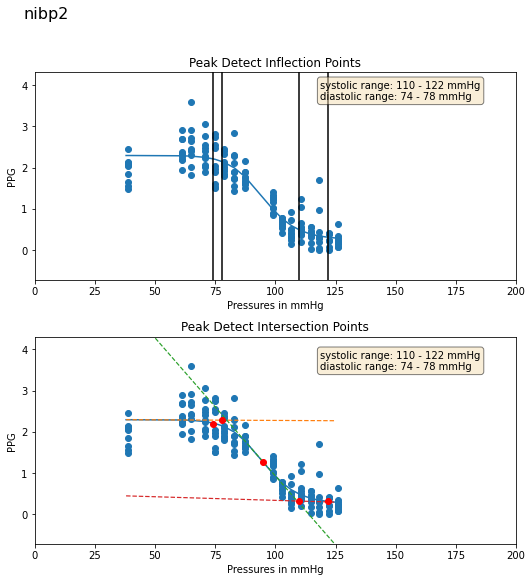

In [10]:
patients=[]
lsys=[]
na=[]
d1=[]
d2=[]
d0=[]
d02=[]
d08=[]
d015=[]
d3=[]
d4=[]
d5=[]
d6=[]
d7=[]
d8=[]
d9=[]
d10=[]
d11=[]
d12=[]
d13=[]
d14=[]
d15=[]
d16=[]
d17=[]
d18=[]
d19=[]
d20=[]
d21=[]
d22=[]
folder = '/content/drive/MyDrive/sphygmo/sphygmo/from04/'
# for patient in [x for x in os.listdir(folder)if x.find('P')!=-1]:
for patient in ['220411AP']:
  nibp = NIBPProcessor(folder+patient+'/nibp2.txt')
  nibp.save_peak_locations()
  nibp.detect_plateaus()
  print(f'{patient}:')
  ita1, sys1 = nibp.compute_ita()
  # print(f'{patient}: {sys1}')
  patients.append(patient)
  lsys.append(sys1)
  nibp.fitting(folder+patient+'/nibp2.txt',patient)

rangedf = pd.DataFrame()  
dia_fin = pd.DataFrame()  
dia_fin['patient']=na
dia_fin['d1']=d1
dia_fin['d2']=d2
dia_fin['d0']=d0
dia_fin['d02']=d02
dia_fin['d08']=d08
dia_fin['d015']=d015
dia_fin['d3']=d3
dia_fin['d4']=d4
dia_fin['d5']=d5
dia_fin['d6']=d6
dia_fin['d7']=d7
dia_fin['d8']=d8
dia_fin['d9']=d9
dia_fin['d10']=d10
dia_fin['d11']=d11
dia_fin['d12']=d12
dia_fin['d13']=d13
dia_fin['d14']=d14
dia_fin['d15']=d15
dia_fin['d16']=d16
dia_fin['d17']=d17
dia_fin['d18']=d18
dia_fin['d19']=d19
dia_fin['d20']=d20
dia_fin['d21']=d21
# dia_fin['d22updated']=d22
save_df(dia_fin, 'diastolica.csv')
# rangedf['Low_sys']=lsys


In [ ]:
d5

[83.0104751586914]

220411BP:
220411BP
           ppi      aucr   aucrmed      corl      ampr   amponly   auconly  \
0    29.200804  1.747034  1.692611  0.989187  1.792880  0.009065  0.517694   
1    35.312855  1.919481  1.800910  0.990473  2.072348  0.007599  0.451476   
2    41.180954  2.280118  2.207556  0.989534  2.366974  0.007373  0.410230   
3    48.136738  1.627670  1.510459  0.979022  1.928722  0.008718  0.510266   
4    54.272999  1.361208  1.374899  0.990262  1.436278  0.010815  0.639641   
5    60.101315  1.575155  1.580860  0.993473  1.668605  0.008730  0.510250   
6    67.263260  1.980284  2.129125  0.968057  2.091664  0.007639  0.446632   
7    73.167091  1.223141  1.217850  0.939130  1.252847  0.008745  0.518236   
8    79.090744  1.123172  1.112038  0.766618  0.834291  0.005299  0.436909   
9    85.834892  1.238260  1.358539  0.449519  0.924412  0.010734  0.796962   
10   91.976639  0.579778  0.541786  0.061499  0.405025  0.004051  0.336099   
11   98.756119  0.176394  0.034161 -0.079131 

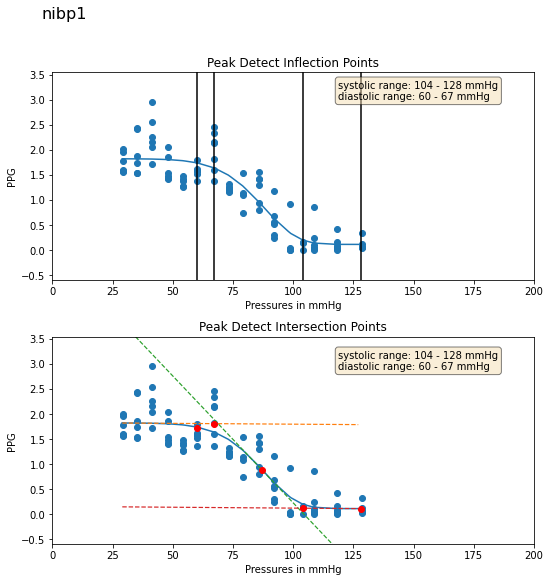

In [ ]:
patients=[]
lsys=[]
na=[]
d1=[]
d2=[]
d0=[]
d02=[]
d08=[]
d015=[]
d3=[]
d4=[]
d5=[]
d6=[]
d7=[]
d8=[]
d9=[]
d10=[]
d11=[]
d12=[]
d13=[]
d14=[]
d15=[]
d16=[]
d17=[]
d18=[]
d19=[]
d20=[]
d21=[]
d22=[]
folder = '/content/drive/MyDrive/sphygmo/sphygmo/from04/'
# for patient in [x for x in os.listdir(folder)if x.find('P')!=-1]:
for patient in ['220411BP']:
  nibp = NIBPProcessor(folder+patient+'/nibp1.txt')
  nibp.save_peak_locations()
  nibp.detect_plateaus()
  print(f'{patient}:')
  ita1, sys1 = nibp.compute_ita()
  # print(f'{patient}: {sys1}')
  patients.append(patient)
  lsys.append(sys1)
  nibp.fitting(folder+patient+'/nibp1.txt',patient)

rangedf = pd.DataFrame()  
dia_fin = pd.DataFrame()  
dia_fin['patient']=na
dia_fin['d1']=d1
dia_fin['d2']=d2
dia_fin['d0']=d0
dia_fin['d02']=d02
dia_fin['d08']=d08
dia_fin['d015']=d015
dia_fin['d3']=d3
dia_fin['d4']=d4
dia_fin['d5']=d5
dia_fin['d6']=d6
dia_fin['d7']=d7
dia_fin['d8']=d8
dia_fin['d9']=d9
dia_fin['d10']=d10
dia_fin['d11']=d11
dia_fin['d12']=d12
dia_fin['d13']=d13
dia_fin['d14']=d14
dia_fin['d15']=d15
dia_fin['d16']=d16
dia_fin['d17']=d17
dia_fin['d18']=d18
dia_fin['d19']=d19
dia_fin['d20']=d20
dia_fin['d21']=d21
# dia_fin['d22updated']=d22
save_df(dia_fin, 'diastolica2.csv')
# rangedf['Low_sys']=lsys


In [ ]:
d5

[67.26325988769531]

In [ ]:
d9

[103.46646881103516]

For the purpose of 5Pl fit only, using zscore<2 

In [ ]:
class NIBPProcessor(object):
 
  def __init__(self, filepath=''):
    time, ch1, ch2, ch3= np.loadtxt(filepath, dtype=('f4, f4, f4, f4'),unpack=True,delimiter = '\t')
    ip = pd.DataFrame()
    ip['time'] = time
    ip['ref_ppg'] = ch2 + 4
    ip['occ_ppg'] = ch3 + 4
    ip['pressure'] = ch1
    self.ip = ip
    self.op=0
    self.op_new=0
    self.op_new1=0
    self.op_new2=0


  
  
  def save_peak_locations(self):
    self.ip['ref_peaks'],ref_wid, inxref,inx1ref = peak_and_valley_detect(self.ip['ref_ppg'])
    self.ip['occ_peaks'],occ_wid, inxocc, inx1occ = peak_and_valley_detect(self.ip['occ_ppg'], prominence=0.00005)

    self.ip['std']= self.ip['occ_ppg'].rolling(2000).std()
    self.ip['stdr']= self.ip['ref_ppg'].rolling(2000).std()
    self.ip['occ1d'] = np.gradient(self.ip['occ_ppg'].values,100)
    self.ip['occ1d_peaks'] = peak_detect(self.ip['occ1d'])
    self.ip['ref1d'] = np.gradient(self.ip['ref_ppg'].values)
    self.ip['ref1d_peaks'] = peak_detect(self.ip['ref1d'])

  def detect_plateaus(self):
    plateau_width = 3000
    # Making a list of plateaus
    hts = np.linspace(0.0001, 1, 100)
    peaks, _ = find_peaks(self.ip['pressure'], width=plateau_width)

    plateaus = []
    for peak in peaks:
      for ht in hts:
        width, height, left, right = peak_widths(self.ip['pressure'], np.array([peak]), rel_height=ht)
        if width > plateau_width:
          break
      plateaus.append(self.ip.loc[left[0]:right[0]])
    # Finding mean pressure for each plateau
    mean_pressures = []
    mean_occppg=[]
    mean_refppg=[]
    for plateau in plateaus:
      # plateau.drop(plateau.head(1000).index, inplace=True) 
      # plateau.drop(plateau.tail(500).index, inplace=True)
      mean_pressures.extend([plateau['pressure'].mean()] * len(plateau))
      mean_occppg.extend([plateau[plateau['occ_peaks']>0]['occ_peaks'].median()] * len(plateau))
      mean_refppg.extend([plateau[plateau['ref_peaks']>0]['ref_peaks'].median()] * len(plateau))

    self.ip = pd.concat(plateaus)
    self.ip['mean_pressure'] = mean_pressures
    self.ip['mean_occppg'] = mean_occppg
    self.ip['mean_refppg'] = mean_refppg
    self.ip = self.ip[np.invert(self.ip.index.duplicated())]
    return plateaus
  


  def separate_into_cycles(self, ppg='ref', separate_by_peak=True):
    detected_plateaus = self.ip['mean_pressure'].reindex(self.ip.index, fill_value=0).values

    # Making a list of occ ppg cycles
    cycles = []
    peaks = (self.ip[self.ip[f'{ppg}_peaks'] > 0].index).tolist()
    valleys = (self.ip[self.ip[f'{ppg}_peaks'] < 0].index).tolist()

    separator = peaks if separate_by_peak else valleys
    not_separator = valleys if separate_by_peak else peaks
    for i in range(1, len(separator)):
      # if (not_separator[i]>separator[i-1])&(not_separator[i]<separator[i]):
      cycles.append(self.ip.loc[separator[i - 1]:separator[i]])
    # to check if there are cycles with no valleys in between in ref arm, such cycles are ignored.
    cycles = [cycle for cycle in cycles if len(np.where((not_separator>cycle.index[0])&(not_separator<cycle.index[-1]))[0]) != 0]
    begin = self.ip.loc[:separator[0]]
    return cycles



  def separate_into_occcycles(self):
    detected_plateaus = self.ip['mean_pressure'].reindex(self.ip.index, fill_value=0).values

    # Making a list of occ ppg cycles
    cycles = []
    peaks = (self.ip[self.ip['occ_peaks'] > 0].index).tolist()
    for i in range(1, len(peaks)):
      cycles.append(self.ip.loc[peaks[i - 1]:peaks[i]])
    # to check if there are cycles with no valleys in between in ref arm, such cycles are ignored.
    cycles = [cycle for cycle in cycles if len(cycle[(cycle['occ_peaks'] < 0)]) != 0]
    begin = self.ip.loc[:peaks[0]]
    return cycles
    
  

  def separate_into_refcycles(self):

    detected_plateaus = self.ip['mean_pressure'].reindex(self.ip.index, fill_value=0).values

    # Making a list of ref ppg cycles
    cycles = []
    valleys = (self.ip[self.ip['ref_peaks'] < 0].index).tolist()
    for i in range(1, len(valleys)):
      cycles.append(self.ip.loc[valleys[i - 1]:valleys[i]])
    # to check if there are cycles with no peaks in between in ref arm, such cycles are ignored.
    cycles = [cycle for cycle in cycles if len(cycle[(cycle['ref_peaks'] > 0)]) != 0]
    begin = self.ip.loc[:valleys[0]]
    return cycles

    

  def compute_ita(self):
    ita=[]
    cycle_pressure=[]
    cycles = self.separate_into_occcycles()
    for i,cycle in enumerate(cycles):
      if (cycle ['mean_pressure'].values[0] == cycle['mean_pressure'].values).all():
        tt1=cycle[cycle['occ_peaks']>0]['time'].values[0]
        pp1=cycle[cycle['occ_peaks']>0]['occ_peaks'].values[0]

        tt2=cycle[cycle['occ_peaks']<0]['time'].values[0]
        pp2=cycle[cycle['occ_peaks']<0]['occ_peaks'].values[0]

        tt3=cycle[cycle['occ_peaks']>0]['time'].values[-1]
        pp3=cycle[cycle['occ_peaks']>0]['occ_peaks'].values[-1]

        cycle_pressure.append(cycle['mean_pressure'].values[0])

        tt4=tt2-tt1
        tt5=tt3-tt2
        ita_cycle=(0.5*( (pp1*tt5) + (pp3*tt4)))
        ita.append(ita_cycle)

    itapd = pd.DataFrame()
    itapd['ita']=ita
    itapd['pressure']=cycle_pressure
    threshold = itapd['ita'].max()/50

    if len(itapd[itapd['ita']<threshold])!=0:
      first_zero = itapd[itapd['ita']<threshold]['pressure'].min()
    else:
      first_zero = itapd[itapd['ita']==(itapd['ita'].min())]['pressure'].min()
    return itapd, first_zero

  def fit_sigmoid(self, data, x, y):
    (a, b, c, d, e), _ = curve_fit(sigmoid_5pl, data[x], data[y], maxfev=5000)
    
    data['fit'] = sigmoid_5pl(data[x], a, b, c, d, e)
    # save_df(self.op, '_profile_pd.csv')

    fit = pd.DataFrame()
    fit['x'] = list(range(int(data[x].min()), int(data[x].max())))
    fit['y'] = np.interp(fit['x'], data[x], data['fit'])
    order = (fit['x'].max() - fit['x'].min()) / 10
    fit['d1'] = np.gradient(gaussian_filter1d(fit['y'], order))
    fit['d2'] = np.gradient(fit['d1'])
    return fit

  def fitting(self,input_file='', name=''):
    amplitude = []
    cycle_pressure = []
    plateau_pressure = []
    ref_amplitude = []
    # na=[]
    na.append(name)
    print(name)

    stdev = []
    auc = []
    occ1d = []
    delay = []
    ref_auc = []
    vol = []
    ref_vol = []
    full_auc = []
    corr=[]
    auc_r=[]
    list_pres=[]
    list_ratio=[]
    list_cor=[]
    list_amp=[]
    list_amponly=[]
    list_auconly=[]
    cycles = self.separate_into_refcycles()
    # added 24th
    diast=0
    upd=0
    upd1=0
    diamax=0
    diafinal=0
    auci=0
    refi=0
    ai=0
    for i in range(len(cycles)):
      if (cycles[i]['mean_pressure'].values[0] == cycles[i]['mean_pressure'].values).all():
        stdev.append(cycles[i]['std'].values[0])
        c,v=scipy.stats.pearsonr(cycles[i]['ref_ppg'], cycles[i]['occ_ppg'])
        corr.append (c )
        ref_amplitude.append(
          cycles[i][(cycles[i]['ref_peaks'] >0)]['ref_peaks'].values[0])
        ri=(cycles[i][(cycles[i]['ref_peaks'] >0)]['ref_peaks'].values[0])
        plateau_pressure.append(cycles[i]['mean_pressure'].values[0])
        ppi=(cycles[i]['mean_pressure'].values[0])
        cycle_pressure.append(cycles[i]['pressure'].mean())
        max = cycles[i]['occ_ppg'].values.max()
        maxref = cycles[i]['ref_ppg'].values.max()
        min = cycles[i]['occ_ppg'].values.min()
        minref = cycles[i]['ref_ppg'].values.min()
        delay_samples = abs(cycles[i][cycles[i]['ref_ppg']==maxref].index[0] - cycles[i][cycles[i]['occ_ppg']==max].index[0])
        # dich_inx = cycles[i][cycles[i]['ref1d_peaks']>0].index[-1]+delay_samples
        ref_inx = np.sort(np.array([cycles[i][cycles[i]['ref_ppg']==maxref].index[0],cycles[i][cycles[i]['ref_ppg']==minref].index[0]]))
        occ_inx = np.sort(np.array([cycles[i][cycles[i]['occ_ppg']==max].index[0],cycles[i][cycles[i]['occ_ppg']==min].index[0]]))
        # amplitude.append(max - cycles[i]['occ_ppg'].min())
        # ai=(max - cycles[i]['occ_ppg'].max())
        delay.append(delay_samples)
        occ1d.append(cycles[i]['occ1d'].max())
        auc.append((cycles[i].loc[:cycles[i][cycles[i]['occ_ppg']==max].index[0]]['occ_ppg'].values - cycles[i]['occ_ppg'].min()).sum())
        auci=((cycles[i].loc[:cycles[i][cycles[i]['occ_ppg']==max].index[0]]['occ_ppg'].values - cycles[i]['occ_ppg'].min()).sum())

        full_auc.append((cycles[i]['occ_ppg'].values - cycles[i]['occ_ppg'].min()).sum())
        ref_auc.append((cycles[i].loc[:cycles[i][cycles[i]['ref_ppg']==maxref].index[0]]['ref_ppg'].values - cycles[i]['ref_ppg'].min()).sum())
        refi=((cycles[i].loc[:cycles[i][cycles[i]['ref_ppg']==maxref].index[0]]['ref_ppg'].values - cycles[i]['ref_ppg'].min()).sum())
        vol.append((cycles[i].loc[occ_inx[0]:occ_inx[1]]['occ_ppg'].values - min).sum())
        ref_vol.append((cycles[i].loc[ref_inx[0]:ref_inx[1]]['ref_ppg'].values - minref).sum())




        if len(cycles[i][(cycles[i]['occ_peaks'] >0)]) != 0:
          ai=cycles[i][(cycles[i]['occ_peaks'] >0)]['occ_peaks'].values[0]
          amplitude.append(
            cycles[i][(cycles[i]['occ_peaks'] >0)]['occ_peaks'].values[0])
        else:
          ai=0
          amplitude.append(0)

        auc_r=(np.divide(auci,refi))
        amp_r=(np.divide(ai,ri))

        # if(c>=0):
        # print(ppi, auc_r)
        list_pres.append(ppi)
        list_ratio.append(auc_r)
        list_amp.append(amp_r)
        list_cor.append(c)
        list_amponly.append(ai)
        list_auconly.append(auci)

    


    # Putting the output variables in anot
    op = pd.DataFrame()
    op['plateau_pressure'] = plateau_pressure
    op['amplitude'] = amplitude
    op['cycle_pressure'] = cycle_pressure
    op['ref_amplitude'] = ref_amplitude
    op['ratio'] = np.divide(np.array(amplitude), np.array(ref_amplitude))


    op['stdev'] = stdev
    op['auc'] = auc
    op['occ1d'] = occ1d
    op['delay'] = delay
    op['ref_auc'] = ref_auc
    op['vol'] = vol
    op['ref_vol'] = ref_vol
    op['full_auc'] = full_auc
    op['occ_radius'] = np.sqrt(np.divide(op['auc'].values, np.ones(len(op))*np.pi))
    op['ref_radius'] = np.sqrt(np.divide(op['ref_auc'].values, np.ones(len(op))*np.pi))
    op['auc_ratio'] = np.divide(op['auc'].values, op['ref_auc'])
    op['corr']=corr

    op_new = pd.DataFrame()
    op_new['ppi']= list_pres
    op_new['aucr']=list_ratio
    op_new['ampr']=list_amp
    op_new['corl']=list_cor
    op_new['amponly']=list_amponly
    op_new['auconly']=list_auconly
    op_new = op_new[(np.abs(stats.zscore(op_new)) < 2).all(axis=1)]
    op_new = op_new.sort_values('ppi')
    self.op_new=op_new

    op_new1=pd.DataFrame()
    

    op_new2=pd.DataFrame()
    

    # Removing outliers (helps fitting)
    op = op[(np.abs(stats.zscore(op)) <2).all(axis=1)]
    op = op.sort_values('plateau_pressure')
    self.op=op

    threshold = np.max(op_new.groupby('ppi').mean()['aucr'].values)
    threshold4 = np.max(op_new.groupby('ppi').median()['aucr'].values)
    threshold1 = np.max(op_new.groupby('ppi').mean()['ampr'].values)
    threshold2 = np.max(op_new.groupby('ppi').mean()['amponly'].values)
    threshold3 = np.max(op_new.groupby('ppi').mean()['auconly'].values)

    # threshold = np.max(op.groupby('plateau_pressure').mean()['auc_ratio'].values)
    # threshold1 = np.max(op.groupby('plateau_pressure').mean()['ratio'].values)
    # threshold2 = np.max(op.groupby('plateau_pressure').mean()['amplitude'].values)
    # threshold3 = np.max(op.groupby('plateau_pressure').mean()['auc'].values)
    # bins = 4
    # threshold= np.quantile(op['corr'],(bins-1)/bins)
    # sys=op[op['corr']==np.min(op['corr'])]['plateau_pressure'].min()
    # dia1= op[op['plateau_pressure']<sys][op['corr']>=threshold]['plateau_pressure'].max()
    # dia2= op[op['plateau_pressure']>dia1]['plateau_pressure'].values[0]
    n=pd.DataFrame()
    pr=[]
    co=[]
    ampi=[]
    cori=[]
    ari=[]
    amponlyi=[]
    auconlyi=[]
    cormin=[]
    arimed=[]

    n['P']=np.unique(nibp.op['plateau_pressure'].values)
    pr=np.unique(nibp.op['plateau_pressure'])
    # n['corr']=nibp.op.groupby('plateau_pressure').max()['corr'].values
    n['corr']=nibp.op.groupby('plateau_pressure').mean()['corr'].values
    # co=nibp.op.groupby('plateau_pressure').max()['corr']
    co=nibp.op.groupby('plateau_pressure').mean()['auc_ratio']
    co2=nibp.op.groupby('plateau_pressure').min()['auc_ratio']
    co3=nibp.op.groupby('plateau_pressure').max()['auc_ratio']
    co4=nibp.op.groupby('plateau_pressure').median()['auc_ratio']
    de=nibp.op.groupby('plateau_pressure').min()['delay']
    de1=nibp.op.groupby('plateau_pressure').max()['delay']
    de2=nibp.op.groupby('plateau_pressure').mean()['delay']
    de3=nibp.op.groupby('plateau_pressure').median()['delay']
    ard=list(zip(pr,de))
    ard1=list(zip(pr,de1))
    ard2=list(zip(pr,de2))
    ard3=list(zip(pr,de3))
    ar=list(zip(pr,co))
    ar2=list(zip(pr,co2))
    ar3=list(zip(pr,co3))
    ar4=list(zip(pr,co4))
    pr=[]
    
    prppi=np.unique(op_new['ppi'])
    try:
      ari=nibp.op_new.groupby('ppi').mean()['aucr'].values
      arimed=nibp.op_new.groupby('ppi').median()['aucr'].values
      cori=nibp.op_new.groupby('ppi').mean()['corl'].values
      cormin=nibp.op_new.groupby('ppi').min()['corl'].values
      ampi=nibp.op_new.groupby('ppi').mean()['ampr'].values
      amponlyi=nibp.op_new.groupby('ppi').mean()['amponly'].values
      auconlyi=nibp.op_new.groupby('ppi').mean()['auconly'].values
    except:
      ari=[]
      cori=[]
      ampi=[]
      amponlyi=[]
      auconlyi=[]
      cormin=[]
      arimed=[]
    
    op_new1['ppi']= prppi
    op_new1['aucr']=ari
    op_new1['aucrmed']=arimed
    op_new1['corl']=cori
    op_new1['ampr']=ampi
    op_new1['amponly']=amponlyi
    op_new1['auconly']=auconlyi
    op_new1['cormin']=cormin
    self.op_new1=op_new1
    print(op_new1)
    print(op_new)
    
    # d1=[]
    # d2=[]
    # d3=[]
    # d4=[]
    # d5=[]
    # d6=[]
    # d7=[]
    # d8=[]
    # d9=[]
    # d10=[]
    # d11=[]
    # d12=[]
    # d13=[]
    # d14=[]
    # d15=[]
    # d16=[]
    # d17=[]
    # d18=[]
    # d19=[]
    # d20=[]
    # d21=[]
    # d22=[]

    try:

      print("--------threshold----------")
      print(threshold)
      print(threshold*0.9)
      print('\n')
      diast1=op_new1[op_new1['corl']>=0.89]['ppi'].max()
      diast2=op_new1[op_new1['cormin']>=0.89]['ppi'].max()
      print("-----based on corr>0.89-----")
      d1.append(diast1)
      # d0.append(diast2)
      
      print(diast1)
      # op_new2['patient']=na
      # op_new2['d1']=d1
      print('\n')
      print("-----based on auc ratio-----")
      d2.append(op_new1[op_new1['aucr']>=threshold*0.7]['ppi'].max())
      
      # op_new2['d2']=d2
      print(threshold*0.7)
      print('\n')
      print("-----based on amp ratio-----")
      d3.append(op_new1[op_new1['ampr']>=threshold1*0.7]['ppi'].max())
      # op_new2['d3']=d3
      print(threshold1*0.7)
      print('\n')
      print("-----based on amponly -----")
      d4.append(op_new1[op_new1['amponly']>=threshold2*0.7]['ppi'].max())
      # op_new2['d4']=d4
      print(threshold2*0.7)
      print('\n')
      print("-----based on amp ratio and corr-----")

      # used auc accepted
      d5.append(op_new1[(op_new1['aucr']>=threshold*0.75) & (op_new1['corl']>=0.8)]['ppi'].max())


      # op_new2['d5']=d5
      print(op_new1[(op_new1['ampr']>=threshold1*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      print('\n')
      print("-----based on auc ratio and corr-----")

      d6.append(op_new1[(op_new1['aucr']>=threshold*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())

      print(op_new1[(op_new1['aucr']>=threshold*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d6']=d6
      print('\n')
      print("-----based on amp and corr-----")
      d7.append(op_new1[(op_new1['amponly']>=threshold2*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      print(op_new1[(op_new1['amponly']>=threshold2*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      print(threshold2*0.7)
      print(op_new1[(op_new1['amponly']>=threshold2*0.7)]['ppi'].max())
      print(op_new1[ (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d7']=d7
      print('\n')


      print('\n')
      print("--------NEW PARAMS I----------")
      print("---threshold----")
      print(threshold)
      print(threshold*0.9)
      print('\n')
      diast=op_new1[op_new1['corl']>=0.95]['ppi'].max()
      print("-----based on corr>0.95-----")
      d8.append(diast)
      d08.append(op_new1[op_new1['cormin']>=0.95]['ppi'].max())
      print(diast)
      op_new2['d8']=d8
      print('\n')
      print("-----based on auc ratio- ACCEPTED-----")


      d9.append(op_new1[op_new1['aucr']>=threshold*0.75]['ppi'].max())


      d02.append(op_new1[op_new1['auconly']>=threshold3*0.75]['ppi'].max())
      # op_new2['d9']=d9
      print(threshold*0.75)
      print('\n')
      print("-----based on amp ratio-----")
      d10.append(op_new1[op_new1['ampr']>=threshold1*0.75]['ppi'].max())
      # op_new2['d10']=d10
      print(threshold1*0.75)
      print('\n')
      print("-----based on amponly -----")
      d11.append(op_new1[op_new1['amponly']>=threshold2*0.75]['ppi'].max())
      # op_new2['d11']=d11
      print(threshold2*0.75)
      print('\n')
      print("-----based on amp ratio and corr-----")
      d12.append(op_new1[(op_new1['ampr']>=threshold1*0.75) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d12']=d12
      print('\n')
      print("-----based on auc ratio 0.75 and corr 0.8 -ACCEPTED-----")

      d13.append(op_new1[(op_new1['aucr']>=threshold*0.75) & (op_new1['corl']>=0.8)]['ppi'].max())


      # op_new2['d13']=d13
      print('\n')
      print("-----based on amp and corr-----")
      d14.append(op_new1[(op_new1['amponly']>=threshold2*0.75) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d14']=d14
      print('\n')

      print('\n')
      print("--------NEW PARAMS II----------")
      print("--------threshold----------")
      print(threshold)
      print(threshold*0.9)
      print('\n')
      diast=op_new1[op_new1['corl']>=0.98]['ppi'].max()
      print("-----based on corr>0.98-----")
      d15.append(diast)
      d015.append(op_new1[op_new1['cormin']>=0.98]['ppi'].max())
      # op_new2['d15']=d15
      print('\n')
      print("-----based on auc ratio-----")
      d16.append(op_new1[op_new1['aucr']>=threshold*0.68]['ppi'].max())
      # op_new2['d16']=d16
      print(threshold*0.68)
      print('\n')
      print("-----based on amp ratio-----")
      d17.append(op_new1[op_new1['ampr']>=threshold1*0.68]['ppi'].max())
      # op_new2['d17']=17
      print(threshold1*0.68)
      print('\n')
      print("-----based on amponly -----")
      d18.append(op_new1[op_new1['amponly']>=threshold2*0.68]['ppi'].max())
      # op_new2['d18']=d18
      print(threshold2*0.68)
      print('\n')
      print("-----based on amp ratio and corr-----")
      d19.append(op_new1[(op_new1['ampr']>=threshold1*0.68) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d19']=d19
      print('\n')
      print("-----based on auc ratio and corr-----")


      # belore portion is added for testing and found d5 to be the best

      # d20.append(op_new1[(op_new1['aucr']>=threshold*0.8) & (op_new1['corl']>=0.8)]['ppi'].max())
      # d3.append(op_new1[(op_new1['aucr']>=threshold*0.9) & (op_new1['corl']>=0.7)]['ppi'].max())
      # d4.append(op_new1[(op_new1['aucr']>=threshold*0.85) & (op_new1['corl']>=0.8)]['ppi'].max())

      #accepted:  d5.append(op_new1[(op_new1['aucr']>=threshold*0.75) & (op_new1['corl']>=0.8)]['ppi'].max())

      # d6.append(op_new1[(op_new1['aucr']>=threshold*0.82) & (op_new1['corl']>=0.85)]['ppi'].max())
      # d7.append(op_new1[(op_new1['aucr']>=threshold*0.78) & (op_new1['corl']>=0.7)]['ppi'].max())
      # d16.append(op_new1[(op_new1['aucrmed']>=threshold4*0.8) & (op_new1['corl']>=0.8)]['ppi'].max())
      # d17.append(op_new1[(op_new1['aucrmed']>=threshold4*0.9) & (op_new1['corl']>=0.7)]['ppi'].max())
      # d18.append(op_new1[(op_new1['aucrmed']>=threshold4*0.85) & (op_new1['corl']>=0.8)]['ppi'].max())
      # d19.append(op_new1[(op_new1['aucrmed']>=threshold4*0.75) & (op_new1['corl']>=0.8)]['ppi'].max())
      # d1.append(op_new1[(op_new1['aucrmed']>=threshold4*0.82) & (op_new1['corl']>=0.85)]['ppi'].max())
      # d0.append(op_new1[(op_new1['aucrmed']>=threshold4*0.82)]['ppi'].max())
      # d8.append(op_new1[(op_new1['aucr']>=threshold*0.75) & (op_new1['corl']>=0.89)]['ppi'].max())
       # belore portion is added for testing


      d20.append(op_new1[(op_new1['aucr']>=threshold*0.68) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d20']=d20
      print('\n')
      print("-----based on amp and corr-----")
      d21.append(op_new1[(op_new1['amponly']>=threshold2*0.68) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d21']=d21
      print('\n')


    except:
      print("except for this patient")



    # for i in range (1,len(ar)):
    #   pr.append((ar[i][0], ar[i][1]-ar[i-1][1]))
    # n1=[i for i, j in pr]
    # n2=[j for i, j in pr]
    # da=pd.DataFrame()
    # da['pres']=n1
    # n2=[x * 100 for x in n2]
    # da['cor']=n2
    # dia1=da[abs(da['cor'])>5]['pres'].values[0]
    # dia2=da[(da['pres'])<dia1]['pres'].values[-1]
    # print(dia1,dia2)
    # [print(x) for x in ar]
    # print("-------*mean")
    # print('\n')
    # [print(x) for x in ar2]
    # # scatter(n['P'],n['corr'])
    # print("-------**min")
    # [print(x) for x in ar3]
    # # [print(x) for x in pr]
    # print("-------***max")
    # [print(x) for x in ar4]
    # [print(x) for x in pr]
    # print("-------***median")
    # [print(x) for x in ard]
    # print("-------****min")
    # [print(x) for x in ard1]
    # print("-------****max")
    # [print(x) for x in ard2]
    # print("-------****mean")
    # [print(x) for x in ard3]
    # print("-------****meadian")
    # print (diast)
    # print("updated dia:")






    try:
      (a, b, c, d, e), _ = curve_fit(sigmoid_5pl, self.op['plateau_pressure'], self.op['auc_ratio'], maxfev=5000)
      print("5tttttttttttttttttttttttttt5555555tt5")
    except:
      w = plt.scatter(self.op['plateau_pressure'], self.op['auc_ratio'])
      plt.subplots_adjust(bottom=0.3)
      plt.gcf().text(0.05, 1.05, input_file.split('/')[-1].split('.')[0], fontsize=16)

      axes = plt.gca()
      num = (self.op['auc_ratio'].max()-self.op['auc_ratio'].min())/5
      axes.set_ylim([self.op['auc_ratio'].min()-num, self.op['auc_ratio'].max()+num])
      axes.set_xlim([0, 200])

      plt.xlabel('Pressures in mmHg');
      plt.ylabel('PPG');
      plt.title('Peak Detect: 5PL Sigmoid Fit Failed')
      plt.savefig(input_file[:-4]+'_pd.png')
      plt.tight_layout(h_pad=1)
      plt.show()
      print("5tttttttttttttttttttttttttttt5")
      return [np.nan, np.nan, np.nan, np.nan], [np.nan, np.nan, np.nan, np.nan]
    print("5tttt66666666666666666666666666tttttttttttttttttttttt5555555tt5")
    self.op['fit'] = sigmoid_5pl(self.op['plateau_pressure'], a, b, c, d, e)
    # save_df(self.op, '_profile_pd.csv')
    
    print("55")

    fit = pd.DataFrame()
    fit['x'] = list(range(int(self.op['plateau_pressure'].min()), int(self.op['plateau_pressure'].max())))
    fit['y'] = np.interp(fit['x'], self.op['plateau_pressure'], self.op['fit'])
    order = (fit['x'].max() - fit['x'].min()) / 10
    fit['d1'] = np.gradient(gaussian_filter1d(fit['y'], order))
    fit['d2'] = np.gradient(fit['d1'])
    # save_df(fit, '_slopes_pd.csv')

    temp = pd.DataFrame()
    temp['pressures'] = np.sort(list(set(op['plateau_pressure'])))
    temp['variances'] = [self.op[self.op['plateau_pressure'] == pressure]['auc_ratio'].var() for pressure in temp['pressures']]
    temp['median'] = [self.op[self.op['plateau_pressure'] == pressure]['auc_ratio'].median() for pressure in temp['pressures']]
    print("66")
    plt.figure(figsize=(7.5, 7.5))
    print("77")
    # Max and min of 2nd derivative
    up_dias = fit[fit['d2'] == fit['d2'].min()]['x'].values[0]
    low_sys = fit[fit['d2'] == fit['d2'].max()]['x'].values[0]
    print("88")
    # nearest cuff pressure value
    temp['up_dias_diff'] = abs(temp['pressures'].values-up_dias)
    temp['low_sys_diff'] = abs(temp['pressures'].values-low_sys)
    up_dias = int(temp[temp['up_dias_diff']==temp['up_dias_diff'].min()]['pressures'].values[0])
    low_sys = int(temp[temp['low_sys_diff']==temp['low_sys_diff'].min()]['pressures'].values[0])
    print("99")
    x = temp[temp['pressures'] < up_dias]
    try:
      # take last values with median below fit line before up_dias
      low_dias = int(x[x['median']<fit['y'].max()]['pressures'].values[-1])
    except:
      if len(x)==0:
        # there are no pressure values below up_dias
        low_dias = up_dias
      else:
        # in case of no median below fit, take the lowest point
        low_dias = int(x[x['median']==x['median'].min()]['pressures'].values[0])
    x = temp[(temp['pressures']- low_sys)>1]
    print("99999")
    try:
      up_sys = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])
    except:
      # there are no values greater than low_sys
      up_sys = low_sys

    infls = [low_dias, up_dias, low_sys, up_sys]
    upd1=up_dias
    # print(upd1)
    # print("f")
    plt.subplot(2, 1, 1)
    print("5445")
    w = plt.scatter(self.op['plateau_pressure'], self.op['auc_ratio'])
    plt.plot(fit['x'], fit['y'])
    for i, inf in enumerate(infls, 1):
      plt.axvline(x=inf, color='k', label=f'Inflection Point {i}')

    textstr = 'systolic range: ' + str(low_sys) + ' - ' + str(up_sys) + ' mmHg\ndiastolic range: ' + str(
      low_dias) + ' - ' + str(up_dias) + ' mmHg'
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    plt.gcf().text(0.6, 0.9, textstr, fontsize=10, bbox=props)

    axes = plt.gca()
    num = (self.op['auc_ratio'].max()-self.op['auc_ratio'].min())/5
    axes.set_ylim([self.op['auc_ratio'].min()-num, self.op['auc_ratio'].max()+num ])
    axes.set_xlim([0, 200])

    plt.xlabel('Pressures in mmHg');
    plt.ylabel('PPG');
    plt.title('Peak Detect Inflection Points')
    print("5    5")
    # Intersection of lines through max, min, infl of fit
    try:
      infl = [x for x in fit[np.sign(fit['d2']).diff() != 0]['x'].values if (x > up_dias) & (x < low_sys)][0]
    except:
      plt.subplot(2,1,2)
      w = plt.scatter(self.op['plateau_pressure'], self.op['auc_ratio'])
      plt.subplots_adjust(bottom=0.3)
      plt.gcf().text(0.05, 1.05, input_file.split('/')[-1].split('.')[0], fontsize=16)

      axes = plt.gca()
      num = (self.op['auc_ratio'].max()-self.op['auc_ratio'].min())/5
      axes.set_ylim([self.op['auc_ratio'].min()-num, self.op['auc_ratio'].max()+num ])
      axes.set_xlim([0, 200])

      plt.xlabel('Pressures in mmHg');
      plt.ylabel('PPG');
      plt.title('Peak Detect: Intersection Failed')    
      plt.tight_layout(h_pad=1)
      plt.savefig(input_file[:-4]+'_pd.png')
      plt.show()
      return infls, [np.nan, np.nan, np.nan, np.nan]
    print("5ffrf5")
    x1_high = fit['x'].min()
    y1_high = fit[fit['x'] == fit['x'].min()]['y'].values[0]
    # m_high = fit[fit['x'] == fit['x'].min()]['d1'].values[0]
    m_high= (fit[fit['x'] == fit['x'].min()+10]['y'].values[0] -y1_high)/10
    fit['line_high'] = (fit['x'] - x1_high) * m_high + y1_high

    # x1_infl = infl
    # y1_infl = fit[fit['x'] == infl]['y'].values[0]
    # m_infl = fit[fit['x'] == infl]['d1'].values[0]
    # fit['line_infl'] = (fit['x'] - x1_infl) * m_infl + y1_infl

    x1 = infl-5
    y1 = fit[fit['x'] == (infl-5)]['y'].values[0]
    # m = fit[fit['x'] == infl]['d1'].values[0]
    m=  (fit[fit['x'] == (infl+5)]['y'].values[0] - y1)/10
    # m= fit['d1'].min()
    # m = fit[fit.index==fit[fit['x']==infl].index[0]+10]['d1'].values[0]
    # print(m)
    fit['line_infl'] = (fit['x'] - x1) * m + y1

    x1_low = fit['x'].max()
    y1_low = fit[fit['x'] == fit['x'].max()]['y'].values[0]
    m_low = fit[fit['x'] == fit['x'].max()]['d1'].values[0]
    fit['line_low'] = (fit['x'] - x1_low) * m_low + y1_low

    plt.subplot(2, 1, 2)
    w = plt.scatter(self.op['plateau_pressure'], self.op['auc_ratio'])
    plt.plot(fit['x'], fit['y'])
    plt.plot(fit['x'], fit['line_high'], '--', linewidth=1.2)
    plt.plot(fit['x'], fit['line_infl'], '--', linewidth=1.2)
    plt.plot(fit['x'], fit['line_low'], '--', linewidth=1.2)

    plt.plot(infl, fit[fit['x'] == infl]['y'].values[0], 'ro')
    print("5tttttttt5")
    try:
      idx1 = np.argwhere(np.diff(np.sign(fit['line_high'] - fit['line_infl']))).flatten()[0]
    except:
      # there's no intersection
      idx1 = 0
    up_dias = fit['x'].values[idx1] 
    try:
      idx2 = np.argwhere(np.diff(np.sign(fit['line_infl'] - fit['line_low']))).flatten()[0]    
    except:
      # there's no intersection
      idx2 = -1
    low_sys = fit['x'].values[idx2]
    print("dewdew55")
    # take nearest cuff pressure value
    temp['up_dias_diff'] = abs(temp['pressures'].values-up_dias)
    temp['low_sys_diff'] = abs(temp['pressures'].values-low_sys)
    up_dias = int(temp[temp['up_dias_diff']==temp['up_dias_diff'].min()]['pressures'].values[0])
    low_sys = int(temp[temp['low_sys_diff']==temp['low_sys_diff'].min()]['pressures'].values[0])

    plt.plot(up_dias, fit['line_high'].values[idx1], 'ro')
    plt.plot(low_sys, fit['line_low'].values[idx2], 'ro')

    

    x = temp[temp['pressures'] < up_dias]
    try:
      # take last values with median below fit line before up_dias
      low_dias = int(x[x['median']<fit['y'].max()]['pressures'].values[-1])
    except:
      if len(x)==0:
        # there are no pressure values below up_dias
        low_dias = up_dias
      else:
        # in case of no median below fit, take the lowest point
        low_dias = int(x[x['median']==x['median'].min()]['pressures'].values[0])
    x = temp[(temp['pressures']-low_sys)>1]
    # added 24th
    print("5errrrrrr5")
    upd=up_dias
    diafinal=0
    print(",,,,,,,,")
    dialist=[]
    dialist2=[]
    # dialist.append(diast1) modifed for the purpose of getting the max of DBP from the fits but not including the pressure predicted based on the features.
    dialist.append(upd)
    dialist.append(upd1)
    # print(dialist)
    diamax= ((np.max(dialist)))
    print("=====")
    print(diamax)
    try:
      up_sys = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])
    except:
      # no values greater than low_sys
      up_sys = low_sys
    # added 24th
    if (diamax<up_sys):
      print("qqqqq")
      print(diamax)
      diafinal=diamax
    else:
      print("eeeee")
      dialist2.append(upd)
      dialist2.append(upd1)
      print(np.max(dialist2))
      diafinal=np.max(dialist2)
    # op_new2['d22updated']=diafinal
    d0.append(diafinal)
    # print(diafinal)
    self.op_new2=op_new2
    
    
    
    

    plt.plot(low_dias, fit[fit['x'] > low_dias]['y'].max(), 'ro')
    plt.plot(up_sys, fit[fit['x'] < up_sys]['y'].min(), 'ro')

    textstr = 'systolic range: ' + str(low_sys) + ' - ' + str(up_sys) + ' mmHg\ndiastolic range: ' + str(
      low_dias) + ' - ' + str(up_dias) + ' mmHg'
    plt.subplots_adjust(bottom=0.3)
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    plt.gcf().text(0.6, 0.4, textstr, fontsize=10, bbox=props)
    plt.gcf().text(0.05, 1.05, input_file.split('/')[-1].split('.')[0], fontsize=16)

    axes = plt.gca()
    num = (self.op['auc_ratio'].max()-self.op['auc_ratio'].min())/5
    axes.set_ylim([self.op['auc_ratio'].min()-num, self.op['auc_ratio'].max()+num ])
    axes.set_xlim([0, 200])

    plt.xlabel('Pressures in mmHg');
    plt.ylabel('PPG');
    plt.title('Peak Detect Intersection Points')  
    plt.tight_layout(h_pad=1)
    plt.savefig(input_file[:-4]+'_pd.png')
    plt.show()
    inters = [low_dias, up_dias, low_sys, up_sys]

    return infls, inters

      

210715BP:
210715BP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    28.962420  1.098651  1.099366  ...  0.013303  0.832211  0.995412
1    37.155746  1.024124  1.014836  ...  0.012528  0.797870  0.996949
2    44.964745  1.076563  1.071027  ...  0.013463  0.834740  0.993445
3    52.631668  1.058365  1.043081  ...  0.014635  0.942101  0.989443
4    60.902760  0.228589  0.200966  ...  0.003851  0.174496  0.542244
5    68.943466  0.305498  0.296493  ...  0.005100  0.245777  0.785114
6    77.916725  0.483135  0.461897  ...  0.006582  0.355527  0.773032
7    85.624329  0.506107  0.391702  ...  0.005494  0.404670 -0.074450
8    93.448898  0.342514  0.308270  ...  0.003941  0.252189  0.483927
9   101.227409  0.197345  0.172460  ...  0.001857  0.150565 -0.187890
10  108.745148  0.212022  0.151556  ...  0.001429  0.167425 -0.601098
11  117.586563  0.032509  0.033890  ...  0.000460  0.027015  0.142003
12  122.753326  0.148078  0.035951  ...  0.000321  0.044332 -0.391685
1

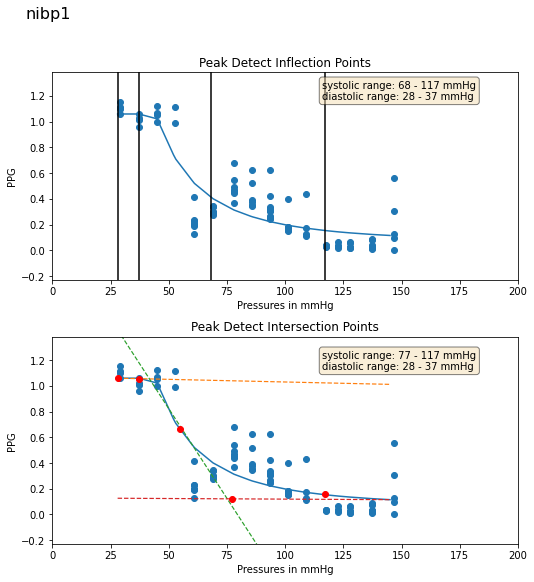

210715CP:
210715CP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    28.568144  0.419262  0.420075  ...  0.003528  0.178392  0.944685
1    36.413986  0.335038  0.339227  ...  0.003040  0.145113  0.938367
2    44.625572  0.359049  0.368796  ...  0.002888  0.157535  0.917826
3    52.209435  0.345340  0.316803  ...  0.003137  0.160760  0.966728
4    60.361156  0.311352  0.320407  ...  0.002842  0.147906  0.817431
5    68.435509  0.343877  0.329973  ...  0.002826  0.147481  0.918271
6    77.238029  0.299916  0.300418  ...  0.002645  0.141028  0.713680
7    84.746025  0.216140  0.188152  ...  0.001909  0.109940  0.693343
8    92.915260  0.126872  0.124284  ...  0.000832  0.060450 -0.551035
9   100.679482  0.086734  0.070270  ...  0.000455  0.040833 -0.696707
10  108.300423  0.057441  0.050978  ...  0.000271  0.026828 -0.570425
11  117.197800  0.042019  0.048009  ...  0.000219  0.020724 -0.679832
12  122.269768  0.029991  0.022138  ...  0.000198  0.015389 -0.564499
1

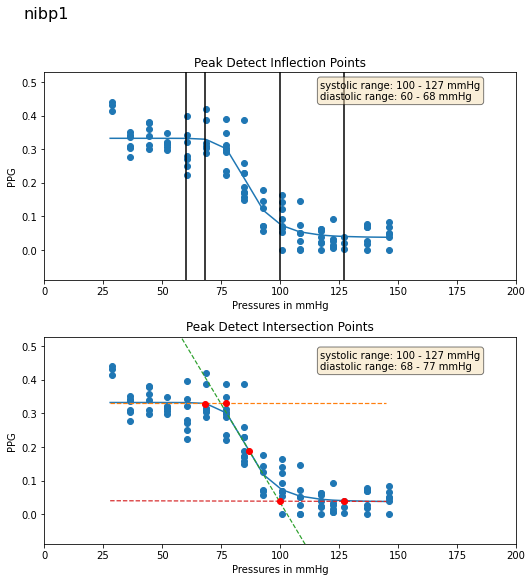

210715AP:
210715AP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    28.800945  0.789923  0.793515  ...  0.021117  1.095400  0.975955
1    36.813519  0.787680  0.794354  ...  0.021283  1.130112  0.988909
2    44.884468  0.738138  0.745243  ...  0.019227  0.987812  0.966050
3    52.613190  0.717817  0.711208  ...  0.021054  1.071399  0.961952
4    60.731991  0.716473  0.708128  ...  0.020419  1.070970  0.967900
5    68.774429  0.684928  0.674297  ...  0.017360  0.861117  0.926387
6    77.513885  0.487184  0.476177  ...  0.013075  0.668932  0.799042
7    85.251854  0.328412  0.338506  ...  0.009152  0.463356  0.780385
8    93.126297  0.149362  0.131156  ...  0.004172  0.220698  0.126046
9   100.947083  0.096939  0.099064  ...  0.002561  0.147533  0.246062
10  108.436264  0.050707  0.054783  ...  0.000682  0.079409 -0.532053
11  117.184265  0.009969  0.008458  ...  0.000179  0.015651 -0.452804
12  122.533211  0.015184  0.012732  ...  0.000198  0.023702 -0.541661
1

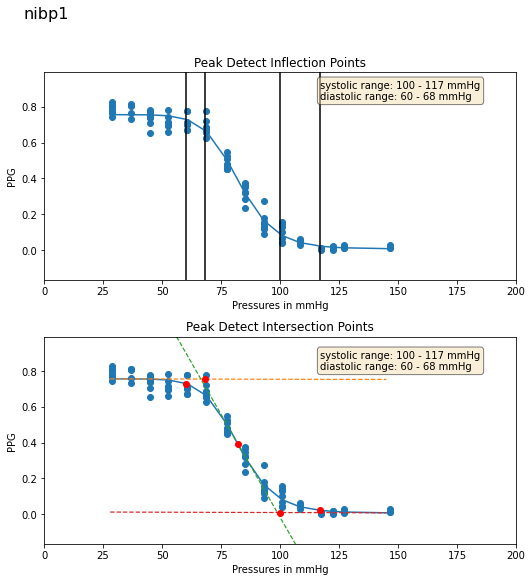

210716AP:
210716AP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    29.249004  0.957529  0.938451  ...  0.010789  0.526144  0.966212
1    38.111454  1.142861  1.176933  ...  0.016647  0.836497  0.983122
2    47.429790  1.063278  1.064460  ...  0.017717  0.872068  0.972613
3    56.369949  1.068439  1.072852  ...  0.017150  0.822615  0.982087
4    65.875870  1.209823  1.254659  ...  0.017527  0.846907  0.984731
5    74.469208  1.293853  1.285893  ...  0.013662  0.684643  0.961853
6    83.536232  1.163738  1.164787  ...  0.017089  0.804135  0.894062
7    92.540588  1.011836  1.018977  ...  0.016497  0.852125  0.910255
8   101.541046  0.727377  0.747900  ...  0.012591  0.622878  0.880368
9   109.765198  0.292879  0.279953  ...  0.004610  0.230676  0.787430
10  118.752640  0.280451  0.187834  ...  0.002941  0.147152  0.300705
11  128.507248  0.249391  0.242291  ...  0.002004  0.128179 -0.025449
12  133.382355  0.249984  0.255956  ...  0.003185  0.203949  0.028617
1

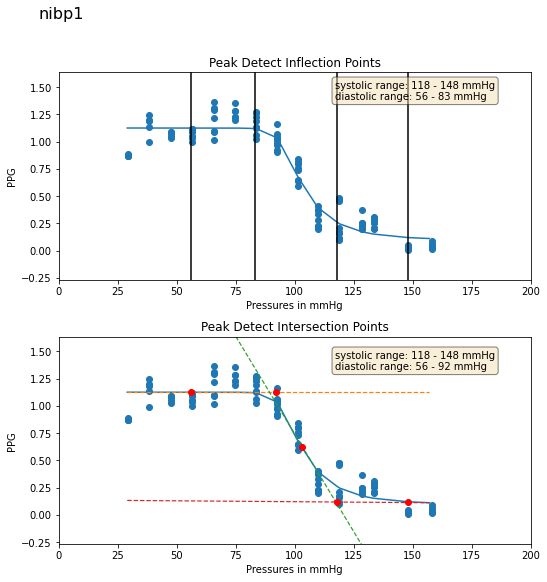

210717AP:
210717AP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    37.084393  1.982747  1.947182  ...  0.019380  1.098534  0.986711
1    44.972706  1.850522  1.845328  ...  0.020493  1.074098  0.938118
2    52.862488  2.014613  2.041206  ...  0.020149  1.125731  0.951749
3    60.912018  2.061458  2.037856  ...  0.020565  1.131789  0.972703
4    68.916870  2.034197  2.014851  ...  0.024846  1.323317  0.899485
5    77.918312  1.818414  1.814947  ...  0.022753  1.143029  0.745801
6    85.559921  1.061741  1.036426  ...  0.010871  0.528268  0.868713
7    93.453651  0.889775  0.889157  ...  0.010509  0.513716  0.713395
8   101.309639  0.209038  0.214767  ...  0.001906  0.092855  0.404379
9   108.858940  0.346849  0.342012  ...  0.003888  0.217128 -0.064032
10  117.860497  0.037853  0.043146  ...  0.000218  0.025511 -0.131567
11  123.023125  0.023208  0.023428  ...  0.000299  0.016472 -0.283943
12  127.837059  0.026666  0.030339  ...  0.000375  0.018183 -0.120490
1

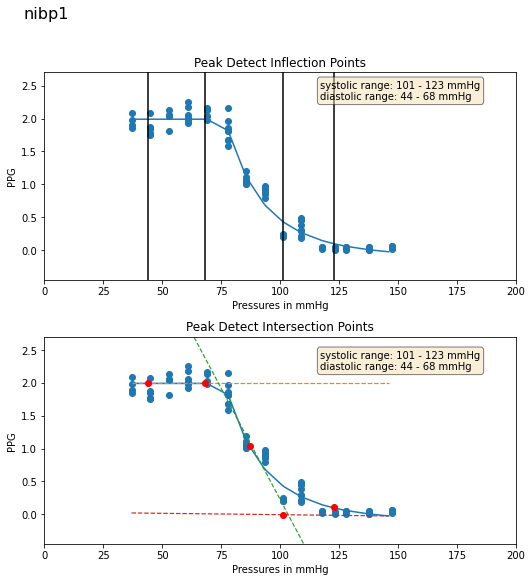

210719AP:
210719AP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    38.087433  1.126683  1.111534  ...  0.012414  0.788510  0.965720
1    46.719227  1.152240  1.205995  ...  0.004594  0.310577  0.953905
2    56.278481  1.179395  1.215318  ...  0.014750  1.018006  0.986599
3    64.877060  1.164687  1.229083  ...  0.007545  0.510689  0.958818
4    73.928467  1.243260  1.290534  ...  0.010826  0.700956  0.968817
5    82.618904  1.099520  1.084970  ...  0.011251  0.731666  0.963257
6    91.587082  1.029950  1.046852  ...  0.009262  0.561755  0.940498
7   100.463226  0.894678  0.869996  ...  0.009337  0.560456  0.902261
8   109.813629  0.825978  0.846228  ...  0.003646  0.192337  0.824182
9   118.220268  0.643680  0.633087  ...  0.005858  0.333064  0.672489
10  128.327072  0.355750  0.327335  ...  0.002573  0.208030 -0.169540
11  133.223969  0.437870  0.424381  ...  0.002336  0.234572 -0.142317
12  138.274002  0.415222  0.415794  ...  0.001753  0.180554 -0.163637
1

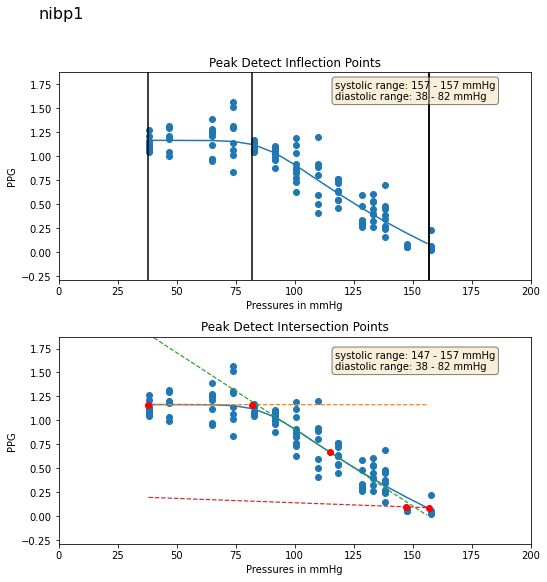

210719BP:
210719BP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    28.699224  0.949946  0.939290  ...  0.008276  0.433961  0.955859
1    37.829498  1.040832  1.034702  ...  0.007953  0.409837  0.933089
2    46.640472  0.776429  0.776826  ...  0.006242  0.327778  0.898886
3    55.946793  0.877050  0.861147  ...  0.010021  0.546128  0.936889
4    64.934067  0.834714  0.832539  ...  0.012065  0.616865  0.877269
5    73.596558  0.819892  0.837595  ...  0.011378  0.574732  0.819464
6    82.952354  0.610972  0.608069  ...  0.007477  0.404141  0.740522
7    91.504128  0.443536  0.397837  ...  0.006111  0.315523  0.697448
8   100.293472  0.410870  0.333386  ...  0.003795  0.274136  0.005664
9   109.076324  0.239908  0.239740  ...  0.002028  0.157089 -0.034417
10  117.853447  0.058454  0.068135  ...  0.000276  0.042404 -0.485329
11  127.791008  0.025742  0.019957  ...  0.000157  0.019528  0.058603
12  132.574005  0.031405  0.029871  ...  0.000211  0.023804 -0.533973
1

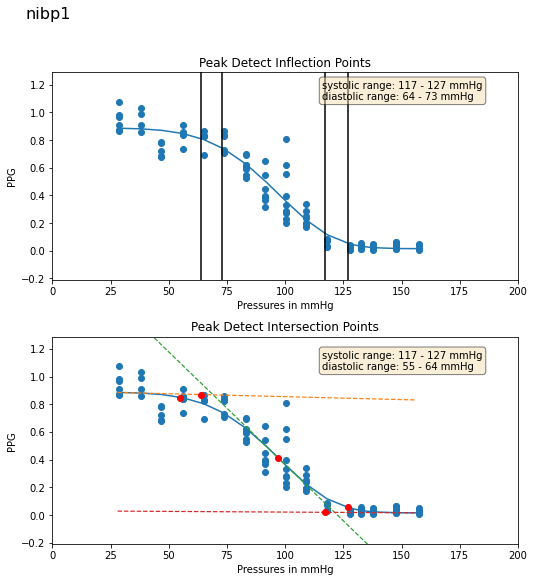

210720AP:
210720AP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    28.719282  0.784946  0.786119  ...  0.012913  0.648338  0.976286
1    37.430607  0.805225  0.816458  ...  0.012909  0.638304  0.828173
2    46.192207  0.832665  0.825348  ...  0.011905  0.612425  0.972871
3    55.490986  0.761362  0.763423  ...  0.013201  0.639661  0.953841
4    64.272102  0.817527  0.818203  ...  0.012745  0.640805  0.981792
5    73.114555  0.763508  0.764752  ...  0.013371  0.649568  0.980922
6    82.165840  0.689567  0.695608  ...  0.012795  0.594779  0.956944
7    90.842880  0.585857  0.592148  ...  0.009446  0.437823  0.878847
8    99.556633  0.299474  0.315455  ...  0.005646  0.264442  0.893043
9   108.333229  0.214194  0.222954  ...  0.002869  0.175385  0.261324
10  117.060104  0.114823  0.116078  ...  0.001588  0.092455 -0.264607
11  127.001991  0.020257  0.022345  ...  0.000142  0.015509 -0.378285
12  131.728119  0.020989  0.016671  ...  0.000198  0.017099 -0.452733
1

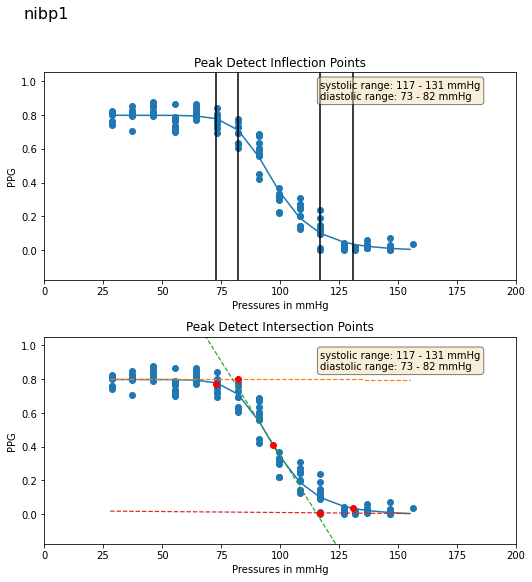

210720BP:
210720BP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    37.904819  0.695754  0.685517  ...  0.004182  0.250338  0.977413
1    46.713757  0.757952  0.758954  ...  0.005500  0.348818  0.961576
2    55.916584  0.740515  0.739521  ...  0.004024  0.255257  0.967672
3    65.206596  0.734126  0.727179  ...  0.004507  0.273815  0.903134
4    73.785110  0.619866  0.608596  ...  0.003722  0.208257  0.900653
5    82.666557  0.434572  0.418175  ...  0.002188  0.119762  0.795633
6    91.480988  0.232056  0.244762  ...  0.001817  0.100100  0.577766
7   100.267410  0.168798  0.163869  ...  0.000569  0.080128 -0.503471
8   108.962379  0.155286  0.156775  ...  0.000222  0.101329 -0.499696
9   118.038185  0.135299  0.066869  ...  0.000105  0.094216 -0.719075
10  127.995163  0.036414  0.036785  ...  0.000173  0.028274 -0.569963
11  132.774414  0.053175  0.027942  ...  0.000205  0.037602 -0.707789
12  138.117599  0.070043  0.063424  ...  0.000255  0.021903 -0.183722
1

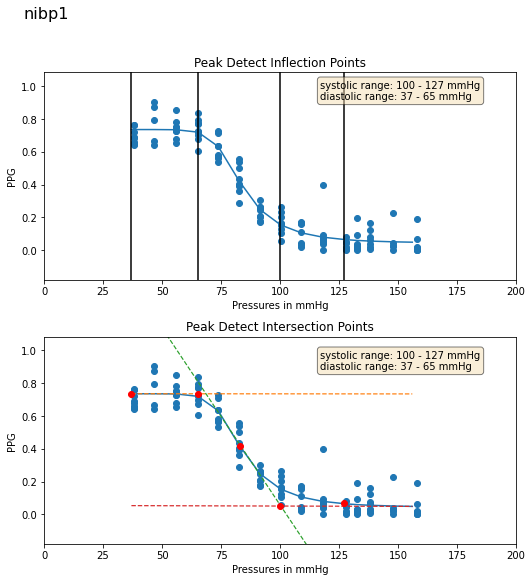

210723AP:
210723AP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    29.000048  0.521102  0.518592  ...  0.001925  0.118982  0.996214
1    38.857834  0.343487  0.345406  ...  0.003818  0.224941  0.946788
2    48.495609  0.316916  0.315662  ...  0.003712  0.216930  0.941048
3    58.863838  0.326650  0.323933  ...  0.003793  0.221237  0.967278
4    68.836266  0.326649  0.316778  ...  0.003641  0.217361  0.980210
5    78.963943  0.333869  0.329040  ...  0.003561  0.193597  0.966807
6    88.717369  0.392126  0.398847  ...  0.002714  0.147746  0.945190
7    98.944420  0.265382  0.268848  ...  0.003128  0.163668  0.946320
8   108.413429  0.163651  0.169728  ...  0.001981  0.099731  0.875305
9   118.081116  0.064196  0.064380  ...  0.000711  0.043953  0.452197
10  128.012360  0.096060  0.095925  ...  0.000664  0.059114 -0.493702
11  137.948090  0.077310  0.072299  ...  0.000138  0.027215 -0.403892
12  142.800049  0.027872  0.025781  ...  0.000183  0.017077 -0.479314
1

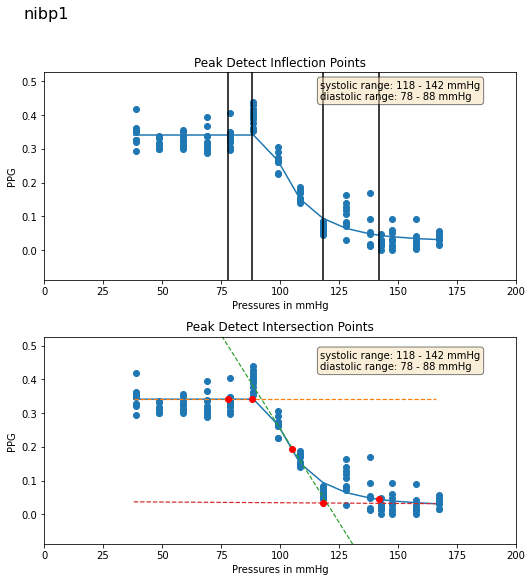

210724AP:
210724AP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    29.737555  0.461750  0.494206  ...  0.004047  0.242344  0.916400
1    40.420887  0.373026  0.373607  ...  0.004887  0.240422  0.932667
2    49.941875  0.371854  0.365155  ...  0.005007  0.265402  0.977928
3    59.694321  0.356567  0.342168  ...  0.004242  0.238854  0.978186
4    70.190292  0.376925  0.360886  ...  0.003903  0.227130  0.984946
5    79.366104  0.406262  0.417723  ...  0.004015  0.246217  0.959394
6    89.887352  0.455267  0.445862  ...  0.003575  0.221467  0.924131
7    99.900002  0.310381  0.326282  ...  0.002792  0.168409  0.759861
8   109.320724  0.193708  0.176237  ...  0.002231  0.144856  0.533865
9   118.795868  0.189313  0.184250  ...  0.001415  0.141567  0.053079
10  129.000946  0.094340  0.089772  ...  0.000512  0.056467  0.073832
11  138.537567  0.043185  0.038977  ...  0.000316  0.033727  0.048969
12  143.399689  0.044439  0.040493  ...  0.000264  0.034446 -0.238219
1

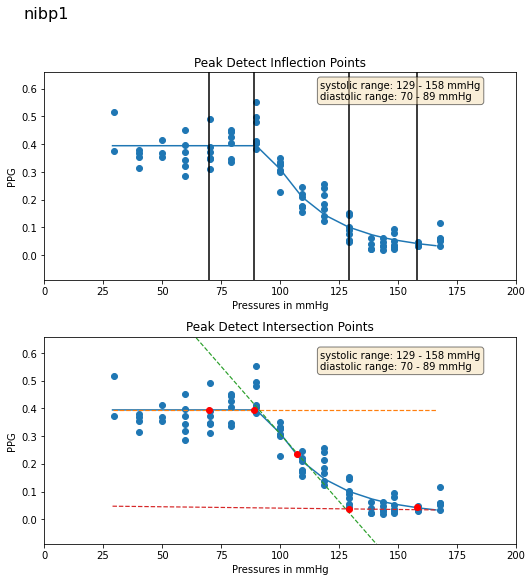

210724BP:
210724BP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    29.185280  0.261117  0.253082  ...  0.002487  0.125287  0.949762
1    37.319561  0.478267  0.505205  ...  0.005066  0.312359  0.945830
2    45.215626  0.419956  0.408532  ...  0.005575  0.317554  0.952182
3    53.071777  0.382600  0.359378  ...  0.004555  0.249053  0.915687
4    61.587429  0.323516  0.285538  ...  0.004671  0.253683  0.896424
5    69.164719  0.325145  0.308087  ...  0.005398  0.291999  0.864579
6    78.414597  0.353723  0.351858  ...  0.005088  0.254538  0.724563
7    85.931839  0.259556  0.271358  ...  0.004664  0.242343  0.789184
8    93.749161  0.087865  0.090838  ...  0.001101  0.058713  0.605693
9   101.892792  0.107211  0.115175  ...  0.001806  0.128348 -0.201792
10  109.473366  0.050591  0.025038  ...  0.000808  0.077171 -0.668733
11  118.342018  0.030032  0.015289  ...  0.000195  0.045348 -0.520971
12  123.588356  0.024004  0.024095  ...  0.000212  0.033129 -0.639841
1

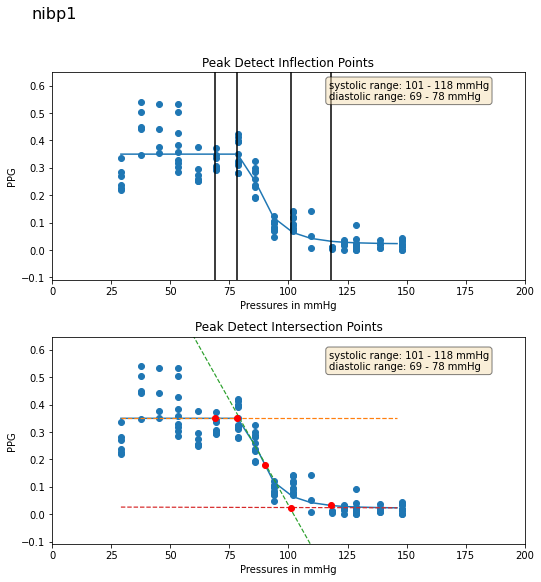

210726AP:
210726AP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    29.132462  0.756980  0.756214  ...  0.011068  0.631059  0.960990
1    40.517025  0.752860  0.769507  ...  0.010450  0.585328  0.961093
2    50.804222  0.788093  0.792151  ...  0.011313  0.650247  0.959839
3    63.143063  0.805400  0.808983  ...  0.010091  0.551072  0.964823
4    73.877762  0.763763  0.770744  ...  0.010321  0.614258  0.972992
5    84.967758  0.792875  0.813225  ...  0.011328  0.638473  0.990647
6    96.750786  0.718344  0.722235  ...  0.012468  0.621386  0.982276
7   107.817833  0.620264  0.622941  ...  0.010227  0.460425  0.953567
8   119.117020  0.406508  0.385932  ...  0.006445  0.281556  0.881896
9   130.870346  0.215127  0.213548  ...  0.003689  0.166316  0.811957
10  141.490158  0.145148  0.164705  ...  0.002123  0.116444 -0.102549
11  153.030182  0.216314  0.224834  ...  0.002781  0.198688 -0.413435
12  158.331131  0.176180  0.112544  ...  0.001979  0.147917 -0.322988
1

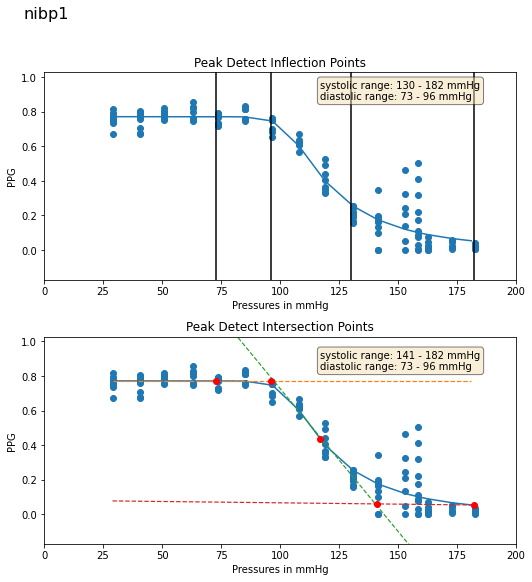

210726BP:
210726BP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    29.122002  0.754355  0.753614  ...  0.018706  1.167132  0.991983
1    38.135792  0.707831  0.707209  ...  0.018215  1.139218  0.997554
2    46.791103  0.568482  0.573272  ...  0.016117  1.005592  0.988429
3    56.478474  0.627089  0.609805  ...  0.013381  0.822351  0.955904
4    65.050446  0.686484  0.681409  ...  0.014976  0.864614  0.971632
5    74.016502  0.534206  0.544451  ...  0.016203  0.849119  0.927896
6    83.080788  0.605286  0.623745  ...  0.016189  0.854903  0.945499
7    91.714348  0.364207  0.375298  ...  0.011643  0.544422  0.885265
8   100.394890  0.217893  0.212848  ...  0.007152  0.327817  0.754267
9   109.301445  0.162040  0.163883  ...  0.003902  0.217777  0.159935
10  118.033432  0.080367  0.081691  ...  0.001313  0.067653  0.522809
11  128.166733  0.149269  0.172215  ...  0.002691  0.200203 -0.370809
12  132.876846  0.023048  0.024274  ...  0.000203  0.033967 -0.315530
1

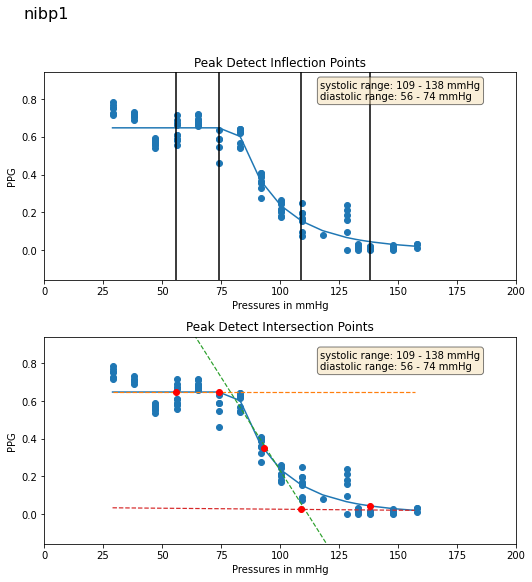

210726CP:
210726CP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    28.596231  1.379326  1.361819  ...  0.008635  0.545917  0.996248
1    38.879520  1.633153  1.639709  ...  0.008865  0.564020  0.990310
2    50.117611  1.268593  1.255708  ...  0.008617  0.510378  0.970545
3    60.697079  1.588851  1.626928  ...  0.014698  0.880040  0.933784
4    71.729317  1.471923  1.562582  ...  0.013062  0.776982  0.958440
5    82.601257  1.717268  1.715958  ...  0.009162  0.486736  0.879080
6    93.388725  1.277623  1.324570  ...  0.010372  0.617662  0.816225
7   104.431671  1.122875  1.235722  ...  0.009000  0.538174  0.312653
8   115.380157  0.824641  0.706366  ...  0.004842  0.239870  0.703407
9   126.186752  0.583929  0.434396  ...  0.003864  0.291516  0.281171
10  136.934875  0.325460  0.267760  ...  0.001451  0.149093 -0.327501
11  147.650681  0.152548  0.190763  ...  0.000373  0.075620 -0.314653
12  152.307571  0.091210  0.062362  ...  0.000245  0.040069 -0.326980
1

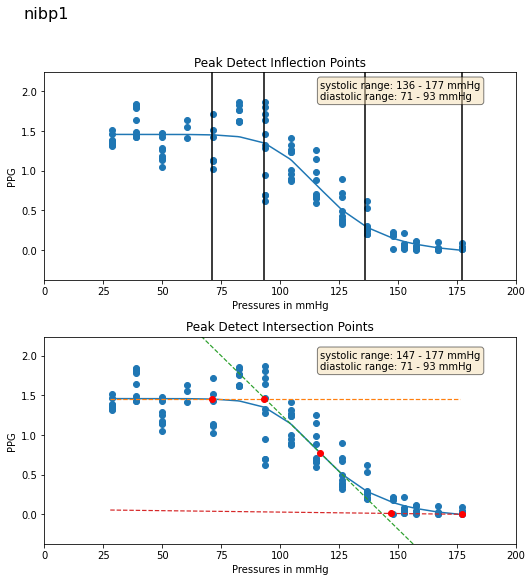

210728AP:
210728AP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    28.951599  1.364063  1.398853  ...  0.010535  0.709475  0.947091
1    39.171944  1.239413  1.225892  ...  0.014005  0.940721  0.974336
2    50.064125  1.264994  1.241712  ...  0.012564  0.826769  0.945348
3    60.877457  1.091228  1.077430  ...  0.008616  0.597806  0.953778
4    71.819130  1.444269  1.447755  ...  0.013109  0.874580  0.919069
5    82.883850  1.123719  1.088086  ...  0.010026  0.670979  0.934019
6    93.396515  1.152706  1.176252  ...  0.010500  0.681244  0.875169
7   104.186981  0.634334  0.639788  ...  0.006458  0.409924  0.717032
8   114.898666  0.567671  0.655163  ...  0.004101  0.315584  0.281238
9   125.685402  0.165733  0.137133  ...  0.000567  0.088895  0.055351
10  136.295715  0.064536  0.065888  ...  0.000226  0.061764 -0.301831
11  147.034058  0.059941  0.060140  ...  0.000319  0.055025 -0.284224
12  151.880264  0.071352  0.080246  ...  0.000265  0.064563 -0.377374
1

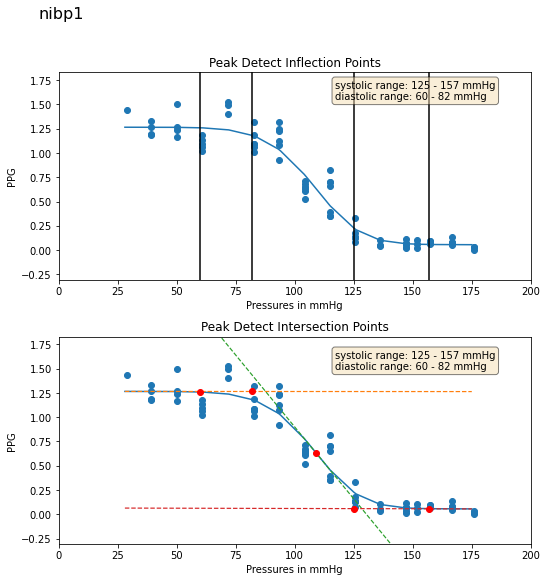

210728BP:
210728BP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    35.307800  0.790273  0.760424  ...  0.011597  0.743290  0.860552
1    42.797619  0.916189  0.902177  ...  0.011903  0.716956  0.956623
2    49.661510  0.874411  0.891685  ...  0.013973  0.872315  0.935112
3    57.339291  0.995899  1.020645  ...  0.012278  0.769908  0.930701
4    64.456642  1.211249  1.251091  ...  0.010311  0.603682  0.936123
5    71.288750  1.641673  1.641673  ...  0.009439  0.530883  0.966395
6    78.178116  0.830509  0.805939  ...  0.011506  0.644300  0.957158
7    86.194954  0.578088  0.555401  ...  0.008545  0.466256  0.954027
8    93.129814  0.386257  0.397890  ...  0.006191  0.333060  0.904186
9    99.818954  0.303289  0.283259  ...  0.004375  0.268278  0.685889
10  107.840759  0.189567  0.188349  ...  0.001757  0.120779  0.039501
11  112.443451  0.063696  0.033390  ...  0.000756  0.061293 -0.286240
12  117.211205  0.035682  0.044416  ...  0.000177  0.024219 -0.441479
1

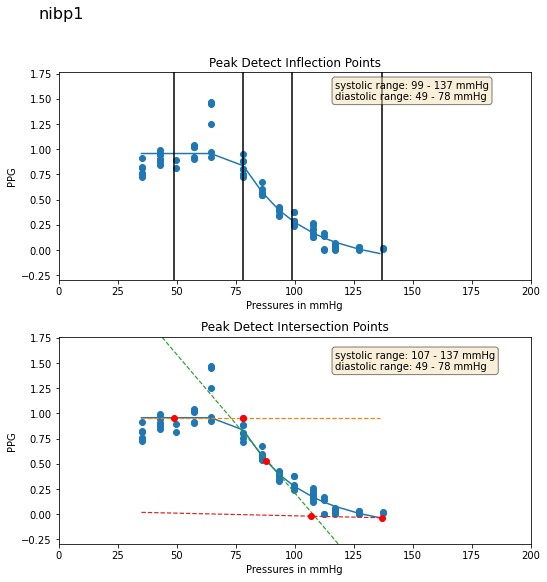

210729AP:
210729AP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    28.728527  0.646415  0.667807  ...  0.003796  0.276199  0.970561
1    39.427479  0.555082  0.552086  ...  0.003500  0.238249  0.983268
2    51.620342  0.609589  0.603076  ...  0.004445  0.308033  0.966300
3    63.291878  0.545744  0.547386  ...  0.004732  0.323780  0.958275
4    75.342751  0.549436  0.551951  ...  0.003953  0.275308  0.964369
5    86.951584  0.594661  0.578532  ...  0.003089  0.210254  0.982045
6    97.697845  0.602384  0.603602  ...  0.005373  0.330874  0.982045
7   109.666679  0.479158  0.479029  ...  0.003223  0.184059  0.957907
8   121.370712  0.567115  0.550112  ...  0.002834  0.143500  0.925404
9   133.060486  0.258113  0.271340  ...  0.001217  0.063233  0.734679
10  144.445633  0.176045  0.189590  ...  0.001446  0.088895  0.406365
11  156.715271  0.041589  0.037744  ...  0.000190  0.030781 -0.065737
12  161.359802  0.037649  0.034594  ...  0.000205  0.013558 -0.100620
1

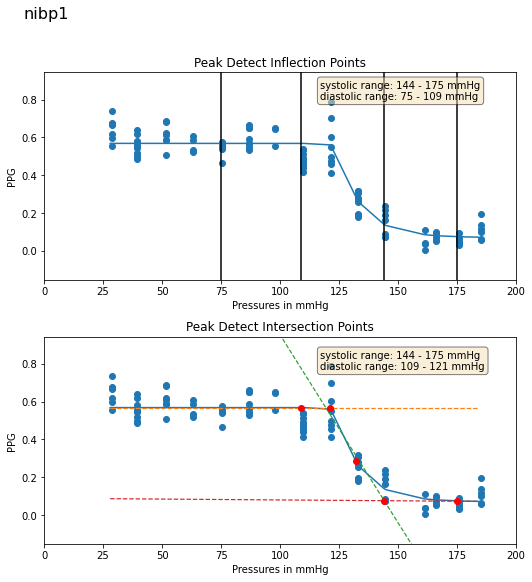

210729BP:
210729BP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    29.012753  0.847848  0.849745  ...  0.016063  0.954886  0.988012
1    37.235916  1.147098  1.147098  ...  0.017151  1.166679  0.996237
2    45.782013  0.657476  0.637216  ...  0.018667  1.035668  0.991474
3    54.121998  0.911978  0.920935  ...  0.014413  0.820740  0.948066
4    62.910465  0.776021  0.779055  ...  0.015120  0.915370  0.994573
5    71.742264  0.531215  0.521185  ...  0.014844  0.850652  0.944000
6    79.869232  0.566348  0.554349  ...  0.016967  0.871694  0.901189
7    88.724701  0.429667  0.438451  ...  0.016108  0.907452  0.808406
8    97.159058  0.397620  0.372112  ...  0.011408  0.708007  0.574269
9   104.609680  0.198721  0.203763  ...  0.006449  0.349367  0.795178
10  113.860023  0.242362  0.203490  ...  0.004802  0.500482 -0.042239
11  122.389755  0.066587  0.062115  ...  0.000986  0.105654 -0.470466
12  127.169022  0.062780  0.066715  ...  0.001128  0.122184 -0.464467
1

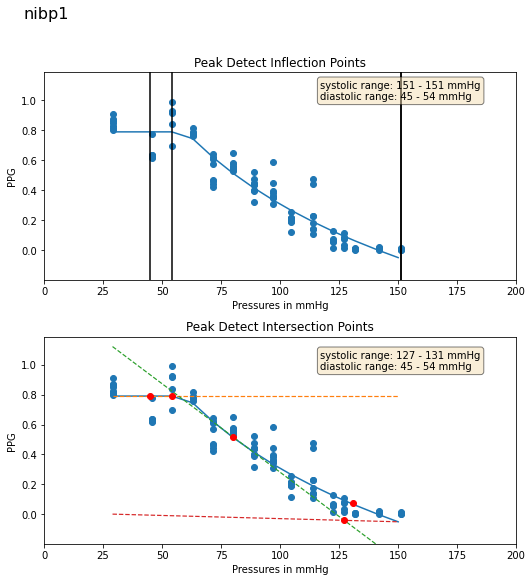

210730AP:
210730AP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    28.889307  0.835758  0.816528  ...  0.004417  0.281215  0.979819
1    37.609833  0.869935  0.859961  ...  0.003933  0.237083  0.989180
2    49.838062  0.787841  0.769364  ...  0.004589  0.295575  0.973540
3    56.854565  0.866664  0.829957  ...  0.004842  0.286612  0.970869
4    66.966370  0.920232  0.903654  ...  0.005270  0.315059  0.944326
5    76.320816  0.908021  0.892045  ...  0.006137  0.374401  0.945923
6    85.612350  0.909924  0.909811  ...  0.005739  0.355349  0.906439
7    94.834976  0.743675  0.741660  ...  0.004707  0.283975  0.873105
8   104.529160  0.556656  0.550314  ...  0.005112  0.321802  0.868803
9   113.257240  0.430001  0.443304  ...  0.004099  0.251458  0.697355
10  123.202682  0.214010  0.224607  ...  0.001238  0.101348 -0.270649
11  132.761795  0.148453  0.138680  ...  0.000834  0.070474 -0.294695
12  138.058792  0.068616  0.082006  ...  0.000254  0.036224 -0.434734
1

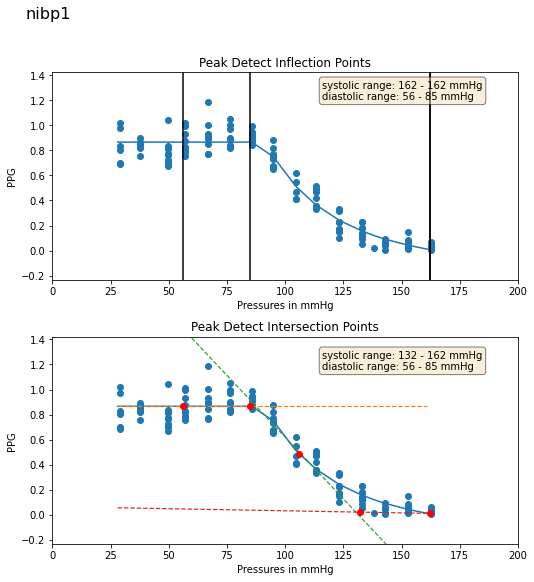

210730BP:
210730BP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    29.387951  0.830723  0.826405  ...  0.012345  0.581409  0.990911
1    38.198135  0.783403  0.772540  ...  0.012564  0.578530  0.975385
2    47.129356  0.669383  0.671257  ...  0.011823  0.551615  0.970536
3    56.431530  0.693072  0.692465  ...  0.014030  0.654149  0.967483
4    64.995056  0.695208  0.691257  ...  0.012331  0.584450  0.973420
5    74.096687  0.670235  0.686704  ...  0.011765  0.554401  0.951662
6    83.171890  0.584738  0.575357  ...  0.011590  0.549030  0.885583
7    91.986420  0.426100  0.434774  ...  0.008835  0.412428  0.711441
8   101.007469  0.291260  0.297453  ...  0.005629  0.307012  0.475357
9   109.500816  0.149314  0.136189  ...  0.002812  0.144251  0.409042
10  118.286552  0.019849  0.023035  ...  0.000165  0.020886 -0.167523
11  128.361725  0.065901  0.024810  ...  0.000182  0.059056 -0.050663
12  133.199783  0.020321  0.018295  ...  0.000304  0.022050 -0.138825
1

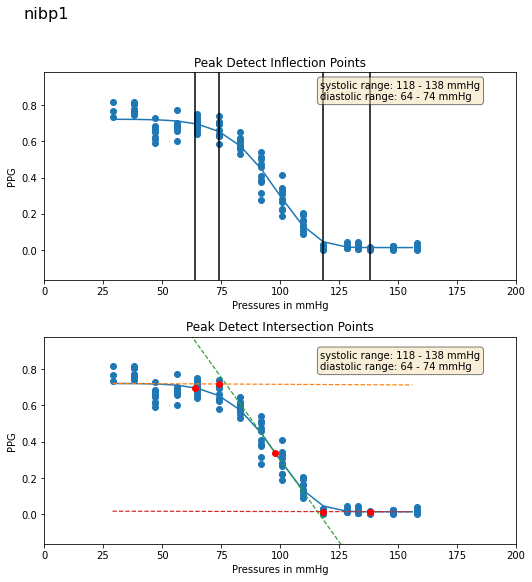

210730CP:
210730CP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    28.620829  0.504815  0.501351  ...  0.012422  0.574984  0.993496
1    38.988102  0.470992  0.468361  ...  0.011110  0.507442  0.975256
2    49.738857  0.352291  0.351737  ...  0.007796  0.379246  0.951833
3    61.196377  0.333338  0.302481  ...  0.008448  0.394539  0.967937
4    71.866302  0.308498  0.283782  ...  0.007429  0.355416  0.970770
5    82.944855  0.321231  0.303640  ...  0.007255  0.336556  0.940724
6    93.854591  0.244039  0.222120  ...  0.006045  0.271341  0.887893
7   104.500610  0.108250  0.090646  ...  0.002422  0.121911  0.430252
8   115.302315  0.178141  0.169065  ...  0.002421  0.197512 -0.111869
9   125.924850  0.043279  0.032230  ...  0.000609  0.044824 -0.740082
10  136.703186  0.042805  0.026032  ...  0.000195  0.043398 -0.688562
11  147.517456  0.015901  0.008510  ...  0.000201  0.016724 -0.721768
12  152.478271  0.024597  0.018234  ...  0.000279  0.024776 -0.528919
1

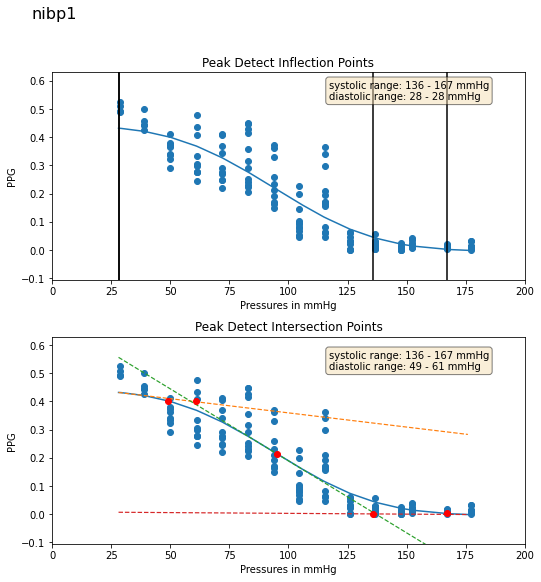

210731AP:
210731AP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    29.183319  1.697809  1.703323  ...  0.007058  0.350903  0.971442
1    39.226906  1.874289  1.821522  ...  0.007148  0.351588  0.942323
2    50.123329  1.881103  1.960567  ...  0.009380  0.471688  0.963033
3    61.083157  1.926211  1.935799  ...  0.009076  0.464491  0.938653
4    71.826454  1.712944  1.661671  ...  0.008227  0.413059  0.954077
5    82.822052  2.182446  2.206398  ...  0.011036  0.555968  0.924755
6    93.501343  1.373215  1.312106  ...  0.006572  0.331212  0.834196
7   104.294228  0.590929  0.593358  ...  0.003994  0.183107  0.725876
8   115.215218  0.285981  0.274356  ...  0.002405  0.151332  0.577499
9   125.629288  0.090393  0.090315  ...  0.000384  0.037585 -0.351661
10  136.467712  0.046622  0.045178  ...  0.000355  0.021021 -0.253730
11  147.275620  0.033937  0.033284  ...  0.000149  0.026454 -0.347076
12  151.912094  0.042417  0.041156  ...  0.000232  0.028543 -0.064086
1

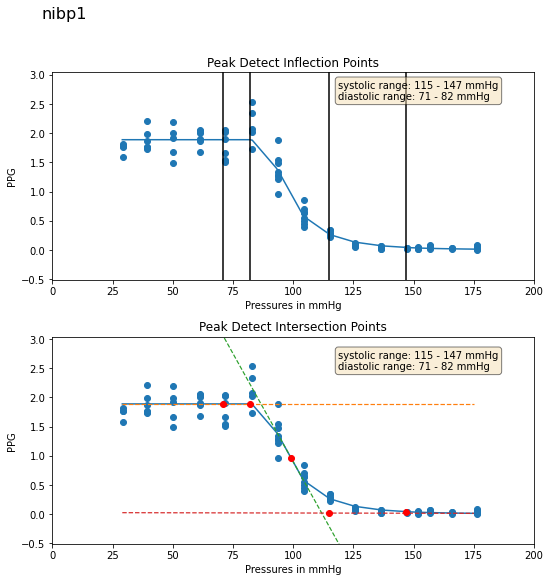

210731BP:
210731BP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    29.074030  1.066130  1.060426  ...  0.011320  0.659028  0.976307
1    38.994003  1.199644  1.199742  ...  0.011075  0.651250  0.973492
2    48.999100  1.175815  1.160238  ...  0.010309  0.607662  0.989429
3    59.000969  1.191816  1.184618  ...  0.012025  0.652411  0.982040
4    69.157021  1.360722  1.360728  ...  0.012314  0.626091  0.945202
5    79.121170  1.292709  1.301519  ...  0.012628  0.639426  0.946608
6    89.295708  0.960531  0.946117  ...  0.009787  0.468517  0.932865
7    98.785080  0.668595  0.658307  ...  0.007120  0.343734  0.870218
8   108.709129  0.355314  0.359666  ...  0.004070  0.188906  0.669816
9   118.009933  0.451560  0.418955  ...  0.002764  0.255977 -0.008545
10  128.124435  0.134359  0.133311  ...  0.000937  0.082514 -0.188041
11  138.086029  0.102728  0.085321  ...  0.000366  0.066036 -0.346201
12  142.722519  0.084562  0.100401  ...  0.000254  0.051251 -0.389747
1

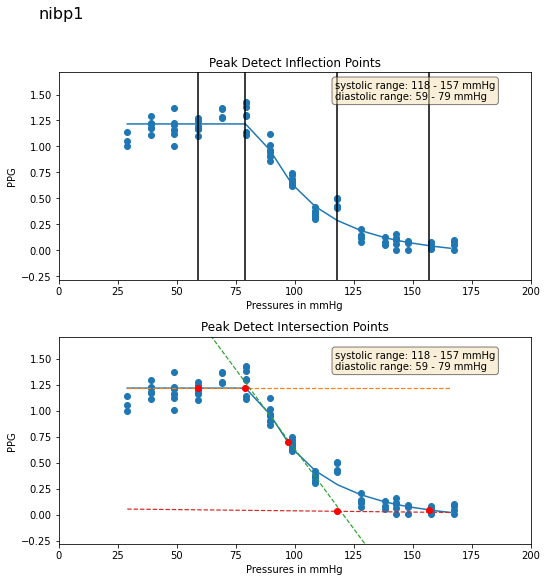

210803AP:
210803AP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    28.896744  0.820919  0.853583  ...  0.028123  1.505554  0.984031
1    38.916008  0.735151  0.760559  ...  0.026676  1.313284  0.981803
2    48.691738  0.806676  0.783616  ...  0.028137  1.354298  0.967980
3    58.533096  0.778251  0.780270  ...  0.025271  1.264266  0.971535
4    68.817131  1.122730  1.106565  ...  0.026867  1.374627  0.901050
5    78.410072  0.840770  0.826041  ...  0.027380  1.384955  0.943252
6    88.838028  0.502394  0.515593  ...  0.018417  0.948305  0.751685
7    98.216362  0.396169  0.330665  ...  0.014656  0.790624  0.509543
8   108.537880  0.609488  0.687433  ...  0.013030  0.898721  0.424701
9   117.946838  0.109683  0.111424  ...  0.002146  0.171037 -0.625870
10  127.719940  0.011465  0.011081  ...  0.000230  0.022895 -0.472476
11  137.787903  0.015344  0.008754  ...  0.000183  0.030736 -0.596940
12  142.612030  0.020348  0.020420  ...  0.000316  0.038625 -0.550642
1

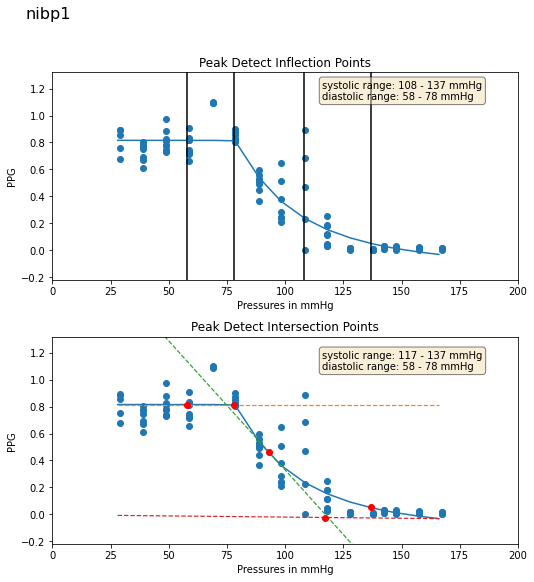

210803BP:
210803BP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    28.727533  0.217902  0.218027  ...  0.006290  0.304007  0.977338
1    34.796856  0.186575  0.187103  ...  0.006938  0.334323  0.947553
2    41.736168  0.210968  0.210764  ...  0.006925  0.358371  0.940544
3    48.513145  0.214309  0.213176  ...  0.007152  0.357174  0.918220
4    55.990128  0.231373  0.234029  ...  0.008525  0.394623  0.853259
5    62.701233  0.229709  0.232306  ...  0.007913  0.398535  0.783281
6    68.614914  0.220964  0.225134  ...  0.006735  0.322150  0.864727
7    75.534721  0.238409  0.258031  ...  0.005418  0.274011  0.794295
8    82.398605  0.040969  0.041986  ...  0.001218  0.059629 -0.127113
9    89.257248  0.109878  0.091852  ...  0.003094  0.186399 -0.216937
10   95.985954  0.077738  0.071348  ...  0.001777  0.136028 -0.541564
11  103.319366  0.017731  0.013149  ...  0.000325  0.030855 -0.641679
12  107.971123  0.008951  0.005063  ...  0.000159  0.019206 -0.445975
1

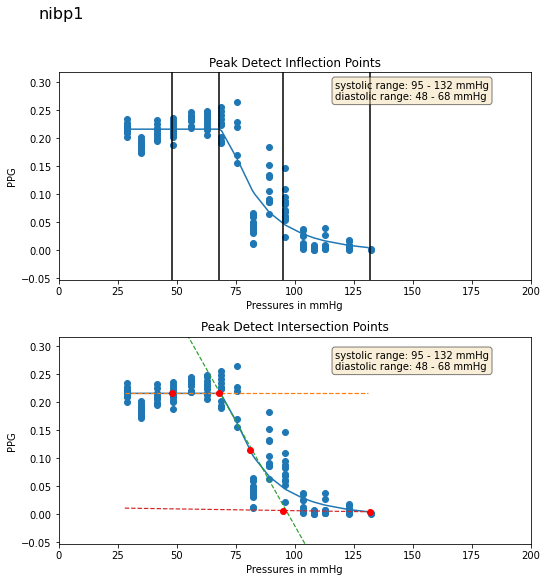

210804AP:
210804AP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    28.723993  1.209356  1.191942  ...  0.013001  0.708092  0.920210
1    37.588417  1.068076  1.098068  ...  0.009581  0.510543  0.918834
2    46.380566  1.110638  1.079432  ...  0.012419  0.647093  0.982065
3    55.712307  1.107809  1.102086  ...  0.011770  0.625954  0.974835
4    64.527061  1.067520  1.068142  ...  0.011720  0.614903  0.972616
5    73.556656  1.031033  1.005854  ...  0.010897  0.568648  0.934863
6    82.243568  1.137387  1.130497  ...  0.010324  0.538990  0.844519
7    91.107857  0.784891  0.702797  ...  0.009266  0.448370  0.778047
8    99.864670  0.433625  0.426628  ...  0.005060  0.249688  0.601243
9   108.715210  0.473624  0.441051  ...  0.004101  0.248148 -0.053592
10  117.136505  0.119573  0.068521  ...  0.000709  0.053177 -0.184175
11  127.325272  0.054776  0.040190  ...  0.000195  0.021851 -0.190794
12  132.364212  0.024987  0.025502  ...  0.000238  0.015683 -0.269661
1

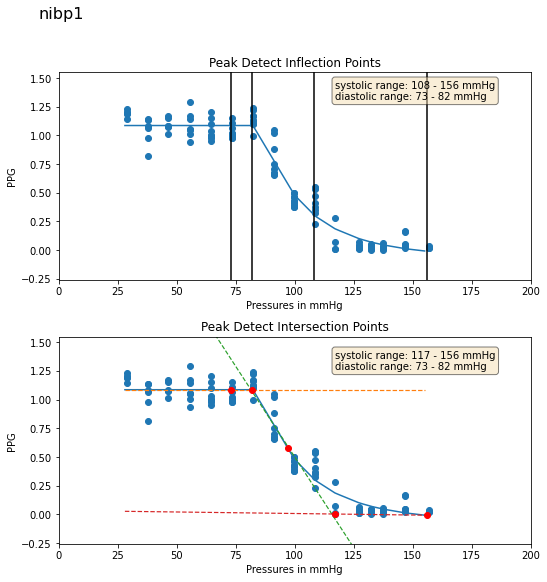

210729CP:
210729CP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    29.262758  0.801039  0.819837  ...  0.007546  0.395957  0.960552
1    39.149483  0.797396  0.768339  ...  0.008142  0.437938  0.948213
2    50.090054  0.664874  0.588379  ...  0.006325  0.328715  0.947404
3    60.977455  0.828397  0.823317  ...  0.009110  0.486241  0.980905
4    71.771820  0.921292  0.932056  ...  0.010152  0.537372  0.986012
5    82.785614  0.834023  0.827884  ...  0.008194  0.421250  0.960937
6    93.809174  0.746818  0.790279  ...  0.007667  0.403376  0.832936
7   105.045792  0.478814  0.476980  ...  0.004588  0.242882  0.839439
8   115.712326  0.423069  0.407624  ...  0.004189  0.231915  0.645025
9   126.346710  0.185796  0.157019  ...  0.001351  0.102872 -0.057860
10  136.945877  0.113433  0.068366  ...  0.000347  0.063021 -0.684584
11  147.934067  0.069895  0.068881  ...  0.000175  0.038070 -0.650286
12  152.641647  0.038400  0.038282  ...  0.000136  0.022959 -0.640298
1

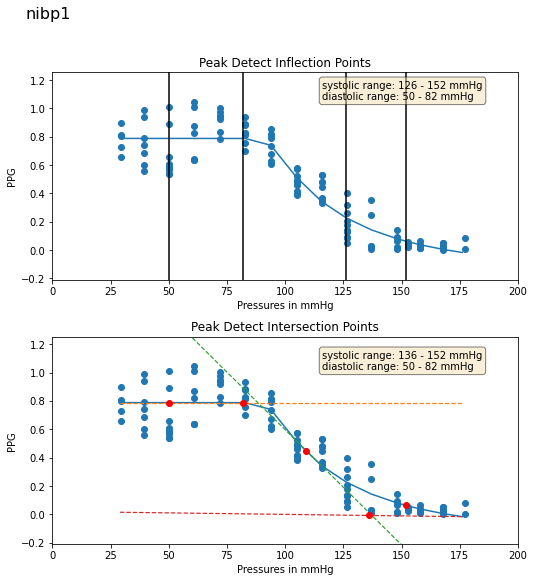

210804BP:
210804BP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    29.356182  0.980788  0.987620  ...  0.013017  0.908017  0.987742
1    37.574287  1.022484  1.012711  ...  0.013973  0.943573  0.987919
2    45.609215  1.062103  1.042130  ...  0.013256  0.881343  0.990495
3    53.003914  0.967667  0.962523  ...  0.011993  0.795599  0.985289
4    61.721516  0.867575  0.879894  ...  0.009424  0.630637  0.987276
5    70.240685  0.993717  0.980071  ...  0.010689  0.721059  0.979309
6    78.190918  0.918226  0.915291  ...  0.011466  0.742036  0.957726
7    86.040817  0.861789  0.864697  ...  0.013680  0.821366  0.964595
8    93.952957  0.503451  0.499386  ...  0.005221  0.300347  0.936822
9   102.103828  0.556968  0.567654  ...  0.008085  0.453021  0.730784
10  109.766014  0.361941  0.361395  ...  0.005795  0.304160  0.727706
11  118.380646  0.364929  0.384471  ...  0.005072  0.382242 -0.357937
12  123.356651  0.055435  0.023823  ...  0.000231  0.053290 -0.356278
1

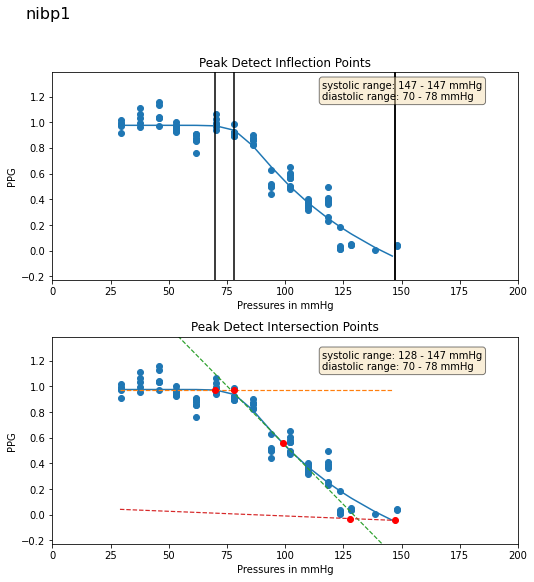

210805AP:
210805AP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    29.304724  0.765301  0.764769  ...  0.009067  0.409722  0.985351
1    36.939693  0.768245  0.759791  ...  0.009045  0.414082  0.977179
2    46.628597  0.774797  0.780505  ...  0.009017  0.415773  0.962063
3    53.753323  0.736804  0.734903  ...  0.008756  0.395631  0.983061
4    62.764999  0.761897  0.756443  ...  0.008058  0.367050  0.975911
5    71.602280  0.747829  0.736845  ...  0.008387  0.386149  0.972139
6    79.758377  0.766676  0.774591  ...  0.008467  0.380738  0.956909
7    88.521194  0.781066  0.771906  ...  0.006673  0.311604  0.954433
8    97.878731  0.584877  0.592049  ...  0.007112  0.319389  0.791146
9   105.792236  0.511561  0.504786  ...  0.005883  0.259447  0.751799
10  114.694969  0.295047  0.309562  ...  0.003408  0.149133  0.699805
11  123.145638  0.144375  0.155229  ...  0.001489  0.072518 -0.018837
12  128.272232  0.155011  0.148718  ...  0.001215  0.056624  0.651540
1

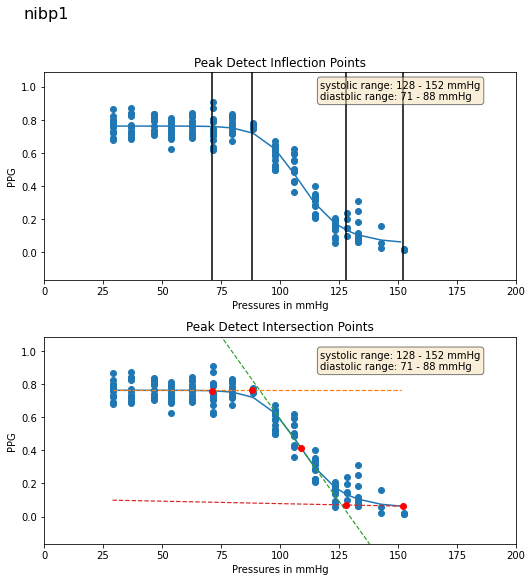

210806AP:
210806AP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    28.953003  0.935137  0.946527  ...  0.011308  0.686473  0.939434
1    36.877483  0.781778  0.709095  ...  0.007574  0.435835  0.926971
2    45.885807  0.582544  0.577605  ...  0.007593  0.431430  0.938566
3    54.127228  1.167579  1.200562  ...  0.016692  0.991659  0.866977
4    62.906380  0.734279  0.747129  ...  0.010810  0.582456  0.899166
5    71.536987  1.072239  1.082129  ...  0.016035  0.944755  0.876185
6    79.625778  0.766965  0.752954  ...  0.011295  0.667907  0.807403
7    88.505806  0.572701  0.546684  ...  0.009077  0.516438  0.744330
8    97.175133  0.499657  0.499631  ...  0.007042  0.464734  0.391508
9   104.777901  0.308641  0.296225  ...  0.003844  0.260056  0.356083
10  113.915886  0.180875  0.190505  ...  0.002632  0.164674 -0.395783
11  122.661324  0.034560  0.043974  ...  0.000221  0.033620 -0.455623
12  127.397324  0.041288  0.023316  ...  0.000221  0.035151 -0.393083
1

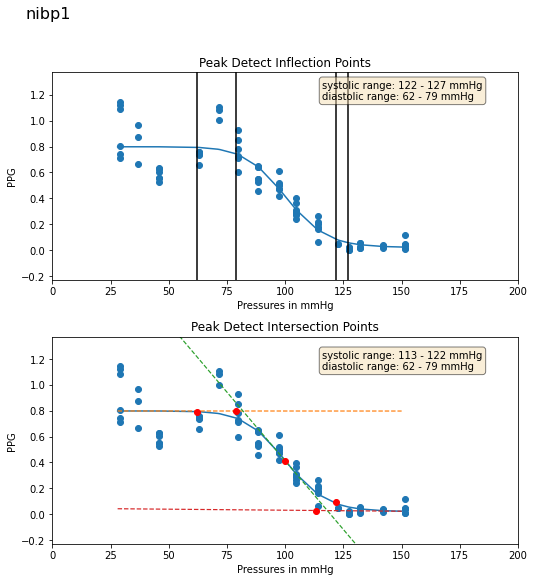

210806BP:
210806BP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    29.735289  0.546327  0.567788  ...  0.008287  0.503463  0.951110
1    37.927654  0.695381  0.700312  ...  0.011215  0.725832  0.996174
2    46.583515  0.550623  0.550523  ...  0.008541  0.542896  0.979497
3    54.779682  0.482721  0.468081  ...  0.007641  0.443914  0.974350
4    63.629990  0.561789  0.516882  ...  0.009336  0.594610  0.975062
5    72.507866  0.497385  0.494070  ...  0.008310  0.494591  0.972787
6    80.981613  0.486568  0.464009  ...  0.008562  0.480530  0.933417
7    90.119698  0.385853  0.393931  ...  0.006408  0.355537  0.863246
8    98.667229  0.251626  0.232140  ...  0.005119  0.265890  0.646691
9   106.190315  0.177183  0.150025  ...  0.002705  0.168361  0.382216
10  115.529694  0.186350  0.184306  ...  0.002275  0.163229 -0.104571
11  123.794395  0.031078  0.028434  ...  0.000143  0.028198 -0.369486
12  128.663620  0.014749  0.017184  ...  0.000154  0.013319 -0.119160
1

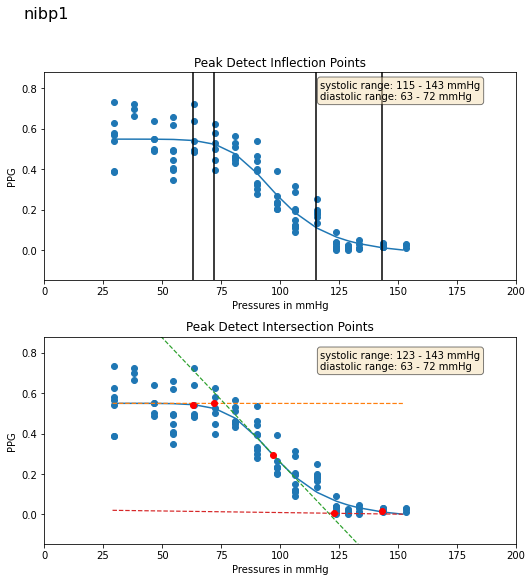

210806CP:
210806CP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    29.160624  0.833281  0.827861  ...  0.010471  0.562365  0.978509
1    39.167660  0.812278  0.796457  ...  0.009713  0.535412  0.977752
2    48.972210  0.805290  0.810052  ...  0.008892  0.490312  0.988229
3    59.047928  0.891071  0.906495  ...  0.010079  0.557446  0.976409
4    70.037033  0.800562  0.823925  ...  0.008780  0.464579  0.627657
5    78.998276  0.660352  0.667808  ...  0.006714  0.322008  0.897914
6    89.258400  0.603838  0.552216  ...  0.007277  0.371920  0.910651
7    99.540390  0.568735  0.480983  ...  0.008427  0.399372  0.845089
8   109.245659  0.506411  0.366263  ...  0.006082  0.312446  0.638622
9   118.622360  0.475551  0.366690  ...  0.002527  0.154594  0.375195
10  128.536377  0.490907  0.412150  ...  0.004282  0.340561  0.066465
11  138.346802  0.293672  0.282247  ...  0.002186  0.196388 -0.507485
12  143.252869  0.297561  0.262131  ...  0.002579  0.214878 -0.528743
1

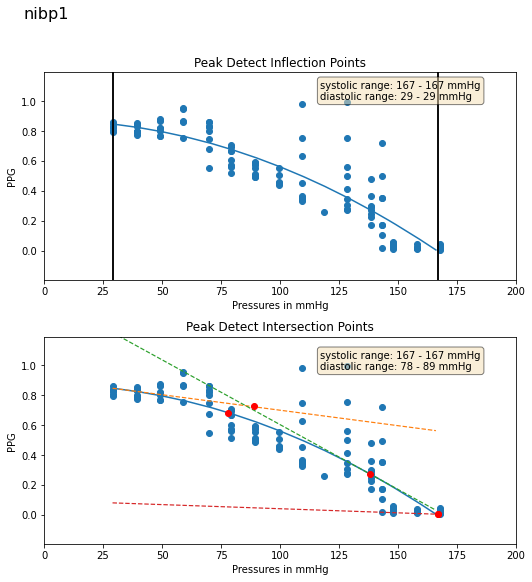

210810AP:
210810AP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    38.002918  0.919208  0.877684  ...  0.007320  0.439534  0.870507
1    46.949532  0.852552  0.835325  ...  0.008556  0.561054  0.647554
2    56.219364  0.693960  0.666017  ...  0.007551  0.441342  0.964212
3    65.302498  0.909511  0.852012  ...  0.008219  0.527552  0.567502
4    74.258514  0.716067  0.587340  ...  0.007445  0.473451  0.749653
5    83.435516  0.694131  0.600180  ...  0.007835  0.437005  0.840194
6    92.136353  0.636742  0.444232  ...  0.005751  0.391407 -0.019264
7   100.592804  0.624021  0.544522  ...  0.004670  0.406266  0.063181
8   109.250732  0.138007  0.104628  ...  0.000430  0.083194 -0.718980
9   118.084122  0.104868  0.135011  ...  0.000282  0.064001 -0.636304
10  128.144592  0.283591  0.155830  ...  0.000553  0.170172 -0.685364
11  133.084732  0.214659  0.195278  ...  0.000644  0.111054 -0.776419
12  138.200287  0.077999  0.050925  ...  0.000381  0.055335 -0.664672
1

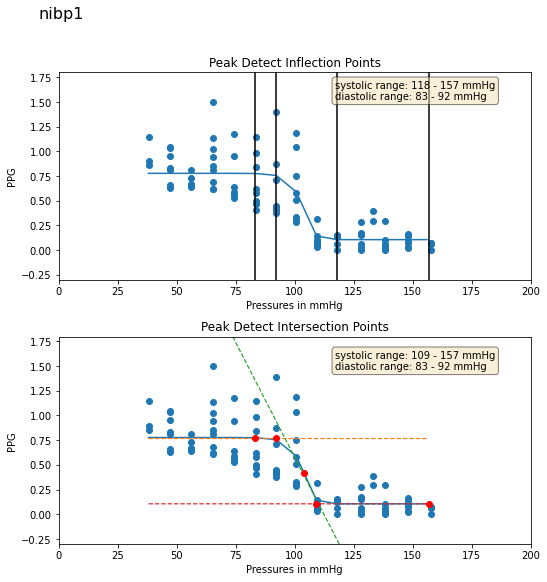

210810BP:
210810BP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    29.031521  0.669964  0.667858  ...  0.009924  0.609582  0.971459
1    38.238274  0.693050  0.691231  ...  0.016577  0.963441  0.965990
2    47.031372  0.770059  0.776308  ...  0.015905  0.935656  0.984418
3    55.894604  0.666918  0.698980  ...  0.014757  0.866548  0.993982
4    65.059265  0.754153  0.758586  ...  0.017466  1.003953  0.790589
5    74.264954  0.711688  0.683522  ...  0.014223  0.793119  0.973575
6    82.902496  0.632021  0.621521  ...  0.011204  0.603884  0.956777
7    91.740776  0.648515  0.643932  ...  0.017619  0.889443  0.962411
8   101.478722  0.514027  0.515913  ...  0.015561  0.695435  0.886054
9   110.698845  0.451965  0.435890  ...  0.012439  0.555737  0.871527
10  119.274239  0.415237  0.426054  ...  0.010347  0.445106  0.784024
11  128.794067  0.116512  0.117688  ...  0.002829  0.137511 -0.060586
12  133.582367  0.226293  0.218212  ...  0.005481  0.358726 -0.069077
1

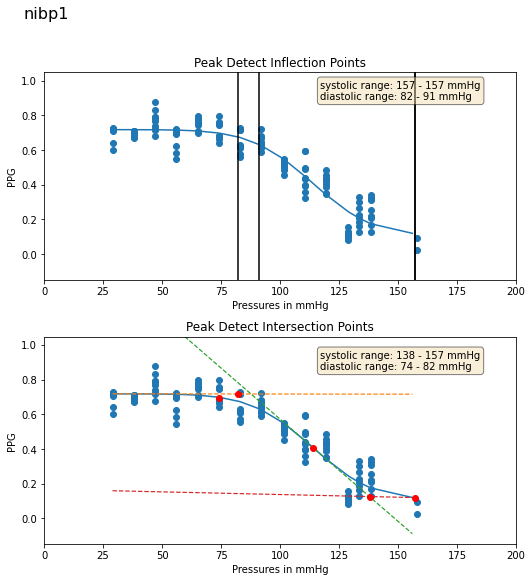

210807AP:
210807AP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    29.352106  0.651907  0.666838  ...  0.005255  0.300181  0.976275
1    38.318871  0.554159  0.556058  ...  0.002269  0.143300  0.811720
2    48.443146  0.578090  0.586540  ...  0.003308  0.238050  0.845699
3    58.228832  0.425035  0.378687  ...  0.002539  0.187860  0.710282
4    65.654114  0.325450  0.287188  ...  0.003224  0.205437  0.766293
5    74.411133  0.309353  0.290287  ...  0.003620  0.217222  0.904064
6    83.219704  0.367905  0.359944  ...  0.003884  0.246624  0.789627
7    92.150558  0.286791  0.264908  ...  0.002815  0.166307  0.696628
8   100.906860  0.430156  0.414736  ...  0.002024  0.184559  0.330935
9   110.069168  0.202006  0.194470  ...  0.000949  0.078757 -0.349054
10  118.813271  0.126646  0.134445  ...  0.000839  0.095899 -0.499293
11  128.656509  0.117039  0.118817  ...  0.000584  0.089449 -0.563630
12  133.410812  0.055621  0.029542  ...  0.000202  0.037156 -0.607901
1

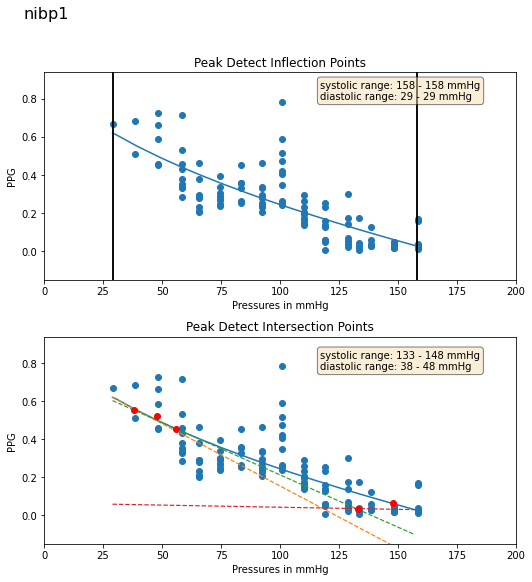

210810CP:
210810CP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    29.164989  0.828504  0.828504  ...  0.007742  0.479295  0.890276
1    38.360771  0.589583  0.608697  ...  0.004769  0.270995  0.885400
2    46.893486  0.525998  0.510114  ...  0.004420  0.259337  0.854572
3    56.096771  0.502143  0.495383  ...  0.004272  0.254749  0.868601
4    64.682426  0.555077  0.566089  ...  0.004984  0.301542  0.852469
5    73.702698  0.433476  0.431390  ...  0.004124  0.235151  0.815958
6    82.635918  0.436090  0.434359  ...  0.004835  0.276736  0.815121
7    91.425331  0.398475  0.402959  ...  0.004428  0.265566  0.684675
8   100.260750  0.303876  0.320751  ...  0.003619  0.205719  0.344695
9   109.013603  0.419800  0.435767  ...  0.003946  0.291456 -0.214162
10  118.015297  0.115595  0.105880  ...  0.001077  0.066382 -0.528780
11  127.995018  0.049443  0.065243  ...  0.000149  0.027216 -0.255688
12  132.781433  0.026571  0.025865  ...  0.000185  0.015368 -0.330381
1

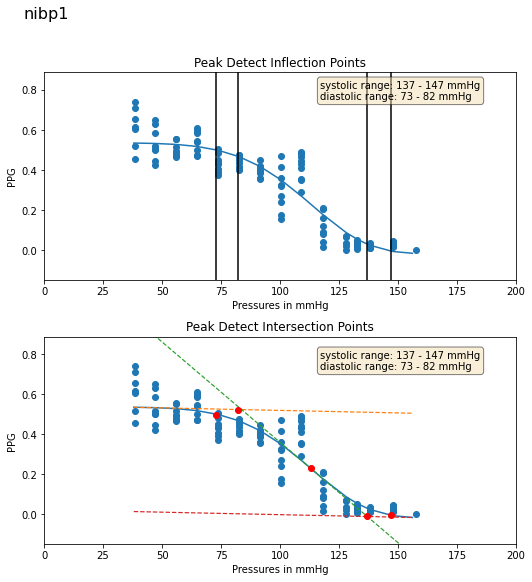

210811AP:
210811AP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    29.025127  0.867669  0.891690  ...  0.014115  0.819175  0.956113
1    37.105991  0.703894  0.712544  ...  0.012623  0.719989  0.944906
2    45.111332  0.863772  0.863769  ...  0.014540  0.839493  0.861894
3    52.849712  0.795801  0.811735  ...  0.012706  0.713514  0.922464
4    60.960533  0.738089  0.726374  ...  0.012388  0.686762  0.922965
5    69.107361  0.656342  0.665954  ...  0.011731  0.680751  0.832467
6    77.649483  0.688849  0.709179  ...  0.010029  0.556644  0.816772
7    85.558578  0.389371  0.403282  ...  0.007720  0.405467  0.753063
8    93.342072  0.292961  0.280472  ...  0.005506  0.292617  0.749750
9   101.334015  0.153100  0.140669  ...  0.003243  0.161031  0.183665
10  109.016182  0.124269  0.104224  ...  0.001650  0.128824 -0.223854
11  117.800453  0.046777  0.056080  ...  0.000565  0.028595 -0.017575
12  123.103905  0.027094  0.016704  ...  0.000508  0.032494 -0.290096
1

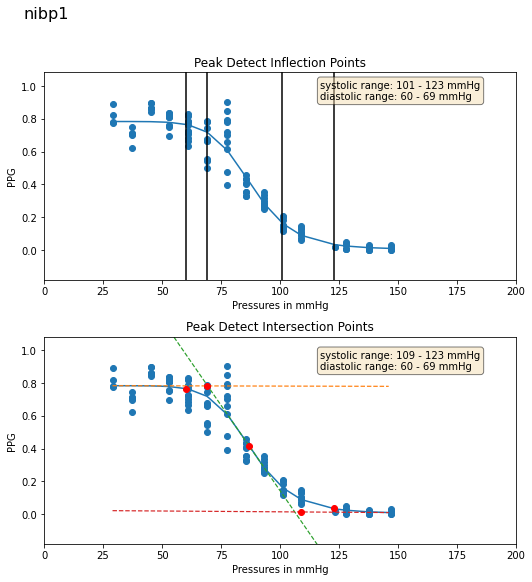

210811CP:
210811CP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    28.905245  1.480837  1.507683  ...  0.010623  0.573260  0.976564
1    36.905365  1.421584  1.421322  ...  0.010240  0.610746  0.951895
2    44.936611  1.233784  1.202679  ...  0.008558  0.470299  0.974824
3    52.716137  1.134177  1.134055  ...  0.007559  0.424184  0.943269
4    60.622467  1.076246  1.131489  ...  0.007096  0.412847  0.905611
5    68.819473  1.047969  0.987009  ...  0.006257  0.369894  0.899060
6    77.521194  0.991315  1.010503  ...  0.006171  0.363932  0.747993
7    85.012001  0.797591  0.803689  ...  0.005095  0.295277  0.733082
8    93.161377  0.464827  0.435249  ...  0.003472  0.196321  0.779388
9   101.087357  0.254981  0.224511  ...  0.001850  0.110353  0.467125
10  108.681419  0.209530  0.217535  ...  0.000942  0.088443 -0.493892
11  117.802589  0.039114  0.045731  ...  0.000149  0.018124 -0.207633
12  122.760933  0.046682  0.045142  ...  0.000195  0.021830 -0.262152
1

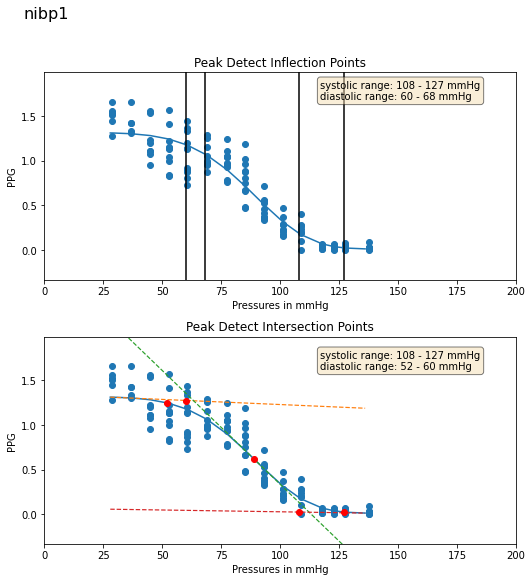

210812AP:
210812AP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    29.079639  0.738819  0.749864  ...  0.012294  0.685981  0.918464
1    38.019108  0.749554  0.749723  ...  0.012360  0.695185  0.936761
2    46.836540  1.023295  1.010869  ...  0.009602  0.517716  0.864307
3    56.143345  0.782791  0.808423  ...  0.012115  0.691592  0.859399
4    64.973770  0.800441  0.796482  ...  0.012767  0.731318  0.887972
5    73.914955  1.080416  1.072444  ...  0.011771  0.643856  0.934072
6    82.767776  0.799765  0.759713  ...  0.012424  0.693898  0.921662
7    91.535820  0.682481  0.701692  ...  0.012669  0.638085  0.915178
8   100.560776  0.467284  0.451251  ...  0.007624  0.352854  0.868230
9   109.152672  0.245134  0.242991  ...  0.004782  0.230107  0.764992
10  117.976944  0.217950  0.184770  ...  0.003161  0.209437 -0.280668
11  127.990898  0.042051  0.035414  ...  0.000235  0.028061 -0.169012
12  132.416611  0.057784  0.063135  ...  0.000184  0.019343 -0.362508
1

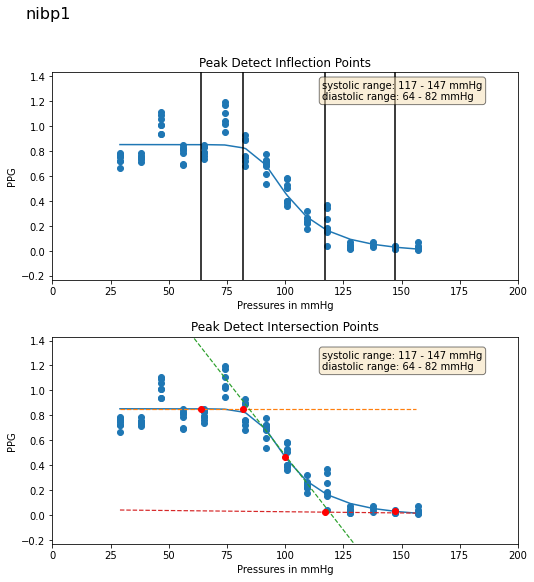

210717BP:
210717BP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    28.815477  0.535650  0.517117  ...  0.005560  0.357580  0.922195
1    37.863472  0.404273  0.390965  ...  0.004429  0.261381  0.965824
2    46.687218  0.490867  0.493874  ...  0.005554  0.333108  0.931693
3    55.872215  0.459520  0.437496  ...  0.005325  0.288419  0.935648
4    64.970589  0.803380  0.803380  ...  0.008543  0.633650  0.858387
5    74.040634  0.410152  0.405101  ...  0.006231  0.330589  0.875057
6    83.029541  0.672804  0.648596  ...  0.011567  0.646380  0.783530
7    91.836891  0.571829  0.563023  ...  0.009931  0.553461  0.623234
8   100.495323  0.191888  0.164368  ...  0.002856  0.156784  0.567405
9   109.098816  0.225204  0.233686  ...  0.003215  0.239596  0.148746
10  117.711945  0.202142  0.195164  ...  0.001651  0.234515 -0.550331
11  127.563469  0.035359  0.023646  ...  0.000474  0.039253 -0.269753
12  132.469559  0.039392  0.037552  ...  0.000329  0.050705 -0.474764
1

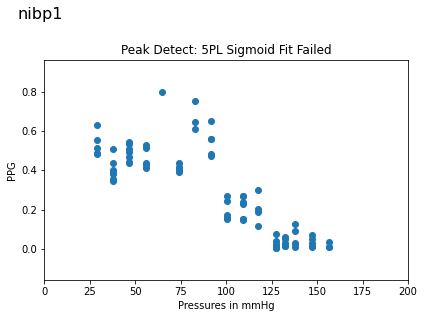

5tttttttttttttttttttttttttttt5
210716BP:
210716BP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    28.803463  1.056816  1.032768  ...  0.005378  0.382306  0.996674
1    37.843483  1.007394  1.003936  ...  0.004461  0.276470  0.967883
2    46.665058  1.110324  1.106211  ...  0.006315  0.391977  0.974177
3    55.783630  0.942560  0.953738  ...  0.004752  0.293558  0.986169
4    65.121391  0.929023  0.931044  ...  0.005173  0.307494  0.959375
5    73.775635  0.996122  1.005853  ...  0.005496  0.318187  0.945809
6    82.912834  0.770928  0.774018  ...  0.004500  0.254265  0.930239
7    91.596939  0.353718  0.350985  ...  0.002705  0.155493  0.755461
8   100.293587  0.206623  0.213739  ...  0.001692  0.080285  0.549100
9   108.978432  0.153458  0.153102  ...  0.000882  0.052280 -0.183815
10  117.864471  0.071347  0.076436  ...  0.000105  0.028231 -0.061758
11  128.037384  0.072129  0.062669  ...  0.000159  0.026840 -0.471741
12  132.778992  0.090380  0.043791  ... 

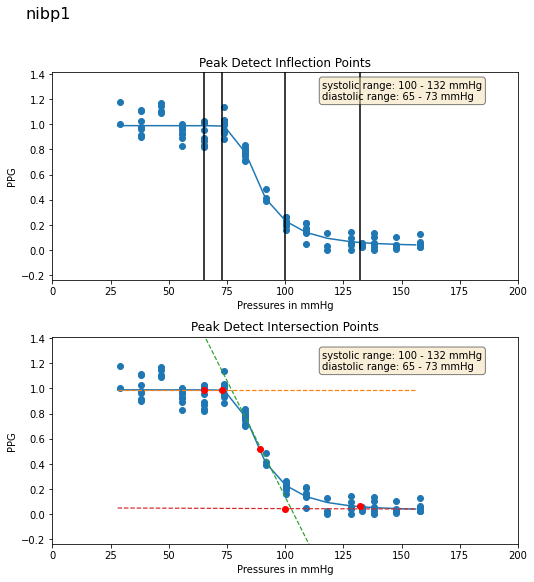

210819BP:
210819BP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    28.806604  0.726219  0.724264  ...  0.005729  0.382233  0.938006
1    36.156925  0.654076  0.654562  ...  0.005102  0.323679  0.943804
2    43.063614  0.628068  0.633234  ...  0.004780  0.311283  0.946156
3    50.138500  0.764593  0.775597  ...  0.005571  0.352356  0.927502
4    58.564835  0.534705  0.533893  ...  0.005555  0.368125  0.896629
5    65.221443  0.530097  0.519736  ...  0.005636  0.354465  0.814487
6    71.624580  0.487200  0.489695  ...  0.004258  0.275985  0.764950
7    79.032921  0.417792  0.408088  ...  0.004073  0.262184  0.756915
8    86.818604  0.283824  0.302637  ...  0.002243  0.156829  0.625709
9    94.157791  0.166338  0.144939  ...  0.001289  0.091947  0.127197
10  100.336349  0.277135  0.241519  ...  0.001170  0.144445 -0.460852
11  108.453629  0.123730  0.132063  ...  0.000346  0.065034 -0.517067
12  113.036232  0.087673  0.079712  ...  0.000368  0.047764 -0.465791
1

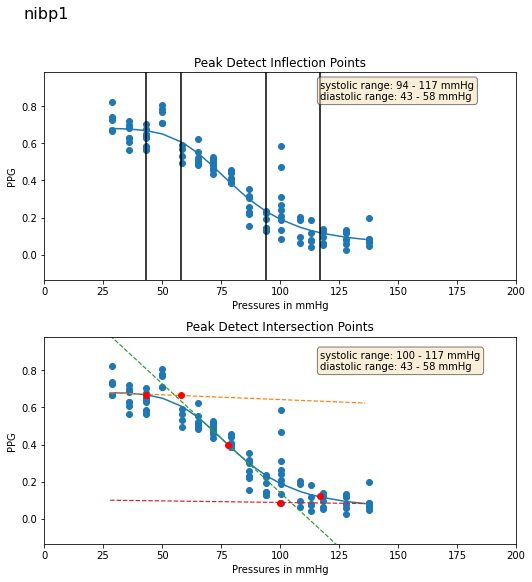

In [ ]:
patients=[]
lsys=[]
na=[]
d1=[]
d2=[]
d0=[]
d02=[]
d08=[]
d015=[]
d3=[]
d4=[]
d5=[]
d6=[]
d7=[]
d8=[]
d9=[]
d10=[]
d11=[]
d12=[]
d13=[]
d14=[]
d15=[]
d16=[]
d17=[]
d18=[]
d19=[]
d20=[]
d21=[]
d22=[]
folder = '/content/drive/MyDrive/data40/sphygmo/'
for patient in [x for x in os.listdir(folder)if x.find('P')!=-1]:
# for patient in ['210724AP']:
  nibp = NIBPProcessor(folder+patient+'/nibp1.txt')
  nibp.save_peak_locations()
  nibp.detect_plateaus()
  print(f'{patient}:')
  ita1, sys1 = nibp.compute_ita()
  # print(f'{patient}: {sys1}')
  patients.append(patient)
  lsys.append(sys1)
  nibp.fitting(folder+patient+'/nibp1.txt',patient)

rangedf = pd.DataFrame()  
dia_fin = pd.DataFrame()  
dia_fin['patient']=na
dia_fin['d1']=d1
dia_fin['d2']=d2
# dia_fin['d0']=d0
dia_fin['d02']=d02
dia_fin['d08']=d08
dia_fin['d015']=d015
dia_fin['d3']=d3
dia_fin['d4']=d4
dia_fin['d5']=d5
dia_fin['d6']=d6
dia_fin['d7']=d7
dia_fin['d8']=d8
dia_fin['d9']=d9
dia_fin['d10']=d10
dia_fin['d11']=d11
dia_fin['d12']=d12
dia_fin['d13']=d13
dia_fin['d14']=d14
dia_fin['d15']=d15
dia_fin['d16']=d16
dia_fin['d17']=d17
dia_fin['d18']=d18
dia_fin['d19']=d19
dia_fin['d20']=d20
dia_fin['d21']=d21
# dia_fin['d22updated']=d22
save_df(dia_fin, 'diastolica.csv')
# rangedf['Low_sys']=lsys


In [ ]:
len(d0)

42

if you need  outlier removal by 2sd on both op and op_new- search for zscore and uncomment them and also, search for threshold and use the op_new1 for threshold1,2 and threshold.(uncomment those 3 lines.

FOr now it doesnt use outlier removal and also thresholds are wrt the whole data op

NOTE: Extra d0=[], d08, and d015 lists is added for min correlation >=0.89 0.95 or 0.98 for LDP if possible



In [ ]:
class NIBPProcessor(object):
 
  def __init__(self, filepath=''):
    time, ch1, ch2, ch3= np.loadtxt(filepath, dtype=('f4, f4, f4, f4'),unpack=True,delimiter = '\t')
    ip = pd.DataFrame()
    ip['time'] = time
    ip['ref_ppg'] = ch2 + 4
    ip['occ_ppg'] = ch3 + 4
    ip['pressure'] = ch1
    self.ip = ip
    self.op=0
    self.op_new=0
    self.op_new1=0
    self.op_new2=0


  
  
  def save_peak_locations(self):
    self.ip['ref_peaks'],ref_wid, inxref,inx1ref = peak_and_valley_detect(self.ip['ref_ppg'])
    self.ip['occ_peaks'],occ_wid, inxocc, inx1occ = peak_and_valley_detect(self.ip['occ_ppg'], prominence=0.00005)

    self.ip['std']= self.ip['occ_ppg'].rolling(2000).std()
    self.ip['stdr']= self.ip['ref_ppg'].rolling(2000).std()
    self.ip['occ1d'] = np.gradient(self.ip['occ_ppg'].values,100)
    self.ip['occ1d_peaks'] = peak_detect(self.ip['occ1d'])
    self.ip['ref1d'] = np.gradient(self.ip['ref_ppg'].values)
    self.ip['ref1d_peaks'] = peak_detect(self.ip['ref1d'])

  def detect_plateaus(self):
    plateau_width = 3000
    # Making a list of plateaus
    hts = np.linspace(0.0001, 1, 100)
    peaks, _ = find_peaks(self.ip['pressure'], width=plateau_width)

    plateaus = []
    for peak in peaks:
      for ht in hts:
        width, height, left, right = peak_widths(self.ip['pressure'], np.array([peak]), rel_height=ht)
        if width > plateau_width:
          break
      plateaus.append(self.ip.loc[left[0]:right[0]])
    # Finding mean pressure for each plateau
    mean_pressures = []
    mean_occppg=[]
    mean_refppg=[]
    for plateau in plateaus:
      # plateau.drop(plateau.head(1000).index, inplace=True) 
      # plateau.drop(plateau.tail(500).index, inplace=True)
      mean_pressures.extend([plateau['pressure'].mean()] * len(plateau))
      mean_occppg.extend([plateau[plateau['occ_peaks']>0]['occ_peaks'].median()] * len(plateau))
      mean_refppg.extend([plateau[plateau['ref_peaks']>0]['ref_peaks'].median()] * len(plateau))

    self.ip = pd.concat(plateaus)
    self.ip['mean_pressure'] = mean_pressures
    self.ip['mean_occppg'] = mean_occppg
    self.ip['mean_refppg'] = mean_refppg
    self.ip = self.ip[np.invert(self.ip.index.duplicated())]
    return plateaus
  


  def separate_into_cycles(self, ppg='ref', separate_by_peak=True):
    detected_plateaus = self.ip['mean_pressure'].reindex(self.ip.index, fill_value=0).values

    # Making a list of occ ppg cycles
    cycles = []
    peaks = (self.ip[self.ip[f'{ppg}_peaks'] > 0].index).tolist()
    valleys = (self.ip[self.ip[f'{ppg}_peaks'] < 0].index).tolist()

    separator = peaks if separate_by_peak else valleys
    not_separator = valleys if separate_by_peak else peaks
    for i in range(1, len(separator)):
      # if (not_separator[i]>separator[i-1])&(not_separator[i]<separator[i]):
      cycles.append(self.ip.loc[separator[i - 1]:separator[i]])
    # to check if there are cycles with no valleys in between in ref arm, such cycles are ignored.
    cycles = [cycle for cycle in cycles if len(np.where((not_separator>cycle.index[0])&(not_separator<cycle.index[-1]))[0]) != 0]
    begin = self.ip.loc[:separator[0]]
    return cycles



  def separate_into_occcycles(self):
    detected_plateaus = self.ip['mean_pressure'].reindex(self.ip.index, fill_value=0).values

    # Making a list of occ ppg cycles
    cycles = []
    peaks = (self.ip[self.ip['occ_peaks'] > 0].index).tolist()
    for i in range(1, len(peaks)):
      cycles.append(self.ip.loc[peaks[i - 1]:peaks[i]])
    # to check if there are cycles with no valleys in between in ref arm, such cycles are ignored.
    cycles = [cycle for cycle in cycles if len(cycle[(cycle['occ_peaks'] < 0)]) != 0]
    begin = self.ip.loc[:peaks[0]]
    return cycles
    
  

  def separate_into_refcycles(self):

    detected_plateaus = self.ip['mean_pressure'].reindex(self.ip.index, fill_value=0).values

    # Making a list of ref ppg cycles
    cycles = []
    valleys = (self.ip[self.ip['ref_peaks'] < 0].index).tolist()
    for i in range(1, len(valleys)):
      cycles.append(self.ip.loc[valleys[i - 1]:valleys[i]])
    # to check if there are cycles with no peaks in between in ref arm, such cycles are ignored.
    cycles = [cycle for cycle in cycles if len(cycle[(cycle['ref_peaks'] > 0)]) != 0]
    begin = self.ip.loc[:valleys[0]]
    return cycles

    

  def compute_ita(self):
    ita=[]
    cycle_pressure=[]
    cycles = self.separate_into_occcycles()
    for i,cycle in enumerate(cycles):
      if (cycle ['mean_pressure'].values[0] == cycle['mean_pressure'].values).all():
        tt1=cycle[cycle['occ_peaks']>0]['time'].values[0]
        pp1=cycle[cycle['occ_peaks']>0]['occ_peaks'].values[0]

        tt2=cycle[cycle['occ_peaks']<0]['time'].values[0]
        pp2=cycle[cycle['occ_peaks']<0]['occ_peaks'].values[0]

        tt3=cycle[cycle['occ_peaks']>0]['time'].values[-1]
        pp3=cycle[cycle['occ_peaks']>0]['occ_peaks'].values[-1]

        cycle_pressure.append(cycle['mean_pressure'].values[0])

        tt4=tt2-tt1
        tt5=tt3-tt2
        ita_cycle=(0.5*( (pp1*tt5) + (pp3*tt4)))
        ita.append(ita_cycle)

    itapd = pd.DataFrame()
    itapd['ita']=ita
    itapd['pressure']=cycle_pressure
    threshold = itapd['ita'].max()/50

    if len(itapd[itapd['ita']<threshold])!=0:
      first_zero = itapd[itapd['ita']<threshold]['pressure'].min()
    else:
      first_zero = itapd[itapd['ita']==(itapd['ita'].min())]['pressure'].min()
    return itapd, first_zero

  def fit_sigmoid(self, data, x, y):
    (a, b, c, d, e), _ = curve_fit(sigmoid_5pl, data[x], data[y], maxfev=5000)
    
    data['fit'] = sigmoid_5pl(data[x], a, b, c, d, e)
    # save_df(self.op, '_profile_pd.csv')

    fit = pd.DataFrame()
    fit['x'] = list(range(int(data[x].min()), int(data[x].max())))
    fit['y'] = np.interp(fit['x'], data[x], data['fit'])
    order = (fit['x'].max() - fit['x'].min()) / 10
    fit['d1'] = np.gradient(gaussian_filter1d(fit['y'], order))
    fit['d2'] = np.gradient(fit['d1'])
    return fit

  def fitting(self,input_file='', name=''):
    amplitude = []
    cycle_pressure = []
    plateau_pressure = []
    ref_amplitude = []
    # na=[]
    na.append(name)
    print(name)

    stdev = []
    auc = []
    occ1d = []
    delay = []
    ref_auc = []
    vol = []
    ref_vol = []
    full_auc = []
    corr=[]
    auc_r=[]
    list_pres=[]
    list_ratio=[]
    list_cor=[]
    list_amp=[]
    list_amponly=[]
    cycles = self.separate_into_refcycles()
    # added 24th
    diast=0
    upd=0
    upd1=0
    diamax=0
    diafinal=0
    auci=0
    refi=0
    ai=0
    for i in range(len(cycles)):
      if (cycles[i]['mean_pressure'].values[0] == cycles[i]['mean_pressure'].values).all():
        stdev.append(cycles[i]['std'].values[0])
        c,v=scipy.stats.pearsonr(cycles[i]['ref_ppg'], cycles[i]['occ_ppg'])
        corr.append (c )
        ref_amplitude.append(
          cycles[i][(cycles[i]['ref_peaks'] >0)]['ref_peaks'].values[0])
        ri=(cycles[i][(cycles[i]['ref_peaks'] >0)]['ref_peaks'].values[0])
        plateau_pressure.append(cycles[i]['mean_pressure'].values[0])
        ppi=(cycles[i]['mean_pressure'].values[0])
        cycle_pressure.append(cycles[i]['pressure'].mean())
        max = cycles[i]['occ_ppg'].values.max()
        maxref = cycles[i]['ref_ppg'].values.max()
        min = cycles[i]['occ_ppg'].values.min()
        minref = cycles[i]['ref_ppg'].values.min()
        delay_samples = abs(cycles[i][cycles[i]['ref_ppg']==maxref].index[0] - cycles[i][cycles[i]['occ_ppg']==max].index[0])
        # dich_inx = cycles[i][cycles[i]['ref1d_peaks']>0].index[-1]+delay_samples
        ref_inx = np.sort(np.array([cycles[i][cycles[i]['ref_ppg']==maxref].index[0],cycles[i][cycles[i]['ref_ppg']==minref].index[0]]))
        occ_inx = np.sort(np.array([cycles[i][cycles[i]['occ_ppg']==max].index[0],cycles[i][cycles[i]['occ_ppg']==min].index[0]]))
        # amplitude.append(max - cycles[i]['occ_ppg'].min())
        # ai=(max - cycles[i]['occ_ppg'].max())
        delay.append(delay_samples)
        occ1d.append(cycles[i]['occ1d'].max())
        auc.append((cycles[i].loc[:cycles[i][cycles[i]['occ_ppg']==max].index[0]]['occ_ppg'].values - cycles[i]['occ_ppg'].min()).sum())
        auci=((cycles[i].loc[:cycles[i][cycles[i]['occ_ppg']==max].index[0]]['occ_ppg'].values - cycles[i]['occ_ppg'].min()).sum())

        full_auc.append((cycles[i]['occ_ppg'].values - cycles[i]['occ_ppg'].min()).sum())
        ref_auc.append((cycles[i].loc[:cycles[i][cycles[i]['ref_ppg']==maxref].index[0]]['ref_ppg'].values - cycles[i]['ref_ppg'].min()).sum())
        refi=((cycles[i].loc[:cycles[i][cycles[i]['ref_ppg']==maxref].index[0]]['ref_ppg'].values - cycles[i]['ref_ppg'].min()).sum())
        vol.append((cycles[i].loc[occ_inx[0]:occ_inx[1]]['occ_ppg'].values - min).sum())
        ref_vol.append((cycles[i].loc[ref_inx[0]:ref_inx[1]]['ref_ppg'].values - minref).sum())




        if len(cycles[i][(cycles[i]['occ_peaks'] >0)]) != 0:
          ai=cycles[i][(cycles[i]['occ_peaks'] >0)]['occ_peaks'].values[0]
          amplitude.append(
            cycles[i][(cycles[i]['occ_peaks'] >0)]['occ_peaks'].values[0])
        else:
          ai=0
          amplitude.append(0)

        auc_r=(np.divide(auci,refi))
        amp_r=(np.divide(ai,ri))

        # if(c>=0):
        # print(ppi, auc_r)
        list_pres.append(ppi)
        list_ratio.append(auc_r)
        list_amp.append(amp_r)
        list_cor.append(c)
        list_amponly.append(ai)

    


    # Putting the output variables in anot
    op = pd.DataFrame()
    op['plateau_pressure'] = plateau_pressure
    op['amplitude'] = amplitude
    op['cycle_pressure'] = cycle_pressure
    op['ref_amplitude'] = ref_amplitude
    op['ratio'] = np.divide(np.array(amplitude), np.array(ref_amplitude))


    op['stdev'] = stdev
    op['auc'] = auc
    op['occ1d'] = occ1d
    op['delay'] = delay
    op['ref_auc'] = ref_auc
    op['vol'] = vol
    op['ref_vol'] = ref_vol
    op['full_auc'] = full_auc
    op['occ_radius'] = np.sqrt(np.divide(op['auc'].values, np.ones(len(op))*np.pi))
    op['ref_radius'] = np.sqrt(np.divide(op['ref_auc'].values, np.ones(len(op))*np.pi))
    op['auc_ratio'] = np.divide(op['auc'].values, op['ref_auc'])
    op['corr']=corr

    op_new = pd.DataFrame()
    op_new['ppi']= list_pres
    op_new['aucr']=list_ratio
    op_new['ampr']=list_amp
    op_new['corl']=list_cor
    op_new['amponly']=list_amponly
    # op_new = op_new[(np.abs(stats.zscore(op_new)) < 2).all(axis=1)]
    op_new = op_new.sort_values('ppi')
    self.op_new=op_new

    op_new1=pd.DataFrame()
    

    op_new2=pd.DataFrame()
    

    # Removing outliers (helps fitting)
    # op = op[(np.abs(stats.zscore(op)) < 2).all(axis=1)]
    op = op.sort_values('plateau_pressure')
    self.op=op

    threshold = np.max(op.groupby('plateau_pressure').mean()['auc_ratio'].values)
    threshold1 = np.max(op.groupby('plateau_pressure').mean()['ratio'].values)
    threshold2 = np.max(op.groupby('plateau_pressure').mean()['amplitude'].values)
    # bins = 4
    # threshold= np.quantile(op['corr'],(bins-1)/bins)
    # sys=op[op['corr']==np.min(op['corr'])]['plateau_pressure'].min()
    # dia1= op[op['plateau_pressure']<sys][op['corr']>=threshold]['plateau_pressure'].max()
    # dia2= op[op['plateau_pressure']>dia1]['plateau_pressure'].values[0]
    n=pd.DataFrame()
    pr=[]
    co=[]
    ampi=[]
    cori=[]
    ari=[]
    amponlyi=[]
    cormin=[]

    n['P']=np.unique(nibp.op['plateau_pressure'].values)
    pr=np.unique(nibp.op['plateau_pressure'])
    # n['corr']=nibp.op.groupby('plateau_pressure').max()['corr'].values
    n['corr']=nibp.op.groupby('plateau_pressure').mean()['corr'].values
    # co=nibp.op.groupby('plateau_pressure').max()['corr']
    co=nibp.op.groupby('plateau_pressure').mean()['auc_ratio']
    co2=nibp.op.groupby('plateau_pressure').min()['auc_ratio']
    co3=nibp.op.groupby('plateau_pressure').max()['auc_ratio']
    co4=nibp.op.groupby('plateau_pressure').median()['auc_ratio']
    de=nibp.op.groupby('plateau_pressure').min()['delay']
    de1=nibp.op.groupby('plateau_pressure').max()['delay']
    de2=nibp.op.groupby('plateau_pressure').mean()['delay']
    de3=nibp.op.groupby('plateau_pressure').median()['delay']
    ard=list(zip(pr,de))
    ard1=list(zip(pr,de1))
    ard2=list(zip(pr,de2))
    ard3=list(zip(pr,de3))
    ar=list(zip(pr,co))
    ar2=list(zip(pr,co2))
    ar3=list(zip(pr,co3))
    ar4=list(zip(pr,co4))
    pr=[]
    
    prppi=np.unique(op_new['ppi'])
    try:
      ari=nibp.op_new.groupby('ppi').mean()['aucr'].values
      cori=nibp.op_new.groupby('ppi').mean()['corl'].values
      cormin=nibp.op_new.groupby('ppi').min()['corl'].values
      ampi=nibp.op_new.groupby('ppi').mean()['ampr'].values
      amponlyi=nibp.op_new.groupby('ppi').mean()['amponly'].values
    except:
      ari=[]
      cori=[]
      ampi=[]
      amponlyi=[]
      cormin=[]
    
    
    # threshold = np.max(ari)
    # threshold1 = np.max(ampi)
    # threshold2 = np.max(amponlyi)



    op_new1['ppi']= prppi
    op_new1['aucr']=ari
    op_new1['corl']=cori
    op_new1['ampr']=ampi
    op_new1['amponly']=amponlyi
    op_new1['cormin']=cormin
    self.op_new1=op_new1
    print(op_new1)
    
    # d1=[]
    # d2=[]
    # d3=[]
    # d4=[]
    # d5=[]
    # d6=[]
    # d7=[]
    # d8=[]
    # d9=[]
    # d10=[]
    # d11=[]
    # d12=[]
    # d13=[]
    # d14=[]
    # d15=[]
    # d16=[]
    # d17=[]
    # d18=[]
    # d19=[]
    # d20=[]
    # d21=[]
    # d22=[]

    try:

      print("--------threshold----------")
      print(threshold)
      print(threshold*0.9)
      print('\n')
      diast1=op_new1[op_new1['corl']>=0.89]['ppi'].max()
      diast2=op_new1[op_new1['cormin']>=0.89]['ppi'].max()
      print("-----based on corr>0.89-----")
      d1.append(diast1)
      d0.append(diast2)
      print(diast1)
      print(diast2)
      # op_new2['patient']=na
      # op_new2['d1']=d1
      print('\n')
      print("-----based on auc ratio-----")
      d2.append(op_new1[op_new1['aucr']>=threshold*0.7]['ppi'].max())
      # op_new2['d2']=d2
      print(threshold*0.7)
      print('\n')
      print("-----based on amp ratio-----")
      d3.append(op_new1[op_new1['ampr']>=threshold1*0.7]['ppi'].max())
      # op_new2['d3']=d3
      print(threshold1*0.7)
      print('\n')
      print("-----based on amponly -----")
      d4.append(op_new1[op_new1['amponly']>=threshold2*0.7]['ppi'].max())
      # op_new2['d4']=d4
      print(threshold2*0.7)
      print('\n')
      print("-----based on amp ratio and corr-----")
      d5.append(op_new1[(op_new1['ampr']>=threshold1*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d5']=d5
      print(op_new1[(op_new1['ampr']>=threshold1*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      print('\n')
      print("-----based on auc ratio and corr-----")
      d6.append(op_new1[(op_new1['aucr']>=threshold*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      print(op_new1[(op_new1['aucr']>=threshold*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d6']=d6
      print('\n')
      print("-----based on amp and corr-----")
      d7.append(op_new1[(op_new1['amponly']>=threshold2*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      print(op_new1[(op_new1['amponly']>=threshold2*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      print(threshold2*0.7)
      print(op_new1[(op_new1['amponly']>=threshold2*0.7)]['ppi'].max())
      print(op_new1[ (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d7']=d7
      print('\n')


      print('\n')
      print("--------NEW PARAMS I----------")
      print("---threshold----")
      print(threshold)
      print(threshold*0.9)
      print('\n')
      diast=op_new1[op_new1['corl']>=0.95]['ppi'].max()
      diast3=op_new1[op_new1['cormin']>=0.95]['ppi'].max()
      print("-----based on corr>0.95-----")
      d8.append(diast)
      d08.append(diast3)
      print(diast)
      # op_new2['d8']=d8
      print('\n')
      print("-----based on auc ratio-----")
      d9.append(op_new1[op_new1['aucr']>=threshold*0.75]['ppi'].max())
      # op_new2['d9']=d9
      print(threshold*0.75)
      print('\n')
      print("-----based on amp ratio-----")
      d10.append(op_new1[op_new1['ampr']>=threshold1*0.75]['ppi'].max())
      # op_new2['d10']=d10
      print(threshold1*0.75)
      print('\n')
      print("-----based on amponly -----")
      d11.append(op_new1[op_new1['amponly']>=threshold2*0.75]['ppi'].max())
      # op_new2['d11']=d11
      print(threshold2*0.75)
      print('\n')
      print("-----based on amp ratio and corr-----")
      d12.append(op_new1[(op_new1['ampr']>=threshold1*0.75) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d12']=d12
      print('\n')
      print("-----based on auc ratio and corr-----")
      d13.append(op_new1[(op_new1['aucr']>=threshold*0.75) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d13']=d13
      print('\n')
      print("-----based on amp and corr-----")
      d14.append(op_new1[(op_new1['amponly']>=threshold2*0.75) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d14']=d14
      print('\n')

      print('\n')
      print("--------NEW PARAMS II----------")
      print("--------threshold----------")
      print(threshold)
      print(threshold*0.9)
      print('\n')
      diast=op_new1[op_new1['corl']>=0.98]['ppi'].max()
      diast4=op_new1[op_new1['cormin']>=0.98]['ppi'].max()
      print("-----based on corr>0.98-----")
      d15.append(diast)
      d015.append(diast4)
      # op_new2['d15']=d15
      print('\n')
      print("-----based on auc ratio-----")
      d16.append(op_new1[op_new1['aucr']>=threshold*0.68]['ppi'].max())
      # op_new2['d16']=d16
      print(threshold*0.68)
      print('\n')
      print("-----based on amp ratio-----")
      d17.append(op_new1[op_new1['ampr']>=threshold1*0.68]['ppi'].max())
      # op_new2['d17']=17
      print(threshold1*0.68)
      print('\n')
      print("-----based on amponly -----")
      d18.append(op_new1[op_new1['amponly']>=threshold2*0.68]['ppi'].max())
      # op_new2['d18']=d18
      print(threshold2*0.68)
      print('\n')
      print("-----based on amp ratio and corr-----")
      d19.append(op_new1[(op_new1['ampr']>=threshold1*0.68) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d19']=d19
      print('\n')
      print("-----based on auc ratio and corr-----")
      d20.append(op_new1[(op_new1['aucr']>=threshold*0.68) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d20']=d20
      print('\n')
      print("-----based on amp and corr-----")
      d21.append(op_new1[(op_new1['amponly']>=threshold2*0.68) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d21']=d21
      print('\n')


    except:
      print("except for this patient")



    # for i in range (1,len(ar)):
    #   pr.append((ar[i][0], ar[i][1]-ar[i-1][1]))
    # n1=[i for i, j in pr]
    # n2=[j for i, j in pr]
    # da=pd.DataFrame()
    # da['pres']=n1
    # n2=[x * 100 for x in n2]
    # da['cor']=n2
    # dia1=da[abs(da['cor'])>5]['pres'].values[0]
    # dia2=da[(da['pres'])<dia1]['pres'].values[-1]
    # print(dia1,dia2)
    # [print(x) for x in ar]
    # print("-------*mean")
    # print('\n')
    # [print(x) for x in ar2]
    # # scatter(n['P'],n['corr'])
    # print("-------**min")
    # [print(x) for x in ar3]
    # # [print(x) for x in pr]
    # print("-------***max")
    # [print(x) for x in ar4]
    # [print(x) for x in pr]
    # print("-------***median")
    # [print(x) for x in ard]
    # print("-------****min")
    # [print(x) for x in ard1]
    # print("-------****max")
    # [print(x) for x in ard2]
    # print("-------****mean")
    # [print(x) for x in ard3]
    # print("-------****meadian")
    # print (diast)
    # print("updated dia:")






    try:
      (a, b, c, d, e), _ = curve_fit(sigmoid_5pl, self.op['plateau_pressure'], self.op['auc_ratio'], maxfev=5000)
      print("5tttttttttttttttttttttttttt5555555tt5")
    except:
      w = plt.scatter(self.op['plateau_pressure'], self.op['auc_ratio'])
      plt.subplots_adjust(bottom=0.3)
      plt.gcf().text(0.05, 1.05, input_file.split('/')[-1].split('.')[0], fontsize=16)

      axes = plt.gca()
      num = (self.op['auc_ratio'].max()-self.op['auc_ratio'].min())/5
      axes.set_ylim([self.op['auc_ratio'].min()-num, self.op['auc_ratio'].max()+num])
      axes.set_xlim([0, 200])

      plt.xlabel('Pressures in mmHg');
      plt.ylabel('PPG');
      plt.title('Peak Detect: 5PL Sigmoid Fit Failed')
      plt.savefig(input_file[:-4]+'_pd.png')
      plt.tight_layout(h_pad=1)
      plt.show()
      print("5tttttttttttttttttttttttttttt5")
      return [np.nan, np.nan, np.nan, np.nan], [np.nan, np.nan, np.nan, np.nan]
    print("5tttt66666666666666666666666666tttttttttttttttttttttt5555555tt5")
    self.op['fit'] = sigmoid_5pl(self.op['plateau_pressure'], a, b, c, d, e)
    # save_df(self.op, '_profile_pd.csv')
    
    print("55")

    fit = pd.DataFrame()
    fit['x'] = list(range(int(self.op['plateau_pressure'].min()), int(self.op['plateau_pressure'].max())))
    fit['y'] = np.interp(fit['x'], self.op['plateau_pressure'], self.op['fit'])
    order = (fit['x'].max() - fit['x'].min()) / 10
    fit['d1'] = np.gradient(gaussian_filter1d(fit['y'], order))
    fit['d2'] = np.gradient(fit['d1'])
    # save_df(fit, '_slopes_pd.csv')

    temp = pd.DataFrame()
    temp['pressures'] = np.sort(list(set(op['plateau_pressure'])))
    temp['variances'] = [self.op[self.op['plateau_pressure'] == pressure]['auc_ratio'].var() for pressure in temp['pressures']]
    temp['median'] = [self.op[self.op['plateau_pressure'] == pressure]['auc_ratio'].median() for pressure in temp['pressures']]
    print("66")
    plt.figure(figsize=(7.5, 7.5))
    print("77")
    # Max and min of 2nd derivative
    up_dias = fit[fit['d2'] == fit['d2'].min()]['x'].values[0]
    low_sys = fit[fit['d2'] == fit['d2'].max()]['x'].values[0]
    print("88")
    # nearest cuff pressure value
    temp['up_dias_diff'] = abs(temp['pressures'].values-up_dias)
    temp['low_sys_diff'] = abs(temp['pressures'].values-low_sys)
    up_dias = int(temp[temp['up_dias_diff']==temp['up_dias_diff'].min()]['pressures'].values[0])
    low_sys = int(temp[temp['low_sys_diff']==temp['low_sys_diff'].min()]['pressures'].values[0])
    print("99")
    x = temp[temp['pressures'] < up_dias]
    try:
      # take last values with median below fit line before up_dias
      low_dias = int(x[x['median']<fit['y'].max()]['pressures'].values[-1])
    except:
      if len(x)==0:
        # there are no pressure values below up_dias
        low_dias = up_dias
      else:
        # in case of no median below fit, take the lowest point
        low_dias = int(x[x['median']==x['median'].min()]['pressures'].values[0])
    x = temp[(temp['pressures']- low_sys)>1]
    print("99999")
    try:
      up_sys = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])
    except:
      # there are no values greater than low_sys
      up_sys = low_sys

    infls = [low_dias, up_dias, low_sys, up_sys]
    upd1=up_dias
    # print(upd1)
    # print("f")
    plt.subplot(2, 1, 1)
    print("5445")
    w = plt.scatter(self.op['plateau_pressure'], self.op['auc_ratio'])
    plt.plot(fit['x'], fit['y'])
    for i, inf in enumerate(infls, 1):
      plt.axvline(x=inf, color='k', label=f'Inflection Point {i}')

    textstr = 'systolic range: ' + str(low_sys) + ' - ' + str(up_sys) + ' mmHg\ndiastolic range: ' + str(
      low_dias) + ' - ' + str(up_dias) + ' mmHg'
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    plt.gcf().text(0.6, 0.9, textstr, fontsize=10, bbox=props)

    axes = plt.gca()
    num = (self.op['auc_ratio'].max()-self.op['auc_ratio'].min())/5
    axes.set_ylim([self.op['auc_ratio'].min()-num, self.op['auc_ratio'].max()+num ])
    axes.set_xlim([0, 200])

    plt.xlabel('Pressures in mmHg');
    plt.ylabel('PPG');
    plt.title('Peak Detect Inflection Points')
    print("5    5")
    # Intersection of lines through max, min, infl of fit
    try:
      infl = [x for x in fit[np.sign(fit['d2']).diff() != 0]['x'].values if (x > up_dias) & (x < low_sys)][0]
    except:
      plt.subplot(2,1,2)
      w = plt.scatter(self.op['plateau_pressure'], self.op['auc_ratio'])
      plt.subplots_adjust(bottom=0.3)
      plt.gcf().text(0.05, 1.05, input_file.split('/')[-1].split('.')[0], fontsize=16)

      axes = plt.gca()
      num = (self.op['auc_ratio'].max()-self.op['auc_ratio'].min())/5
      axes.set_ylim([self.op['auc_ratio'].min()-num, self.op['auc_ratio'].max()+num ])
      axes.set_xlim([0, 200])

      plt.xlabel('Pressures in mmHg');
      plt.ylabel('PPG');
      plt.title('Peak Detect: Intersection Failed')    
      plt.tight_layout(h_pad=1)
      plt.savefig(input_file[:-4]+'_pd.png')
      plt.show()
      return infls, [np.nan, np.nan, np.nan, np.nan]
    print("5ffrf5")
    x1_high = fit['x'].min()
    y1_high = fit[fit['x'] == fit['x'].min()]['y'].values[0]
    # m_high = fit[fit['x'] == fit['x'].min()]['d1'].values[0]
    m_high= (fit[fit['x'] == fit['x'].min()+10]['y'].values[0] -y1_high)/10
    fit['line_high'] = (fit['x'] - x1_high) * m_high + y1_high

    # x1_infl = infl
    # y1_infl = fit[fit['x'] == infl]['y'].values[0]
    # m_infl = fit[fit['x'] == infl]['d1'].values[0]
    # fit['line_infl'] = (fit['x'] - x1_infl) * m_infl + y1_infl

    x1 = infl-5
    y1 = fit[fit['x'] == (infl-5)]['y'].values[0]
    # m = fit[fit['x'] == infl]['d1'].values[0]
    m=  (fit[fit['x'] == (infl+5)]['y'].values[0] - y1)/10
    # m= fit['d1'].min()
    # m = fit[fit.index==fit[fit['x']==infl].index[0]+10]['d1'].values[0]
    # print(m)
    fit['line_infl'] = (fit['x'] - x1) * m + y1

    x1_low = fit['x'].max()
    y1_low = fit[fit['x'] == fit['x'].max()]['y'].values[0]
    m_low = fit[fit['x'] == fit['x'].max()]['d1'].values[0]
    fit['line_low'] = (fit['x'] - x1_low) * m_low + y1_low

    plt.subplot(2, 1, 2)
    w = plt.scatter(self.op['plateau_pressure'], self.op['auc_ratio'])
    plt.plot(fit['x'], fit['y'])
    plt.plot(fit['x'], fit['line_high'], '--', linewidth=1.2)
    plt.plot(fit['x'], fit['line_infl'], '--', linewidth=1.2)
    plt.plot(fit['x'], fit['line_low'], '--', linewidth=1.2)

    plt.plot(infl, fit[fit['x'] == infl]['y'].values[0], 'ro')
    print("5tttttttt5")
    try:
      idx1 = np.argwhere(np.diff(np.sign(fit['line_high'] - fit['line_infl']))).flatten()[0]
    except:
      # there's no intersection
      idx1 = 0
    up_dias = fit['x'].values[idx1] 
    try:
      idx2 = np.argwhere(np.diff(np.sign(fit['line_infl'] - fit['line_low']))).flatten()[0]    
    except:
      # there's no intersection
      idx2 = -1
    low_sys = fit['x'].values[idx2]
    print("dewdew55")
    # take nearest cuff pressure value
    temp['up_dias_diff'] = abs(temp['pressures'].values-up_dias)
    temp['low_sys_diff'] = abs(temp['pressures'].values-low_sys)
    up_dias = int(temp[temp['up_dias_diff']==temp['up_dias_diff'].min()]['pressures'].values[0])
    low_sys = int(temp[temp['low_sys_diff']==temp['low_sys_diff'].min()]['pressures'].values[0])

    plt.plot(up_dias, fit['line_high'].values[idx1], 'ro')
    plt.plot(low_sys, fit['line_low'].values[idx2], 'ro')

    

    x = temp[temp['pressures'] < up_dias]
    try:
      # take last values with median below fit line before up_dias
      low_dias = int(x[x['median']<fit['y'].max()]['pressures'].values[-1])
    except:
      if len(x)==0:
        # there are no pressure values below up_dias
        low_dias = up_dias
      else:
        # in case of no median below fit, take the lowest point
        low_dias = int(x[x['median']==x['median'].min()]['pressures'].values[0])
    x = temp[(temp['pressures']-low_sys)>1]
    # added 24th
    print("5errrrrrr5")
    upd=up_dias
    diafinal=0
    print(",,,,,,,,")
    dialist=[]
    dialist2=[]
    dialist.append(diast1)
    dialist.append(upd)
    dialist.append(upd1)
    # print(dialist)
    diamax= ((np.max(dialist)))
    print("=====")
    print(diamax)
    try:
      up_sys = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])
    except:
      # no values greater than low_sys
      up_sys = low_sys
    # added 24th
    if (diamax<up_sys):
      print("qqqqq")
      print(diamax)
      diafinal=diamax
    else:
      print("eeeee")
      dialist2.append(upd)
      dialist2.append(upd1)
      print(np.max(dialist2))
      diafinal=np.max(dialist2)
    # op_new2['d22updated']=diafinal
    d22.append(diafinal)
    print(diafinal)
    self.op_new2=op_new2
    
    
    
    

    plt.plot(low_dias, fit[fit['x'] > low_dias]['y'].max(), 'ro')
    plt.plot(up_sys, fit[fit['x'] < up_sys]['y'].min(), 'ro')

    textstr = 'systolic range: ' + str(low_sys) + ' - ' + str(up_sys) + ' mmHg\ndiastolic range: ' + str(
      low_dias) + ' - ' + str(up_dias) + ' mmHg'
    plt.subplots_adjust(bottom=0.3)
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    plt.gcf().text(0.6, 0.4, textstr, fontsize=10, bbox=props)
    plt.gcf().text(0.05, 1.05, input_file.split('/')[-1].split('.')[0], fontsize=16)

    axes = plt.gca()
    num = (self.op['auc_ratio'].max()-self.op['auc_ratio'].min())/5
    axes.set_ylim([self.op['auc_ratio'].min()-num, self.op['auc_ratio'].max()+num ])
    axes.set_xlim([0, 200])

    plt.xlabel('Pressures in mmHg');
    plt.ylabel('PPG');
    plt.title('Peak Detect Intersection Points')  
    plt.tight_layout(h_pad=1)
    plt.savefig(input_file[:-4]+'_pd.png')
    plt.show()
    inters = [low_dias, up_dias, low_sys, up_sys]

    return infls, inters

      

210715BP:
210715BP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    39.399391  0.717150  0.677154  ...  0.007583  0.458958  0.978689
1    53.079773  0.485133  0.452865  ...  0.005749  0.300500  0.779263
2    56.940723  0.649113  0.627211  ...  0.006085  0.383926  0.848611
3    61.024216  0.461507  0.462688  ...  0.007698  0.485740  0.963037
4    64.941582  0.474592  0.408299  ...  0.004119  0.284309  0.785763
5    68.966133  0.278893  0.246095  ...  0.002192  0.155581  0.746272
6    72.638275  0.394059  0.379948  ...  0.005497  0.319624  0.541450
7    76.745102  0.379110  0.257050  ...  0.003357  0.263365  0.268053
8    98.352783  0.233648  0.164823  ...  0.002131  0.145149  0.563991
9   102.208260  0.122436  0.116631  ...  0.001420  0.104388  0.218893
10  106.350136  0.165919  0.174433  ...  0.002152  0.133379  0.576080
11  110.223213  0.381217  0.372967  ...  0.002848  0.271141 -0.339122
12  114.130829  0.091938  0.068212  ...  0.000356  0.056839 -0.393247
1

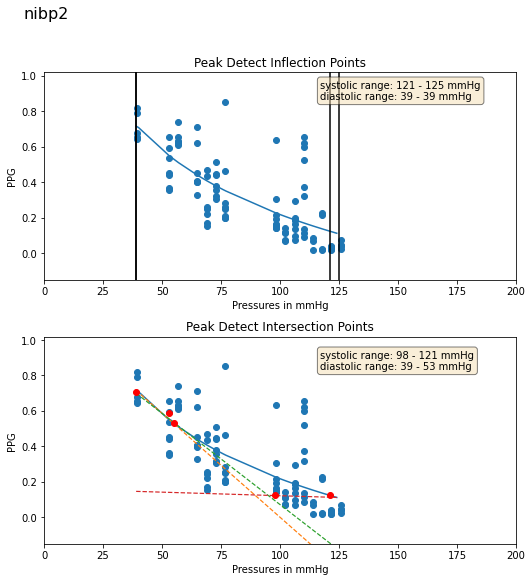

210715CP:
210715CP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    39.187641  0.502628  0.491337  ...  0.004164  0.238127  0.910032
1    54.836872  0.487771  0.478245  ...  0.003480  0.192611  0.979434
2    58.932674  0.523525  0.508827  ...  0.003540  0.194415  0.938497
3    63.026905  0.397579  0.400246  ...  0.002683  0.138120  0.925770
4    66.974083  0.453757  0.441116  ...  0.002038  0.106775  0.894708
5    70.540222  0.358141  0.341999  ...  0.003103  0.172853  0.617362
6    74.662552  0.334195  0.333331  ...  0.002780  0.149124  0.763898
7    78.745842  0.263146  0.270506  ...  0.001973  0.105975  0.802893
8    94.094978  0.214870  0.195616  ...  0.001032  0.101091 -0.161003
9    98.012840  0.155985  0.147277  ...  0.000711  0.066946 -0.295233
10  102.129517  0.083344  0.072757  ...  0.000507  0.036104 -0.445019
11  106.018593  0.054219  0.050115  ...  0.000284  0.025672 -0.135646
12  109.927437  0.068292  0.058861  ...  0.000179  0.027867 -0.406341
1

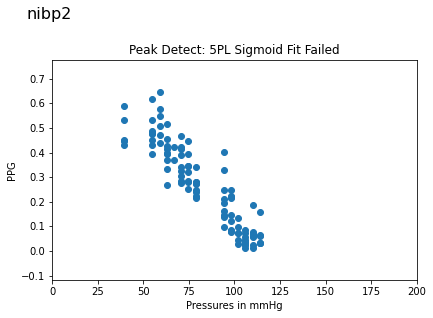

5tttttttttttttttttttttttttttt5
210715AP:
210715AP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    39.375187  0.729827  0.732723  ...  0.019236  0.967182  0.978202
1    57.051964  0.651020  0.657260  ...  0.017225  0.848677  0.972669
2    60.980843  0.611196  0.617267  ...  0.015456  0.773129  0.971407
3    65.008774  0.588338  0.590367  ...  0.013926  0.694385  0.964490
4    69.113129  0.514114  0.485893  ...  0.013393  0.652137  0.883036
5    72.926529  0.500596  0.482263  ...  0.013272  0.680520  0.842318
6    94.547928  0.176124  0.195195  ...  0.004145  0.219539  0.625931
7    98.303574  0.104534  0.098330  ...  0.001321  0.114190 -0.626749
8   102.215340  0.140388  0.103540  ...  0.001510  0.168475 -0.384908
9   106.163383  0.057196  0.055295  ...  0.000842  0.074683 -0.653512
10  110.032990  0.073119  0.061929  ...  0.000416  0.060218 -0.002628
11  114.289284  0.040739  0.039228  ...  0.000333  0.052617 -0.670232
12  117.802345  0.012990  0.011267  ... 

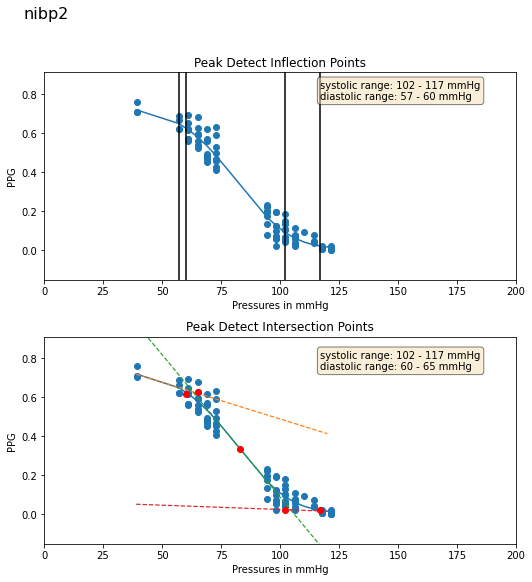

210716AP:
210716AP
           ppi      aucr   aucrmed  ...   amponly   auconly    cormin
0    73.034424  1.094675  1.090233  ...  0.017286  0.878776  0.990780
1    77.577385  1.128283  1.129157  ...  0.018148  0.918840  0.953088
2    81.283470  1.263179  1.274934  ...  0.016724  0.822808  0.970669
3    85.281548  1.181660  1.140893  ...  0.016700  0.856988  0.978629
4    89.390335  1.087993  1.104297  ...  0.017600  0.863835  0.858642
5    93.499779  0.932462  0.912501  ...  0.015013  0.751739  0.857015
6   124.475815  0.447105  0.462929  ...  0.005962  0.368006  0.127967
7   128.426193  0.288531  0.304268  ...  0.003365  0.207984 -0.167848
8   132.430618  0.194916  0.177622  ...  0.000545  0.055964 -0.504405
9   136.389664  0.258203  0.186625  ...  0.001478  0.211836 -0.620752
10  140.288208  0.089121  0.006197  ...  0.000426  0.073487 -0.442559
11  143.984039  0.074047  0.040721  ...  0.000157  0.057130 -0.620014
12  148.032776  0.068528  0.020511  ...  0.000281  0.045874 -0.358698



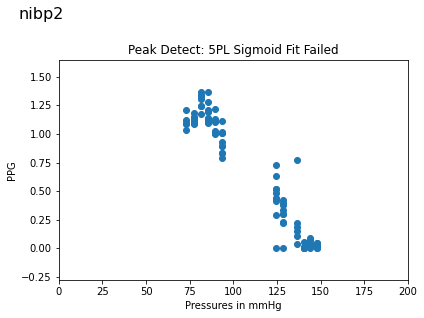

5tttttttttttttttttttttttttttt5
210717AP:
210717AP


KeyboardInterrupt: ignored

In [ ]:
patients=[]
lsys=[]
na=[]
d0=[]
d1=[]
d2=[]
d3=[]
d4=[]
d5=[]
d6=[]
d7=[]
d08=[]
d8=[]
d9=[]
d10=[]
d11=[]
d12=[]
d13=[]
d14=[]
d015=[]
d15=[]
d16=[]
d17=[]
d18=[]
d19=[]
d20=[]
d21=[]
d22=[]
folder = '/content/drive/MyDrive/data40/sphygmo/'
for patient in [x for x in os.listdir(folder)if x.find('P')!=-1]:
# for patient in ['210717BP']:
  nibp = NIBPProcessor(folder+patient+'/nibp2.txt')
  nibp.save_peak_locations()
  nibp.detect_plateaus()
  print(f'{patient}:')
  ita1, sys1 = nibp.compute_ita()
  # print(f'{patient}: {sys1}')
  patients.append(patient)
  lsys.append(sys1)
  nibp.fitting(folder+patient+'/nibp2.txt',patient)

rangedf = pd.DataFrame()  
dia_fin = pd.DataFrame()  
dia_fin['patient']=na
dia_fin['d0']=d0
dia_fin['d1']=d1
dia_fin['d2']=d2
dia_fin['d3']=d3
dia_fin['d4']=d4
dia_fin['d5']=d5
dia_fin['d6']=d6
dia_fin['d7']=d7
dia_fin['d08']=d08
dia_fin['d8']=d8
dia_fin['d9']=d9
dia_fin['d10']=d10
dia_fin['d11']=d11
dia_fin['d12']=d12
dia_fin['d13']=d13
dia_fin['d14']=d14
dia_fin['d015']=d015
dia_fin['d15']=d15
dia_fin['d16']=d16
dia_fin['d17']=d17
dia_fin['d18']=d18
dia_fin['d19']=d19
dia_fin['d20']=d20
dia_fin['d21']=d21
# dia_fin['d22updated']=d22
save_df(dia_fin, 'diastolica2.csv')
# rangedf['Low_sys']=lsys


210715BP:
210715BP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.399391  0.806198  0.989406  0.797594  0.008700  0.978689
1    53.079773  0.549860  0.911481  0.584271  0.006203  0.779263
2    56.940723  0.649113  0.936361  0.588347  0.006085  0.848611
3    61.024216  0.657859  0.959944  0.683309  0.008827  0.892416
4    64.941582  0.474592  0.871844  0.430586  0.004119  0.785763
5    68.966133  0.375439  0.838718  0.237861  0.002271  0.541840
6    72.638275  0.455331  0.850412  0.456827  0.005740  0.541450
7    76.745102  0.379110  0.805283  0.286003  0.003357  0.268053
8    98.352783  0.233648  0.834773  0.194070  0.002131  0.563991
9   102.208260  0.225513  0.462811  0.092038  0.001278 -0.540299
10  106.350136  0.165919  0.768692  0.177770  0.002152  0.576080
11  110.223213  0.381217  0.135989  0.246614  0.002848 -0.339122
12  114.130829  0.083567 -0.066785  0.025969  0.000286 -0.569934
13  117.847023  0.130395 -0.266092  0.065389  0.000637 -0.791803
14  12

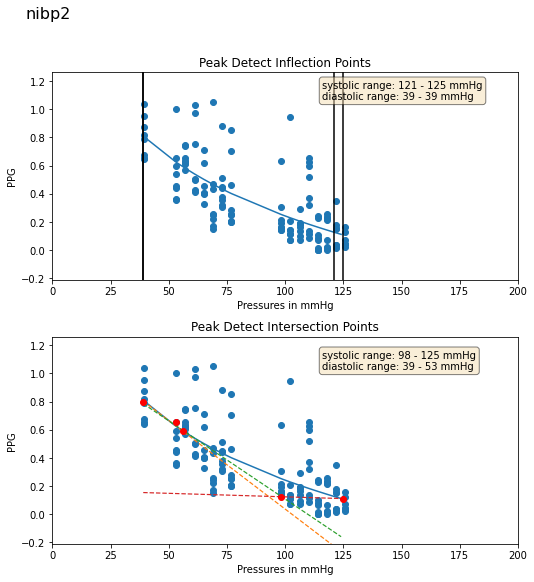

210715CP:
210715CP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.187641  0.571790  0.964721  0.498693  0.004692  0.910032
1    54.836872  0.487771  0.987174  0.464923  0.003480  0.979434
2    58.932674  0.561292  0.965463  0.535154  0.003975  0.938497
3    63.026905  0.397579  0.966845  0.395459  0.002683  0.925770
4    66.974083  0.453757  0.954167  0.486409  0.002038  0.894708
5    70.540222  0.358141  0.863369  0.324884  0.003103  0.617362
6    74.662552  0.334195  0.869957  0.316489  0.002780  0.763898
7    78.745842  0.263146  0.866091  0.250085  0.001973  0.802893
8    94.094978  0.214870  0.032280  0.110211  0.001032 -0.161003
9    98.012840  0.155985 -0.036943  0.084571  0.000711 -0.295233
10  102.129517  0.080366 -0.293052  0.053494  0.000466 -0.576849
11  106.018593  0.054219  0.208072  0.030771  0.000284 -0.135646
12  109.927437  0.066310  0.089537  0.017612  0.000153 -0.688750
13  113.931328  0.066525  0.280221  0.034409  0.000204 -0.354166
------

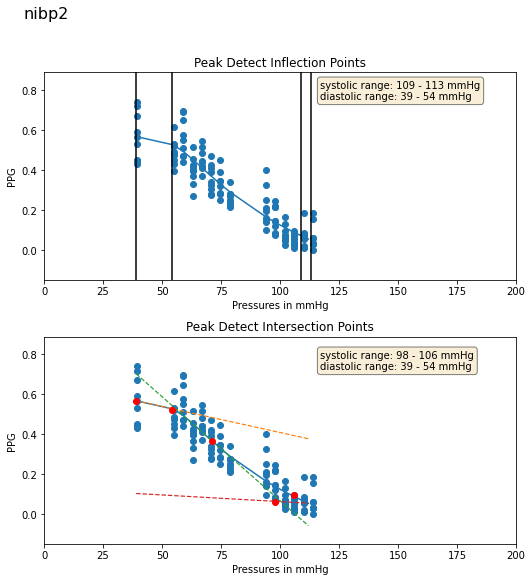

210715AP:
210715AP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.375187  0.729827  0.990287  0.680842  0.019236  0.978202
1    57.051964  0.651020  0.986482  0.612086  0.017225  0.972669
2    60.980843  0.611196  0.985900  0.572290  0.015456  0.971407
3    65.008774  0.588338  0.986665  0.564517  0.013926  0.964490
4    69.113129  0.514114  0.937362  0.496118  0.013393  0.883036
5    72.926529  0.500596  0.862508  0.455116  0.013272  0.842318
6    94.547928  0.176124  0.751731  0.153941  0.004145  0.625931
7    98.303574  0.104534 -0.119146  0.055382  0.001321 -0.626749
8   102.215340  0.140388  0.047232  0.060371  0.001510 -0.384908
9   106.163383  0.057196 -0.153986  0.031195  0.000842 -0.653512
10  110.032990  0.073119  0.238353  0.024986  0.000416 -0.002628
11  114.289284  0.040905 -0.445568  0.013100  0.000348 -0.734246
12  117.802345  0.012990  0.099006  0.006817  0.000204 -0.527749
13  121.707710  0.019993 -0.015007  0.006902  0.000197 -0.667756
------

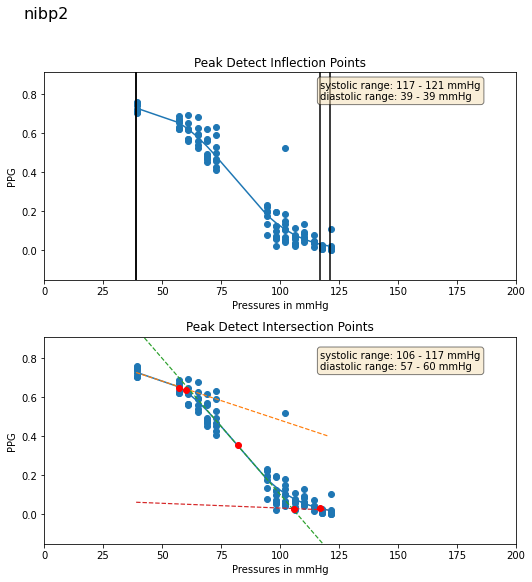

210716AP:
210716AP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.395714  1.012125  0.992878  1.005519  0.014486  0.985777
1    73.034424  1.094675  0.994532  1.114863  0.017286  0.990780
2    77.577385  1.128283  0.979903  1.121773  0.018148  0.953088
3    81.283470  1.263179  0.981975  1.299339  0.016724  0.970669
4    85.281548  1.181660  0.983987  1.163344  0.016700  0.978629
5    89.390335  1.087993  0.935624  1.120448  0.017600  0.858642
6    93.499779  0.932462  0.917985  0.975176  0.015013  0.857015
7   124.475815  0.447105  0.501373  0.375017  0.005962  0.127967
8   128.426193  0.288531  0.320757  0.237904  0.003365 -0.167848
9   132.430618  0.194916 -0.090513  0.093086  0.000545 -0.504405
10  136.389664  0.217351 -0.466581  0.076030  0.001157 -0.961160
11  140.288208  0.108007 -0.132753  0.022758  0.000365 -0.678118
12  143.984039  0.074047  0.206645  0.009660  0.000157 -0.620014
13  148.032776  0.063004  0.022752  0.019648  0.000263 -0.682775
------

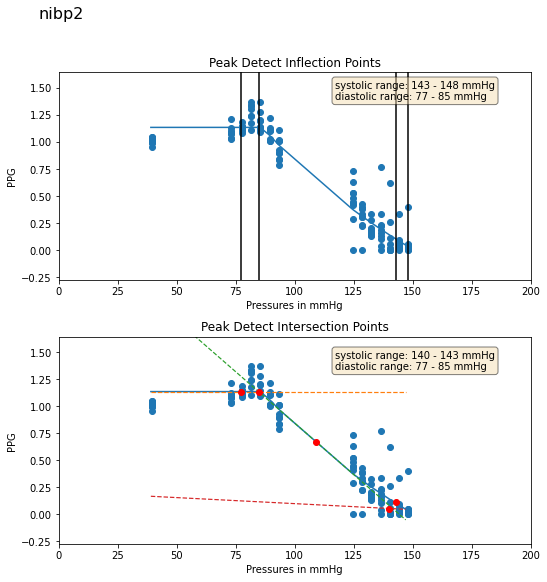

210717AP:
210717AP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.161438  1.671263  0.980715  1.597236  0.014543  0.924533
1    67.001251  1.323902  0.961349  1.346190  0.008451  0.871287
2    68.952644  1.444099  0.961869  1.470407  0.009371  0.906610
3    72.712471  1.285680  0.971295  1.383493  0.009922  0.924248
4    76.797829  1.124365  0.937638  1.305101  0.009460  0.925748
5    80.838852  1.217173  0.921784  1.311738  0.008325  0.828018
6    84.741776  1.032839  0.928442  1.190315  0.007086  0.881500
7    94.234108  0.675269  0.895926  0.782102  0.006283  0.874815
8    98.155144  0.455789  0.859672  0.512007  0.003768  0.818564
9   102.447296  0.323232  0.732253  0.357201  0.003102  0.532665
10  106.197090  0.266862  0.720021  0.287543  0.001962  0.662802
11  110.237427  0.201320  0.472025  0.196315  0.001630  0.135498
12  114.078003  0.174998 -0.124760  0.087811  0.000754 -0.366474
13  117.827614  0.149973 -0.385889  0.049148  0.000487 -0.655930
14  12

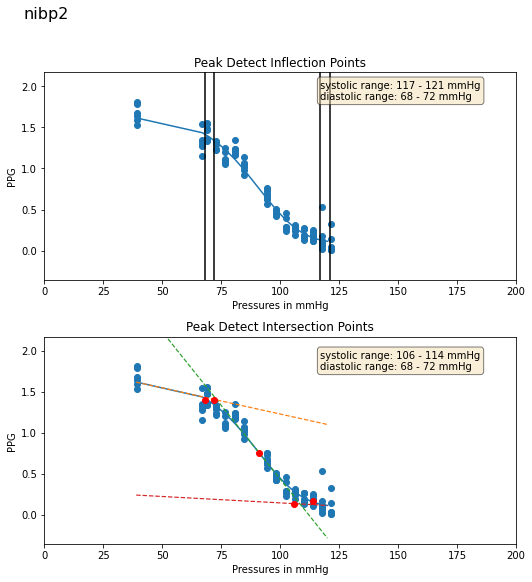

210719AP:
210719AP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.954281  0.999014  0.976396  0.983730  0.004193  0.936884
1    88.676140  1.060870  0.973710  1.025400  0.005588  0.950834
2    92.863480  0.813337  0.960937  0.912394  0.004826  0.922434
3    94.228912  0.809083  0.976045  0.889597  0.004502  0.965368
4    98.444099  0.944392  0.965712  1.033427  0.006861  0.952461
5   102.417564  1.083936  0.942378  1.173576  0.009884  0.915831
6   106.389557  0.744444  0.939808  0.873589  0.004629  0.869772
7   110.454323  1.431065  0.884546  1.016614  0.003985  0.667048
8   124.221359  0.463405  0.865361  0.548674  0.003652  0.810826
9   128.341156  0.423781  0.782572  0.583832  0.001873  0.691047
10  132.125793  0.429571  0.275840  0.291224  0.002205 -0.053554
11  136.244400  0.336090  0.446367  0.368173  0.002322  0.072686
12  139.967438  0.315692  0.279049  0.245143  0.001683 -0.443525
13  143.814102  0.252801 -0.033825  0.203123  0.000889 -0.603546
14  14

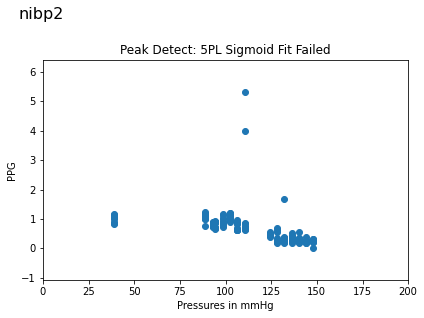

5tttttttttttttttttttttttttttt5
210719BP:
210719BP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.695385  0.776846  0.956291  0.744088  0.004651  0.817852
1    68.797569  0.636388  0.894337  0.627929  0.004081  0.787394
2    72.365158  0.675462  0.866817  0.671006  0.007837  0.749075
3    76.573189  0.842878  0.856443  0.791607  0.006357  0.754978
4    80.437340  0.718998  0.912036  0.698068  0.006109  0.807675
5    84.661133  0.704315  0.882249  0.717364  0.007771  0.859725
6    88.798653  0.503571  0.794385  0.465925  0.006808  0.725280
7   104.190819  0.360442  0.482960  0.298311  0.003191  0.296890
8   108.300613  0.384063  0.362540  0.222973  0.001667  0.275034
9   112.337448  0.312858 -0.007196  0.126748  0.000995 -0.719895
10  115.740410  0.269580 -0.055580  0.097103  0.000859 -0.747442
11  119.895882  0.053643  0.343521  0.018546  0.000277 -0.000439
12  123.943970  0.052456 -0.173018  0.023375  0.000311 -0.712970
13  127.511482  0.151707 -0.221371  0.03

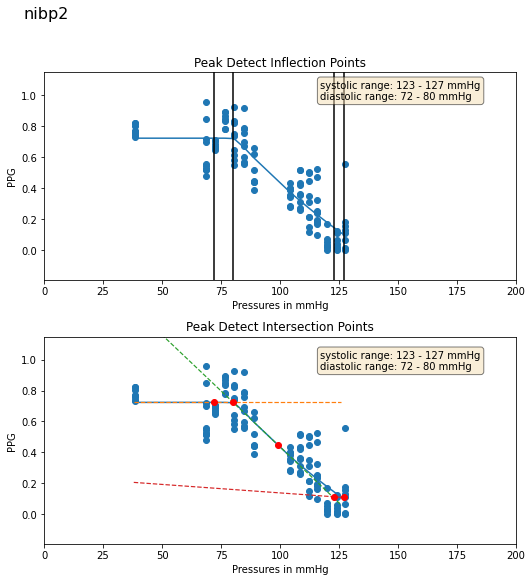

210720AP:
210720AP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.519547  0.891672  0.992358  0.881280  0.011798  0.988801
1    72.004845  0.835927  0.976510  0.888299  0.011752  0.953082
2    76.038666  0.822070  0.989070  0.852849  0.011696  0.972074
3    80.132164  0.767187  0.961633  0.817657  0.011639  0.939725
4    84.161751  0.726566  0.965917  0.769804  0.010961  0.935826
5    87.978836  0.618616  0.952415  0.665776  0.009971  0.936925
6   109.700455  0.369139  0.295920  0.308548  0.004480  0.208981
7   113.431282  0.091117 -0.486007  0.056662  0.000861 -0.815121
8   117.253128  0.034992  0.162788  0.009711  0.000150 -0.634771
9   121.091377  0.035284  0.248171  0.010233  0.000150 -0.728061
10  125.065247  0.019541  0.163181  0.010258  0.000157 -0.506782
11  129.048248  0.015341  0.399831  0.008869  0.000141 -0.518957
12  132.791611  0.018735  0.130115  0.010223  0.000162 -0.698419
--------threshold----------
0.8916724
0.8025051355361938


-----based o

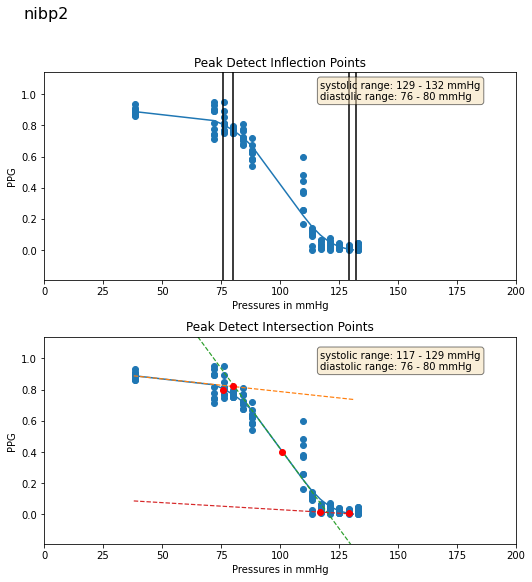

210720BP:
210720BP
           ppi      aucr      corl      ampr   amponly    cormin
0     2.578356  0.679302  0.994573  0.684596  0.005059  0.986862
1    39.109806  0.634903  0.985993  0.617098  0.003333  0.974204
2    58.877430  0.608991  0.971903  0.596361  0.003482  0.929641
3    63.099472  0.562358  0.969028  0.575236  0.004186  0.936822
4    66.879951  0.651315  0.959248  0.681778  0.005174  0.942892
5    70.623329  0.547785  0.953737  0.622245  0.004069  0.908585
6    74.772003  0.519302  0.888263  0.546533  0.002855  0.644742
7    78.615524  0.432077  0.898194  0.465271  0.002665  0.861264
8    92.739052  0.183470  0.475635  0.175866  0.001033  0.173208
9    96.226814  0.174393  0.063979  0.123304  0.000857 -0.259908
10  100.305847  0.129829  0.128926  0.103487  0.000640 -0.731943
11  104.303329  0.055591 -0.116191  0.027360  0.000191 -0.762891
12  108.319061  0.072422  0.098202  0.054274  0.000238 -0.871515
13  112.279510  0.082664 -0.117911  0.049277  0.000203 -0.607863
------

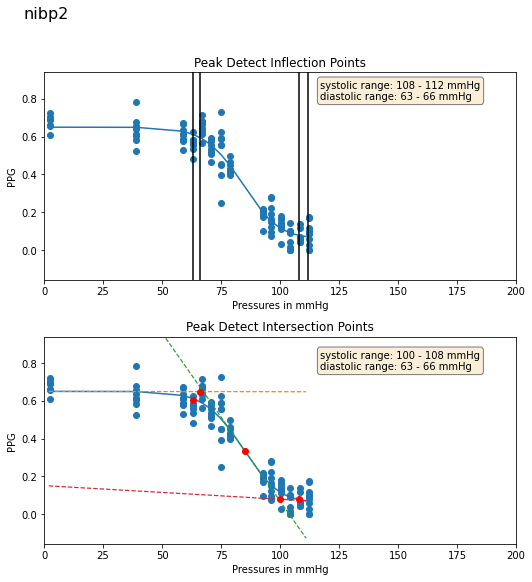

210723AP:
210723AP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.857368  0.453781  0.991597  0.428120  0.002470  0.981299
1    78.593887  0.424874  0.986391  0.465766  0.004500  0.972909
2    82.584396  0.376478  0.968157  0.428672  0.004784  0.939922
3    86.714699  0.480752  0.966430  0.576950  0.004280  0.936392
4    90.591484  0.476622  0.970952  0.561138  0.003858  0.955602
5    94.433647  0.433290  0.967923  0.516619  0.003268  0.951571
6    98.314331  0.345968  0.960495  0.422458  0.002724  0.942547
7   110.341270  0.195850  0.817342  0.229651  0.001884  0.742985
8   114.259048  0.166085  0.825104  0.199760  0.001353  0.721393
9   117.744392  0.160254  0.676003  0.164093  0.000963  0.547271
10  121.896561  0.113086  0.739271  0.120896  0.000669  0.632647
11  125.822174  0.204098  0.720327  0.186279  0.000727  0.544816
12  129.941620  0.136125 -0.235472  0.068555  0.000272 -0.732391
13  133.721695  0.053743  0.034250  0.024365  0.000221 -0.912300
14  13

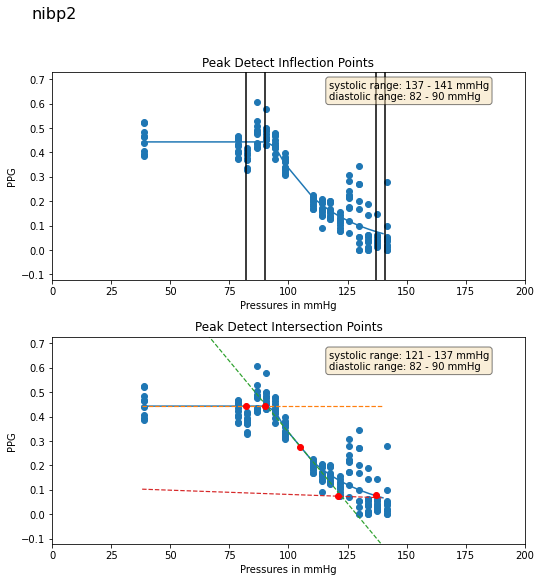

210724AP:
210724AP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.381207  0.281774  0.984316  0.298669  0.003925  0.976458
1    63.374454  0.274620  0.985361  0.251917  0.003232  0.975630
2    65.354568  0.992692  0.925562  0.383584  0.001590  0.630656
3    69.258858  0.265142  0.957739  0.233621  0.003598  0.904153
4    73.839958  0.273203  0.971725  0.240302  0.003064  0.940742
5    76.955742  0.258200  0.968034  0.232400  0.003389  0.916368
6    81.226494  0.269289  0.959171  0.236276  0.003289  0.926059
7    85.335205  0.242670  0.934963  0.200833  0.003224  0.864338
8   114.764168  0.148288  0.441355  0.105842  0.001590  0.302571
9   118.318138  0.128317  0.368424  0.071559  0.000965 -0.006147
10  122.577835  0.131112  0.287907  0.062932  0.000904 -0.232741
11  126.459618  0.080906 -0.174567  0.045001  0.000371 -0.838770
12  130.355591  0.108963  0.112611  0.038167  0.000269 -0.541122
13  134.455978  0.040487  0.015754  0.010380  0.000164 -0.804981
14  13

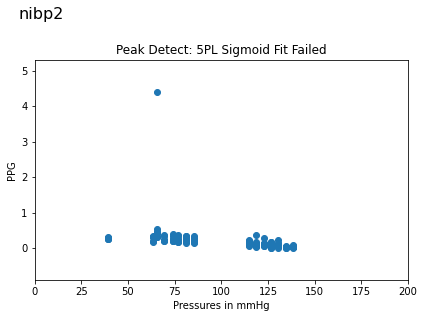

5tttttttttttttttttttttttttttt5
210724BP:
210724BP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.178875  0.661474  0.991294  0.714565  0.008676  0.983810
1    57.170734  0.553971  0.969036  0.657457  0.008004  0.923186
2    61.128872  0.431934  0.921315  0.386024  0.002840  0.873476
3    65.184441  0.524820  0.919023  0.553221  0.008435  0.849366
4    70.091942  0.596441  0.940202  0.644688  0.008472  0.906139
5    73.530655  0.436048  0.853679  0.453176  0.006531  0.654049
6    77.009453  0.583719  0.921440  0.687571  0.009001  0.890405
7    81.092354  0.471550  0.819590  0.518339  0.005429  0.784084
8    94.718857  0.172235  0.735548  0.175784  0.002880  0.681669
9    98.784012  0.173232  0.667503  0.186762  0.002345  0.443559
10  102.599617  0.127092  0.396516  0.130911  0.002202  0.259219
11  106.572319  0.067741 -0.331894  0.020811  0.000180 -0.925796
12  110.494209  0.024830 -0.326336  0.007251  0.000149 -0.927941
13  114.808990  0.042425  0.106504  0.01

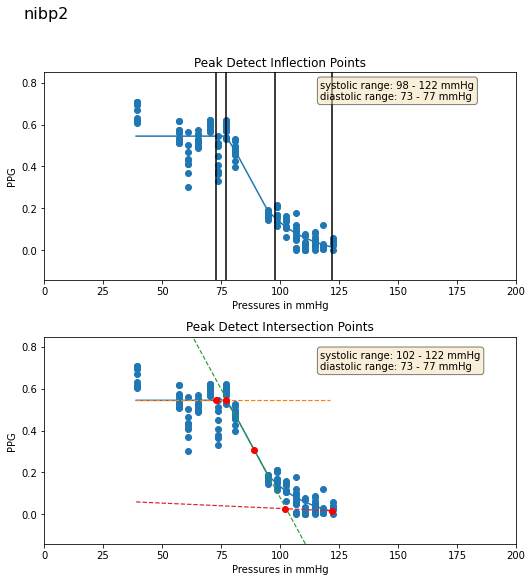

210726AP:
210726AP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.314377  0.781057  0.987434  0.818910  0.007109  0.966121
1    94.882996  0.563455  0.994252  0.687952  0.004487  0.990351
2    98.768044  0.595045  0.993727  0.666988  0.008845  0.983444
3   103.086067  0.561279  0.994577  0.604567  0.008060  0.985196
4   107.059036  0.596365  0.988434  0.736505  0.009719  0.980072
5   111.268257  0.513673  0.982340  0.664363  0.008709  0.975649
6   115.441750  0.434753  0.978361  0.556487  0.007789  0.963661
7   119.414413  0.379221  0.967659  0.493793  0.006433  0.920596
8   140.244232  0.131610  0.673158  0.150982  0.002239 -0.071489
9   144.156677  0.192289  0.073389  0.154155  0.002192 -0.364543
10  148.201828  0.200914  0.114698  0.132626  0.001740 -0.332446
11  152.525620  0.142049 -0.018689  0.085590  0.001352 -0.536134
12  156.158432  0.046704  0.002204  0.016692  0.000219 -0.641026
13  160.132538  0.047777 -0.253509  0.011825  0.000161 -0.832294
14  16

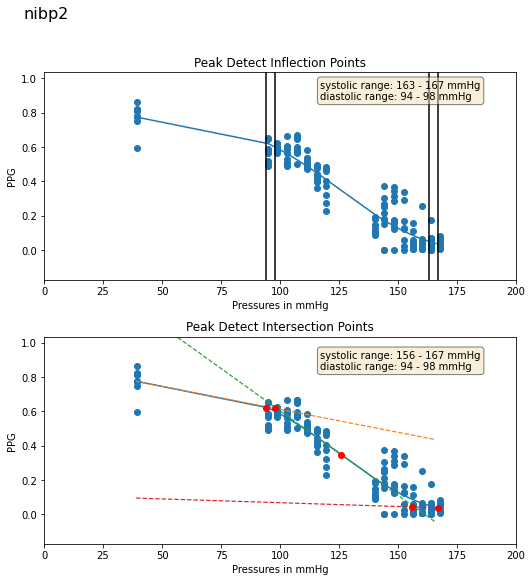

210726BP:
210726BP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.982029  0.709425  0.980707  0.708427  0.007159  0.965420
1    68.866257  0.658573  0.978729  0.689350  0.008006  0.969354
2    72.546959  0.659000  0.976002  0.762346  0.009479  0.965242
3    76.683098  0.734514  0.967965  0.825319  0.010217  0.936507
4    80.766441  0.596207  0.978010  0.684320  0.010924  0.966103
5    85.021210  0.533440  0.968058  0.625505  0.011077  0.954458
6    88.937843  0.588978  0.970440  0.655430  0.007957  0.952086
7    92.819298  0.436935  0.924007  0.536994  0.007368  0.875723
8   114.501945  0.177578  0.624280  0.228490  0.003741  0.515875
9   118.023033  0.171035  0.610534  0.214554  0.003199  0.392890
10  122.103157  0.193928  0.076165  0.174602  0.003367 -0.202961
11  126.186409  0.131444 -0.247182  0.102449  0.001859 -0.647938
12  130.136185  0.124263  0.238391  0.123372  0.001743 -0.222349
13  134.024323  0.058222 -0.266888  0.039751  0.000677 -0.965058
14  13

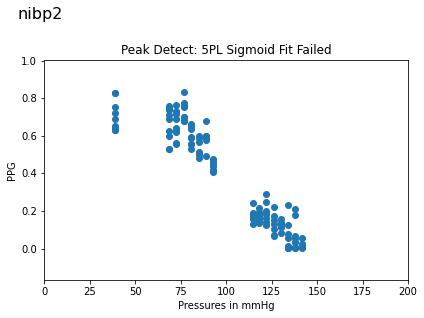

5tttttttttttttttttttttttttttt5
210726CP:
210726CP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.627647  1.288712  0.994774  1.279668  0.006437  0.979065
1    90.398361  1.181022  0.976093  1.170187  0.006906  0.915320
2    94.040749  1.261312  0.979106  1.318440  0.008585  0.953192
3    98.223701  1.101806  0.957322  1.246627  0.008031  0.889702
4   102.264854  1.182202  0.971236  1.408418  0.007152  0.953713
5   106.349892  1.164947  0.951183  1.403881  0.005934  0.936783
6   110.324677  1.075806  0.939395  1.281256  0.006058  0.808786
7   114.451668  1.026745  0.946928  1.165153  0.006780  0.898095
8   129.868301  0.521621  0.861051  0.621152  0.002560  0.704779
9   134.042053  0.490604  0.724905  0.486978  0.003006  0.431127
10  137.880356  0.389230  0.485817  0.364870  0.002040  0.193426
11  141.450058  0.370150  0.243450  0.249461  0.001408  0.056100
12  145.309677  0.246052 -0.109363  0.150208  0.001418 -0.432929
13  149.365143  0.085411 -0.000393  0.06

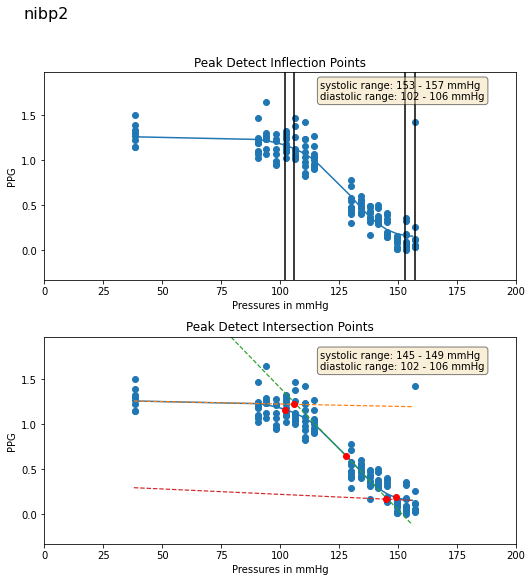

210728AP:
210728AP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.000687  1.291139  0.967336  1.186685  0.011002  0.938818
1    68.310699  1.240633  0.971539  1.202866  0.012909  0.951645
2    72.507179  0.886265  0.976647  0.844892  0.008055  0.955940
3    76.545547  1.247800  0.953222  1.116070  0.012128  0.941971
4    80.451836  1.117779  0.951859  0.996835  0.013214  0.938870
5    84.640640  1.068853  0.934805  0.986764  0.012730  0.881060
6    88.444527  0.888775  0.918839  0.876181  0.012384  0.863398
7    92.517609  0.728579  0.817692  0.682344  0.009937  0.749201
8   108.094849  0.795521  0.549337  0.499995  0.004731  0.451942
9   112.143013  0.525165  0.548677  0.338414  0.002886  0.430354
10  115.481606  0.325693  0.569130  0.250551  0.002572  0.266516
11  119.698097  0.196023  0.443137  0.143212  0.001466  0.190291
12  123.605988  0.152695  0.636088  0.145234  0.001232  0.551516
13  127.722054  0.086365  0.234960  0.050276  0.000479 -0.036563
14  13

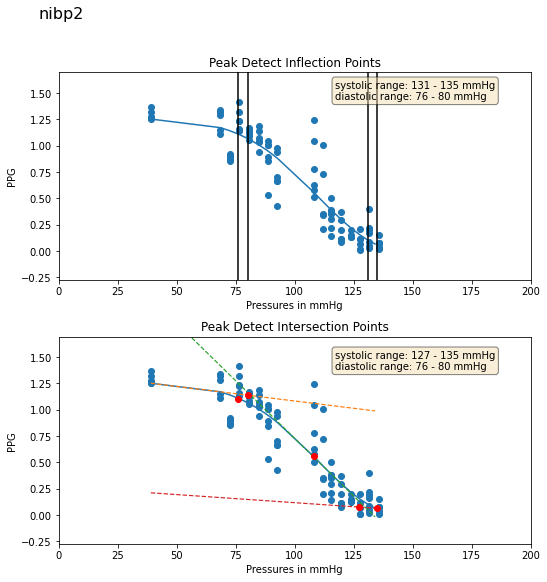

210728BP:
210728BP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.931789  0.850158  0.942746  1.328437  0.004263  0.932716
1    66.878723  0.877462  0.925945  0.989276  0.003848  0.918792
2    74.426628  1.159861  0.952670  1.503105  0.004208  0.894913
3    78.369774  1.059808  0.958796  1.232038  0.004436  0.958796
4    82.580711  1.249601  0.961152  1.569211  0.004519  0.941145
5    98.031227  0.324499  0.895724  0.562891  0.001766  0.863349
6   102.044952  0.464699  0.909185  0.598398  0.001790  0.851077
7   105.988113  0.363515  0.750214  0.446775  0.001394  0.575440
8   109.975037  0.299683  0.605820  0.273020  0.000923  0.246669
9   113.938423  0.540619  0.244184  0.166208  0.000497 -0.086938
10  117.506447  0.054785  0.033609  0.030495  0.000245 -0.786275
11  121.539612  0.109092  0.149480  0.066472  0.000240 -0.488006
12  125.596893  0.001368  0.036777  0.000000  0.000000  0.036777
--------threshold----------
1.2496012
1.1246411204338074


-----based o

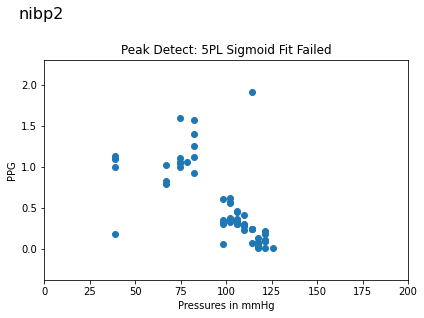

5tttttttttttttttttttttttttttt5
210729AP:
210729AP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.461967  0.683720  0.983723  0.664132  0.002742  0.958253
1    85.998543  0.528735  0.992968  0.589055  0.004059  0.986736
2    89.981544  0.591290  0.989591  0.674842  0.003957  0.975502
3    93.684662  0.541647  0.992448  0.620687  0.005089  0.986092
4    97.758919  0.586081  0.993598  0.662775  0.003446  0.986272
5   101.647957  0.504123  0.981853  0.659758  0.003989  0.969863
6   105.589371  0.434041  0.979337  0.574351  0.005316  0.954343
7   109.549400  0.413057  0.980738  0.527890  0.004345  0.961591
8   131.090820  0.155522  0.856980  0.209482  0.001629  0.701452
9   135.186707  0.209336  0.804732  0.263279  0.001541  0.683731
10  138.598129  0.289513  0.155620  0.205605  0.001631 -0.001782
11  142.715897  0.171520 -0.181844  0.109689  0.001658 -0.859209
12  146.836227  0.106192 -0.312600  0.058768  0.000442 -0.872123
13  150.321442  0.152752  0.243104  0.12

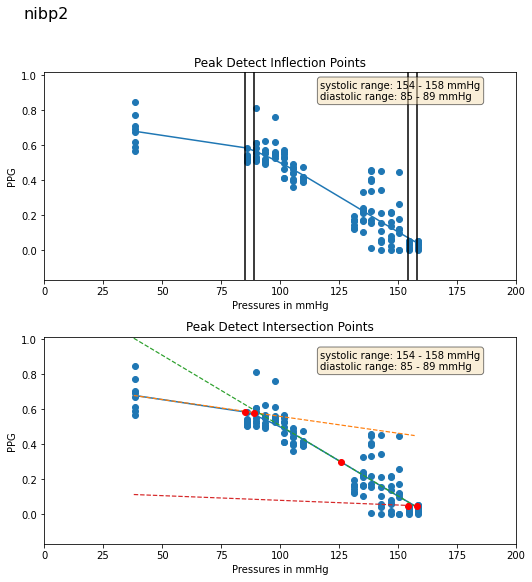

210729BP:
210729BP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.340275  0.941097  0.989812  1.050559  0.004010  0.973309
1    67.091507  1.217710  0.979504  1.147552  0.003556  0.978508
2    69.050240  0.985475  0.991350  1.114952  0.004532  0.980894
3    72.741432  1.127587  0.978173  1.222779  0.004033  0.954063
4    76.822006  0.848406  0.987633  0.995044  0.004689  0.973354
5    80.837181  0.829531  0.982971  1.045762  0.006810  0.966121
6    84.861855  0.973489  0.959429  1.218298  0.004557  0.931914
7    88.791924  0.567917  0.976510  0.778161  0.006448  0.962067
8    93.115913  0.513520  0.965101  0.730966  0.004553  0.950471
9   114.547287  0.201711  0.905142  0.297579  0.001870  0.891784
10  117.688446  0.182796  0.872416  0.242596  0.001344  0.787774
11  122.021805  0.220098  0.251651  0.155478  0.001892  0.040521
12  125.359993  0.214099  0.100100  0.132426  0.001223 -0.211074
13  129.637482  0.106935 -0.041848  0.075754  0.000591 -0.429504
14  13

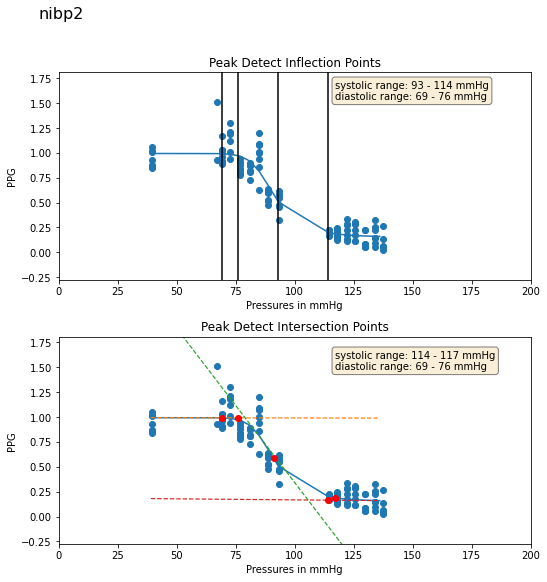

210730AP:
210730AP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.859539  0.952897  0.984795  0.914368  0.003222  0.970255
1    68.782150  0.891028  0.980813  1.012423  0.003459  0.968363
2    72.796257  0.833289  0.977845  0.997237  0.003518  0.963566
3    76.638474  0.934691  0.971657  1.031622  0.003399  0.926404
4    80.731232  0.776486  0.948847  1.026298  0.003895  0.914293
5    84.689285  0.812036  0.934720  0.923122  0.003770  0.835932
6    89.325607  0.664704  0.933242  0.834801  0.002964  0.913416
7    92.998726  0.497394  0.910102  0.617366  0.001883  0.843865
8   114.292374  0.337517  0.615446  0.408951  0.001362  0.486745
9   118.005104  0.359790  0.608590  0.408927  0.001764  0.487520
10  121.970871  0.418028  0.396161  0.404805  0.001965  0.314086
11  125.828766  0.179010 -0.081456  0.069987  0.000323 -0.769460
12  129.867615  0.125070 -0.095696  0.065065  0.000288 -0.836751
13  134.599487  0.081618  0.062302  0.042157  0.000206 -0.944809
14  13

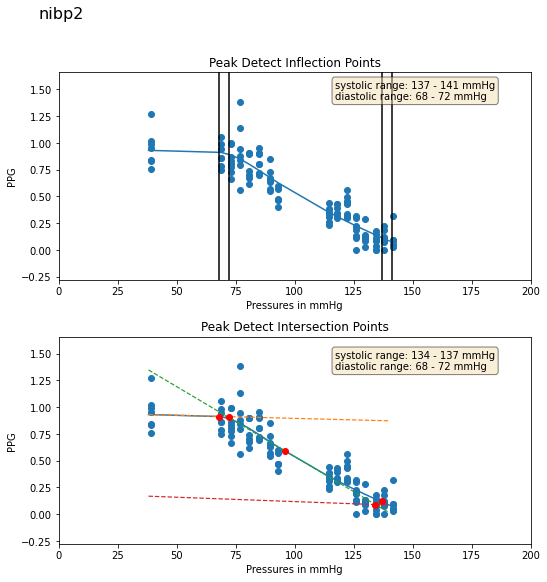

210730BP:
210730BP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.282608  0.610679  0.981480  0.649785  0.014412  0.952684
1    65.160362  0.576442  0.986946  0.609419  0.013476  0.965514
2    69.235794  0.604113  0.992288  0.631046  0.013271  0.984090
3    72.808662  0.638077  0.983199  0.666972  0.012571  0.972649
4    77.036407  0.576341  0.968108  0.614530  0.012570  0.945465
5    81.078011  0.616475  0.960283  0.651165  0.011323  0.945820
6    85.177574  0.592940  0.953915  0.627577  0.008551  0.937100
7    89.055496  0.486984  0.931645  0.517596  0.007322  0.902319
8   104.744705  0.324184  0.577315  0.263546  0.004894  0.241402
9   108.682465  0.110890  0.433729  0.080541  0.001459  0.010441
10  112.732353  0.071947  0.048447  0.041884  0.000558 -0.621950
11  116.225105  0.087965  0.365990  0.053383  0.000769 -0.163415
12  120.376556  0.149630  0.187082  0.098226  0.000859 -0.526945
13  124.288239  0.069365  0.273715  0.018830  0.000210 -0.410357
14  12

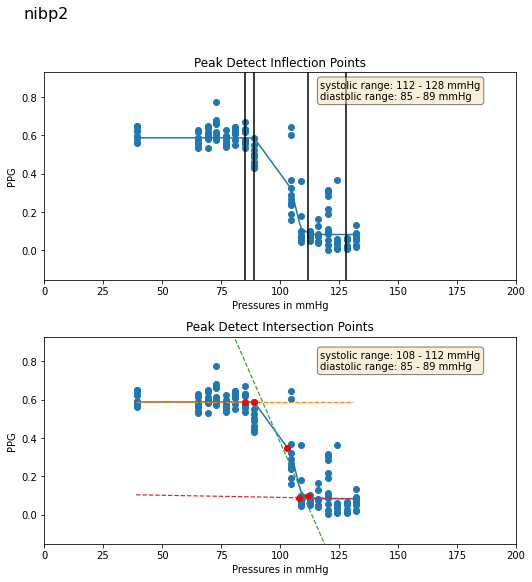

210730CP:
210730CP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.935848  0.420580  0.985109  0.429921  0.009670  0.927606
1    72.599365  0.315710  0.980582  0.327024  0.007570  0.962809
2    76.857742  0.280328  0.955945  0.282806  0.006252  0.774867
3    80.764053  0.280089  0.931389  0.290340  0.006647  0.862841
4    84.682388  0.289362  0.934503  0.291183  0.006256  0.867612
5    89.038651  0.240009  0.911535  0.249147  0.005801  0.721138
6    93.246353  0.219815  0.882365  0.223465  0.005213  0.615071
7    96.764839  0.256162  0.837086  0.262247  0.005686  0.640805
8   110.616394  0.208080  0.369016  0.148939  0.003291  0.285790
9   114.714272  0.252239  0.256086  0.194195  0.003719  0.012034
10  117.956879  0.173335  0.379198  0.130646  0.002145  0.275437
11  122.019646  0.187023  0.174118  0.144936  0.001673 -0.407907
12  125.932045  0.054388 -0.442155  0.017064  0.000317 -0.892603
13  130.003372  0.053201  0.230414  0.025434  0.000240 -0.511815
14  13

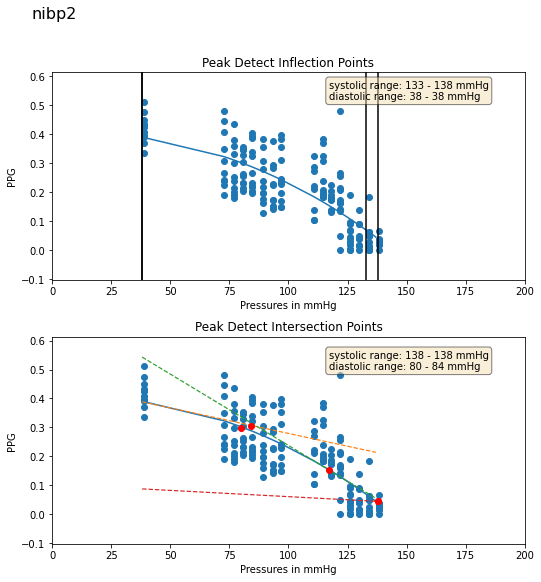

210731AP:
210731AP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.965130  1.587472  0.977415  1.454578  0.006759  0.973792
1    64.686211  1.902717  0.953063  1.671778  0.007722  0.939084
2    68.791550  1.149347  0.974919  1.429654  0.009279  0.960107
3    72.267952  1.633555  0.949752  1.500976  0.006448  0.933372
4    76.470016  1.268155  0.952313  1.258653  0.007758  0.927298
5    80.404549  1.484514  0.942333  1.503020  0.010856  0.918707
6    84.437454  1.104092  0.931846  1.276387  0.012418  0.878629
7    88.356117  1.436246  0.924327  1.464330  0.007952  0.863250
8   109.907669  0.597672  0.768539  0.604406  0.002380  0.726452
9   113.868057  0.261994  0.769655  0.273060  0.001634  0.675661
10  117.398994  0.247776  0.717376  0.255968  0.002079  0.542667
11  121.581200  0.359884  0.453661  0.258614  0.002103  0.334658
12  125.470810  0.148650  0.313510  0.089023  0.000642  0.014174
13  129.459656  0.070030  0.062513  0.041285  0.000356 -0.601815
14  13

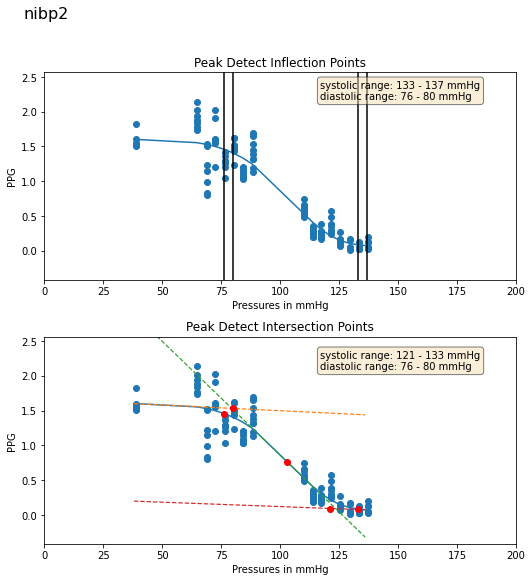

210731BP:
210731BP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.784538  1.049038  0.989697  1.154597  0.009623  0.970964
1    64.941399  0.976526  0.988569  1.031229  0.006697  0.979138
2    68.827049  0.987058  0.985995  1.095061  0.007374  0.961597
3    72.440170  0.987694  0.984327  1.186837  0.008624  0.978332
4    76.586967  0.792640  0.986781  0.917556  0.006794  0.981768
5    80.445366  0.889227  0.970187  1.025490  0.007065  0.940787
6    84.746742  0.834600  0.963873  1.019980  0.006924  0.937304
7    88.901291  0.724404  0.964456  0.880151  0.006533  0.947969
8   114.570549  0.305060  0.883606  0.376700  0.002936  0.752332
9   118.250450  0.279952  0.874893  0.316749  0.002747  0.794275
10  121.995995  0.271436  0.560967  0.192095  0.001679 -0.095391
11  125.892654  0.239969  0.519203  0.146199  0.001200  0.146797
12  130.040359  0.095328  0.258298  0.067041  0.000600 -0.659700
13  133.935043  0.091660  0.135998  0.021238  0.000195 -0.509016
14  13

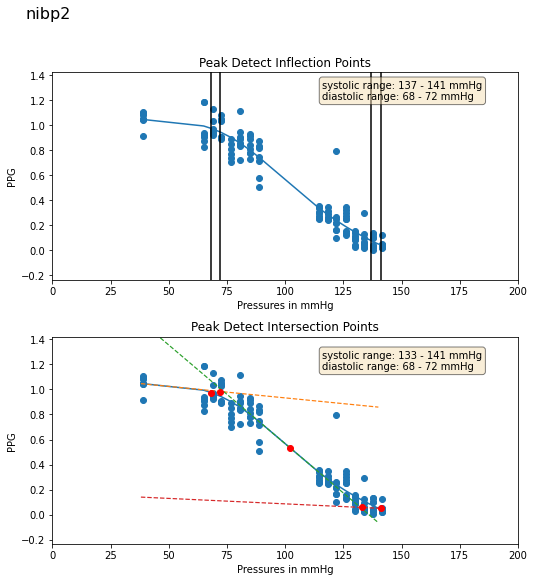

210803AP:
210803AP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.897442  1.198833  0.991782  1.158787  0.029896  0.971458
1    65.662247  1.015744  0.979718  0.977373  0.031064  0.951391
2    69.729439  1.159612  0.976165  1.096364  0.026705  0.949667
3    73.333412  1.136165  0.966956  1.090688  0.028305  0.949925
4    77.388939  1.142679  0.960189  1.106716  0.025832  0.913490
5    81.476082  0.941553  0.928453  0.889133  0.026023  0.869132
6    85.567932  1.001741  0.897787  0.945475  0.026123  0.873053
7    89.673744  0.828357  0.734123  0.757118  0.021235  0.347134
8    99.139694  0.962274  0.469286  0.722255  0.022060  0.316368
9   103.466469  1.148893  0.440919  0.934060  0.025755  0.330125
10  107.140335  0.535368  0.407435  0.470802  0.008481  0.023257
11  111.272369  0.159490  0.277985  0.095185  0.001627 -0.289851
12  115.182533  0.097357 -0.143328  0.088098  0.002518 -0.898607
13  118.823112  0.048244  0.029624  0.020191  0.000613 -0.417692
14  12

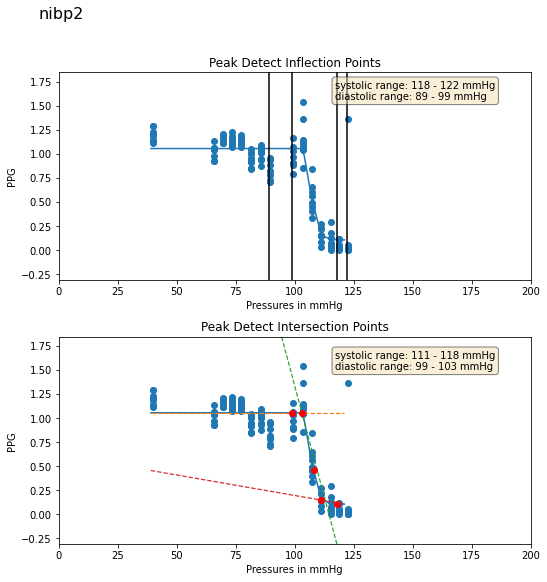

210803BP:
210803BP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.173168  0.177928  0.936695  0.164790  0.008654  0.812236
1    58.914204  0.199906  0.835866  0.162059  0.008078  0.605563
2    63.049442  0.205011  0.870319  0.178867  0.008170  0.723027
3    67.084290  0.176662  0.763903  0.155091  0.007806  0.662100
4    70.652626  0.161649  0.696270  0.131132  0.006867  0.489776
5    74.615181  0.091678  0.722910  0.084074  0.004315  0.297260
6    78.807152  0.064139  0.644380  0.056779  0.002988  0.201775
7    82.820724  0.060151  0.463952  0.054870  0.002984  0.092947
8    86.713127  0.054826  0.241542  0.049056  0.002559 -0.269443
9    90.549934  0.077545 -0.395914  0.028322  0.001426 -0.875432
10   94.281296  0.059139 -0.592768  0.032955  0.001882 -0.929558
11   98.376633  0.035764 -0.720658  0.017202  0.000949 -0.911922
12  102.218422  0.013106  0.211051  0.007389  0.000350 -0.584759
13  106.019936  0.020285 -0.000181  0.004380  0.000228 -0.808749
14  11

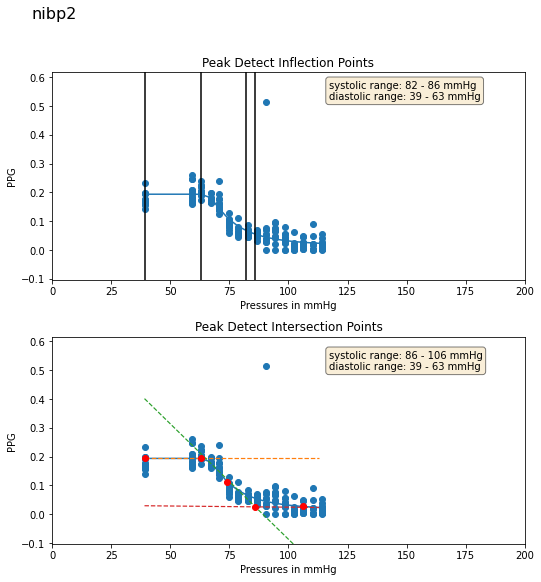

210804AP:
210804AP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.650875  0.786008  0.962283  0.753244  0.006343  0.899037
1    64.517776  1.058614  0.940844  0.981043  0.011469  0.925666
2    68.356857  0.573865  0.954788  0.540556  0.004698  0.864856
3    72.074982  0.989971  0.966341  1.004508  0.012490  0.933006
4    76.153656  0.516342  0.901999  0.466605  0.003017  0.737591
5    80.074417  0.831014  0.890340  0.790694  0.009994  0.749102
6    84.161163  0.624799  0.864747  0.660132  0.009697  0.791145
7    88.094070  0.713443  0.795890  0.725937  0.007414  0.483510
8    99.593246  0.232400 -0.025202  0.155328  0.002128 -0.560766
9   103.499062  0.185465  0.013104  0.132472  0.001653 -0.306796
10  107.739517  0.180040  0.214232  0.162059  0.001646 -0.855485
11  111.596283  0.029058 -0.236387  0.024044  0.000192 -0.580594
12  115.434486  0.062958 -0.137824  0.037639  0.000466 -0.675748
13  119.159294  0.072113 -0.021640  0.015471  0.000188 -0.718844
14  12

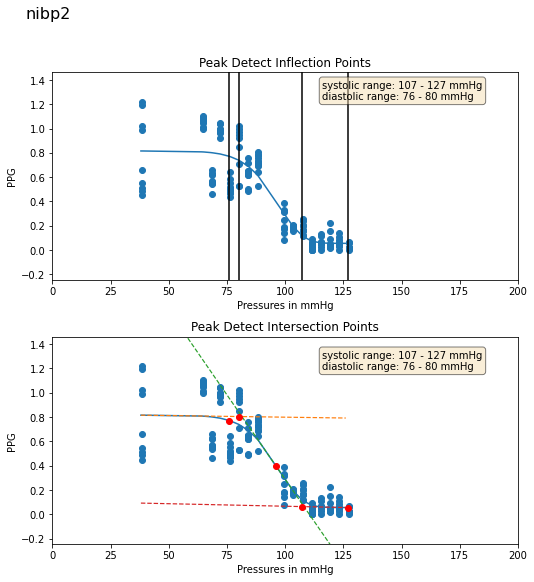

210729CP:
210729CP
           ppi      aucr      corl      ampr   amponly    cormin
0    82.468704  0.731606  0.953657  0.854865  0.002352  0.953657
1    86.743095  0.799088  0.967848  0.955187  0.003124  0.955924
2    90.687706  0.776080  0.943044  0.951208  0.002992  0.913546
3    94.702988  0.706431  0.943800  0.907918  0.003668  0.921845
4    98.614983  0.696810  0.903757  0.990857  0.002663  0.890688
5   102.746857  0.559180  0.897521  0.829116  0.002654  0.861160
6   128.143677  0.178913  0.638449  0.168629  0.000595 -0.002439
7   136.186020  0.125525  0.246933  0.083420  0.000318 -0.205384
8   139.861771  0.120645  0.017098  0.061540  0.000435 -0.538259
9   143.916641  0.169059 -0.444374  0.060849  0.000248 -0.768676
10  147.822876  0.087298 -0.059027  0.043538  0.000272 -0.861434
11  151.867767  0.089940  0.169139  0.050072  0.000212 -0.390820
--------threshold----------
0.79908806
0.719179254770279


-----based on corr>0.89-----
102.74685668945312
98.61498260498047


-----base

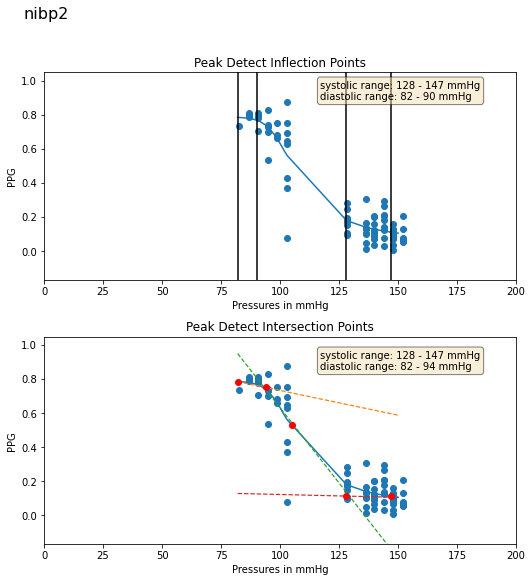

210804BP:
210804BP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.151646  0.853321  0.993946  0.875338  0.009272  0.985075
1    65.052383  0.898317  0.989972  0.932878  0.012298  0.982977
2    69.048988  0.849633  0.985401  0.837484  0.012901  0.976495
3    73.079613  0.806343  0.975721  0.836812  0.012121  0.965598
4    76.770836  0.871226  0.985199  0.897093  0.013093  0.980237
5    80.835266  0.861010  0.984149  0.900572  0.015035  0.979262
6    84.916832  0.784266  0.958722  0.821013  0.008468  0.939726
7    89.040794  0.805675  0.947220  0.876691  0.011404  0.934016
8   100.555656  0.757981  0.929127  0.813005  0.009972  0.893595
9   104.941467  0.642253  0.906448  0.743208  0.006950  0.872156
10  108.715836  0.556179  0.883816  0.610868  0.005277  0.627321
11  112.664047  0.633616  0.468306  0.568965  0.010533  0.219231
12  116.366737  0.588011  0.473417  0.544124  0.009793  0.427374
13  120.149078  0.523555  0.438588  0.509277  0.008405  0.349855
14  12

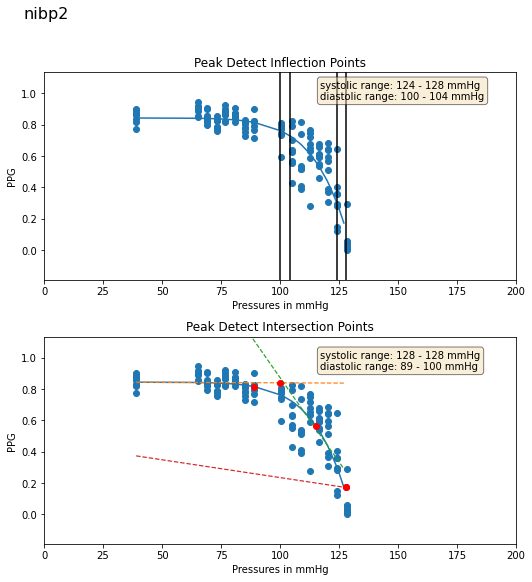

210805AP:
210805AP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.819092  0.820345  0.987098  0.756723  0.007879  0.971303
1    76.477783  0.796855  0.978903  0.734163  0.005477  0.958065
2    80.774384  0.718023  0.962036  0.688535  0.007114  0.924609
3    84.606628  0.905098  0.873327  0.886629  0.004951  0.646364
4    88.755569  0.627417  0.919573  0.609203  0.007331  0.876972
5    92.757309  0.683175  0.874891  0.643560  0.006825  0.687611
6    96.492546  0.604312  0.836252  0.588490  0.006865  0.697136
7   118.351158  0.350411  0.725614  0.247907  0.002529  0.039346
8   122.038223  0.148061  0.449706  0.132919  0.001610  0.046360
9   125.980461  0.173430  0.331857  0.121491  0.001446 -0.431301
10  130.082382  0.173075 -0.142409  0.110341  0.001382 -0.773031
11  133.925949  0.153620 -0.401597  0.089062  0.001087 -0.786329
12  138.019592  0.088685 -0.317106  0.045598  0.000557 -0.867704
13  141.682190  0.045819 -0.133129  0.013304  0.000150 -0.597101
14  14

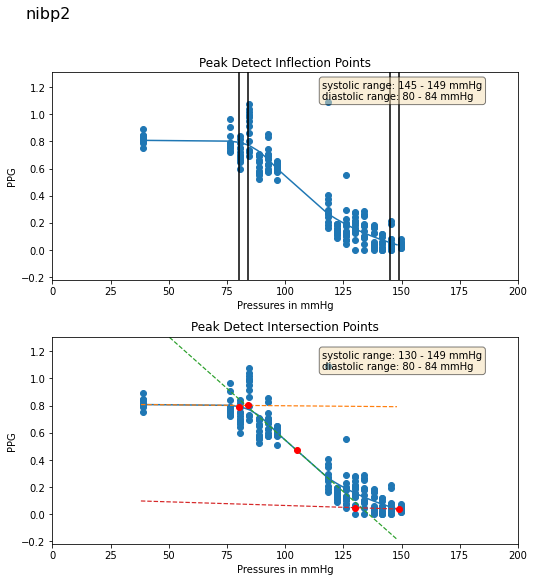

210806AP:
210806AP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.557495  0.978473  0.957463  0.784969  0.005333  0.916318
1    64.350464  0.612624  0.932496  0.544688  0.006513  0.898122
2    68.435226  1.111476  0.847577  0.909391  0.014118  0.816739
3    72.011330  1.159012  0.863750  0.973053  0.014015  0.820116
4    76.210075  1.169070  0.793024  0.958319  0.012330  0.734109
5    80.229401  0.940189  0.804168  0.793194  0.013475  0.763224
6    84.261406  1.201194  0.817408  1.120921  0.014002  0.757860
7    87.971840  0.448987  0.846419  0.417970  0.005804  0.793334
8    97.696030  0.535464  0.736708  0.453929  0.004257  0.658789
9   101.541397  0.185178  0.437480  0.101457  0.001074  0.293873
10  105.628319  0.232246  0.483338  0.152436  0.002144  0.227077
11  109.408546  0.215854  0.322732  0.119230  0.001726  0.203752
12  113.661804  0.188568  0.044336  0.265032  0.003780 -0.537775
13  117.002327  0.071812  0.002563  0.010023  0.000180 -0.457878
14  12

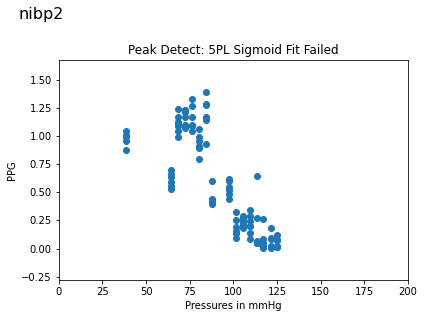

5tttttttttttttttttttttttttttt5
210806BP:
210806BP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.582645  0.482319  0.981589  0.547051  0.004842  0.974641
1    65.702797  0.518846  0.996311  0.544239  0.005731  0.992826
2    69.822495  0.455517  0.994120  0.496371  0.004923  0.983593
3    73.405197  0.459030  0.989867  0.517463  0.005291  0.977730
4    77.831528  0.481697  0.965664  0.520184  0.005835  0.937503
5    81.956497  0.395015  0.951024  0.448290  0.005825  0.924837
6    86.360451  0.307515  0.950643  0.337510  0.004887  0.926607
7    89.693558  0.314598  0.908563  0.343604  0.004894  0.882022
8   103.057106  0.171935  0.754851  0.189652  0.003047  0.690428
9   106.896423  0.126144  0.322205  0.068850  0.000978  0.121966
10  111.037636  0.131638  0.063174  0.095664  0.001647 -0.404103
11  114.936226  0.052740  0.009355  0.027725  0.000426 -0.683850
12  118.461845  0.041333 -0.258470  0.014822  0.000240 -0.804389
13  122.509491  0.046625 -0.115094  0.01

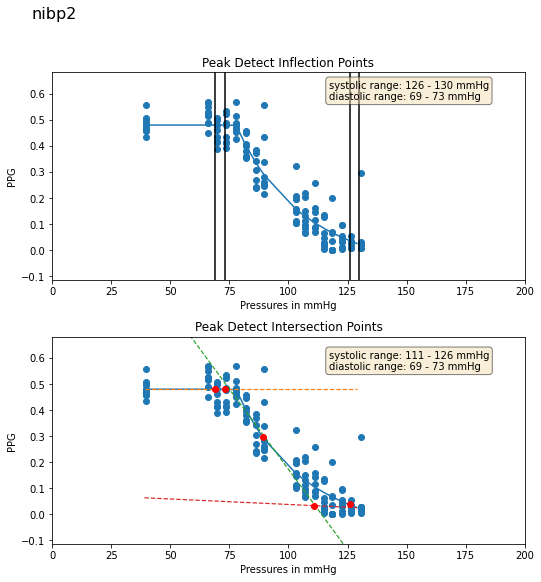

210806CP:
210806CP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.330753  0.823338  0.972957  0.919716  0.009247  0.953046
1    79.091545  0.511304  0.922671  0.585476  0.006429  0.792068
2    83.363571  0.920033  0.943758  1.102613  0.009468  0.911055
3    87.147148  0.658033  0.943691  0.742910  0.006066  0.864743
4    91.418388  0.738411  0.927949  0.850556  0.006225  0.826528
5    95.338509  0.884829  0.926937  0.977754  0.008486  0.857632
6    98.963707  0.782947  0.926488  0.879646  0.006682  0.828581
7   103.192749  0.616115  0.937849  0.692629  0.006893  0.864464
8   124.675926  0.395641  0.707520  0.407927  0.003919  0.616751
9   128.456192  0.448281  0.638364  0.460617  0.003468  0.452619
10  132.509247  0.500123  0.115328  0.299849  0.002368 -0.198831
11  136.617950  0.464129 -0.039626  0.289696  0.002815 -0.198265
12  139.965881  0.405440 -0.042617  0.188746  0.001858 -0.597250
13  144.109787  0.118491 -0.439107  0.059370  0.000577 -0.933197
14  14

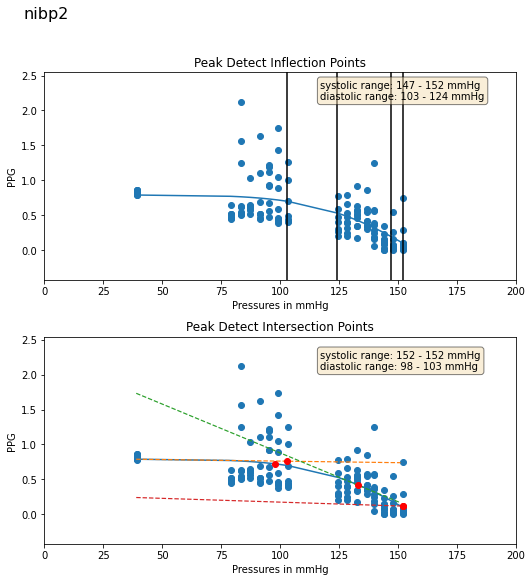

210810AP:
210810AP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.165562  0.802859  0.974545  0.792804  0.008736  0.914569
1    57.099819  0.740949  0.967797  0.712154  0.007709  0.881289
2    61.208279  0.883567  0.980455  0.931790  0.009726  0.959323
3    65.527000  0.732236  0.963576  0.782267  0.008671  0.883908
4    69.384377  0.697788  0.956097  0.718265  0.008186  0.825248
5    72.868073  0.658539  0.946295  0.649069  0.007662  0.895980
6    77.116325  0.757856  0.939829  0.874592  0.010586  0.873903
7    80.910973  0.595956  0.923253  0.697638  0.007481  0.866086
8    91.341759  0.536296  0.780238  0.581725  0.006666  0.667716
9    94.913025  0.608056  0.477787  0.629178  0.007167  0.280791
10   98.662117  0.592126  0.138760  0.426016  0.005004 -0.184583
11  102.825592  0.425905  0.120747  0.270155  0.002823 -0.351685
12  106.791092  0.288397 -0.178425  0.082039  0.001040 -0.894562
13  110.854828  0.299783  0.066655  0.028722  0.000305 -0.922135
14  11

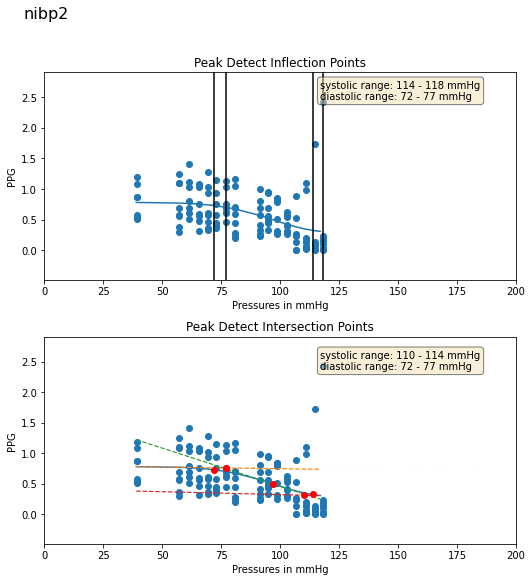

210810BP:
210810BP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.881584  0.879965  0.985473  0.854565  0.017113  0.969664
1    75.178741  0.748565  0.963331  0.773785  0.014234  0.939827
2    78.852432  0.801109  0.975866  0.848086  0.018627  0.955091
3    82.985176  0.742609  0.956775  0.823085  0.017389  0.924504
4    87.321281  0.803957  0.948721  0.910962  0.018885  0.929928
5    91.563667  0.685028  0.906265  0.798630  0.016744  0.871628
6    95.131828  0.667797  0.877320  0.822305  0.017173  0.835892
7    99.316269  0.667457  0.894442  0.851102  0.017407  0.846489
8   120.814972  0.327452  0.740586  0.412920  0.008740  0.676210
9   125.171471  0.282787  0.682638  0.358397  0.006496  0.615327
10  128.704849  0.117758  0.187472  0.115309  0.002456 -0.040213
11  132.633743  0.253484  0.212002  0.245058  0.005350 -0.374262
12  136.290787  0.245745 -0.343899  0.171087  0.003803 -0.861696
13  139.925797  0.110776 -0.182484  0.063676  0.001528 -0.795469
14  14

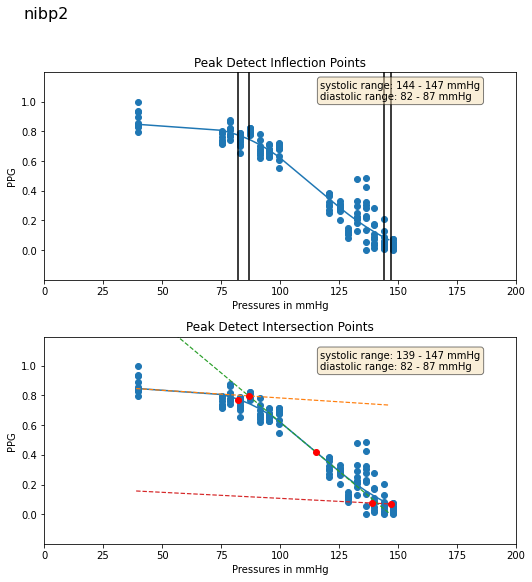

210807AP:
210807AP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.503555  0.500746  0.972129  0.498645  0.004100  0.949658
1    74.704872  0.365767  0.980898  0.375509  0.003854  0.931832
2    78.921082  0.398378  0.987044  0.397408  0.003896  0.971502
3    82.642494  0.406397  0.936250  0.376982  0.002861  0.803357
4    86.872429  0.441577  0.962411  0.414589  0.003426  0.920027
5    90.850227  0.405866  0.953486  0.405395  0.003597  0.806046
6    94.697380  0.344319  0.937312  0.334515  0.003218  0.895033
7    98.849594  0.307691  0.867861  0.296596  0.002947  0.732930
8   110.858231  0.271461  0.800764  0.234245  0.001550  0.210877
9   114.889671  0.350048  0.181773  0.118410  0.000529 -0.700873
10  118.566284  0.192867  0.302716  0.135066  0.001514 -0.150583
11  122.391495  0.158700 -0.179809  0.075729  0.000925 -0.812563
12  126.288910  0.063345 -0.256491  0.030369  0.000375 -0.841909
13  130.433502  0.198840  0.319893  0.111414  0.000792 -0.589775
14  13

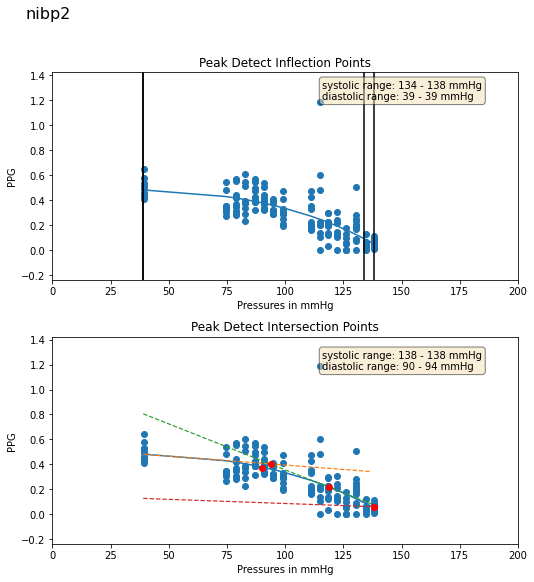

210810CP:
210810CP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.087124  0.653643  0.926647  0.589451  0.004338  0.890398
1    69.086586  0.853497  0.896301  0.800612  0.007570  0.851320
2    72.591446  0.737553  0.880696  0.661337  0.005999  0.844495
3    76.521805  0.539511  0.908246  0.515543  0.004351  0.875012
4    80.736557  0.809953  0.816533  0.718244  0.006263  0.753186
5    84.599289  0.480227  0.866701  0.436427  0.002647  0.816828
6    88.606171  0.488531  0.798049  0.445712  0.003793  0.730765
7   104.244743  0.417504  0.708668  0.399655  0.002553  0.576683
8   108.339043  0.265006  0.506945  0.254350  0.001706  0.389587
9   112.478363  0.285226  0.032458  0.218481  0.001829 -0.087194
10  116.012215  0.339094 -0.146185  0.170508  0.001513 -0.705771
11  119.946426  0.153267 -0.247488  0.091794  0.000695 -0.815842
12  124.225235  0.131159  0.061709  0.069170  0.000442 -0.541804
13  128.208847  0.055518 -0.206334  0.030863  0.000240 -0.606782
14  13

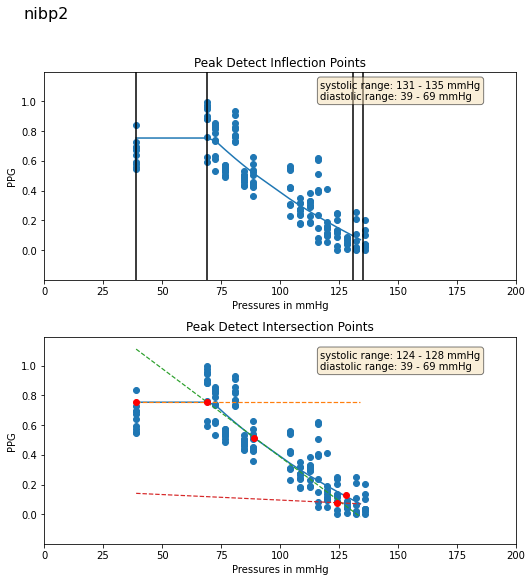

210811AP:
210811AP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.890377  0.798636  0.947458  0.778794  0.009806  0.932737
1    62.768406  0.696045  0.919452  0.704087  0.009523  0.779992
2    64.720695  0.699230  0.840277  0.665192  0.008845  0.629891
3    68.578911  0.691123  0.875005  0.666051  0.008105  0.822571
4    72.364876  0.687225  0.896152  0.662898  0.005637  0.875926
5    76.311035  0.631368  0.843699  0.609254  0.007133  0.736939
6    80.142113  0.575849  0.856990  0.613547  0.009040  0.697639
7    84.355232  0.532684  0.843306  0.577260  0.006590  0.716156
8   105.766640  0.157261  0.423904  0.159316  0.002047  0.135612
9   109.988358  0.096689  0.001409  0.072625  0.000994 -0.223560
10  113.859665  0.099048 -0.741904  0.048559  0.000693 -0.957337
11  117.529205  0.062526 -0.465537  0.028490  0.000420 -0.897334
12  121.597733  0.031971  0.129500  0.011046  0.000168 -0.273803
13  125.506615  0.032632  0.062673  0.013587  0.000192 -0.758682
14  12

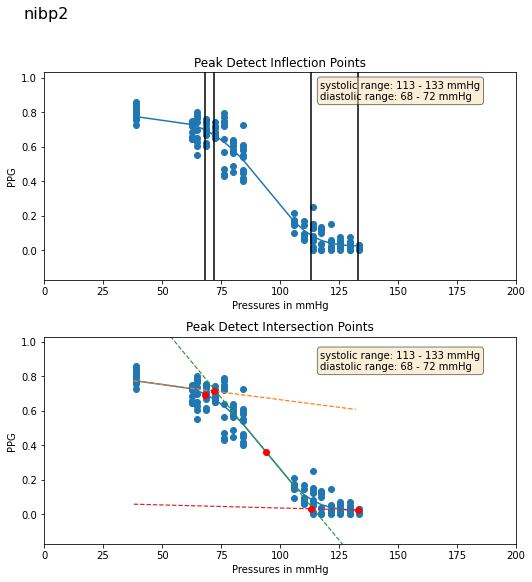

210811CP:
210811CP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.638283  1.415123  0.977741  1.432797  0.007017  0.954852
1    64.531624  0.825446  0.970537  0.805659  0.005931  0.949412
2    68.473518  1.073838  0.961015  1.056007  0.006383  0.848471
3    72.147484  1.079909  0.928914  1.104733  0.006897  0.860747
4    76.058731  1.400981  0.926756  1.338212  0.006096  0.785138
5    84.030571  0.799420  0.878897  0.699048  0.004653  0.812659
6    87.980202  0.755669  0.860667  0.726759  0.004542  0.750003
7    92.077728  0.574807  0.840126  0.546759  0.003680  0.768416
8    95.743912  0.533408  0.638827  0.412120  0.002582 -0.106415
9    99.781502  0.311999  0.450173  0.187720  0.001179 -0.077002
10  103.697456  0.308505 -0.177516  0.207755  0.001314 -0.668960
11  107.792252  0.187938 -0.644712  0.101153  0.000628 -0.892089
12  111.919121  0.108296 -0.461192  0.052698  0.000332 -0.872222
13  115.367729  0.055672 -0.217503  0.038192  0.000254 -0.889330
14  11

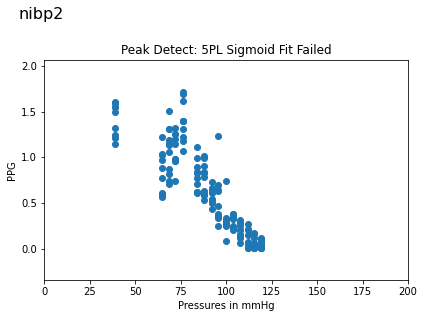

5tttttttttttttttttttttttttttt5
210812AP:
210812AP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.907345  0.677617  0.956626  0.753991  0.009960  0.948805
1    78.355385  0.802734  0.955785  0.869916  0.009769  0.910817
2    82.366425  0.653964  0.974888  0.797452  0.009200  0.958140
3    86.333405  0.679008  0.989215  0.776415  0.010078  0.972177
4    90.361748  0.629987  0.968460  0.791695  0.007172  0.959807
5    94.063049  0.382053  0.902222  0.513238  0.004007  0.864452
6    97.958344  0.404614  0.931409  0.538167  0.005594  0.907319
7   101.878822  0.434813  0.906176  0.612794  0.003493  0.868999
8   108.090042  0.359866  0.854785  0.479498  0.003546  0.803541
9   112.007278  0.287471  0.508891  0.312263  0.002355  0.398568
10  115.487297  0.094855  0.139368  0.040437  0.000377 -0.801987
11  119.492714  0.153269  0.250561  0.125337  0.001561 -0.127314
12  123.671066  0.041246  0.033312  0.024981  0.000193 -0.464073
13  127.674927  0.034020 -0.015871  0.01

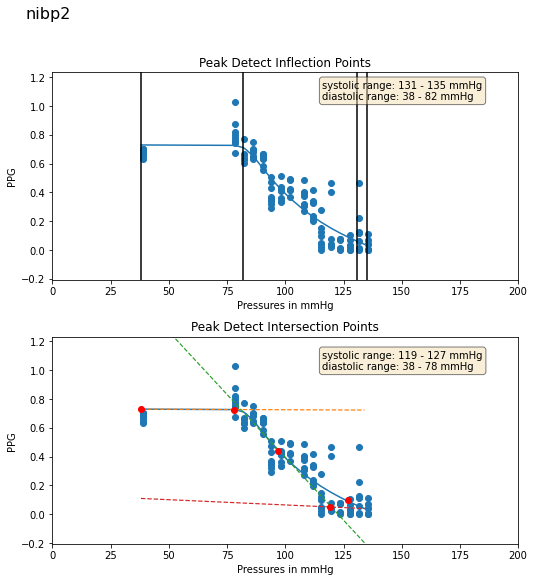

210717BP:
210717BP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.062466  0.859802  0.943634  0.728415  0.007245  0.879595
1    62.797478  0.818301  0.952651  0.752543  0.008875  0.915668
2    66.883942  0.954963  0.918165  0.834693  0.009407  0.865866
3    70.753334  0.939887  0.948896  0.905557  0.008223  0.935267
4    74.559296  0.568343  0.959064  0.590571  0.004799  0.940500
5    78.601761  0.691804  0.915237  0.660058  0.005379  0.804837
6    83.025299  0.619202  0.917834  0.627751  0.004744  0.887597
7    86.671196  0.495594  0.941678  0.566646  0.003857  0.906301
8   108.167030  0.241163  0.831860  0.247129  0.001801  0.741705
9   112.122627  0.195632  0.709741  0.165282  0.001139  0.558277
10  115.564781  0.151898  0.720826  0.154652  0.001433  0.379363
11  119.574799  0.135226 -0.174924  0.064535  0.000636 -0.519925
12  123.502449  0.088888  0.236700  0.067019  0.000458 -0.005603
13  127.587494  0.049940 -0.107320  0.023826  0.000222 -0.619138
14  13

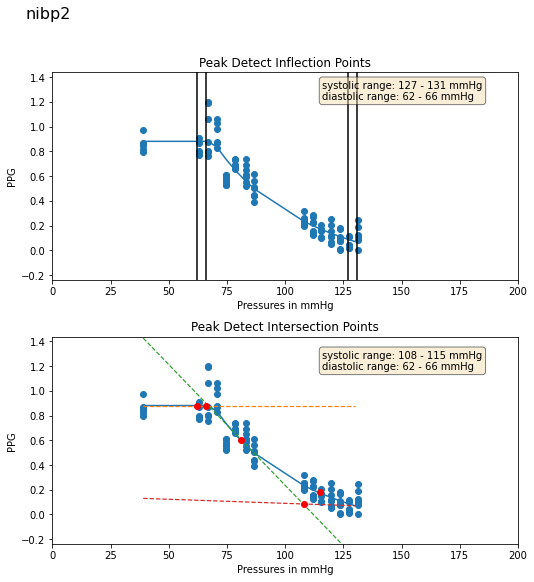

210716BP:
210716BP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.074558  0.986376  0.989487  1.050904  0.004000  0.942853
1    63.042835  0.912253  0.984261  0.971118  0.005857  0.954359
2    66.788177  1.056151  0.987333  1.106803  0.005634  0.973788
3    70.357338  0.987041  0.980174  1.064898  0.005261  0.963611
4    74.508865  0.822177  0.978805  0.991526  0.004261  0.957475
5    78.669525  0.787422  0.973888  0.952836  0.004613  0.964605
6    82.948219  0.716729  0.946301  0.863943  0.004127  0.916363
7    86.655441  0.674399  0.930943  0.836644  0.003648  0.870286
8    98.067284  0.432815  0.803067  0.516979  0.002052  0.302253
9   102.206528  0.268473  0.703000  0.329974  0.001486  0.514937
10  106.376640  0.206564  0.694543  0.246068  0.000929  0.491892
11  110.250153  0.162608 -0.327121  0.096321  0.000418 -0.828730
12  114.166466  0.083287 -0.217144  0.040392  0.000171 -0.928538
13  117.835541  0.114386 -0.152288  0.067446  0.000263 -0.597596
14  12

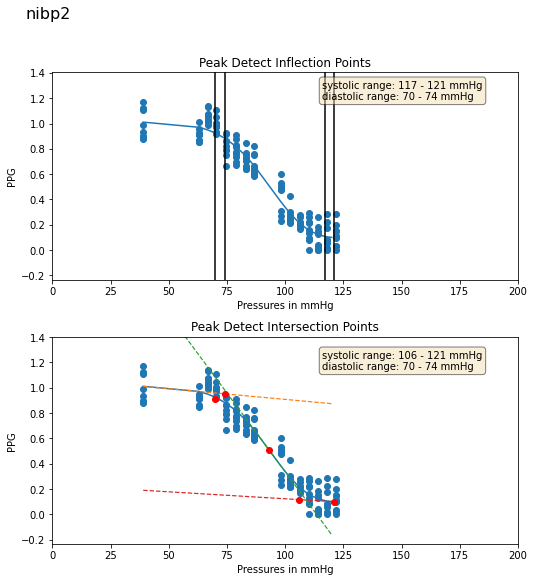

210819BP:
210819BP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.841873  0.638212  0.987289  0.660797  0.006190  0.980196
1    55.357849  0.692243  0.974928  0.708100  0.007921  0.968369
2    59.775608  0.917597  0.936957  0.893833  0.004717  0.905036
3    63.709194  0.822138  0.941710  0.812617  0.005078  0.918206
4    68.207619  0.720492  0.926911  0.701307  0.004920  0.837897
5    71.437454  0.904517  0.834434  0.917126  0.003535  0.776264
6    75.581879  0.618892  0.831970  0.571538  0.003847  0.744056
7    79.868660  0.542416  0.872277  0.513519  0.003425  0.804508
8    89.489136  0.255916  0.704147  0.229090  0.001690  0.355651
9    93.724945  0.182198  0.299171  0.135084  0.000900 -0.231412
10   97.248726  0.213516  0.025857  0.143788  0.001164 -0.361212
11  101.130096  0.207786  0.042971  0.130412  0.000599 -0.750900
12  104.927658  0.153959 -0.005622  0.040666  0.000266 -0.805461
13  109.258507  0.111613 -0.073817  0.040469  0.000317 -0.650763
14  11

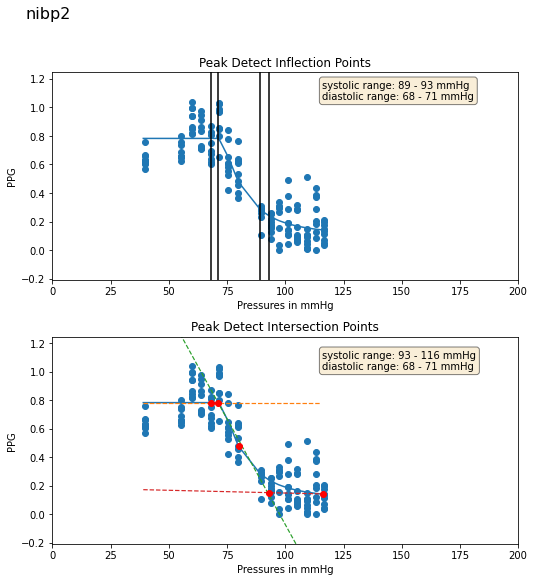

In [ ]:
patients=[]
lsys=[]
na=[]
d0=[]
d1=[]
d2=[]
d3=[]
d4=[]
d5=[]
d6=[]
d7=[]
d08=[]
d8=[]
d9=[]
d10=[]
d11=[]
d12=[]
d13=[]
d14=[]
d015=[]
d15=[]
d16=[]
d17=[]
d18=[]
d19=[]
d20=[]
d21=[]
d22=[]
folder = '/content/drive/MyDrive/data40/sphygmo/'
for patient in [x for x in os.listdir(folder)if x.find('P')!=-1]:
# for patient in ['210717BP']:
  nibp = NIBPProcessor(folder+patient+'/nibp2.txt')
  nibp.save_peak_locations()
  nibp.detect_plateaus()
  print(f'{patient}:')
  ita1, sys1 = nibp.compute_ita()
  # print(f'{patient}: {sys1}')
  patients.append(patient)
  lsys.append(sys1)
  nibp.fitting(folder+patient+'/nibp2.txt',patient)

rangedf = pd.DataFrame()  
dia_fin = pd.DataFrame()  
dia_fin['patient']=na
dia_fin['d0']=d0
dia_fin['d1']=d1
dia_fin['d2']=d2
dia_fin['d3']=d3
dia_fin['d4']=d4
dia_fin['d5']=d5
dia_fin['d6']=d6
dia_fin['d7']=d7
dia_fin['d08']=d08
dia_fin['d8']=d8
dia_fin['d9']=d9
dia_fin['d10']=d10
dia_fin['d11']=d11
dia_fin['d12']=d12
dia_fin['d13']=d13
dia_fin['d14']=d14
dia_fin['d015']=d015
dia_fin['d15']=d15
dia_fin['d16']=d16
dia_fin['d17']=d17
dia_fin['d18']=d18
dia_fin['d19']=d19
dia_fin['d20']=d20
dia_fin['d21']=d21
# dia_fin['d22updated']=d22
save_df(dia_fin, 'diastolica2.csv')
# rangedf['Low_sys']=lsys


210715BP:
210715BP
           ppi      aucr      corl      ampr   amponly    cormin
0    28.962420  1.098651  0.997824  1.017905  0.013303  0.995412
1    37.155746  1.024124  0.998627  0.957853  0.012528  0.996949
2    44.964745  1.076563  0.997269  1.046978  0.013463  0.993445
3    52.631668  1.061087  0.991112  1.103823  0.015076  0.980254
4    60.902760  0.228589  0.739304  0.294468  0.003851  0.542244
5    68.943466  0.305498  0.864164  0.386593  0.005100  0.785114
6    77.916725  0.483135  0.946868  0.536877  0.006582  0.773032
7    85.624329  0.506107  0.770108  0.424380  0.005494 -0.074450
8    93.448898  0.342514  0.800206  0.314284  0.003941  0.483927
9   101.227409  0.197345  0.567560  0.148346  0.001857 -0.187890
10  108.745148  0.161288 -0.569546  0.086465  0.001094 -0.793901
11  117.586563  0.067906 -0.222018  0.023046  0.000319 -0.754608
12  122.753326  0.139651 -0.187027  0.021215  0.000275 -0.837237
13  127.652596  0.045999  0.012405  0.016913  0.000216 -0.494344
14  13

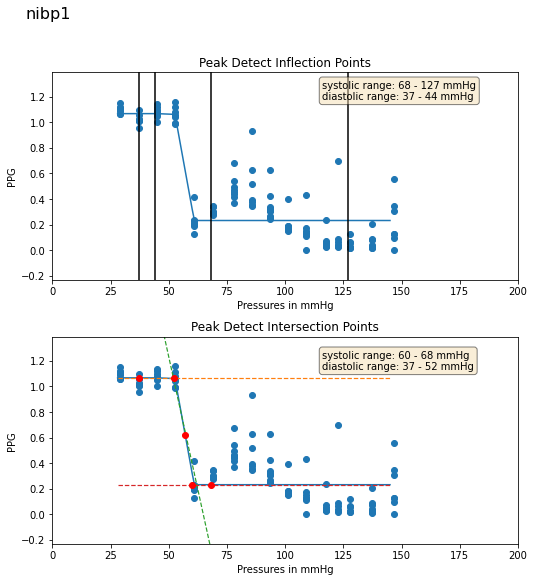

210715CP:
210715CP
           ppi      aucr      corl      ampr   amponly    cormin
0    28.568144  0.452655  0.984362  0.448737  0.003764  0.944685
1    36.413986  0.335038  0.974821  0.359932  0.003040  0.938367
2    44.625572  0.359049  0.972829  0.326692  0.002888  0.917826
3    52.209435  0.398160  0.961080  0.344197  0.003250  0.827242
4    60.361156  0.311352  0.965970  0.308339  0.002842  0.817431
5    68.435509  0.343877  0.968953  0.328682  0.002826  0.918271
6    77.238029  0.307720  0.846465  0.300640  0.002940  0.713680
7    84.746025  0.216140  0.829394  0.189122  0.001909  0.693343
8    92.915260  0.126872  0.408958  0.088529  0.000832 -0.551035
9   100.679482  0.089642 -0.280356  0.046326  0.000433 -0.759419
10  108.300423  0.070967 -0.207671  0.027138  0.000241 -0.854097
11  117.197800  0.042019 -0.005245  0.023543  0.000219 -0.679832
12  122.269768  0.029991 -0.107799  0.020508  0.000198 -0.564499
13  127.089485  0.044009 -0.051063  0.017385  0.000188 -0.694783
14  13

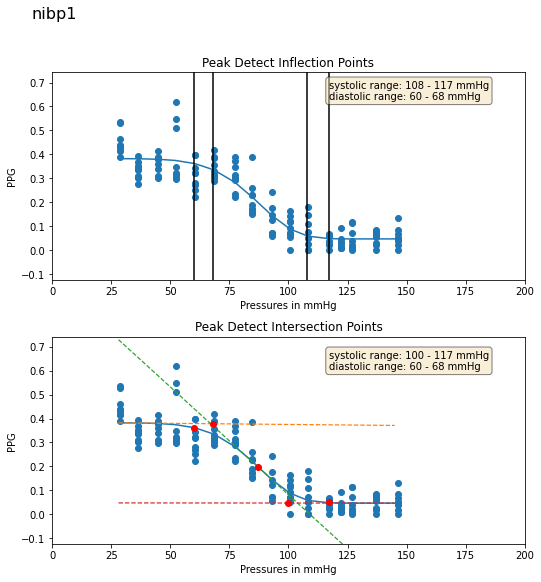

210715AP:
210715AP
           ppi      aucr      corl      ampr   amponly    cormin
0    28.800945  0.789923  0.993706  0.711829  0.021117  0.975955
1    36.813519  0.787680  0.993390  0.706580  0.021283  0.988909
2    44.884468  0.738138  0.989691  0.686794  0.019227  0.966050
3    52.613190  0.717817  0.986181  0.672799  0.021054  0.961952
4    60.731991  0.716473  0.978835  0.644999  0.020419  0.967900
5    68.774429  0.684928  0.943401  0.633247  0.017360  0.926387
6    77.513885  0.487184  0.836115  0.440995  0.013075  0.799042
7    85.251854  0.328412  0.828934  0.303966  0.009152  0.780385
8    93.126297  0.149362  0.672892  0.135284  0.004172  0.126046
9   100.947083  0.114901  0.395549  0.071158  0.002241 -0.638667
10  108.436264  0.049727 -0.355607  0.017262  0.000565 -0.687510
11  117.184265  0.024084  0.039234  0.005528  0.000181 -0.714950
12  122.533211  0.016169 -0.098618  0.005191  0.000169 -0.732801
13  127.263390  0.028837  0.119526  0.008171  0.000213 -0.695452
14  13

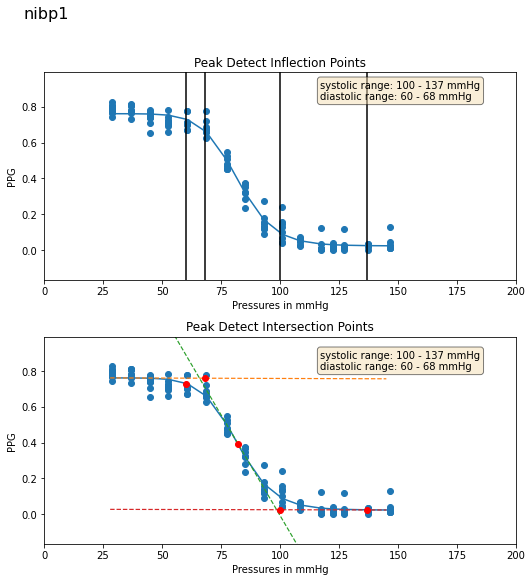

210716AP:
210716AP
           ppi      aucr      corl      ampr   amponly    cormin
0    29.249004  0.957529  0.977574  1.085938  0.010789  0.966212
1    38.111454  1.142861  0.992868  1.173285  0.016647  0.983122
2    47.429790  1.063278  0.987534  1.108392  0.017717  0.972613
3    56.369949  1.068439  0.991943  1.085992  0.017150  0.982087
4    65.875870  1.209823  0.991043  1.257819  0.017527  0.984731
5    74.469208  1.293853  0.985643  1.335618  0.013662  0.961853
6    83.536232  1.163738  0.952216  1.239062  0.017089  0.894062
7    92.540588  1.011836  0.938294  0.969984  0.016497  0.910255
8   101.541046  0.727377  0.911189  0.749533  0.012591  0.880368
9   109.765198  0.292879  0.882055  0.285515  0.004610  0.787430
10  118.752640  0.280451  0.794738  0.283029  0.002941  0.300705
11  128.507248  0.249391  0.267946  0.190539  0.002004 -0.025449
12  133.382355  0.245291  0.254036  0.178966  0.002846 -0.626441
13  138.399368  0.116538 -0.572072  0.038837  0.000621 -0.743706
14  14

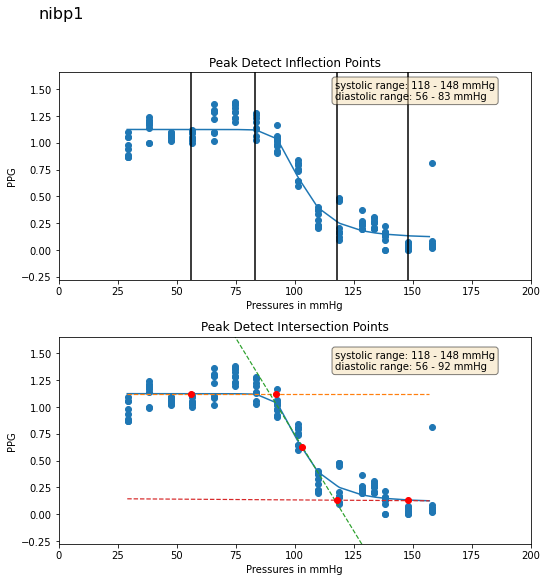

210717AP:
210717AP
           ppi      aucr      corl      ampr   amponly    cormin
0    37.084393  1.982747  0.989250  1.805878  0.019380  0.986711
1    44.972706  1.850522  0.979607  1.713548  0.020493  0.938118
2    52.862488  2.014613  0.983883  1.908545  0.020149  0.951749
3    60.912018  2.061458  0.978242  1.916383  0.020565  0.972703
4    68.916870  2.034197  0.945339  1.990564  0.024846  0.899485
5    77.918312  1.818414  0.852907  1.850436  0.022753  0.745801
6    85.559921  1.061741  0.884354  1.094245  0.010871  0.868713
7    93.453651  0.889775  0.762314  0.912028  0.010509  0.713395
8   101.309639  0.209038  0.598299  0.214081  0.001906  0.404379
9   108.858940  0.346849  0.220885  0.312717  0.003888 -0.064032
10  117.860497  0.041897 -0.013261  0.018716  0.000256 -0.808747
11  123.023125  0.023773  0.103190  0.022837  0.000327 -0.650341
12  127.837059  0.039856  0.078026  0.026460  0.000356 -0.417002
13  137.701599  0.053847  0.161089  0.017943  0.000258 -0.583750
14  14

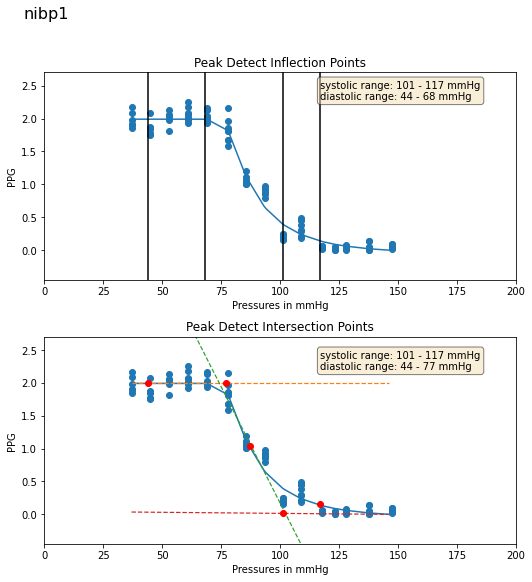

210719AP:
210719AP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.087433  1.126683  0.986182  1.112437  0.012414  0.965720
1    46.719227  1.152240  0.976083  1.122900  0.004594  0.953905
2    56.278481  1.165613  0.990129  1.165352  0.017098  0.970748
3    64.877060  1.164687  0.980336  1.137729  0.007545  0.958818
4    73.928467  1.243260  0.980783  1.257569  0.010826  0.968817
5    82.618904  1.099520  0.977527  1.105357  0.011251  0.963257
6    91.587082  1.029950  0.961084  1.104658  0.009262  0.940498
7   100.463226  0.894678  0.938210  0.988410  0.009337  0.902261
8   109.813629  0.825978  0.914820  1.017335  0.003646  0.824182
9   118.220268  0.881606  0.783396  0.676041  0.005364  0.095663
10  128.327072  0.355750  0.189191  0.274338  0.002573 -0.169540
11  133.223969  0.381923 -0.176010  0.224561  0.001872 -0.928718
12  138.274002  0.415222  0.107017  0.259564  0.001753 -0.163637
13  147.728928  0.077195 -0.106542  0.044364  0.000264 -0.818561
14  15

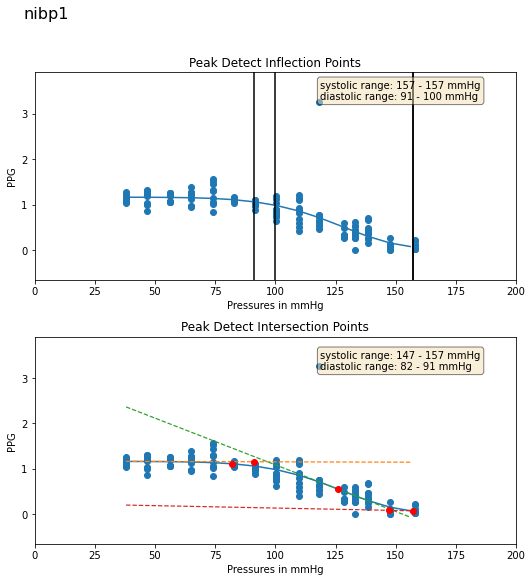

210719BP:
210719BP
           ppi      aucr      corl      ampr   amponly    cormin
0    28.699224  0.949946  0.980848  0.984141  0.008276  0.955859
1    37.829498  1.058679  0.972767  1.054302  0.007929  0.933089
2    46.640472  0.776429  0.960478  0.783170  0.006242  0.898886
3    55.946793  0.877050  0.971549  0.833186  0.010021  0.936889
4    64.934067  0.856487  0.936574  0.825265  0.012401  0.877269
5    73.596558  0.837973  0.890759  0.784297  0.011752  0.819464
6    82.952354  0.610972  0.827891  0.573042  0.007477  0.740522
7    91.504128  0.443536  0.770268  0.409798  0.006111  0.697448
8   100.293472  0.410870  0.400664  0.275400  0.003795  0.005664
9   109.076324  0.239908  0.150702  0.149452  0.002028 -0.034417
10  117.853447  0.059830 -0.468900  0.020184  0.000283 -0.850723
11  127.791008  0.080698  0.279269  0.009950  0.000157 -0.675040
12  132.574005  0.038035 -0.101083  0.012737  0.000193 -0.698449
13  137.796982  0.035623  0.285850  0.009756  0.000156 -0.456867
14  14

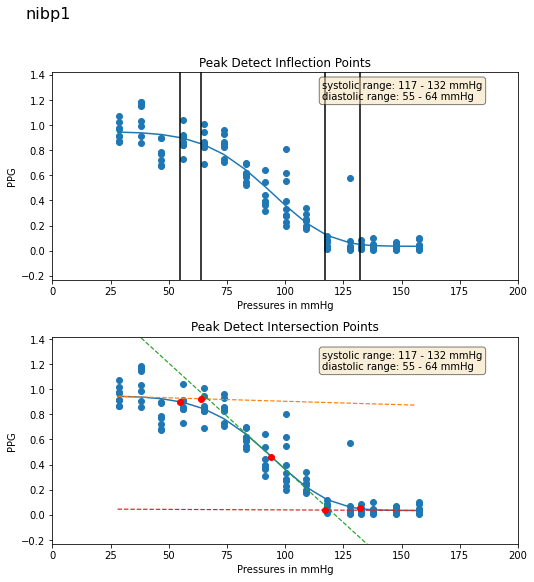

210720AP:
210720AP
           ppi      aucr      corl      ampr   amponly    cormin
0    28.719282  0.784946  0.978764  0.800283  0.012913  0.976286
1    37.430607  0.805225  0.958723  0.831654  0.012909  0.828173
2    46.192207  0.832665  0.988141  0.830525  0.011905  0.972871
3    55.490986  0.761362  0.984400  0.810910  0.013201  0.953841
4    64.272102  0.817527  0.988253  0.829635  0.012745  0.981792
5    73.114555  0.763508  0.993969  0.813408  0.013371  0.980922
6    82.165840  0.689567  0.974119  0.778531  0.012795  0.956944
7    90.842880  0.585857  0.946511  0.629730  0.009446  0.878847
8    99.556633  0.299474  0.913990  0.342235  0.005646  0.893043
9   108.333229  0.214194  0.485544  0.175310  0.002869  0.261324
10  117.060104  0.114823  0.205473  0.114168  0.001588 -0.264607
11  127.001991  0.023557  0.158361  0.010320  0.000148 -0.656156
12  131.728119  0.024199 -0.106195  0.011646  0.000175 -0.752920
13  136.777740  0.030749  0.054545  0.010177  0.000135 -0.712589
14  14

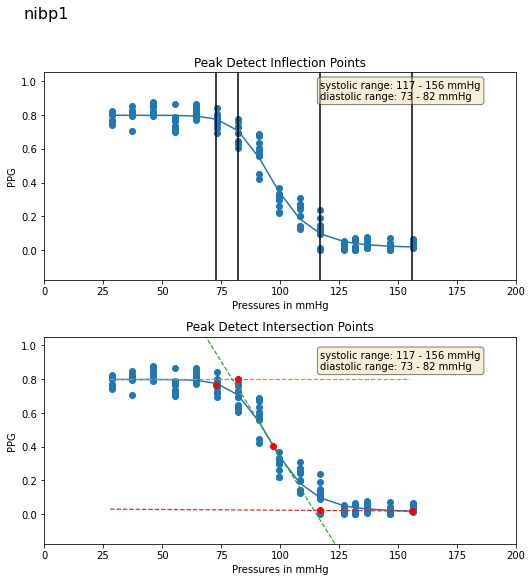

210720BP:
210720BP
           ppi      aucr      corl      ampr   amponly    cormin
0    29.023771  0.794571  0.986746  0.814818  0.008520  0.971830
1    37.904819  0.709534  0.988829  0.736059  0.004552  0.977413
2    46.713757  0.790059  0.982612  0.773602  0.005356  0.961576
3    55.916584  0.740515  0.977746  0.799441  0.004024  0.967672
4    65.206596  0.734126  0.944658  0.786043  0.004507  0.903134
5    73.785110  0.619866  0.923654  0.641525  0.003722  0.900653
6    82.666557  0.434572  0.879552  0.489661  0.002188  0.795633
7    91.480988  0.232056  0.748031  0.258109  0.001817  0.577766
8   100.267410  0.168798 -0.093474  0.075184  0.000569 -0.503471
9   108.962379  0.156976  0.091630  0.025620  0.000200 -0.882679
10  118.038185  0.133255 -0.184778  0.013402  0.000121 -0.819201
11  127.995163  0.089963 -0.164315  0.013046  0.000164 -0.740297
12  132.774414  0.118451  0.127283  0.016232  0.000184 -0.707789
13  138.117599  0.195902  0.088068  0.034807  0.000211 -0.742908
14  14

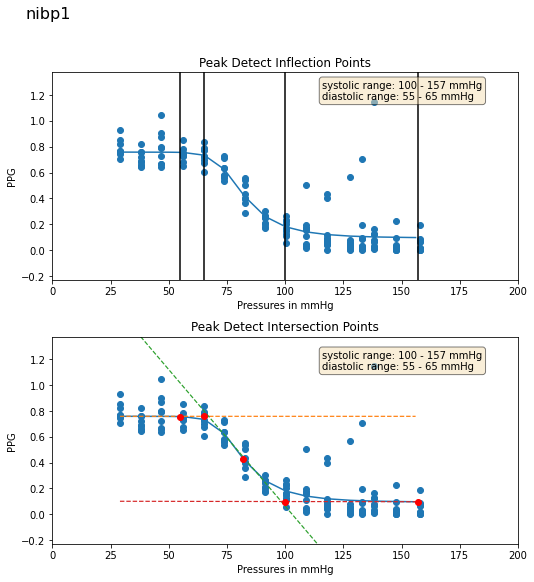

210723AP:
210723AP
           ppi      aucr      corl      ampr   amponly    cormin
0    29.000048  0.599258  0.989942  0.603411  0.002007  0.977206
1    38.857834  0.343487  0.968326  0.349069  0.003818  0.946788
2    48.495609  0.316916  0.974386  0.336958  0.003712  0.941048
3    58.863838  0.326650  0.982024  0.342824  0.003793  0.967278
4    68.836266  0.326649  0.993257  0.347737  0.003641  0.980210
5    78.963943  0.333869  0.990081  0.375143  0.003561  0.966807
6    88.717369  0.392126  0.978374  0.465684  0.002714  0.945190
7    98.944420  0.265382  0.958841  0.311875  0.003128  0.946320
8   108.413429  0.163651  0.916256  0.196940  0.001981  0.875305
9   118.081116  0.064196  0.642640  0.064731  0.000711  0.452197
10  128.012360  0.087400 -0.239258  0.061256  0.000633 -0.695037
11  137.948090  0.073212 -0.077531  0.022358  0.000132 -0.734368
12  142.800049  0.034383 -0.116525  0.018301  0.000181 -0.891153
13  147.454788  0.041572  0.021505  0.024904  0.000236 -0.582676
14  15

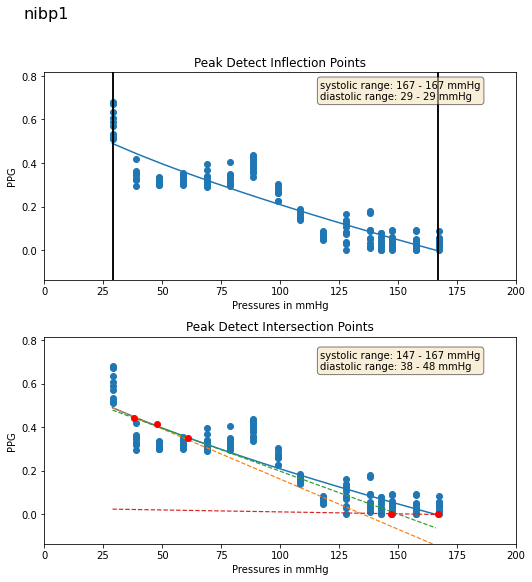

210724AP:
210724AP
           ppi      aucr      corl      ampr   amponly    cormin
0    29.737555  0.515006  0.953022  0.555589  0.003972  0.916400
1    40.420887  0.373026  0.968335  0.397665  0.004887  0.932667
2    49.941875  0.387097  0.989467  0.384063  0.005062  0.977928
3    59.694321  0.356567  0.987485  0.334936  0.004242  0.978186
4    70.190292  0.376925  0.990482  0.374623  0.003903  0.984946
5    79.366104  0.406262  0.973504  0.387948  0.004015  0.959394
6    89.887352  0.455267  0.963442  0.438683  0.003575  0.924131
7    99.900002  0.310381  0.921273  0.308941  0.002792  0.759861
8   109.320724  0.193708  0.611377  0.157415  0.002231  0.533865
9   118.795868  0.189313  0.234241  0.099524  0.001415  0.053079
10  129.000946  0.092102  0.249409  0.045710  0.000464 -0.557800
11  138.537567  0.056060  0.076346  0.019565  0.000291 -0.634413
12  143.399689  0.044439  0.058715  0.017749  0.000264 -0.238219
13  148.280762  0.058063  0.330774  0.028154  0.000348 -0.231706
14  15

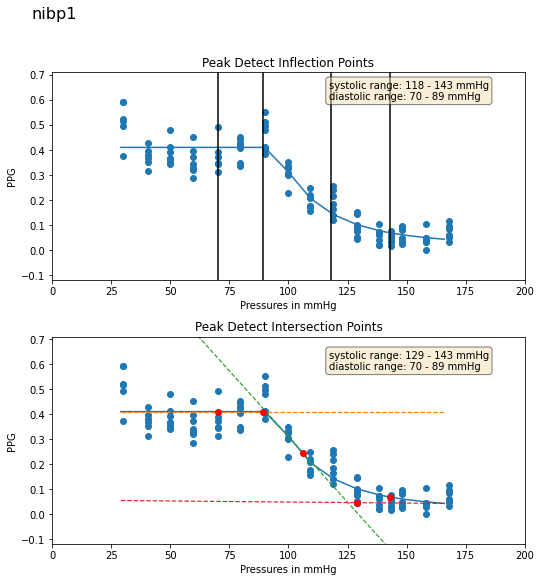

210724BP:
210724BP
           ppi      aucr      corl      ampr   amponly    cormin
0    29.185280  0.261117  0.981877  0.281452  0.002487  0.949762
1    37.319561  0.490510  0.967453  0.463627  0.005564  0.945830
2    45.215626  0.471005  0.977322  0.439398  0.006397  0.952182
3    53.071777  0.404295  0.958798  0.377467  0.004687  0.915687
4    61.587429  0.346930  0.951667  0.345849  0.005057  0.896424
5    69.164719  0.331372  0.909909  0.327563  0.005643  0.860342
6    78.414597  0.353723  0.832184  0.365308  0.005088  0.724563
7    85.931839  0.259556  0.821994  0.271848  0.004664  0.789184
8    93.749161  0.087865  0.815187  0.085028  0.001101  0.605693
9   101.892792  0.107211  0.085688  0.085174  0.001806 -0.201792
10  109.473366  0.046067 -0.411375  0.026821  0.000734 -0.899407
11  118.342018  0.030032  0.029721  0.007119  0.000195 -0.520971
12  123.588356  0.024004 -0.286472  0.009019  0.000212 -0.639841
13  128.480698  0.032395  0.033465  0.010085  0.000171 -0.657348
14  13

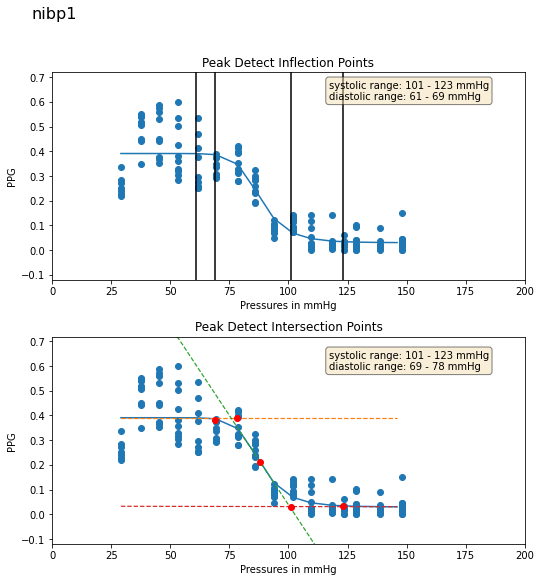

210726AP:
210726AP
           ppi      aucr      corl      ampr   amponly    cormin
0    29.132462  0.756980  0.985827  0.782609  0.011068  0.960990
1    40.517025  0.752860  0.984935  0.769970  0.010450  0.961093
2    50.804222  0.788093  0.984781  0.814253  0.011313  0.959839
3    63.143063  0.805400  0.986215  0.849314  0.010091  0.964823
4    73.877762  0.763763  0.990823  0.772261  0.010321  0.972992
5    84.967758  0.792875  0.995946  0.848243  0.011328  0.990647
6    96.750786  0.718344  0.990990  0.886826  0.012468  0.982276
7   107.817833  0.620264  0.970367  0.808011  0.010227  0.953567
8   119.117020  0.406508  0.941530  0.529257  0.006445  0.881896
9   130.870346  0.215127  0.856850  0.283049  0.003689  0.811957
10  141.490158  0.145148  0.387848  0.153078  0.002123 -0.102549
11  153.030182  0.173402 -0.239374  0.153679  0.002317 -0.827386
12  158.331131  0.176180  0.087590  0.139241  0.001979 -0.322988
13  162.810547  0.032927 -0.016447  0.012253  0.000147 -0.638174
14  17

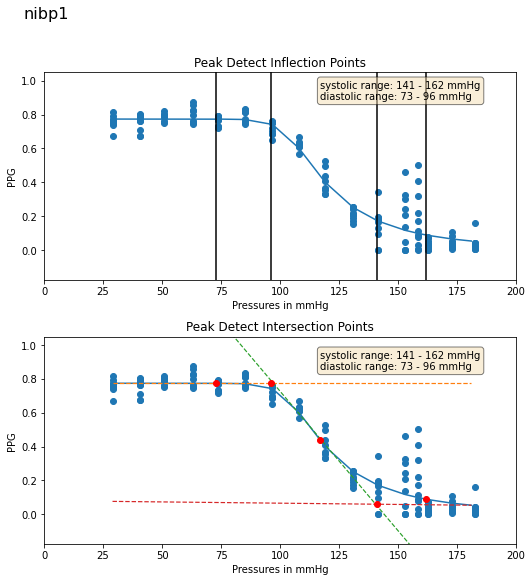

210726BP:
210726BP
           ppi      aucr      corl      ampr   amponly    cormin
0    29.122002  0.754355  0.997893  0.778872  0.018706  0.991983
1    38.135792  0.707831  0.998118  0.731137  0.018215  0.997554
2    46.791103  0.568482  0.990839  0.571812  0.016117  0.988429
3    56.478474  0.627089  0.981790  0.621304  0.013381  0.955904
4    65.050446  0.686484  0.980337  0.762956  0.014976  0.971632
5    74.016502  0.534206  0.965181  0.626879  0.016203  0.927896
6    83.080788  0.605286  0.963434  0.730095  0.016189  0.945499
7    91.714348  0.364207  0.914284  0.497349  0.011643  0.885265
8   100.394890  0.217893  0.829703  0.302244  0.007152  0.754267
9   109.301445  0.162040  0.526989  0.186065  0.003902  0.159935
10  118.033432  0.080367  0.592282  0.096981  0.001313  0.522809
11  128.166733  0.125126 -0.357949  0.101718  0.002003 -0.890701
12  132.876846  0.021321  0.149123  0.009661  0.000228 -0.384380
13  138.065979  0.014499  0.080726  0.006481  0.000171 -0.693505
14  14

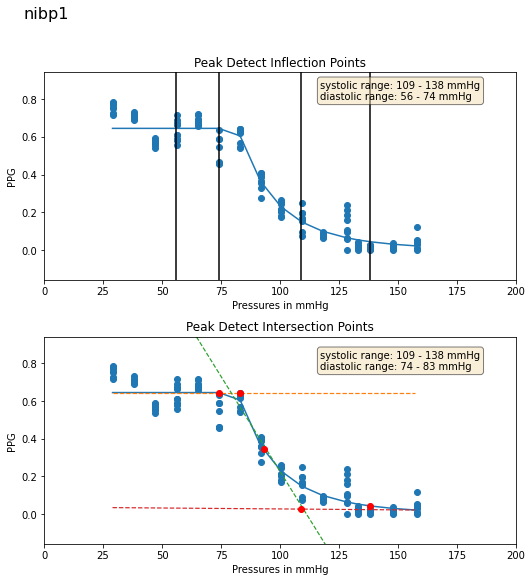

210726CP:
210726CP
           ppi      aucr      corl      ampr   amponly    cormin
0    28.596231  1.379326  0.998638  1.346604  0.008635  0.996248
1    38.879520  1.633153  0.995997  1.575734  0.008865  0.990310
2    50.117611  1.268593  0.989680  1.295732  0.008617  0.970545
3    60.697079  1.596398  0.983793  1.531603  0.014963  0.933784
4    71.729317  1.471923  0.977941  1.437781  0.013062  0.958440
5    82.601257  1.717268  0.950669  1.671181  0.009162  0.879080
6    93.388725  1.277623  0.895314  1.181662  0.010372  0.816225
7   104.431671  1.122875  0.795780  1.065823  0.009000  0.312653
8   115.380157  0.824641  0.885883  0.949710  0.004842  0.703407
9   126.186752  0.583929  0.622659  0.436066  0.003864  0.281171
10  136.934875  0.314140 -0.103562  0.165081  0.001410 -0.447239
11  147.650681  0.137608 -0.476594  0.045211  0.000386 -0.810209
12  152.307571  0.105762  0.243805  0.031778  0.000241 -0.838333
13  157.374710  0.083666  0.230096  0.026797  0.000203 -0.677928
14  16

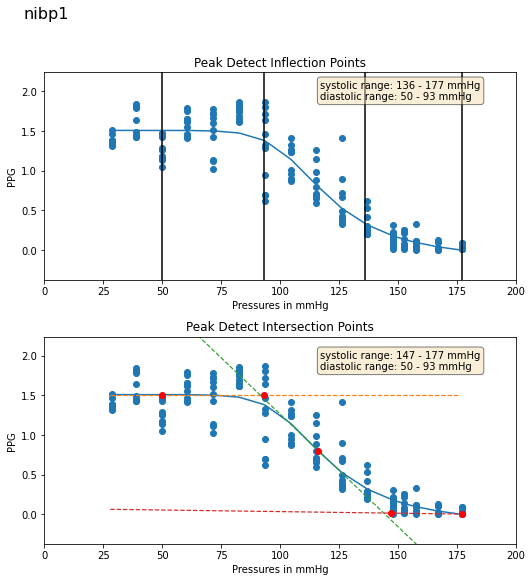

210728AP:
210728AP
           ppi      aucr      corl      ampr   amponly    cormin
0    28.951599  1.364063  0.973614  1.249883  0.010535  0.947091
1    39.171944  1.239413  0.985137  1.158109  0.014005  0.974336
2    50.064125  1.264994  0.968516  1.157430  0.012564  0.945348
3    60.877457  1.091228  0.976652  0.992542  0.008616  0.953778
4    71.819130  1.424188  0.952733  1.305856  0.013935  0.919069
5    82.883850  1.123719  0.945867  1.025165  0.010026  0.934019
6    93.396515  1.152706  0.907138  1.094986  0.010500  0.875169
7   104.186981  0.634334  0.793611  0.592575  0.006458  0.717032
8   114.898666  0.567671  0.456476  0.429850  0.004101  0.281238
9   125.685402  0.165733  0.338588  0.060769  0.000567  0.055351
10  136.295715  0.064536  0.163707  0.014739  0.000226 -0.301831
11  147.034058  0.059941  0.002585  0.021587  0.000319 -0.284224
12  151.880264  0.057151 -0.146433  0.016543  0.000241 -0.715873
13  157.101913  0.083014  0.058561  0.021349  0.000251 -0.269754
14  16

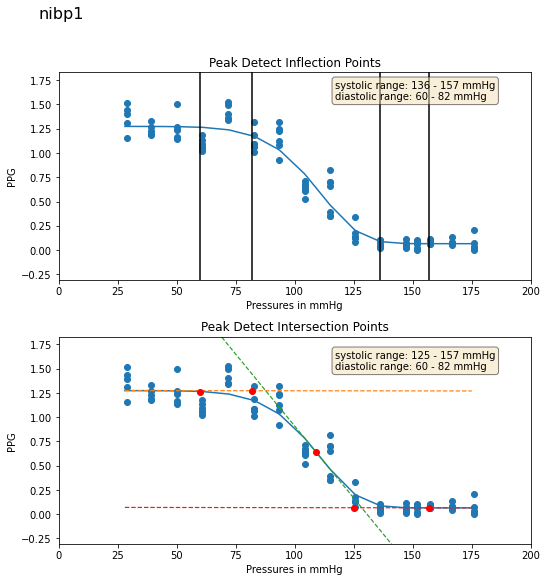

210728BP:
210728BP
           ppi      aucr      corl      ampr   amponly    cormin
0    35.307800  0.790273  0.927635  0.852309  0.011597  0.860552
1    42.797619  0.916189  0.968527  1.042892  0.011903  0.956623
2    49.661510  0.874411  0.965863  0.960338  0.013973  0.935112
3    57.339291  0.995899  0.955237  1.151570  0.012278  0.930701
4    64.456642  1.406057  0.953381  1.697272  0.010586  0.936123
5    71.288750  1.780492  0.977709  2.017227  0.009023  0.966395
6    78.178116  0.830509  0.983231  0.929812  0.011506  0.957158
7    86.194954  0.578088  0.962949  0.700406  0.008545  0.954027
8    93.129814  0.386257  0.938835  0.487841  0.006191  0.904186
9    99.818954  0.303289  0.784598  0.321808  0.004375  0.685889
10  107.840759  0.189567  0.363294  0.187398  0.001757  0.039501
11  112.443451  0.074176 -0.214822  0.046889  0.000668 -0.712127
12  117.211205  0.039411 -0.235619  0.018925  0.000185 -0.890831
13  127.298882  0.018413 -0.167007  0.013217  0.000129 -0.804062
14  13

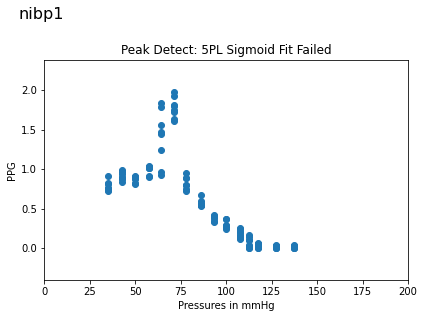

5tttttttttttttttttttttttttttt5
210729AP:
210729AP
           ppi      aucr      corl      ampr   amponly    cormin
0    28.728527  0.646415  0.987274  0.677502  0.003796  0.970561
1    39.427479  0.555082  0.989763  0.597050  0.003500  0.983268
2    51.620342  0.609589  0.987955  0.638637  0.004445  0.966300
3    63.291878  0.545744  0.985585  0.612524  0.004732  0.958275
4    75.342751  0.549436  0.987118  0.612079  0.003953  0.964369
5    86.951584  0.594661  0.993035  0.659939  0.003089  0.982045
6    97.697845  0.619555  0.988268  0.763824  0.005503  0.982045
7   109.666679  0.479158  0.975322  0.618838  0.003223  0.957907
8   121.370712  0.567115  0.964812  0.786370  0.002834  0.925404
9   133.060486  0.258113  0.849974  0.358754  0.001217  0.734679
10  144.445633  0.176045  0.654917  0.218091  0.001446  0.406365
11  156.715271  0.043967  0.228876  0.018642  0.000187 -0.491050
12  161.359802  0.069094 -0.208546  0.051511  0.000219 -0.751892
13  166.160812  0.089243  0.355054  0.04

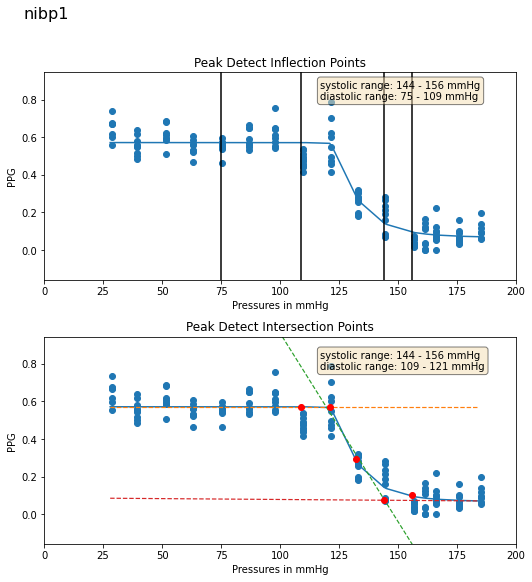

210729BP:
210729BP
           ppi      aucr      corl      ampr   amponly    cormin
0    29.012753  0.847848  0.992735  0.778022  0.016063  0.988012
1    37.235916  1.208542  0.993198  1.196225  0.017151  0.980864
2    45.782013  0.657476  0.995989  0.673548  0.018667  0.991474
3    54.121998  0.963591  0.988433  1.020934  0.014110  0.948066
4    62.910465  0.776021  0.997257  0.795880  0.015120  0.994573
5    71.742264  0.531215  0.969826  0.519277  0.014844  0.944000
6    79.869232  0.566348  0.949500  0.597632  0.016967  0.901189
7    88.724701  0.429667  0.928782  0.470570  0.016108  0.808406
8    97.159058  0.448485  0.863118  0.376463  0.011804  0.574269
9   104.609680  0.198721  0.862897  0.208715  0.006449  0.795178
10  113.860023  0.292109  0.401813  0.142511  0.005015 -0.042239
11  122.389755  0.075594 -0.098250  0.038097  0.000986 -0.640376
12  127.169022  0.054743 -0.396532  0.028626  0.000899 -0.820300
13  131.930176  0.017877  0.056048  0.006932  0.000251 -0.486098
14  14

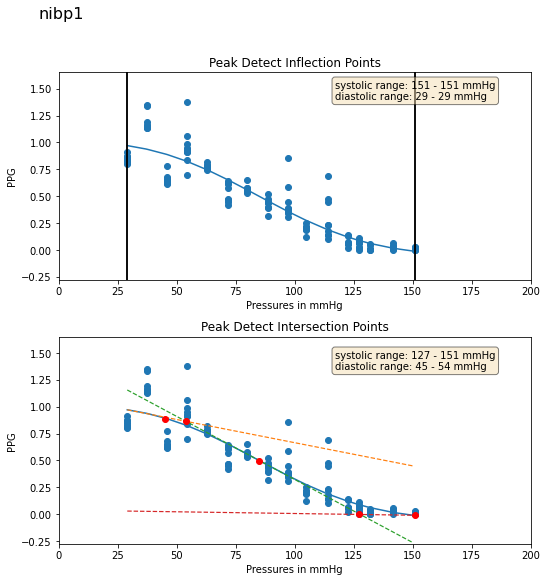

210730AP:
210730AP
           ppi      aucr      corl      ampr   amponly    cormin
0    28.889307  0.835758  0.991385  0.869386  0.004417  0.979819
1    37.609833  0.869935  0.992658  0.869636  0.003933  0.989180
2    49.838062  0.787841  0.989405  0.854604  0.004589  0.973540
3    56.854565  0.866664  0.989216  0.885947  0.004842  0.970869
4    66.966370  0.920232  0.974183  0.928630  0.005270  0.944326
5    76.320816  0.908021  0.977303  0.998335  0.006137  0.945923
6    85.612350  0.924850  0.932007  0.965131  0.005995  0.906439
7    94.834976  0.743675  0.903822  0.709814  0.004707  0.873105
8   104.529160  0.588039  0.920381  0.706436  0.005493  0.868803
9   113.257240  0.430001  0.779371  0.519959  0.004099  0.697355
10  123.202682  0.214010  0.329029  0.154122  0.001238 -0.270649
11  132.761795  0.148453  0.012223  0.116541  0.000834 -0.294695
12  138.058792  0.078146 -0.188251  0.039279  0.000321 -0.640498
13  142.985092  0.080941 -0.028502  0.031718  0.000281 -0.619022
14  15

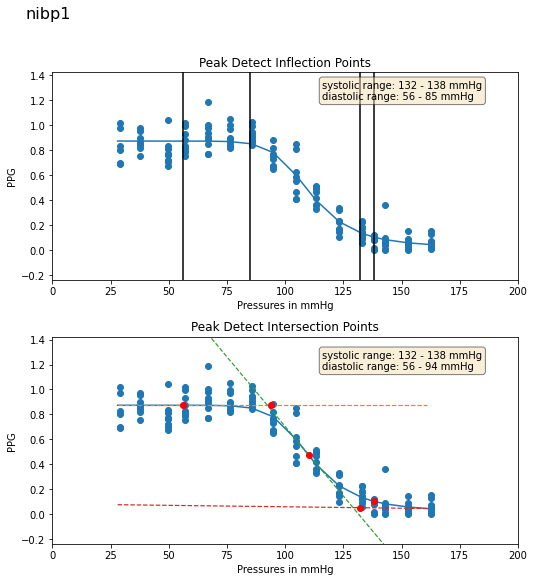

210730BP:
210730BP
           ppi      aucr      corl      ampr   amponly    cormin
0    29.387951  0.830723  0.994917  0.867014  0.012345  0.990911
1    38.198135  0.783403  0.990529  0.803422  0.012564  0.975385
2    47.129356  0.669383  0.988763  0.697475  0.011823  0.970536
3    56.431530  0.693072  0.987311  0.710660  0.014030  0.967483
4    64.995056  0.695208  0.985540  0.727991  0.012331  0.973420
5    74.096687  0.670235  0.976346  0.671669  0.011765  0.951662
6    83.171890  0.584738  0.912806  0.605329  0.011590  0.885583
7    91.986420  0.426100  0.833790  0.443449  0.008835  0.711441
8   101.007469  0.291260  0.595141  0.263558  0.005629  0.475357
9   109.500816  0.149314  0.507483  0.142643  0.002812  0.409042
10  118.286552  0.047765  0.026781  0.008596  0.000188 -0.564192
11  128.361725  0.046424  0.140901  0.009405  0.000191 -0.537094
12  133.199783  0.019769  0.124376  0.009195  0.000213 -0.759175
13  138.274048  0.017054  0.122465  0.006832  0.000157 -0.837111
14  14

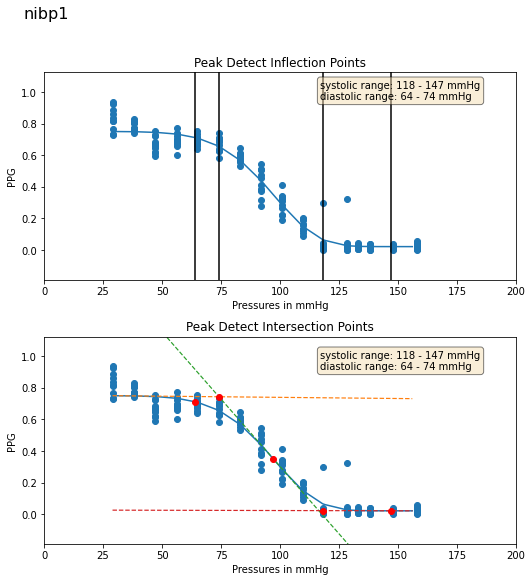

210730CP:
210730CP
           ppi      aucr      corl      ampr   amponly    cormin
0    28.620829  0.520056  0.993549  0.543626  0.012548  0.977648
1    38.988102  0.476016  0.989217  0.506846  0.011215  0.965379
2    49.738857  0.414287  0.984252  0.423257  0.009330  0.951833
3    61.196377  0.333338  0.982771  0.348735  0.008448  0.967937
4    71.866302  0.308498  0.985117  0.317085  0.007429  0.970770
5    82.944855  0.321231  0.962951  0.332247  0.007255  0.940724
6    93.854591  0.244039  0.936321  0.275820  0.006045  0.887893
7   104.500610  0.108250  0.684405  0.103958  0.002422  0.430252
8   115.302315  0.178141  0.282369  0.107142  0.002421 -0.111869
9   125.924850  0.044261 -0.499324  0.026396  0.000572 -0.868305
10  136.703186  0.042805  0.009929  0.008854  0.000195 -0.688562
11  147.517456  0.015901 -0.079806  0.009053  0.000201 -0.721768
12  152.478271  0.024597  0.179910  0.013456  0.000279 -0.528919
13  157.796906  0.037845 -0.308783  0.016335  0.000153 -0.836831
14  16

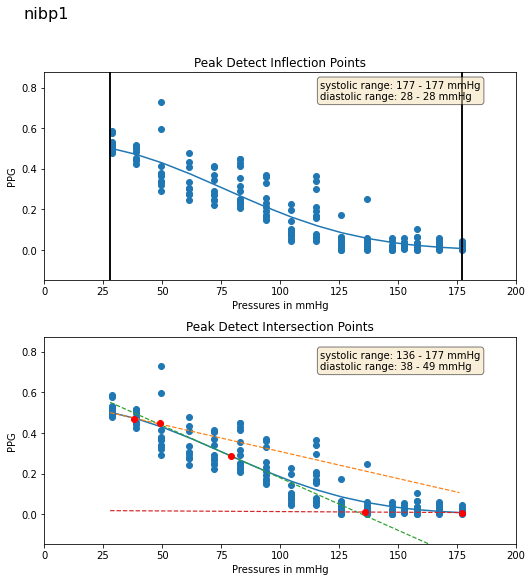

210731AP:
210731AP
           ppi      aucr      corl      ampr   amponly    cormin
0    29.183319  1.697809  0.978639  1.616725  0.007058  0.971442
1    39.226906  1.874289  0.965887  1.656720  0.007148  0.942323
2    50.123329  1.881103  0.978961  1.792964  0.009380  0.963033
3    61.083157  1.926211  0.963002  1.755629  0.009076  0.938653
4    71.826454  1.712944  0.966409  1.743590  0.008227  0.954077
5    82.822052  2.263381  0.931727  2.198059  0.011274  0.907148
6    93.501343  1.373215  0.884067  1.422795  0.006572  0.834196
7   104.294228  0.590929  0.822502  0.650658  0.003994  0.725876
8   115.215218  0.285981  0.684190  0.272219  0.002405  0.577499
9   125.629288  0.090393 -0.109361  0.044759  0.000384 -0.351661
10  136.467712  0.046354  0.172724  0.035583  0.000323 -0.422047
11  147.275620  0.043008 -0.001904  0.010769  0.000150 -0.710448
12  151.912094  0.044540  0.175871  0.017002  0.000199 -0.723653
13  156.883636  0.064308  0.033727  0.021632  0.000194 -0.145329
14  16

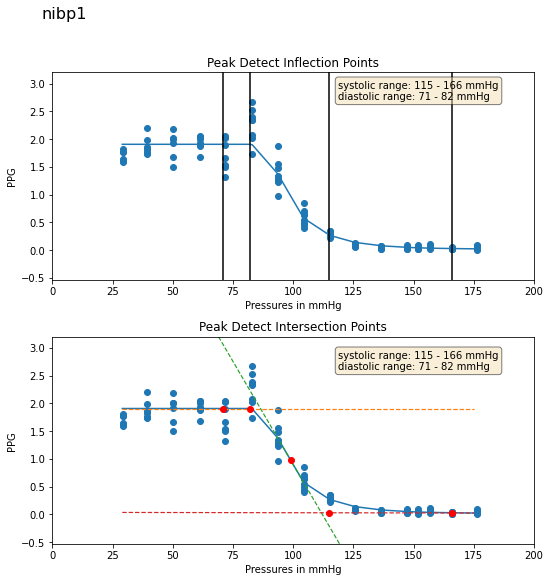

210731BP:
210731BP
           ppi      aucr      corl      ampr   amponly    cormin
0    29.074030  1.066130  0.988586  1.195032  0.011320  0.976307
1    38.994003  1.199644  0.990388  1.337196  0.011075  0.973492
2    48.999100  1.175815  0.993668  1.285615  0.010309  0.989429
3    59.000969  1.191816  0.989642  1.377825  0.012025  0.982040
4    69.157021  1.360722  0.970620  1.538587  0.012314  0.945202
5    79.121170  1.292709  0.965205  1.574052  0.012628  0.946608
6    89.295708  0.960531  0.943544  1.170827  0.009787  0.932865
7    98.785080  0.668595  0.905898  0.802636  0.007120  0.870218
8   108.709129  0.355314  0.866101  0.461659  0.004070  0.669816
9   118.009933  0.451560  0.440734  0.275671  0.002764 -0.008545
10  128.124435  0.140649  0.162518  0.087929  0.000831 -0.589634
11  138.086029  0.102728 -0.003683  0.033973  0.000366 -0.346201
12  142.722519  0.084562  0.195042  0.023729  0.000254 -0.389747
13  147.867767  0.062398 -0.211248  0.022533  0.000226 -0.660533
14  15

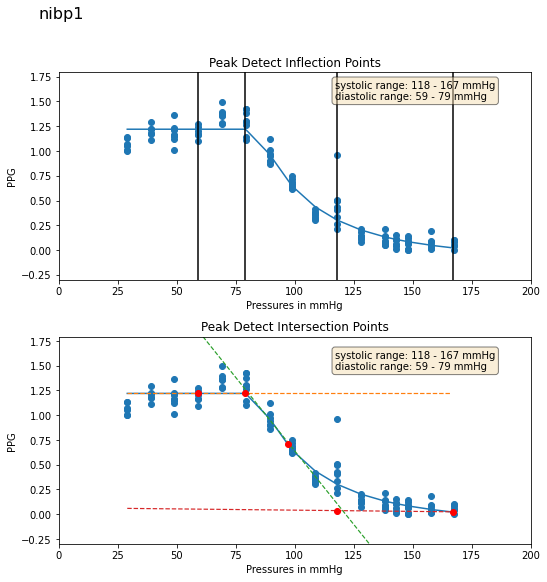

210803AP:
210803AP
           ppi      aucr      corl      ampr   amponly    cormin
0    28.896744  0.820919  0.991842  0.823164  0.028123  0.984031
1    38.916008  0.735151  0.990213  0.750912  0.026676  0.981803
2    48.691738  0.806676  0.990151  0.823675  0.028137  0.967980
3    58.533096  0.778251  0.987502  0.752236  0.025271  0.971535
4    68.817131  1.122730  0.960129  1.081254  0.026867  0.901050
5    78.410072  0.840770  0.967152  0.819605  0.027380  0.943252
6    88.838028  0.502394  0.881605  0.502425  0.018417  0.751685
7    98.216362  0.396169  0.638300  0.387687  0.014656  0.509543
8   108.537880  0.740218  0.558623  0.569239  0.014559  0.424701
9   117.946838  0.109683 -0.112156  0.074698  0.002146 -0.625870
10  127.719940  0.011465  0.037740  0.006016  0.000230 -0.472476
11  137.787903  0.015344  0.062903  0.004715  0.000183 -0.596940
12  142.612030  0.020307 -0.163963  0.008234  0.000299 -0.752935
13  147.388474  0.014715 -0.064933  0.006479  0.000228 -0.677777
14  15

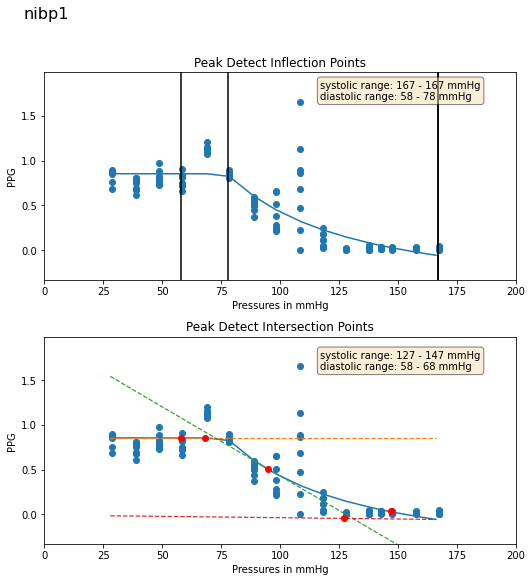

210803BP:
210803BP
           ppi      aucr      corl      ampr   amponly    cormin
0    28.727533  0.217902  0.982237  0.198068  0.006290  0.977338
1    34.796856  0.186575  0.982849  0.172139  0.006938  0.947553
2    41.736168  0.210968  0.968750  0.190090  0.006925  0.940544
3    48.513145  0.214309  0.973283  0.196837  0.007152  0.918220
4    55.990128  0.231373  0.936392  0.227612  0.008525  0.853259
5    62.701233  0.229709  0.913927  0.217311  0.007913  0.783281
6    68.614914  0.220964  0.902173  0.209923  0.006735  0.864727
7    75.534721  0.263713  0.827838  0.239513  0.005772  0.794295
8    82.398605  0.040969  0.432834  0.036430  0.001218 -0.127113
9    89.257248  0.109878  0.109362  0.086271  0.003094 -0.216937
10   95.985954  0.074139 -0.416758  0.046519  0.001671 -0.780774
11  103.319366  0.020048 -0.149792  0.008189  0.000296 -0.904333
12  107.971123  0.016213  0.010600  0.003171  0.000145 -0.868599
13  112.803581  0.013406 -0.081577  0.004245  0.000170 -0.614141
14  12

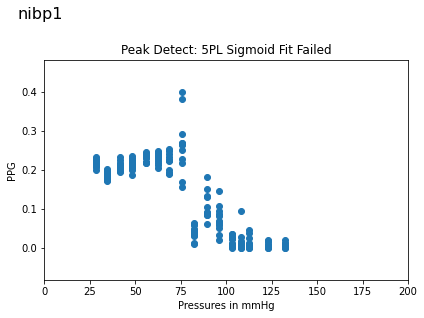

5tttttttttttttttttttttttttttt5
210804AP:
210804AP
           ppi      aucr      corl      ampr   amponly    cormin
0    28.723993  1.209356  0.974386  1.141813  0.013001  0.920210
1    37.588417  1.068076  0.950709  0.987468  0.009581  0.918834
2    46.380566  1.110638  0.989460  1.105815  0.012419  0.982065
3    55.712307  1.107809  0.987460  1.101899  0.011770  0.974835
4    64.527061  1.067520  0.977519  1.065270  0.011720  0.972616
5    73.556656  1.031033  0.957371  1.048969  0.010897  0.934863
6    82.243568  1.137387  0.895709  1.123167  0.010324  0.844519
7    91.107857  0.784891  0.855957  0.867198  0.009266  0.778047
8    99.864670  0.433625  0.718262  0.463001  0.005060  0.601243
9   108.715210  0.473624  0.472411  0.415170  0.004101 -0.053592
10  117.136505  0.102709 -0.257697  0.071320  0.000636 -0.935111
11  127.325272  0.054776  0.296679  0.024722  0.000195 -0.190794
12  132.364212  0.022254  0.359376  0.018722  0.000212 -0.564323
13  137.424103  0.057570  0.181978  0.01

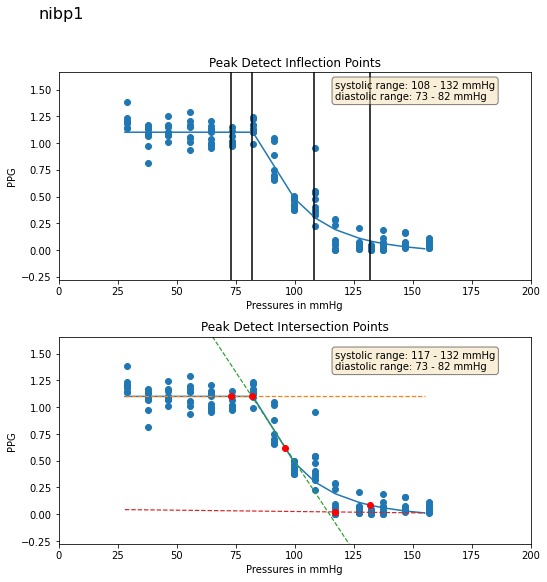

210729CP:
210729CP
           ppi      aucr      corl      ampr   amponly    cormin
0    29.262758  0.801039  0.982120  0.849151  0.007546  0.960552
1    39.149483  0.797396  0.984832  0.806357  0.008142  0.948213
2    50.090054  0.664874  0.971698  0.691860  0.006325  0.947404
3    60.977455  0.828397  0.991971  0.839608  0.009110  0.980905
4    71.771820  0.921292  0.991076  0.936856  0.010152  0.986012
5    82.785614  0.834023  0.978969  0.864825  0.008194  0.960937
6    93.809174  0.746818  0.905973  0.765462  0.007667  0.832936
7   105.045792  0.478814  0.876827  0.481578  0.004588  0.839439
8   115.712326  0.423069  0.790513  0.405820  0.004189  0.645025
9   126.346710  0.185796  0.289341  0.132080  0.001351 -0.057860
10  136.945877  0.102181 -0.370702  0.034923  0.000355 -0.763541
11  147.934067  0.073020 -0.154499  0.018253  0.000182 -0.907844
12  152.641647  0.038400 -0.045125  0.012275  0.000136 -0.640298
13  157.899124  0.031986  0.037091  0.014094  0.000148 -0.308974
14  16

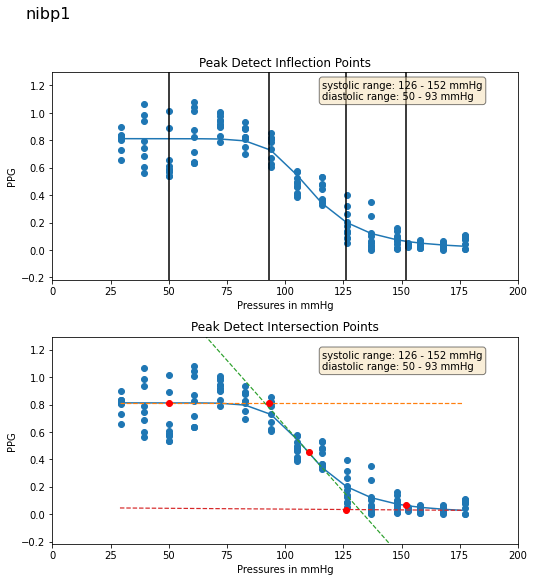

210804BP:
210804BP
           ppi      aucr      corl      ampr   amponly    cormin
0    29.356182  0.980788  0.993055  0.985191  0.013017  0.987742
1    37.574287  1.046297  0.995627  1.030657  0.013623  0.987919
2    45.609215  1.062103  0.994205  1.045961  0.013256  0.990495
3    53.003914  0.967667  0.994455  0.945958  0.011993  0.985289
4    61.721516  0.867575  0.990500  0.897441  0.009424  0.987276
5    70.240685  0.993717  0.989984  0.992996  0.010689  0.979309
6    78.190918  0.918226  0.973609  0.948884  0.011466  0.957726
7    86.040817  0.861789  0.972830  0.966107  0.013680  0.964595
8    93.952957  0.503451  0.961543  0.601845  0.005221  0.936822
9   102.103828  0.556968  0.839550  0.672200  0.008085  0.730784
10  109.766014  0.361941  0.793809  0.453277  0.005795  0.727706
11  118.380646  0.364929 -0.033161  0.322991  0.005072 -0.357937
12  123.356651  0.076377 -0.046909  0.016192  0.000237 -0.720727
13  128.355957  0.061637 -0.070751  0.027533  0.000280 -0.706828
14  13

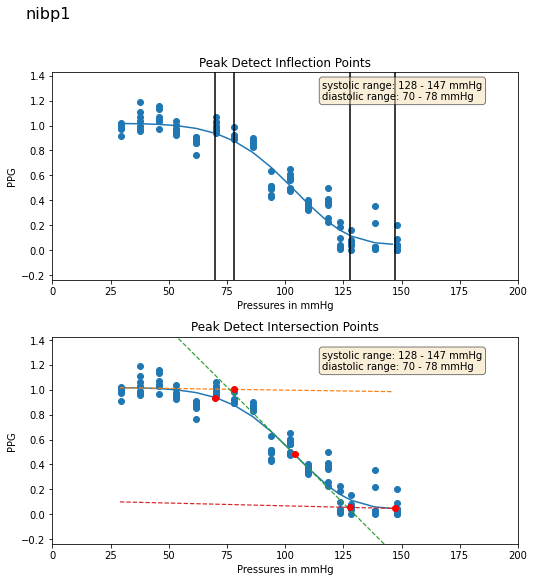

210805AP:
210805AP
           ppi      aucr      corl      ampr   amponly    cormin
0    29.304724  0.765301  0.995957  0.769076  0.009067  0.985351
1    36.939693  0.768245  0.994223  0.765176  0.009045  0.977179
2    46.628597  0.774797  0.993560  0.758305  0.009017  0.962063
3    53.753323  0.736804  0.994848  0.733400  0.008756  0.983061
4    62.764999  0.761897  0.992272  0.732004  0.008058  0.975911
5    71.602280  0.747829  0.989808  0.732426  0.008387  0.972139
6    79.758377  0.766676  0.980901  0.744813  0.008467  0.956909
7    88.521194  0.781066  0.968742  0.777612  0.006673  0.954433
8    97.878731  0.584877  0.862240  0.580999  0.007112  0.791146
9   105.792236  0.511561  0.871517  0.516060  0.005883  0.751799
10  114.694969  0.295047  0.809527  0.303953  0.003408  0.699805
11  123.145638  0.144375  0.428281  0.131043  0.001489 -0.018837
12  128.272232  0.155011  0.796790  0.152872  0.001215  0.651540
13  132.960114  0.126826  0.069700  0.091581  0.001162 -0.800119
14  14

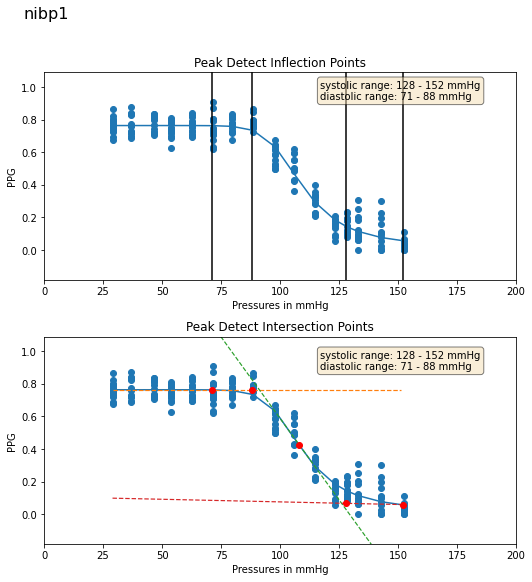

210806AP:
210806AP
           ppi      aucr      corl      ampr   amponly    cormin
0    28.953003  0.935137  0.961365  0.769536  0.011308  0.939434
1    36.877483  0.781778  0.964526  0.647864  0.007574  0.926971
2    45.885807  0.582544  0.969888  0.509965  0.007593  0.938566
3    54.127228  1.192488  0.941293  0.977887  0.018080  0.866977
4    62.906380  0.734279  0.960247  0.640223  0.010810  0.899166
5    71.536987  1.070578  0.899157  0.859787  0.016778  0.862797
6    79.625778  0.836534  0.878409  0.689653  0.012347  0.807403
7    88.505806  0.572701  0.810609  0.473941  0.009077  0.744330
8    97.175133  0.499657  0.574174  0.378403  0.007042  0.391508
9   104.777901  0.308641  0.491371  0.228022  0.003844  0.356083
10  113.915886  0.162496 -0.038151  0.129184  0.002309 -0.645245
11  122.661324  0.035227 -0.047225  0.010426  0.000218 -0.506718
12  127.397324  0.041288 -0.012214  0.012556  0.000221 -0.393083
13  132.314819  0.035468  0.089278  0.013223  0.000252 -0.646091
14  14

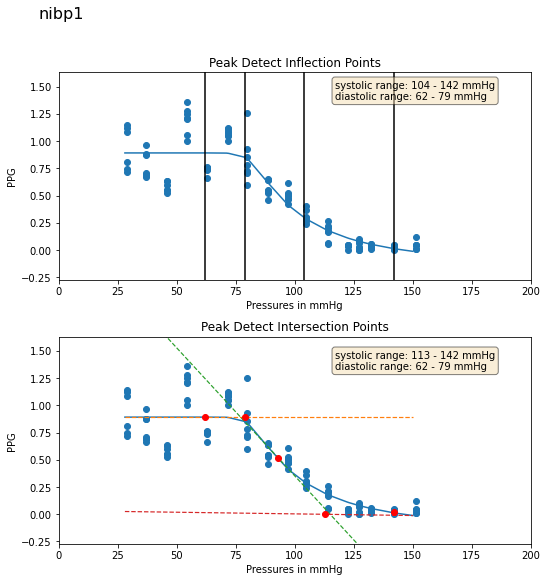

210806BP:
210806BP
           ppi      aucr      corl      ampr   amponly    cormin
0    29.735289  0.546327  0.980419  0.591528  0.008287  0.951110
1    37.927654  0.751721  0.996402  0.766848  0.012555  0.988298
2    46.583515  0.550623  0.993381  0.545062  0.008541  0.979497
3    54.779682  0.482721  0.986679  0.534878  0.007641  0.974350
4    63.629990  0.616595  0.993752  0.626052  0.010340  0.975062
5    72.507866  0.497385  0.990081  0.519509  0.008310  0.972787
6    80.981613  0.503813  0.942367  0.589039  0.009305  0.895486
7    90.119698  0.385853  0.934655  0.448232  0.006408  0.863246
8    98.667229  0.251626  0.801643  0.299229  0.005119  0.646691
9   106.190315  0.177183  0.539709  0.179866  0.002705  0.382216
10  115.529694  0.186350  0.119127  0.165243  0.002275 -0.104571
11  123.794395  0.042501  0.069233  0.008815  0.000127 -0.491257
12  128.663620  0.042480  0.144090  0.009354  0.000134 -0.529675
13  133.461060  0.084035 -0.022342  0.010839  0.000144 -0.748067
14  14

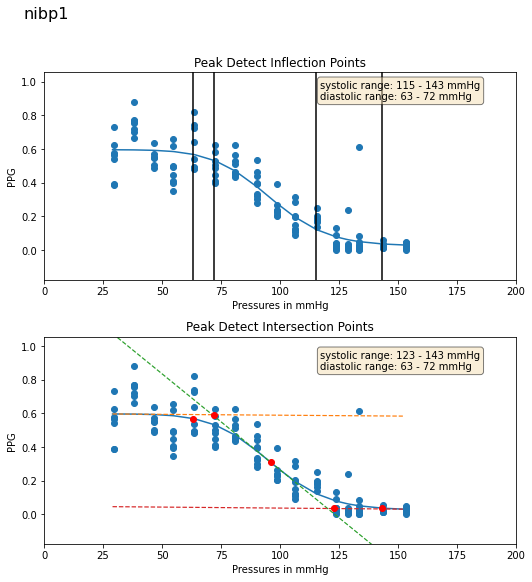

210806CP:
210806CP
           ppi      aucr      corl      ampr   amponly    cormin
0    29.160624  0.833281  0.986320  0.902164  0.010471  0.978509
1    39.167660  0.812278  0.994922  0.844976  0.009713  0.977752
2    48.972210  0.805290  0.994498  0.851576  0.008892  0.988229
3    59.047928  0.891071  0.985224  0.983934  0.010079  0.976409
4    70.037033  0.800562  0.904971  0.930712  0.008780  0.627657
5    78.998276  0.660352  0.927402  0.862520  0.006714  0.897914
6    89.258400  0.603838  0.965734  0.694665  0.007277  0.910651
7    99.540390  0.663125  0.930953  0.774504  0.009349  0.805229
8   109.245659  0.506411  0.831817  0.538242  0.006082  0.638622
9   118.622360  0.475551  0.652036  0.457921  0.002527  0.375195
10  128.536377  0.490907  0.240701  0.347712  0.004282  0.066465
11  138.346802  0.328478 -0.335089  0.160608  0.001851 -0.730586
12  143.252869  0.258237 -0.346751  0.157925  0.001984 -0.953323
13  147.947571  0.089710 -0.013502  0.011689  0.000158 -0.933603
14  15

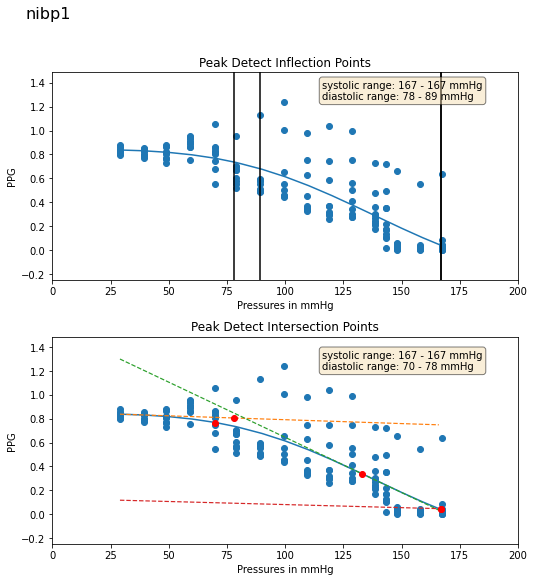

210810AP:
210810AP
           ppi      aucr      corl      ampr   amponly    cormin
0    29.344738  1.622976  0.993075  1.785492  0.018928  0.988629
1    38.002918  0.919208  0.960364  0.912151  0.007320  0.870507
2    46.949532  0.951346  0.940528  0.911362  0.009486  0.647554
3    56.219364  0.959311  0.956012  0.786279  0.008036  0.766440
4    65.302498  0.909511  0.883920  0.883085  0.008219  0.567502
5    74.258514  0.790579  0.920829  0.835155  0.008541  0.749653
6    83.435516  0.694131  0.896085  0.759436  0.007835  0.840194
7    92.136353  0.636742  0.618338  0.573216  0.005751 -0.019264
8   100.592804  0.624021  0.230648  0.446450  0.004670  0.063181
9   109.250732  0.138007 -0.197883  0.042464  0.000430 -0.718980
10  118.084122  0.117388 -0.198668  0.043014  0.000423 -0.909054
11  128.144592  0.269615 -0.238442  0.050693  0.000491 -0.970990
12  133.084732  0.214659  0.090424  0.082565  0.000644 -0.776419
13  138.200287  0.077999  0.140782  0.034241  0.000381 -0.664672
14  14

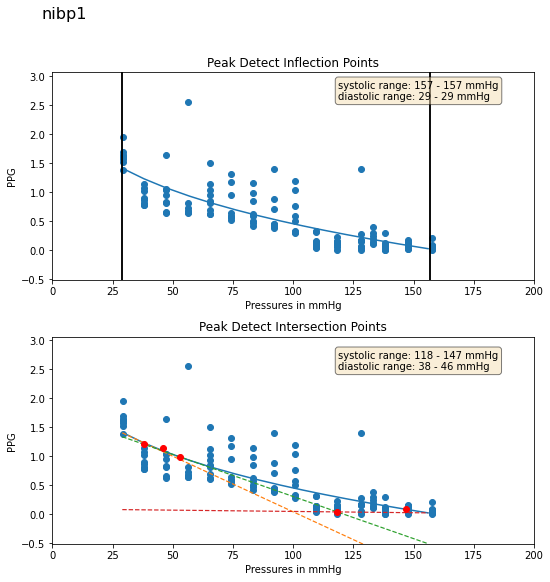

210810BP:
210810BP
           ppi      aucr      corl      ampr   amponly    cormin
0    29.031521  0.669964  0.980103  0.627296  0.009924  0.971459
1    38.238274  0.693050  0.993663  0.676394  0.016577  0.965990
2    47.031372  0.770059  0.991017  0.745307  0.015905  0.984418
3    55.894604  0.666918  0.995896  0.662078  0.014757  0.993982
4    65.059265  0.754153  0.969500  0.741621  0.017466  0.790589
5    74.264954  0.711688  0.987328  0.748566  0.014223  0.973575
6    82.902496  0.632021  0.981071  0.649229  0.011204  0.956777
7    91.740776  0.648515  0.974583  0.736765  0.017619  0.962411
8   101.478722  0.514027  0.931387  0.645574  0.015561  0.886054
9   110.698845  0.451965  0.893138  0.581711  0.012439  0.871527
10  119.274239  0.415237  0.826246  0.542602  0.010347  0.784024
11  128.794067  0.116512  0.364884  0.130138  0.002829 -0.060586
12  133.582367  0.226293  0.037823  0.201868  0.005481 -0.069077
13  138.415588  0.245436 -0.016040  0.222983  0.005873 -0.185389
14  14

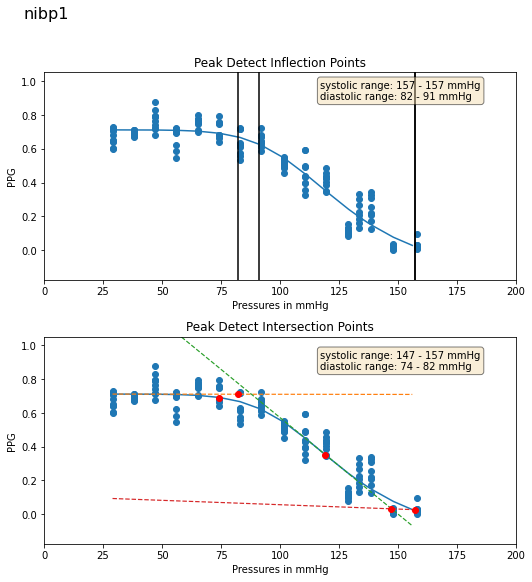

210807AP:
210807AP
           ppi      aucr      corl      ampr   amponly    cormin
0    29.352106  0.683060  0.988901  0.645772  0.006239  0.976275
1    38.318871  0.554159  0.946980  0.533592  0.002269  0.811720
2    48.443146  0.704373  0.894879  0.494685  0.003579  0.538907
3    58.228832  0.542183  0.799573  0.313036  0.002343 -0.272115
4    65.654114  0.325450  0.923628  0.284178  0.003224  0.766293
5    74.411133  0.309353  0.964214  0.293043  0.003620  0.904064
6    83.219704  0.367905  0.911551  0.339905  0.003884  0.789627
7    92.150558  0.286791  0.909275  0.262952  0.002815  0.696628
8   100.906860  0.523610  0.733929  0.290705  0.002245 -0.053423
9   110.069168  0.202006  0.417374  0.133654  0.000949 -0.349054
10  118.813271  0.126646 -0.139608  0.059495  0.000839 -0.499293
11  128.656509  0.119249 -0.339147  0.042447  0.000600 -0.691418
12  133.410812  0.054451 -0.258982  0.013319  0.000181 -0.831290
13  138.651642  0.046031 -0.111234  0.015248  0.000200 -0.535445
14  14

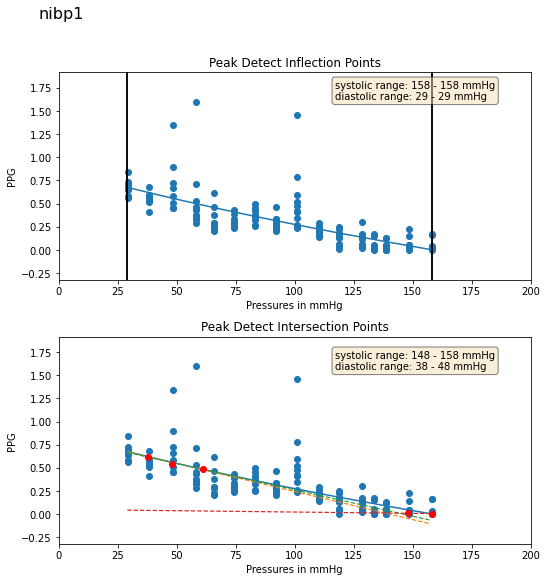

210810CP:
210810CP
           ppi      aucr      corl      ampr   amponly    cormin
0    29.164989  0.922078  0.917111  0.856822  0.008357  0.887147
1    38.360771  0.589583  0.928090  0.576421  0.004769  0.885400
2    46.893486  0.525998  0.891411  0.493742  0.004420  0.854572
3    56.096771  0.502143  0.914379  0.441731  0.004272  0.868601
4    64.682426  0.555077  0.882329  0.469894  0.004984  0.852469
5    73.702698  0.433476  0.847177  0.392642  0.004124  0.815958
6    82.635918  0.436090  0.856948  0.396548  0.004835  0.815121
7    91.425331  0.398475  0.745617  0.347671  0.004428  0.684675
8   100.260750  0.303876  0.523732  0.271517  0.003619  0.344695
9   109.013603  0.419800 -0.027649  0.309524  0.003946 -0.214162
10  118.015297  0.112418 -0.162321  0.076612  0.000878 -0.852810
11  127.995018  0.063075 -0.183659  0.011242  0.000123 -0.722629
12  132.781433  0.026571  0.311756  0.015818  0.000185 -0.330381
13  137.940918  0.052363  0.249713  0.013112  0.000167 -0.430044
14  14

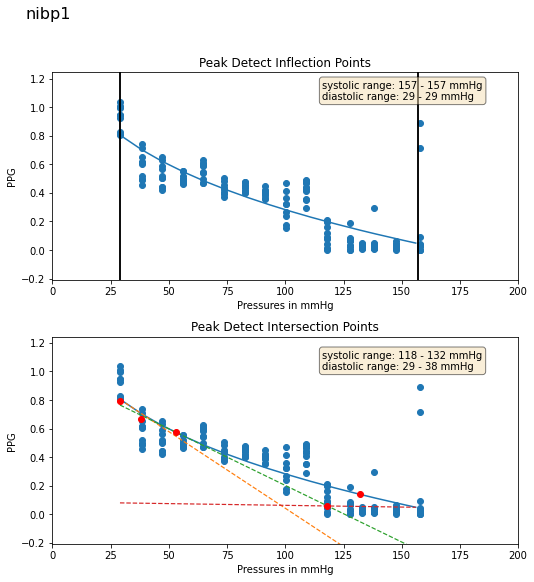

210811AP:
210811AP
5tttttttttttttttttttttttttt5555555tt5
5tttt66666666666666666666666666tttttttttttttttttttttt5555555tt5
55
66
77
88
99
99999
5445
5    5
5ffrf5
5tttttttt5
dewdew55
5errrrrrr5
,,,,,,,,
=====
69.10736083984375
qqqqq
69.10736083984375
69.10736083984375


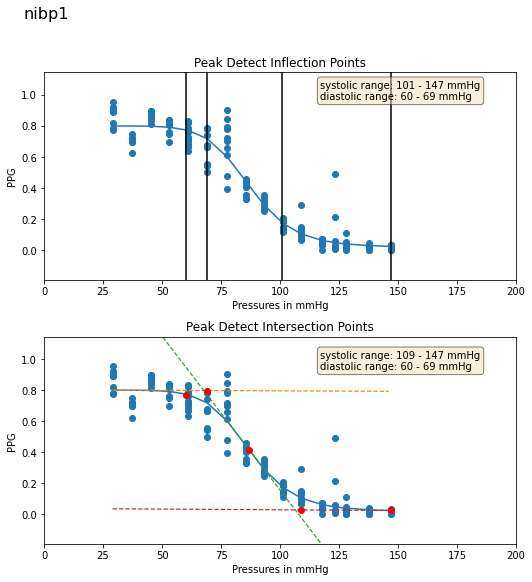

210811CP:
210811CP
           ppi      aucr      corl      ampr   amponly    cormin
0    28.905245  1.480837  0.984932  1.510610  0.010623  0.976564
1    36.905365  1.421584  0.987444  1.358375  0.010240  0.951895
2    44.936611  1.233784  0.985632  1.268897  0.008558  0.974824
3    52.716137  1.134177  0.980100  1.130846  0.007559  0.943269
4    60.622467  1.076246  0.965541  1.036209  0.007096  0.905611
5    68.819473  1.047969  0.952930  0.989707  0.006257  0.899060
6    77.521194  0.991315  0.886918  0.929159  0.006171  0.747993
7    85.012001  0.797591  0.878450  0.761946  0.005095  0.733082
8    93.161377  0.464827  0.831364  0.447634  0.003472  0.779388
9   101.087357  0.254981  0.647339  0.233156  0.001850  0.467125
10  108.681419  0.206648 -0.443367  0.114920  0.000853 -0.833059
11  117.802589  0.039114  0.195470  0.017866  0.000149 -0.207633
12  122.760933  0.050230 -0.208586  0.022321  0.000195 -0.728380
13  127.632271  0.035489  0.037930  0.016387  0.000144 -0.635504
14  13

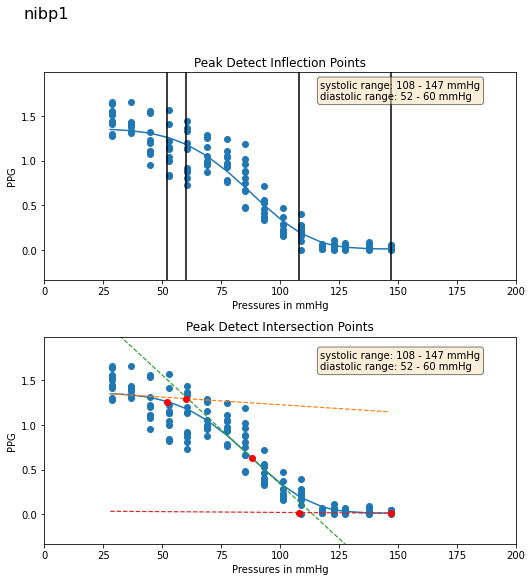

210812AP:
210812AP
           ppi      aucr      corl      ampr   amponly    cormin
0    29.079639  0.738819  0.950784  0.847386  0.012294  0.918464
1    38.019108  0.749554  0.951828  0.868394  0.012360  0.936761
2    46.836540  1.023295  0.883567  1.260305  0.009602  0.864307
3    56.143345  0.782791  0.941888  0.873820  0.012115  0.859399
4    64.973770  0.800441  0.950855  0.873332  0.012767  0.887972
5    73.914955  1.123217  0.938246  1.299803  0.011655  0.895131
6    82.767776  0.799765  0.957141  0.932434  0.012424  0.921662
7    91.535820  0.682481  0.965724  0.825802  0.012669  0.915178
8   100.560776  0.467284  0.898091  0.670511  0.007624  0.868230
9   109.152672  0.245134  0.842356  0.311540  0.004782  0.764992
10  117.976944  0.199974 -0.072349  0.191184  0.002848 -0.803993
11  127.990898  0.041706  0.063238  0.021638  0.000221 -0.724714
12  132.416611  0.064510 -0.344156  0.037597  0.000205 -0.891715
13  137.902206  0.093507  0.168715  0.038544  0.000203 -0.260511
14  14

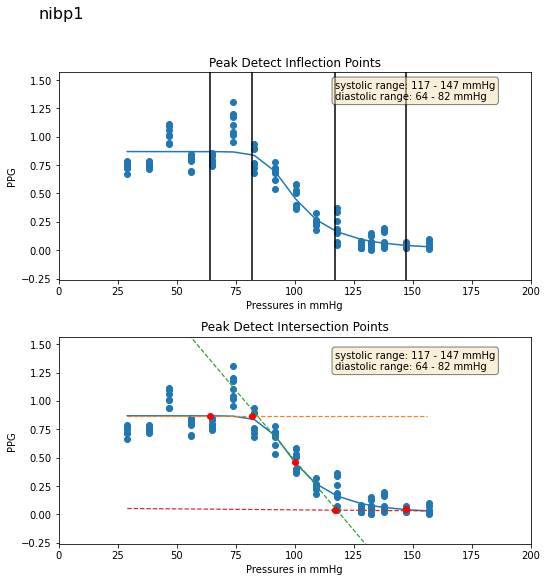

210717BP:
210717BP
           ppi      aucr      corl      ampr   amponly    cormin
0    28.815477  0.535650  0.953052  0.448901  0.005560  0.922195
1    37.863472  0.404273  0.985738  0.400630  0.004429  0.965824
2    46.687218  0.490867  0.962264  0.472232  0.005554  0.931693
3    55.872215  0.459520  0.974565  0.445194  0.005325  0.935648
4    64.970589  0.944523  0.881620  0.813188  0.013462  0.858387
5    74.040634  0.410152  0.931806  0.417403  0.006231  0.875057
6    83.029541  0.746505  0.802009  0.713204  0.013156  0.726483
7    91.836891  0.571829  0.766144  0.557317  0.009931  0.623234
8   100.495323  0.191888  0.743960  0.186692  0.002856  0.567405
9   109.098816  0.225204  0.441386  0.163190  0.003215  0.148746
10  117.711945  0.181845 -0.529084  0.064610  0.001345 -0.782922
11  127.563469  0.035359  0.143318  0.025430  0.000474 -0.269753
12  132.469559  0.039392  0.201157  0.013962  0.000329 -0.474764
13  137.567612  0.066630  0.204050  0.018484  0.000350 -0.606976
14  14

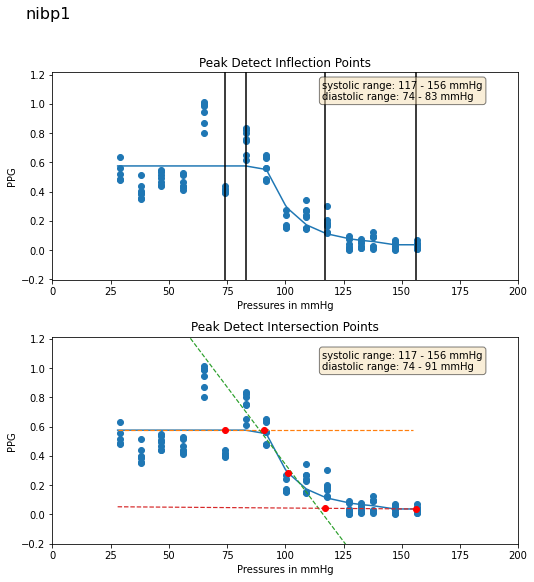

210716BP:
210716BP
           ppi      aucr      corl      ampr   amponly    cormin
0    28.803463  1.067037  0.996542  1.116573  0.006174  0.985603
1    37.843483  1.007394  0.992660  1.068005  0.004461  0.967883
2    46.665058  1.117389  0.993098  1.267589  0.006344  0.974177
3    55.783630  0.942560  0.994762  1.060963  0.004752  0.986169
4    65.121391  0.929023  0.980602  1.059408  0.005173  0.959375
5    73.775635  0.996122  0.976764  1.164571  0.005496  0.945809
6    82.912834  0.770928  0.946781  0.890434  0.004500  0.930239
7    91.596939  0.353718  0.842231  0.470277  0.002705  0.755461
8   100.293587  0.206623  0.717445  0.294664  0.001692  0.549100
9   108.978432  0.153458  0.290558  0.181849  0.000882 -0.183815
10  117.864471  0.093598 -0.324966  0.041333  0.000235 -0.876606
11  128.037384  0.076884 -0.178998  0.025068  0.000142 -0.780996
12  132.778992  0.080398  0.099631  0.030878  0.000190 -0.811849
13  138.114670  0.098725 -0.144814  0.046505  0.000276 -0.742179
14  14

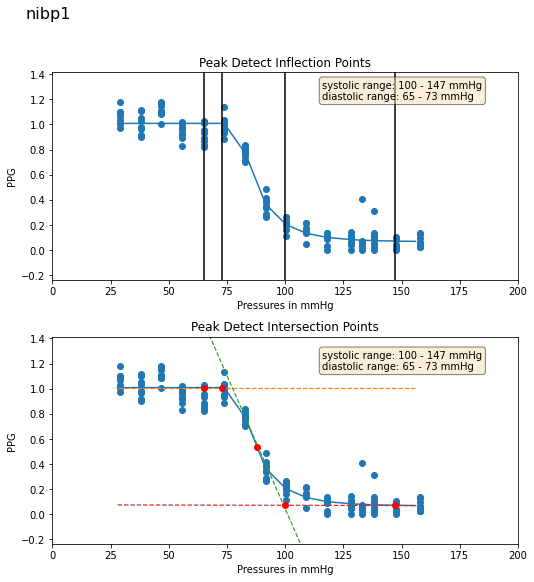

210819BP:
210819BP
           ppi      aucr      corl      ampr   amponly    cormin
0    28.806604  0.722464  0.964227  0.652033  0.006369  0.938006
1    36.156925  0.654076  0.966880  0.645727  0.005102  0.943804
2    43.063614  0.628068  0.963803  0.595743  0.004780  0.946156
3    50.138500  0.779218  0.941066  0.750473  0.005656  0.926791
4    58.564835  0.547664  0.921768  0.511170  0.006390  0.896629
5    65.221443  0.530097  0.877454  0.516726  0.005636  0.814487
6    71.624580  0.487200  0.814868  0.445152  0.004258  0.764950
7    79.032921  0.417792  0.809133  0.396373  0.004073  0.756915
8    86.818604  0.283824  0.722542  0.242893  0.002243  0.625709
9    94.157791  0.166338  0.420423  0.144047  0.001289  0.127197
10  100.336349  0.277135  0.032547  0.134217  0.001170 -0.460852
11  108.453629  0.121776 -0.232284  0.041846  0.000351 -0.619104
12  113.036232  0.101744 -0.028336  0.042677  0.000376 -0.773971
13  117.965454  0.139040  0.053193  0.044401  0.000358 -0.374829
14  12

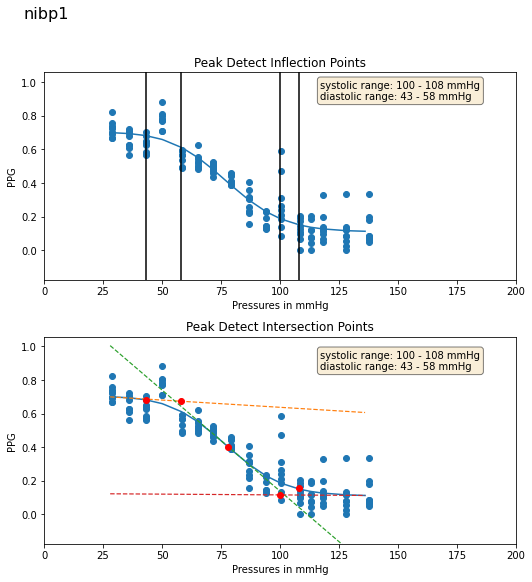

In [ ]:
patients=[]
lsys=[]
na=[]
d0=[]
d1=[]
d2=[]
d3=[]
d4=[]
d5=[]
d6=[]
d7=[]
d08=[]
d8=[]
d9=[]
d10=[]
d11=[]
d12=[]
d13=[]
d14=[]
d015=[]
d15=[]
d16=[]
d17=[]
d18=[]
d19=[]
d20=[]
d21=[]
d22=[]
folder = '/content/drive/MyDrive/data40/sphygmo/'
for patient in [x for x in os.listdir(folder)if x.find('P')!=-1]:
# for patient in ['210717BP']:
  nibp = NIBPProcessor(folder+patient+'/nibp1.txt')
  nibp.save_peak_locations()
  nibp.detect_plateaus()
  print(f'{patient}:')
  ita1, sys1 = nibp.compute_ita()
  # print(f'{patient}: {sys1}')
  patients.append(patient)
  lsys.append(sys1)
  nibp.fitting(folder+patient+'/nibp1.txt',patient)

rangedf = pd.DataFrame()  
dia_fin = pd.DataFrame()  
dia_fin['patient']=na

dia_fin['d0']=d0

dia_fin['d1']=d1
dia_fin['d2']=d2
dia_fin['d3']=d3
dia_fin['d4']=d4
dia_fin['d5']=d5
dia_fin['d6']=d6
dia_fin['d7']=d7

dia_fin['d08']=d08

dia_fin['d8']=d8
dia_fin['d9']=d9
dia_fin['d10']=d10
dia_fin['d11']=d11
dia_fin['d12']=d12
dia_fin['d13']=d13
dia_fin['d14']=d14

dia_fin['d015']=d015

dia_fin['d15']=d15
dia_fin['d16']=d16
dia_fin['d17']=d17
dia_fin['d18']=d18
dia_fin['d19']=d19
dia_fin['d20']=d20
dia_fin['d21']=d21
# dia_fin['d22updated']=d22
save_df(dia_fin, 'diastolic.csv')
# rangedf['Low_sys']=lsys


for generating plots

In [ ]:
class NIBPProcessor(object):
 
  def __init__(self, filepath=''):
    time, ch1, ch2, ch3= np.loadtxt(filepath, dtype=('f4, f4, f4, f4'),unpack=True,delimiter = '\t')
    ip = pd.DataFrame()
    ip['time'] = time
    ip['ref_ppg'] = ch2 + 4
    ip['occ_ppg'] = ch3 + 4
    ip['pressure'] = ch1
    self.ip = ip
    self.op=0
    self.op_new=0
    self.op_new1=0
    self.op_new2=0


  
  
  def save_peak_locations(self):
    self.ip['ref_peaks'],ref_wid, inxref,inx1ref = peak_and_valley_detect(self.ip['ref_ppg'])
    self.ip['occ_peaks'],occ_wid, inxocc, inx1occ = peak_and_valley_detect(self.ip['occ_ppg'], prominence=0.00005)

    self.ip['std']= self.ip['occ_ppg'].rolling(2000).std()
    self.ip['stdr']= self.ip['ref_ppg'].rolling(2000).std()
    self.ip['occ1d'] = np.gradient(self.ip['occ_ppg'].values,100)
    self.ip['occ1d_peaks'] = peak_detect(self.ip['occ1d'])
    self.ip['ref1d'] = np.gradient(self.ip['ref_ppg'].values)
    self.ip['ref1d_peaks'] = peak_detect(self.ip['ref1d'])

  def detect_plateaus(self):
    plateau_width = 3000
    # Making a list of plateaus
    hts = np.linspace(0.0001, 1, 100)
    peaks, _ = find_peaks(self.ip['pressure'], width=plateau_width)

    plateaus = []
    for peak in peaks:
      for ht in hts:
        width, height, left, right = peak_widths(self.ip['pressure'], np.array([peak]), rel_height=ht)
        if width > plateau_width:
          break
      plateaus.append(self.ip.loc[left[0]:right[0]])
    # Finding mean pressure for each plateau
    mean_pressures = []
    mean_occppg=[]
    mean_refppg=[]
    for plateau in plateaus:
      # plateau.drop(plateau.head(1000).index, inplace=True) 
      # plateau.drop(plateau.tail(500).index, inplace=True)
      mean_pressures.extend([plateau['pressure'].mean()] * len(plateau))
      mean_occppg.extend([plateau[plateau['occ_peaks']>0]['occ_peaks'].median()] * len(plateau))
      mean_refppg.extend([plateau[plateau['ref_peaks']>0]['ref_peaks'].median()] * len(plateau))

    self.ip = pd.concat(plateaus)
    self.ip['mean_pressure'] = mean_pressures
    self.ip['mean_occppg'] = mean_occppg
    self.ip['mean_refppg'] = mean_refppg
    self.ip = self.ip[np.invert(self.ip.index.duplicated())]
    return plateaus
  


  def separate_into_cycles(self, ppg='ref', separate_by_peak=True):
    detected_plateaus = self.ip['mean_pressure'].reindex(self.ip.index, fill_value=0).values

    # Making a list of occ ppg cycles
    cycles = []
    peaks = (self.ip[self.ip[f'{ppg}_peaks'] > 0].index).tolist()
    valleys = (self.ip[self.ip[f'{ppg}_peaks'] < 0].index).tolist()

    separator = peaks if separate_by_peak else valleys
    not_separator = valleys if separate_by_peak else peaks
    for i in range(1, len(separator)):
      # if (not_separator[i]>separator[i-1])&(not_separator[i]<separator[i]):
      cycles.append(self.ip.loc[separator[i - 1]:separator[i]])
    # to check if there are cycles with no valleys in between in ref arm, such cycles are ignored.
    cycles = [cycle for cycle in cycles if len(np.where((not_separator>cycle.index[0])&(not_separator<cycle.index[-1]))[0]) != 0]
    begin = self.ip.loc[:separator[0]]
    return cycles



  def separate_into_occcycles(self):
    detected_plateaus = self.ip['mean_pressure'].reindex(self.ip.index, fill_value=0).values

    # Making a list of occ ppg cycles
    cycles = []
    peaks = (self.ip[self.ip['occ_peaks'] > 0].index).tolist()
    for i in range(1, len(peaks)):
      cycles.append(self.ip.loc[peaks[i - 1]:peaks[i]])
    # to check if there are cycles with no valleys in between in ref arm, such cycles are ignored.
    cycles = [cycle for cycle in cycles if len(cycle[(cycle['occ_peaks'] < 0)]) != 0]
    begin = self.ip.loc[:peaks[0]]
    return cycles
    
  

  def separate_into_refcycles(self):

    detected_plateaus = self.ip['mean_pressure'].reindex(self.ip.index, fill_value=0).values

    # Making a list of ref ppg cycles
    cycles = []
    valleys = (self.ip[self.ip['ref_peaks'] < 0].index).tolist()
    for i in range(1, len(valleys)):
      cycles.append(self.ip.loc[valleys[i - 1]:valleys[i]])
    # to check if there are cycles with no peaks in between in ref arm, such cycles are ignored.
    cycles = [cycle for cycle in cycles if len(cycle[(cycle['ref_peaks'] > 0)]) != 0]
    begin = self.ip.loc[:valleys[0]]
    return cycles

    

  def compute_ita(self):
    ita=[]
    cycle_pressure=[]
    cycles = self.separate_into_occcycles()
    for i,cycle in enumerate(cycles):
      if (cycle ['mean_pressure'].values[0] == cycle['mean_pressure'].values).all():
        tt1=cycle[cycle['occ_peaks']>0]['time'].values[0]
        pp1=cycle[cycle['occ_peaks']>0]['occ_peaks'].values[0]

        tt2=cycle[cycle['occ_peaks']<0]['time'].values[0]
        pp2=cycle[cycle['occ_peaks']<0]['occ_peaks'].values[0]

        tt3=cycle[cycle['occ_peaks']>0]['time'].values[-1]
        pp3=cycle[cycle['occ_peaks']>0]['occ_peaks'].values[-1]

        cycle_pressure.append(cycle['mean_pressure'].values[0])

        tt4=tt2-tt1
        tt5=tt3-tt2
        ita_cycle=(0.5*( (pp1*tt5) + (pp3*tt4)))
        ita.append(ita_cycle)

    itapd = pd.DataFrame()
    itapd['ita']=ita
    itapd['pressure']=cycle_pressure
    threshold = itapd['ita'].max()/50

    if len(itapd[itapd['ita']<threshold])!=0:
      first_zero = itapd[itapd['ita']<threshold]['pressure'].min()
    else:
      first_zero = itapd[itapd['ita']==(itapd['ita'].min())]['pressure'].min()
    return itapd, first_zero

  def fit_sigmoid(self, data, x, y):
    (a, b, c, d, e), _ = curve_fit(sigmoid_5pl, data[x], data[y], maxfev=5000)
    
    data['fit'] = sigmoid_5pl(data[x], a, b, c, d, e)
    # save_df(self.op, '_profile_pd.csv')

    fit = pd.DataFrame()
    fit['x'] = list(range(int(data[x].min()), int(data[x].max())))
    fit['y'] = np.interp(fit['x'], data[x], data['fit'])
    order = (fit['x'].max() - fit['x'].min()) / 10
    fit['d1'] = np.gradient(gaussian_filter1d(fit['y'], order))
    fit['d2'] = np.gradient(fit['d1'])
    return fit

  def fitting(self,input_file='', name=''):
    amplitude = []
    cycle_pressure = []
    plateau_pressure = []
    ref_amplitude = []
    # na=[]
    na.append(name)
    print(name)
    low_dias=0
    up_dias=0
    low_sys=0
    up_sys=0
    stdev = []
    auc = []
    occ1d = []
    delay = []
    ref_auc = []
    vol = []
    ref_vol = []
    full_auc = []
    corr=[]
    auc_r=[]
    list_pres=[]
    list_ratio=[]
    list_cor=[]
    list_amp=[]
    list_amponly=[]
    cycles = self.separate_into_refcycles()
    # added 24th
    diast=0
    upd=0
    upd1=0
    diamax=0
    diafinal=0
    auci=0
    refi=0
    ai=0
    for i in range(len(cycles)):
      if (cycles[i]['mean_pressure'].values[0] == cycles[i]['mean_pressure'].values).all():
        stdev.append(cycles[i]['std'].values[0])
        c,v=scipy.stats.pearsonr(cycles[i]['ref_ppg'], cycles[i]['occ_ppg'])
        corr.append (c )
        ref_amplitude.append(
          cycles[i][(cycles[i]['ref_peaks'] >0)]['ref_peaks'].values[0])
        ri=(cycles[i][(cycles[i]['ref_peaks'] >0)]['ref_peaks'].values[0])
        plateau_pressure.append(cycles[i]['mean_pressure'].values[0])
        ppi=(cycles[i]['mean_pressure'].values[0])
        cycle_pressure.append(cycles[i]['pressure'].mean())
        max = cycles[i]['occ_ppg'].values.max()
        maxref = cycles[i]['ref_ppg'].values.max()
        min = cycles[i]['occ_ppg'].values.min()
        minref = cycles[i]['ref_ppg'].values.min()
        delay_samples = abs(cycles[i][cycles[i]['ref_ppg']==maxref].index[0] - cycles[i][cycles[i]['occ_ppg']==max].index[0])
        # dich_inx = cycles[i][cycles[i]['ref1d_peaks']>0].index[-1]+delay_samples
        ref_inx = np.sort(np.array([cycles[i][cycles[i]['ref_ppg']==maxref].index[0],cycles[i][cycles[i]['ref_ppg']==minref].index[0]]))
        occ_inx = np.sort(np.array([cycles[i][cycles[i]['occ_ppg']==max].index[0],cycles[i][cycles[i]['occ_ppg']==min].index[0]]))
        # amplitude.append(max - cycles[i]['occ_ppg'].min())
        # ai=(max - cycles[i]['occ_ppg'].max())
        delay.append(delay_samples)
        occ1d.append(cycles[i]['occ1d'].max())
        auc.append((cycles[i].loc[:cycles[i][cycles[i]['occ_ppg']==max].index[0]]['occ_ppg'].values - cycles[i]['occ_ppg'].min()).sum())
        auci=((cycles[i].loc[:cycles[i][cycles[i]['occ_ppg']==max].index[0]]['occ_ppg'].values - cycles[i]['occ_ppg'].min()).sum())

        full_auc.append((cycles[i]['occ_ppg'].values - cycles[i]['occ_ppg'].min()).sum())
        ref_auc.append((cycles[i].loc[:cycles[i][cycles[i]['ref_ppg']==maxref].index[0]]['ref_ppg'].values - cycles[i]['ref_ppg'].min()).sum())
        refi=((cycles[i].loc[:cycles[i][cycles[i]['ref_ppg']==maxref].index[0]]['ref_ppg'].values - cycles[i]['ref_ppg'].min()).sum())
        vol.append((cycles[i].loc[occ_inx[0]:occ_inx[1]]['occ_ppg'].values - min).sum())
        ref_vol.append((cycles[i].loc[ref_inx[0]:ref_inx[1]]['ref_ppg'].values - minref).sum())




        if len(cycles[i][(cycles[i]['occ_peaks'] >0)]) != 0:
          ai=cycles[i][(cycles[i]['occ_peaks'] >0)]['occ_peaks'].values[0]
          amplitude.append(
            cycles[i][(cycles[i]['occ_peaks'] >0)]['occ_peaks'].values[0])
        else:
          ai=0
          amplitude.append(0)

        auc_r=(np.divide(auci,refi))
        amp_r=(np.divide(ai,ri))

        # if(c>=0):
        # print(ppi, auc_r)
        list_pres.append(ppi)
        list_ratio.append(auc_r)
        list_amp.append(amp_r)
        list_cor.append(c)
        list_amponly.append(ai)

    


    # Putting the output variables in anot
    op = pd.DataFrame()
    op['plateau_pressure'] = plateau_pressure
    op['amplitude'] = amplitude
    op['cycle_pressure'] = cycle_pressure
    op['ref_amplitude'] = ref_amplitude
    op['ratio'] = np.divide(np.array(amplitude), np.array(ref_amplitude))


    op['stdev'] = stdev
    op['auc'] = auc
    op['occ1d'] = occ1d
    op['delay'] = delay
    op['ref_auc'] = ref_auc
    op['vol'] = vol
    op['ref_vol'] = ref_vol
    op['full_auc'] = full_auc
    op['occ_radius'] = np.sqrt(np.divide(op['auc'].values, np.ones(len(op))*np.pi))
    op['ref_radius'] = np.sqrt(np.divide(op['ref_auc'].values, np.ones(len(op))*np.pi))
    op['auc_ratio'] = np.divide(op['auc'].values, op['ref_auc'])
    op['corr']=corr

    op_new = pd.DataFrame()
    op_new['ppi']= list_pres
    op_new['aucr']=list_ratio
    op_new['ampr']=list_amp
    op_new['corl']=list_cor
    op_new['amponly']=list_amponly
    # op_new = op_new[(np.abs(stats.zscore(op_new)) < 2).all(axis=1)]
    op_new = op_new.sort_values('ppi')
    self.op_new=op_new

    op_new1=pd.DataFrame()
    

    op_new2=pd.DataFrame()
    

    # Removing outliers (helps fitting)
    # op = op[(np.abs(stats.zscore(op)) < 2).all(axis=1)]
    op = op.sort_values('plateau_pressure')
    self.op=op

    threshold = np.max(op.groupby('plateau_pressure').mean()['auc_ratio'].values)
    threshold1 = np.max(op.groupby('plateau_pressure').mean()['ratio'].values)
    threshold2 = np.max(op.groupby('plateau_pressure').mean()['amplitude'].values)
    # bins = 4
    # threshold= np.quantile(op['corr'],(bins-1)/bins)
    # sys=op[op['corr']==np.min(op['corr'])]['plateau_pressure'].min()
    # dia1= op[op['plateau_pressure']<sys][op['corr']>=threshold]['plateau_pressure'].max()
    # dia2= op[op['plateau_pressure']>dia1]['plateau_pressure'].values[0]
    n=pd.DataFrame()
    pr=[]
    co=[]
    ampi=[]
    cori=[]
    ari=[]
    amponlyi=[]
    cormin=[]

    n['P']=np.unique(nibp.op['plateau_pressure'].values)
    pr=np.unique(nibp.op['plateau_pressure'])
    # n['corr']=nibp.op.groupby('plateau_pressure').max()['corr'].values
    n['corr']=nibp.op.groupby('plateau_pressure').mean()['corr'].values
    # co=nibp.op.groupby('plateau_pressure').max()['corr']
    co=nibp.op.groupby('plateau_pressure').mean()['auc_ratio']
    co2=nibp.op.groupby('plateau_pressure').min()['auc_ratio']
    co3=nibp.op.groupby('plateau_pressure').max()['auc_ratio']
    co4=nibp.op.groupby('plateau_pressure').median()['auc_ratio']
    de=nibp.op.groupby('plateau_pressure').min()['delay']
    de1=nibp.op.groupby('plateau_pressure').max()['delay']
    de2=nibp.op.groupby('plateau_pressure').mean()['delay']
    de3=nibp.op.groupby('plateau_pressure').median()['delay']
    ard=list(zip(pr,de))
    ard1=list(zip(pr,de1))
    ard2=list(zip(pr,de2))
    ard3=list(zip(pr,de3))
    ar=list(zip(pr,co))
    ar2=list(zip(pr,co2))
    ar3=list(zip(pr,co3))
    ar4=list(zip(pr,co4))
    pr=[]
    
    prppi=np.unique(op_new['ppi'])
    try:
      ari=nibp.op_new.groupby('ppi').mean()['aucr'].values
      cori=nibp.op_new.groupby('ppi').mean()['corl'].values
      cormin=nibp.op_new.groupby('ppi').min()['corl'].values
      ampi=nibp.op_new.groupby('ppi').mean()['ampr'].values
      amponlyi=nibp.op_new.groupby('ppi').mean()['amponly'].values
    except:
      ari=[]
      cori=[]
      ampi=[]
      amponlyi=[]
      cormin=[]
    
    
    # threshold = np.max(ari)
    # threshold1 = np.max(ampi)
    # threshold2 = np.max(amponlyi)



    op_new1['ppi']= prppi
    op_new1['aucr']=ari
    op_new1['corl']=cori
    op_new1['ampr']=ampi
    op_new1['amponly']=amponlyi
    op_new1['cormin']=cormin
    self.op_new1=op_new1
    print(op_new1)
    
    # d1=[]
    # d2=[]
    # d3=[]
    # d4=[]
    # d5=[]
    # d6=[]
    # d7=[]
    # d8=[]
    # d9=[]
    # d10=[]
    # d11=[]
    # d12=[]
    # d13=[]
    # d14=[]
    # d15=[]
    # d16=[]
    # d17=[]
    # d18=[]
    # d19=[]
    # d20=[]
    # d21=[]
    # d22=[]

    try:

      print("--------threshold----------")
      print(threshold)
      print(threshold*0.9)
      print('\n')
      diast1=op_new1[op_new1['corl']>=0.89]['ppi'].max()
      diast2=op_new1[op_new1['cormin']>=0.89]['ppi'].max()
      print("-----based on corr>0.89-----")
      d1.append(diast1)
      d0.append(diast2)
      print(diast1)
      print(diast2)
      # op_new2['patient']=na
      # op_new2['d1']=d1
      print('\n')
      print("-----based on auc ratio-----")
      d2.append(op_new1[op_new1['aucr']>=threshold*0.7]['ppi'].max())
      # op_new2['d2']=d2
      print(threshold*0.7)
      print('\n')
      print("-----based on amp ratio-----")
      d3.append(op_new1[op_new1['ampr']>=threshold1*0.7]['ppi'].max())
      # op_new2['d3']=d3
      print(threshold1*0.7)
      print('\n')
      print("-----based on amponly -----")
      d4.append(op_new1[op_new1['amponly']>=threshold2*0.7]['ppi'].max())
      # op_new2['d4']=d4
      print(threshold2*0.7)
      print('\n')
      print("-----based on amp ratio and corr-----")
      d5.append(op_new1[(op_new1['ampr']>=threshold1*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d5']=d5
      print(op_new1[(op_new1['ampr']>=threshold1*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      print('\n')
      print("-----based on auc ratio and corr-----")
      d6.append(op_new1[(op_new1['aucr']>=threshold*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      print(op_new1[(op_new1['aucr']>=threshold*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d6']=d6
      print('\n')
      print("-----based on amp and corr-----")
      d7.append(op_new1[(op_new1['amponly']>=threshold2*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      print(op_new1[(op_new1['amponly']>=threshold2*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      print(threshold2*0.7)
      print(op_new1[(op_new1['amponly']>=threshold2*0.7)]['ppi'].max())
      print(op_new1[ (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d7']=d7
      print('\n')


      print('\n')
      print("--------NEW PARAMS I----------")
      print("---threshold----")
      print(threshold)
      print(threshold*0.9)
      print('\n')
      diast=op_new1[op_new1['corl']>=0.95]['ppi'].max()
      diast3=op_new1[op_new1['cormin']>=0.95]['ppi'].max()
      print("-----based on corr>0.95-----")
      d8.append(diast)
      d08.append(diast3)
      print(diast)
      # op_new2['d8']=d8
      print('\n')
      print("-----based on auc ratio-----")
      d9.append(op_new1[op_new1['aucr']>=threshold*0.75]['ppi'].max())
      # op_new2['d9']=d9
      print(threshold*0.75)
      print('\n')
      print("-----based on amp ratio-----")
      d10.append(op_new1[op_new1['ampr']>=threshold1*0.75]['ppi'].max())
      # op_new2['d10']=d10
      print(threshold1*0.75)
      print('\n')
      print("-----based on amponly -----")
      d11.append(op_new1[op_new1['amponly']>=threshold2*0.75]['ppi'].max())
      # op_new2['d11']=d11
      print(threshold2*0.75)
      print('\n')
      print("-----based on amp ratio and corr-----")
      d12.append(op_new1[(op_new1['ampr']>=threshold1*0.75) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d12']=d12
      print('\n')
      print("-----based on auc ratio and corr-----")
      d13.append(op_new1[(op_new1['aucr']>=threshold*0.75) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d13']=d13
      print('\n')
      print("-----based on amp and corr-----")
      d14.append(op_new1[(op_new1['amponly']>=threshold2*0.75) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d14']=d14
      print('\n')

      print('\n')
      print("--------NEW PARAMS II----------")
      print("--------threshold----------")
      print(threshold)
      print(threshold*0.9)
      print('\n')
      diast=op_new1[op_new1['corl']>=0.98]['ppi'].max()
      diast4=op_new1[op_new1['cormin']>=0.98]['ppi'].max()
      print("-----based on corr>0.98-----")
      d15.append(diast)
      d015.append(diast4)
      # op_new2['d15']=d15
      print('\n')
      print("-----based on auc ratio-----")
      d16.append(op_new1[op_new1['aucr']>=threshold*0.68]['ppi'].max())
      # op_new2['d16']=d16
      print(threshold*0.68)
      print('\n')
      print("-----based on amp ratio-----")
      d17.append(op_new1[op_new1['ampr']>=threshold1*0.68]['ppi'].max())
      # op_new2['d17']=17
      print(threshold1*0.68)
      print('\n')
      print("-----based on amponly -----")
      d18.append(op_new1[op_new1['amponly']>=threshold2*0.68]['ppi'].max())
      # op_new2['d18']=d18
      print(threshold2*0.68)
      print('\n')
      print("-----based on amp ratio and corr-----")
      d19.append(op_new1[(op_new1['ampr']>=threshold1*0.68) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d19']=d19
      print('\n')
      print("-----based on auc ratio and corr-----")
      d20.append(op_new1[(op_new1['aucr']>=threshold*0.68) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d20']=d20
      print('\n')
      print("-----based on amp and corr-----")
      d21.append(op_new1[(op_new1['amponly']>=threshold2*0.68) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d21']=d21
      print('\n')


    except:
      print("except for this patient")



    # for i in range (1,len(ar)):
    #   pr.append((ar[i][0], ar[i][1]-ar[i-1][1]))
    # n1=[i for i, j in pr]
    # n2=[j for i, j in pr]
    # da=pd.DataFrame()
    # da['pres']=n1
    # n2=[x * 100 for x in n2]
    # da['cor']=n2
    # dia1=da[abs(da['cor'])>5]['pres'].values[0]
    # dia2=da[(da['pres'])<dia1]['pres'].values[-1]
    # print(dia1,dia2)
    # [print(x) for x in ar]
    # print("-------*mean")
    # print('\n')
    # [print(x) for x in ar2]
    # # scatter(n['P'],n['corr'])
    # print("-------**min")
    # [print(x) for x in ar3]
    # # [print(x) for x in pr]
    # print("-------***max")
    # [print(x) for x in ar4]
    # [print(x) for x in pr]
    # print("-------***median")
    # [print(x) for x in ard]
    # print("-------****min")
    # [print(x) for x in ard1]
    # print("-------****max")
    # [print(x) for x in ard2]
    # print("-------****mean")
    # [print(x) for x in ard3]
    # print("-------****meadian")
    # print (diast)
    # print("updated dia:")






    # try:
    #   (a, b, c, d, e), _ = curve_fit(sigmoid_5pl, self.op['plateau_pressure'], self.op['amplitude'], maxfev=5000)
    #   (a1, b1, c1, d1, e1), _ = curve_fit(sigmoid_5pl, self.op['plateau_pressure'], self.op['corr'], maxfev=5000)
    #   print("5tttttttttttttttttttttttttt5555555tt5")
    # except:
    #   w = plt.scatter(self.op['plateau_pressure'], self.op['amplitude'])
    #   plt.subplots_adjust(bottom=0.3)
    #   plt.gcf().text(0.05, 1.05, input_file.split('/')[-1].split('.')[0], fontsize=16)

    #   axes = plt.gca()
    #   num = (self.op['amplitude'].max()-self.op['amplitude'].min())/5
    #   axes.set_ylim([self.op['amplitude'].min()-num, self.op['amplitude'].max()+num])
    #   axes.set_xlim([0, 200])

    #   plt.xlabel('cuff pressure in mmHg');
    #   plt.ylabel('PPG amplitude');
    #   plt.title('Peak Detect: 5PL Sigmoid Fit Failed')
    #   plt.savefig(input_file[:-4]+'_pd.png')
    #   plt.tight_layout(h_pad=1)
    #   plt.show()
    #   print("5tttttttttttttttttttttttttttt5")
    #   return [np.nan, np.nan, np.nan, np.nan], [np.nan, np.nan, np.nan, np.nan]
    print("5tttt66666666666666666666666666tttttttttttttttttttttt5555555tt5")
    # self.op['fit'] = sigmoid_5pl(self.op['plateau_pressure'], a, b, c, d, e)
    # self.op['fit1'] = sigmoid_5pl(self.op['plateau_pressure'], a1, b1, c1, d1, e1)
    # save_df(self.op, '_profile_pd.csv')
    
    print("55")

    # fit = pd.DataFrame()
    # fit['x'] = list(range(int(self.op['plateau_pressure'].min()), int(self.op['plateau_pressure'].max())))
    # fit['y'] = np.interp(fit['x'], self.op['plateau_pressure'], self.op['fit'])
    # order = (fit['x'].max() - fit['x'].min()) / 10
    # fit['d1'] = np.gradient(gaussian_filter1d(fit['y'], order))
    # fit['d2'] = np.gradient(fit['d1'])
    # save_df(fit, '_slopes_pd.csv')

    # fit1 = pd.DataFrame()
    # fit1['x'] = list(range(int(self.op['plateau_pressure'].min()), int(self.op['plateau_pressure'].max())))
    # fit1['y'] = np.interp(fit1['x'], self.op['plateau_pressure'], self.op['fit1'])
    # order = (fit1['x'].max() - fit1['x'].min()) / 10
    # fit1['d1'] = np.gradient(gaussian_filter1d(fit1['y'], order))
    # fit1['d2'] = np.gradient(fit1['d1'])

    temp = pd.DataFrame()
    temp['pressures'] = np.sort(list(set(op['plateau_pressure'])))
    temp['variances'] = [self.op[self.op['plateau_pressure'] == pressure]['amplitude'].var() for pressure in temp['pressures']]
    temp['median'] = [self.op[self.op['plateau_pressure'] == pressure]['amplitude'].median() for pressure in temp['pressures']]
    print("66")
    plt.figure(figsize=(7.5, 7.5))
    print("77")
    # Max and min of 2nd derivative
    # up_dias = fit[fit['d2'] == fit['d2'].min()]['x'].values[0]
    # low_sys = fit[fit['d2'] == fit['d2'].max()]['x'].values[0]
    print("88")
    # nearest cuff pressure value
    temp['up_dias_diff'] = abs(temp['pressures'].values-up_dias)
    temp['low_sys_diff'] = abs(temp['pressures'].values-low_sys)
    up_dias = int(temp[temp['up_dias_diff']==temp['up_dias_diff'].min()]['pressures'].values[0])
    low_sys = int(temp[temp['low_sys_diff']==temp['low_sys_diff'].min()]['pressures'].values[0])
    print("99")
    x = temp[temp['pressures'] < up_dias]
    # try:
    #   # take last values with median below fit line before up_dias
    #   low_dias = int(x[x['median']<fit['y'].max()]['pressures'].values[-1])
    # except:
    #   if len(x)==0:
    #     # there are no pressure values below up_dias
    #     low_dias = up_dias
    #   else:
    #     # in case of no median below fit, take the lowest point
    #     low_dias = int(x[x['median']==x['median'].min()]['pressures'].values[0])
    # x = temp[(temp['pressures']- low_sys)>1]
    print("99999")
    # try:
    #   up_sys = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])
    # except:
    #   # there are no values greater than low_sys
    #   up_sys = low_sys

    infls = [low_dias, up_dias, low_sys, up_sys]
    upd1=up_dias
    # print(upd1)
    # print("f")
    plt.subplot(2, 1, 1)
    print("5445")
    w = plt.scatter(self.op['plateau_pressure'], self.op['amplitude'])
    # plt.plot(fit['x'], fit['y'])
    # for i, inf in enumerate(infls, 1):
    #   plt.axvline(x=inf, color='k', label=f'Inflection Point {i}')

    # textstr = 'systolic range: ' + str(low_sys) + ' - ' + str(up_sys) + ' mmHg\ndiastolic range: ' + str(
    #   low_dias) + ' - ' + str(up_dias) + ' mmHg'
    # props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    # plt.gcf().text(0.6, 0.9, textstr, fontsize=10, bbox=props)

    axes = plt.gca()
    num = (self.op['amplitude'].max()-self.op['amplitude'].min())/5
    axes.set_ylim([self.op['amplitude'].min()-num, self.op['amplitude'].max()+num ])
    axes.set_xlim([0, 170])

    plt.xlabel('cuff pressure in mmHg');
    plt.ylabel('PPG amplitude');
    # plt.title('Peak Detect Inflection Points')
    print("5    5")
    # Intersection of lines through max, min, infl of fit
    # try:
    #   infl = [x for x in fit[np.sign(fit['d2']).diff() != 0]['x'].values if (x > up_dias) & (x < low_sys)][0]
    # except:
    #   plt.subplot(2,1,2)
    #   w = plt.scatter(self.op['plateau_pressure'], self.op['amplitude'])
    #   plt.subplots_adjust(bottom=0.3)
    #   plt.gcf().text(0.05, 1.05, input_file.split('/')[-1].split('.')[0], fontsize=16)

    #   axes = plt.gca()
    #   num = (self.op['amplitude'].max()-self.op['amplitude'].min())/5
    #   axes.set_ylim([self.op['amplitude'].min()-num, self.op['amplitude'].max()+num ])
    #   axes.set_xlim([0, 200])

    #   plt.xlabel('Pressures in mmHg');
    #   plt.ylabel('PPG');
    #   plt.title('Peak Detect: Intersection Failed')    
    #   plt.tight_layout(h_pad=1)
    #   plt.savefig(input_file[:-4]+'_pd.png')
    #   plt.show()
    #   return infls, [np.nan, np.nan, np.nan, np.nan]



# ---------------------------------------------------------------------------
    # print("5ffrf5")
    # x1_high = fit['x'].min()
    # y1_high = fit[fit['x'] == fit['x'].min()]['y'].values[0]
    # # m_high = fit[fit['x'] == fit['x'].min()]['d1'].values[0]
    # m_high= (fit[fit['x'] == fit['x'].min()+10]['y'].values[0] -y1_high)/10
    # fit['line_high'] = (fit['x'] - x1_high) * m_high + y1_high

    # # x1_infl = infl
    # # y1_infl = fit[fit['x'] == infl]['y'].values[0]
    # # m_infl = fit[fit['x'] == infl]['d1'].values[0]
    # # fit['line_infl'] = (fit['x'] - x1_infl) * m_infl + y1_infl

    # x1 = infl-5
    # y1 = fit[fit['x'] == (infl-5)]['y'].values[0]
    # # m = fit[fit['x'] == infl]['d1'].values[0]
    # m=  (fit[fit['x'] == (infl+5)]['y'].values[0] - y1)/10
    # # m= fit['d1'].min()
    # # m = fit[fit.index==fit[fit['x']==infl].index[0]+10]['d1'].values[0]
    # # print(m)
    # fit['line_infl'] = (fit['x'] - x1) * m + y1

    # x1_low = fit['x'].max()
    # y1_low = fit[fit['x'] == fit['x'].max()]['y'].values[0]
    # m_low = fit[fit['x'] == fit['x'].max()]['d1'].values[0]
    # fit['line_low'] = (fit['x'] - x1_low) * m_low + y1_low

    plt.subplot(2, 1, 2)
    w = plt.scatter(self.op['plateau_pressure'], self.op['corr'])

    # plt.plot(fit1['x'], fit1['y'])
    # plt.plot(fit['x'], fit['line_high'], '--', linewidth=1.2)
    # plt.plot(fit['x'], fit['line_infl'], '--', linewidth=1.2)
    # plt.plot(fit['x'], fit['line_low'], '--', linewidth=1.2)

    # plt.plot(infl, fit[fit['x'] == infl]['y'].values[0], 'ro')
    print("5tttttttt5")
    # try:
    #   idx1 = np.argwhere(np.diff(np.sign(fit['line_high'] - fit['line_infl']))).flatten()[0]
    # except:
    #   # there's no intersection
    #   idx1 = 0
    # up_dias = fit['x'].values[idx1] 
    # try:
    #   idx2 = np.argwhere(np.diff(np.sign(fit['line_infl'] - fit['line_low']))).flatten()[0]    
    # except:
    #   # there's no intersection
    #   idx2 = -1
    # low_sys = fit['x'].values[idx2]
    # print("dewdew55")
    # # take nearest cuff pressure value
    # temp['up_dias_diff'] = abs(temp['pressures'].values-up_dias)
    # temp['low_sys_diff'] = abs(temp['pressures'].values-low_sys)
    # up_dias = int(temp[temp['up_dias_diff']==temp['up_dias_diff'].min()]['pressures'].values[0])
    # low_sys = int(temp[temp['low_sys_diff']==temp['low_sys_diff'].min()]['pressures'].values[0])

    # plt.plot(up_dias, fit['line_high'].values[idx1], 'ro')
    # plt.plot(low_sys, fit['line_low'].values[idx2], 'ro')

    

    # x = temp[temp['pressures'] < up_dias]
    # try:
    #   # take last values with median below fit line before up_dias
    #   low_dias = int(x[x['median']<fit['y'].max()]['pressures'].values[-1])
    # except:
    #   if len(x)==0:
    #     # there are no pressure values below up_dias
    #     low_dias = up_dias
    #   else:
    #     # in case of no median below fit, take the lowest point
    #     low_dias = int(x[x['median']==x['median'].min()]['pressures'].values[0])
    # x = temp[(temp['pressures']-low_sys)>1]
    # added 24th
    print("5errrrrrr5")
    upd=up_dias
    diafinal=0
    print(",,,,,,,,")
    dialist=[]
    dialist2=[]
    dialist.append(diast1)
    dialist.append(upd)
    dialist.append(upd1)
    # print(dialist)
    diamax= ((np.max(dialist)))
    print("=====")
    print(diamax)
    # try:
    #   up_sys = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])
    # except:
    #   # no values greater than low_sys
    #   up_sys = low_sys
    # added 24th
    if (diamax<up_sys):
      print("qqqqq")
      print(diamax)
      diafinal=diamax
    else:
      print("eeeee")
      dialist2.append(upd)
      dialist2.append(upd1)
      print(np.max(dialist2))
      diafinal=np.max(dialist2)
    # op_new2['d22updated']=diafinal
    d22.append(diafinal)
    print(diafinal)
    self.op_new2=op_new2
    
    
    
    

    plt.plot(low_dias, fit[fit['x'] > low_dias]['y'].max(), 'ro')
    plt.plot(up_sys, fit[fit['x'] < up_sys]['y'].min(), 'ro')

    textstr = 'systolic range: ' + str(low_sys) + ' - ' + str(up_sys) + ' mmHg\ndiastolic range: ' + str(
      low_dias) + ' - ' + str(up_dias) + ' mmHg'
    plt.subplots_adjust(bottom=0.3)
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    plt.gcf().text(0.6, 0.4, textstr, fontsize=10, bbox=props)
    plt.gcf().text(0.05, 1.05, input_file.split('/')[-1].split('.')[0], fontsize=16)

    axes = plt.gca()
    num = (self.op['corr'].max()-self.op['corr'].min())/5
    axes.set_ylim([self.op['corr'].min()-num, self.op['corr'].max()+num ])
    axes.set_xlim([0, 170])

    plt.xlabel('cuff pressure in mmHg');
    plt.ylabel('correlation');
    # plt.title('')  
    plt.tight_layout(h_pad=1)
    plt.savefig(input_file[:-4]+'_pd.png')
    plt.show()
    inters = [low_dias, up_dias, low_sys, up_sys]

    return infls, inters

      

In [ ]:
class NIBPProcessor(object):
 
  def __init__(self, filepath=''):
    time, ch1, ch2, ch3= np.loadtxt(filepath, dtype=('f4, f4, f4, f4'),unpack=True,delimiter = '\t')
    ip = pd.DataFrame()
    ip['time'] = time
    ip['ref_ppg'] = ch2 + 4
    ip['occ_ppg'] = ch3 + 4
    ip['pressure'] = ch1
    self.ip = ip
    self.op=0
    self.op_new=0
    self.op_new1=0
    self.op_new2=0


  
  
  def save_peak_locations(self):
    self.ip['ref_peaks'],ref_wid, inxref,inx1ref = peak_and_valley_detect(self.ip['ref_ppg'])
    self.ip['occ_peaks'],occ_wid, inxocc, inx1occ = peak_and_valley_detect(self.ip['occ_ppg'], prominence=0.00005)

    self.ip['std']= self.ip['occ_ppg'].rolling(2000).std()
    self.ip['stdr']= self.ip['ref_ppg'].rolling(2000).std()
    self.ip['occ1d'] = np.gradient(self.ip['occ_ppg'].values,100)
    self.ip['occ1d_peaks'] = peak_detect(self.ip['occ1d'])
    self.ip['ref1d'] = np.gradient(self.ip['ref_ppg'].values)
    self.ip['ref1d_peaks'] = peak_detect(self.ip['ref1d'])

  def detect_plateaus(self):
    plateau_width = 3000
    # Making a list of plateaus
    hts = np.linspace(0.0001, 1, 100)
    peaks, _ = find_peaks(self.ip['pressure'], width=plateau_width)

    plateaus = []
    for peak in peaks:
      for ht in hts:
        width, height, left, right = peak_widths(self.ip['pressure'], np.array([peak]), rel_height=ht)
        if width > plateau_width:
          break
      plateaus.append(self.ip.loc[left[0]:right[0]])
    # Finding mean pressure for each plateau
    mean_pressures = []
    mean_occppg=[]
    mean_refppg=[]
    for plateau in plateaus:
      # plateau.drop(plateau.head(1000).index, inplace=True) 
      # plateau.drop(plateau.tail(500).index, inplace=True)
      mean_pressures.extend([plateau['pressure'].mean()] * len(plateau))
      mean_occppg.extend([plateau[plateau['occ_peaks']>0]['occ_peaks'].median()] * len(plateau))
      mean_refppg.extend([plateau[plateau['ref_peaks']>0]['ref_peaks'].median()] * len(plateau))

    self.ip = pd.concat(plateaus)
    self.ip['mean_pressure'] = mean_pressures
    self.ip['mean_occppg'] = mean_occppg
    self.ip['mean_refppg'] = mean_refppg
    self.ip = self.ip[np.invert(self.ip.index.duplicated())]
    return plateaus
  


  def separate_into_cycles(self, ppg='ref', separate_by_peak=True):
    detected_plateaus = self.ip['mean_pressure'].reindex(self.ip.index, fill_value=0).values

    # Making a list of occ ppg cycles
    cycles = []
    peaks = (self.ip[self.ip[f'{ppg}_peaks'] > 0].index).tolist()
    valleys = (self.ip[self.ip[f'{ppg}_peaks'] < 0].index).tolist()

    separator = peaks if separate_by_peak else valleys
    not_separator = valleys if separate_by_peak else peaks
    for i in range(1, len(separator)):
      # if (not_separator[i]>separator[i-1])&(not_separator[i]<separator[i]):
      cycles.append(self.ip.loc[separator[i - 1]:separator[i]])
    # to check if there are cycles with no valleys in between in ref arm, such cycles are ignored.
    cycles = [cycle for cycle in cycles if len(np.where((not_separator>cycle.index[0])&(not_separator<cycle.index[-1]))[0]) != 0]
    begin = self.ip.loc[:separator[0]]
    return cycles



  def separate_into_occcycles(self):
    detected_plateaus = self.ip['mean_pressure'].reindex(self.ip.index, fill_value=0).values

    # Making a list of occ ppg cycles
    cycles = []
    peaks = (self.ip[self.ip['occ_peaks'] > 0].index).tolist()
    for i in range(1, len(peaks)):
      cycles.append(self.ip.loc[peaks[i - 1]:peaks[i]])
    # to check if there are cycles with no valleys in between in ref arm, such cycles are ignored.
    cycles = [cycle for cycle in cycles if len(cycle[(cycle['occ_peaks'] < 0)]) != 0]
    begin = self.ip.loc[:peaks[0]]
    return cycles
    
  

  def separate_into_refcycles(self):

    detected_plateaus = self.ip['mean_pressure'].reindex(self.ip.index, fill_value=0).values

    # Making a list of ref ppg cycles
    cycles = []
    valleys = (self.ip[self.ip['ref_peaks'] < 0].index).tolist()
    for i in range(1, len(valleys)):
      cycles.append(self.ip.loc[valleys[i - 1]:valleys[i]])
    # to check if there are cycles with no peaks in between in ref arm, such cycles are ignored.
    cycles = [cycle for cycle in cycles if len(cycle[(cycle['ref_peaks'] > 0)]) != 0]
    begin = self.ip.loc[:valleys[0]]
    return cycles

    

  def compute_ita(self):
    ita=[]
    cycle_pressure=[]
    cycles = self.separate_into_occcycles()
    for i,cycle in enumerate(cycles):
      if (cycle ['mean_pressure'].values[0] == cycle['mean_pressure'].values).all():
        tt1=cycle[cycle['occ_peaks']>0]['time'].values[0]
        pp1=cycle[cycle['occ_peaks']>0]['occ_peaks'].values[0]

        tt2=cycle[cycle['occ_peaks']<0]['time'].values[0]
        pp2=cycle[cycle['occ_peaks']<0]['occ_peaks'].values[0]

        tt3=cycle[cycle['occ_peaks']>0]['time'].values[-1]
        pp3=cycle[cycle['occ_peaks']>0]['occ_peaks'].values[-1]

        cycle_pressure.append(cycle['mean_pressure'].values[0])

        tt4=tt2-tt1
        tt5=tt3-tt2
        ita_cycle=(0.5*( (pp1*tt5) + (pp3*tt4)))
        ita.append(ita_cycle)

    itapd = pd.DataFrame()
    itapd['ita']=ita
    itapd['pressure']=cycle_pressure
    threshold = itapd['ita'].max()/50

    if len(itapd[itapd['ita']<threshold])!=0:
      first_zero = itapd[itapd['ita']<threshold]['pressure'].min()
    else:
      first_zero = itapd[itapd['ita']==(itapd['ita'].min())]['pressure'].min()
    return itapd, first_zero

  def fit_sigmoid(self, data, x, y):
    (a, b, c, d, e), _ = curve_fit(sigmoid_5pl, data[x], data[y], maxfev=5000)
    
    data['fit'] = sigmoid_5pl(data[x], a, b, c, d, e)
    # save_df(self.op, '_profile_pd.csv')

    fit = pd.DataFrame()
    fit['x'] = list(range(int(data[x].min()), int(data[x].max())))
    fit['y'] = np.interp(fit['x'], data[x], data['fit'])
    order = (fit['x'].max() - fit['x'].min()) / 10
    fit['d1'] = np.gradient(gaussian_filter1d(fit['y'], order))
    fit['d2'] = np.gradient(fit['d1'])
    return fit

  def fitting(self,input_file='', name=''):
    amplitude = []
    cycle_pressure = []
    plateau_pressure = []
    ref_amplitude = []
    # na=[]
    na.append(name)
    print(name)
    low_dias=0
    up_dias=0
    low_sys=0
    up_sys=0
    stdev = []
    auc = []
    occ1d = []
    delay = []
    ref_auc = []
    vol = []
    ref_vol = []
    full_auc = []
    corr=[]
    auc_r=[]
    list_pres=[]
    list_ratio=[]
    list_cor=[]
    list_amp=[]
    list_amponly=[]
    cycles = self.separate_into_refcycles()
    # added 24th
    diast=0
    upd=0
    upd1=0
    diamax=0
    diafinal=0
    auci=0
    refi=0
    ai=0
    for i in range(len(cycles)):
      if (cycles[i]['mean_pressure'].values[0] == cycles[i]['mean_pressure'].values).all():
        stdev.append(cycles[i]['std'].values[0])
        c,v=scipy.stats.pearsonr(cycles[i]['ref_ppg'], cycles[i]['occ_ppg'])
        corr.append (c )
        ref_amplitude.append(
          cycles[i][(cycles[i]['ref_peaks'] >0)]['ref_peaks'].values[0])
        ri=(cycles[i][(cycles[i]['ref_peaks'] >0)]['ref_peaks'].values[0])
        plateau_pressure.append(cycles[i]['mean_pressure'].values[0])
        ppi=(cycles[i]['mean_pressure'].values[0])
        cycle_pressure.append(cycles[i]['pressure'].mean())
        max = cycles[i]['occ_ppg'].values.max()
        maxref = cycles[i]['ref_ppg'].values.max()
        min = cycles[i]['occ_ppg'].values.min()
        minref = cycles[i]['ref_ppg'].values.min()
        delay_samples = abs(cycles[i][cycles[i]['ref_ppg']==maxref].index[0] - cycles[i][cycles[i]['occ_ppg']==max].index[0])
        # dich_inx = cycles[i][cycles[i]['ref1d_peaks']>0].index[-1]+delay_samples
        ref_inx = np.sort(np.array([cycles[i][cycles[i]['ref_ppg']==maxref].index[0],cycles[i][cycles[i]['ref_ppg']==minref].index[0]]))
        occ_inx = np.sort(np.array([cycles[i][cycles[i]['occ_ppg']==max].index[0],cycles[i][cycles[i]['occ_ppg']==min].index[0]]))
        # amplitude.append(max - cycles[i]['occ_ppg'].min())
        # ai=(max - cycles[i]['occ_ppg'].max())
        delay.append(delay_samples)
        occ1d.append(cycles[i]['occ1d'].max())
        auc.append((cycles[i].loc[:cycles[i][cycles[i]['occ_ppg']==max].index[0]]['occ_ppg'].values - cycles[i]['occ_ppg'].min()).sum())
        auci=((cycles[i].loc[:cycles[i][cycles[i]['occ_ppg']==max].index[0]]['occ_ppg'].values - cycles[i]['occ_ppg'].min()).sum())

        full_auc.append((cycles[i]['occ_ppg'].values - cycles[i]['occ_ppg'].min()).sum())
        ref_auc.append((cycles[i].loc[:cycles[i][cycles[i]['ref_ppg']==maxref].index[0]]['ref_ppg'].values - cycles[i]['ref_ppg'].min()).sum())
        refi=((cycles[i].loc[:cycles[i][cycles[i]['ref_ppg']==maxref].index[0]]['ref_ppg'].values - cycles[i]['ref_ppg'].min()).sum())
        vol.append((cycles[i].loc[occ_inx[0]:occ_inx[1]]['occ_ppg'].values - min).sum())
        ref_vol.append((cycles[i].loc[ref_inx[0]:ref_inx[1]]['ref_ppg'].values - minref).sum())




        if len(cycles[i][(cycles[i]['occ_peaks'] >0)]) != 0:
          ai=cycles[i][(cycles[i]['occ_peaks'] >0)]['occ_peaks'].values[0]
          amplitude.append(
            cycles[i][(cycles[i]['occ_peaks'] >0)]['occ_peaks'].values[0])
        else:
          ai=0
          amplitude.append(0)

        auc_r=(np.divide(auci,refi))
        amp_r=(np.divide(ai,ri))

        # if(c>=0):
        # print(ppi, auc_r)
        list_pres.append(ppi)
        list_ratio.append(auc_r)
        list_amp.append(amp_r)
        list_cor.append(c)
        list_amponly.append(ai)

    


    # Putting the output variables in anot
    op = pd.DataFrame()
    op['plateau_pressure'] = plateau_pressure
    op['amplitude'] = amplitude
    op['cycle_pressure'] = cycle_pressure
    op['ref_amplitude'] = ref_amplitude
    op['ratio'] = np.divide(np.array(amplitude), np.array(ref_amplitude))


    op['stdev'] = stdev
    op['auc'] = auc
    op['occ1d'] = occ1d
    op['delay'] = delay
    op['ref_auc'] = ref_auc
    op['vol'] = vol
    op['ref_vol'] = ref_vol
    op['full_auc'] = full_auc
    op['occ_radius'] = np.sqrt(np.divide(op['auc'].values, np.ones(len(op))*np.pi))
    op['ref_radius'] = np.sqrt(np.divide(op['ref_auc'].values, np.ones(len(op))*np.pi))
    op['auc_ratio'] = np.divide(op['auc'].values, op['ref_auc'])
    op['corr']=corr

    op_new = pd.DataFrame()
    op_new['ppi']= list_pres
    op_new['aucr']=list_ratio
    op_new['ampr']=list_amp
    op_new['corl']=list_cor
    op_new['amponly']=list_amponly
    # op_new = op_new[(np.abs(stats.zscore(op_new)) < 2).all(axis=1)]
    op_new = op_new.sort_values('ppi')
    self.op_new=op_new

    op_new1=pd.DataFrame()
    

    op_new2=pd.DataFrame()
    

    # Removing outliers (helps fitting)
    # op = op[(np.abs(stats.zscore(op)) < 2).all(axis=1)]
    op = op.sort_values('plateau_pressure')
    self.op=op

    threshold = np.max(op.groupby('plateau_pressure').mean()['auc_ratio'].values)
    threshold1 = np.max(op.groupby('plateau_pressure').mean()['ratio'].values)
    threshold2 = np.max(op.groupby('plateau_pressure').mean()['amplitude'].values)
    # bins = 4
    # threshold= np.quantile(op['corr'],(bins-1)/bins)
    # sys=op[op['corr']==np.min(op['corr'])]['plateau_pressure'].min()
    # dia1= op[op['plateau_pressure']<sys][op['corr']>=threshold]['plateau_pressure'].max()
    # dia2= op[op['plateau_pressure']>dia1]['plateau_pressure'].values[0]
    n=pd.DataFrame()
    pr=[]
    co=[]
    ampi=[]
    cori=[]
    ari=[]
    amponlyi=[]
    cormin=[]

    n['P']=np.unique(nibp.op['plateau_pressure'].values)
    pr=np.unique(nibp.op['plateau_pressure'])
    # n['corr']=nibp.op.groupby('plateau_pressure').max()['corr'].values
    n['corr']=nibp.op.groupby('plateau_pressure').mean()['corr'].values
    # co=nibp.op.groupby('plateau_pressure').max()['corr']
    co=nibp.op.groupby('plateau_pressure').mean()['auc_ratio']
    co2=nibp.op.groupby('plateau_pressure').min()['auc_ratio']
    co3=nibp.op.groupby('plateau_pressure').max()['auc_ratio']
    co4=nibp.op.groupby('plateau_pressure').median()['auc_ratio']
    de=nibp.op.groupby('plateau_pressure').min()['delay']
    de1=nibp.op.groupby('plateau_pressure').max()['delay']
    de2=nibp.op.groupby('plateau_pressure').mean()['delay']
    de3=nibp.op.groupby('plateau_pressure').median()['delay']
    ard=list(zip(pr,de))
    ard1=list(zip(pr,de1))
    ard2=list(zip(pr,de2))
    ard3=list(zip(pr,de3))
    ar=list(zip(pr,co))
    ar2=list(zip(pr,co2))
    ar3=list(zip(pr,co3))
    ar4=list(zip(pr,co4))
    pr=[]
    
    prppi=np.unique(op_new['ppi'])
    try:
      ari=nibp.op_new.groupby('ppi').mean()['aucr'].values
      cori=nibp.op_new.groupby('ppi').mean()['corl'].values
      cormin=nibp.op_new.groupby('ppi').min()['corl'].values
      ampi=nibp.op_new.groupby('ppi').mean()['ampr'].values
      amponlyi=nibp.op_new.groupby('ppi').mean()['amponly'].values
    except:
      ari=[]
      cori=[]
      ampi=[]
      amponlyi=[]
      cormin=[]
    
    
    # threshold = np.max(ari)
    # threshold1 = np.max(ampi)
    # threshold2 = np.max(amponlyi)



    op_new1['ppi']= prppi
    op_new1['aucr']=ari
    op_new1['corl']=cori
    op_new1['ampr']=ampi
    op_new1['amponly']=amponlyi
    op_new1['cormin']=cormin
    self.op_new1=op_new1
    print(op_new1)
    
    # d1=[]
    # d2=[]
    # d3=[]
    # d4=[]
    # d5=[]
    # d6=[]
    # d7=[]
    # d8=[]
    # d9=[]
    # d10=[]
    # d11=[]
    # d12=[]
    # d13=[]
    # d14=[]
    # d15=[]
    # d16=[]
    # d17=[]
    # d18=[]
    # d19=[]
    # d20=[]
    # d21=[]
    # d22=[]

    try:

      print("--------threshold----------")
      print(threshold)
      print(threshold*0.9)
      print('\n')
      diast1=op_new1[op_new1['corl']>=0.89]['ppi'].max()
      diast2=op_new1[op_new1['cormin']>=0.89]['ppi'].max()
      print("-----based on corr>0.89-----")
      d1.append(diast1)
      d0.append(diast2)
      print(diast1)
      print(diast2)
      # op_new2['patient']=na
      # op_new2['d1']=d1
      print('\n')
      print("-----based on auc ratio-----")
      d2.append(op_new1[op_new1['aucr']>=threshold*0.7]['ppi'].max())
      # op_new2['d2']=d2
      print(threshold*0.7)
      print('\n')
      print("-----based on amp ratio-----")
      d3.append(op_new1[op_new1['ampr']>=threshold1*0.7]['ppi'].max())
      # op_new2['d3']=d3
      print(threshold1*0.7)
      print('\n')
      print("-----based on amponly -----")
      d4.append(op_new1[op_new1['amponly']>=threshold2*0.7]['ppi'].max())
      # op_new2['d4']=d4
      print(threshold2*0.7)
      print('\n')
      print("-----based on amp ratio and corr-----")
      d5.append(op_new1[(op_new1['ampr']>=threshold1*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d5']=d5
      print(op_new1[(op_new1['ampr']>=threshold1*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      print('\n')
      print("-----based on auc ratio and corr-----")
      d6.append(op_new1[(op_new1['aucr']>=threshold*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      print(op_new1[(op_new1['aucr']>=threshold*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d6']=d6
      print('\n')
      print("-----based on amp and corr-----")
      d7.append(op_new1[(op_new1['amponly']>=threshold2*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      print(op_new1[(op_new1['amponly']>=threshold2*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      print(threshold2*0.7)
      print(op_new1[(op_new1['amponly']>=threshold2*0.7)]['ppi'].max())
      print(op_new1[ (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d7']=d7
      print('\n')


      print('\n')
      print("--------NEW PARAMS I----------")
      print("---threshold----")
      print(threshold)
      print(threshold*0.9)
      print('\n')
      diast=op_new1[op_new1['corl']>=0.95]['ppi'].max()
      diast3=op_new1[op_new1['cormin']>=0.95]['ppi'].max()
      print("-----based on corr>0.95-----")
      d8.append(diast)
      d08.append(diast3)
      print(diast)
      # op_new2['d8']=d8
      print('\n')
      print("-----based on auc ratio-----")
      d9.append(op_new1[op_new1['aucr']>=threshold*0.75]['ppi'].max())
      # op_new2['d9']=d9
      print(threshold*0.75)
      print('\n')
      print("-----based on amp ratio-----")
      d10.append(op_new1[op_new1['ampr']>=threshold1*0.75]['ppi'].max())
      # op_new2['d10']=d10
      print(threshold1*0.75)
      print('\n')
      print("-----based on amponly -----")
      d11.append(op_new1[op_new1['amponly']>=threshold2*0.75]['ppi'].max())
      # op_new2['d11']=d11
      print(threshold2*0.75)
      print('\n')
      print("-----based on amp ratio and corr-----")
      d12.append(op_new1[(op_new1['ampr']>=threshold1*0.75) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d12']=d12
      print('\n')
      print("-----based on auc ratio and corr-----")
      d13.append(op_new1[(op_new1['aucr']>=threshold*0.75) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d13']=d13
      print('\n')
      print("-----based on amp and corr-----")
      d14.append(op_new1[(op_new1['amponly']>=threshold2*0.75) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d14']=d14
      print('\n')

      print('\n')
      print("--------NEW PARAMS II----------")
      print("--------threshold----------")
      print(threshold)
      print(threshold*0.9)
      print('\n')
      diast=op_new1[op_new1['corl']>=0.98]['ppi'].max()
      diast4=op_new1[op_new1['cormin']>=0.98]['ppi'].max()
      print("-----based on corr>0.98-----")
      d15.append(diast)
      d015.append(diast4)
      # op_new2['d15']=d15
      print('\n')
      print("-----based on auc ratio-----")
      d16.append(op_new1[op_new1['aucr']>=threshold*0.68]['ppi'].max())
      # op_new2['d16']=d16
      print(threshold*0.68)
      print('\n')
      print("-----based on amp ratio-----")
      d17.append(op_new1[op_new1['ampr']>=threshold1*0.68]['ppi'].max())
      # op_new2['d17']=17
      print(threshold1*0.68)
      print('\n')
      print("-----based on amponly -----")
      d18.append(op_new1[op_new1['amponly']>=threshold2*0.68]['ppi'].max())
      # op_new2['d18']=d18
      print(threshold2*0.68)
      print('\n')
      print("-----based on amp ratio and corr-----")
      d19.append(op_new1[(op_new1['ampr']>=threshold1*0.68) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d19']=d19
      print('\n')
      print("-----based on auc ratio and corr-----")
      d20.append(op_new1[(op_new1['aucr']>=threshold*0.68) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d20']=d20
      print('\n')
      print("-----based on amp and corr-----")
      d21.append(op_new1[(op_new1['amponly']>=threshold2*0.68) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d21']=d21
      print('\n')


    except:
      print("except for this patient")



    # for i in range (1,len(ar)):
    #   pr.append((ar[i][0], ar[i][1]-ar[i-1][1]))
    # n1=[i for i, j in pr]
    # n2=[j for i, j in pr]
    # da=pd.DataFrame()
    # da['pres']=n1
    # n2=[x * 100 for x in n2]
    # da['cor']=n2
    # dia1=da[abs(da['cor'])>5]['pres'].values[0]
    # dia2=da[(da['pres'])<dia1]['pres'].values[-1]
    # print(dia1,dia2)
    # [print(x) for x in ar]
    # print("-------*mean")
    # print('\n')
    # [print(x) for x in ar2]
    # # scatter(n['P'],n['corr'])
    # print("-------**min")
    # [print(x) for x in ar3]
    # # [print(x) for x in pr]
    # print("-------***max")
    # [print(x) for x in ar4]
    # [print(x) for x in pr]
    # print("-------***median")
    # [print(x) for x in ard]
    # print("-------****min")
    # [print(x) for x in ard1]
    # print("-------****max")
    # [print(x) for x in ard2]
    # print("-------****mean")
    # [print(x) for x in ard3]
    # print("-------****meadian")
    # print (diast)
    # print("updated dia:")






    # try:
    #   (a, b, c, d, e), _ = curve_fit(sigmoid_5pl, self.op['plateau_pressure'], self.op['amplitude'], maxfev=5000)
    #   (a1, b1, c1, d1, e1), _ = curve_fit(sigmoid_5pl, self.op['plateau_pressure'], self.op['corr'], maxfev=5000)
    #   print("5tttttttttttttttttttttttttt5555555tt5")
    # except:
    #   w = plt.scatter(self.op['plateau_pressure'], self.op['amplitude'])
    #   plt.subplots_adjust(bottom=0.3)
    #   plt.gcf().text(0.05, 1.05, input_file.split('/')[-1].split('.')[0], fontsize=16)

    #   axes = plt.gca()
    #   num = (self.op['amplitude'].max()-self.op['amplitude'].min())/5
    #   axes.set_ylim([self.op['amplitude'].min()-num, self.op['amplitude'].max()+num])
    #   axes.set_xlim([0, 200])

    #   plt.xlabel('cuff pressure in mmHg');
    #   plt.ylabel('PPG amplitude');
    #   plt.title('Peak Detect: 5PL Sigmoid Fit Failed')
    #   plt.savefig(input_file[:-4]+'_pd.png')
    #   plt.tight_layout(h_pad=1)
    #   plt.show()
    #   print("5tttttttttttttttttttttttttttt5")
    #   return [np.nan, np.nan, np.nan, np.nan], [np.nan, np.nan, np.nan, np.nan]
    print("5tttt66666666666666666666666666tttttttttttttttttttttt5555555tt5")
    # self.op['fit'] = sigmoid_5pl(self.op['plateau_pressure'], a, b, c, d, e)
    # self.op['fit1'] = sigmoid_5pl(self.op['plateau_pressure'], a1, b1, c1, d1, e1)
    # save_df(self.op, '_profile_pd.csv')
    
    print("55")

    # fit = pd.DataFrame()
    # fit['x'] = list(range(int(self.op['plateau_pressure'].min()), int(self.op['plateau_pressure'].max())))
    # fit['y'] = np.interp(fit['x'], self.op['plateau_pressure'], self.op['fit'])
    # order = (fit['x'].max() - fit['x'].min()) / 10
    # fit['d1'] = np.gradient(gaussian_filter1d(fit['y'], order))
    # fit['d2'] = np.gradient(fit['d1'])
    # save_df(fit, '_slopes_pd.csv')

    # fit1 = pd.DataFrame()
    # fit1['x'] = list(range(int(self.op['plateau_pressure'].min()), int(self.op['plateau_pressure'].max())))
    # fit1['y'] = np.interp(fit1['x'], self.op['plateau_pressure'], self.op['fit1'])
    # order = (fit1['x'].max() - fit1['x'].min()) / 10
    # fit1['d1'] = np.gradient(gaussian_filter1d(fit1['y'], order))
    # fit1['d2'] = np.gradient(fit1['d1'])

    temp = pd.DataFrame()
    temp['pressures'] = np.sort(list(set(op['plateau_pressure'])))
    temp['variances'] = [self.op[self.op['plateau_pressure'] == pressure]['ratio'].var() for pressure in temp['pressures']]
    temp['median'] = [self.op[self.op['plateau_pressure'] == pressure]['ratio'].median() for pressure in temp['pressures']]
    print("66")
    plt.figure(figsize=(7.5, 7.5))
    print("77")
    # Max and min of 2nd derivative
    # up_dias = fit[fit['d2'] == fit['d2'].min()]['x'].values[0]
    # low_sys = fit[fit['d2'] == fit['d2'].max()]['x'].values[0]
    print("88")
    # nearest cuff pressure value
    temp['up_dias_diff'] = abs(temp['pressures'].values-up_dias)
    temp['low_sys_diff'] = abs(temp['pressures'].values-low_sys)
    up_dias = int(temp[temp['up_dias_diff']==temp['up_dias_diff'].min()]['pressures'].values[0])
    low_sys = int(temp[temp['low_sys_diff']==temp['low_sys_diff'].min()]['pressures'].values[0])
    print("99")
    x = temp[temp['pressures'] < up_dias]
    # try:
    #   # take last values with median below fit line before up_dias
    #   low_dias = int(x[x['median']<fit['y'].max()]['pressures'].values[-1])
    # except:
    #   if len(x)==0:
    #     # there are no pressure values below up_dias
    #     low_dias = up_dias
    #   else:
    #     # in case of no median below fit, take the lowest point
    #     low_dias = int(x[x['median']==x['median'].min()]['pressures'].values[0])
    # x = temp[(temp['pressures']- low_sys)>1]
    print("99999")
    # try:
    #   up_sys = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])
    # except:
    #   # there are no values greater than low_sys
    #   up_sys = low_sys

    infls = [low_dias, up_dias, low_sys, up_sys]
    upd1=up_dias
    # print(upd1)
    # print("f")
    plt.subplot(2, 1, 1)
    print("5445")
    # w = plt.scatter(self.op['plateau_pressure'], self.op['ratio'])
    w = plt.scatter(np.unique(self.op['plateau_pressure']), self.op.groupby('plateau_pressure').mean()['amplitude'])
    # plt.plot(fit['x'], fit['y'])
    # for i, inf in enumerate(infls, 1):
    #   plt.axvline(x=inf, color='k', label=f'Inflection Point {i}')

    # textstr = 'systolic range: ' + str(low_sys) + ' - ' + str(up_sys) + ' mmHg\ndiastolic range: ' + str(
    #   low_dias) + ' - ' + str(up_dias) + ' mmHg'
    # props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    # plt.gcf().text(0.6, 0.9, textstr, fontsize=10, bbox=props)

    axes = plt.gca()
    num = (self.op['amplitude'].max()-self.op['amplitude'].min())/5
    axes.set_ylim([self.op['amplitude'].min()-num, self.op['amplitude'].max()+num ])
    axes.set_xlim([0, 170])

    plt.xlabel('cuff pressure in mmHg');
    plt.ylabel('PPG amplitude');
    # plt.title('Peak Detect Inflection Points')
    print("5    5")
    # Intersection of lines through max, min, infl of fit
    # try:
    #   infl = [x for x in fit[np.sign(fit['d2']).diff() != 0]['x'].values if (x > up_dias) & (x < low_sys)][0]
    # except:
    #   plt.subplot(2,1,2)
    #   w = plt.scatter(self.op['plateau_pressure'], self.op['amplitude'])
    #   plt.subplots_adjust(bottom=0.3)
    #   plt.gcf().text(0.05, 1.05, input_file.split('/')[-1].split('.')[0], fontsize=16)

    #   axes = plt.gca()
    #   num = (self.op['amplitude'].max()-self.op['amplitude'].min())/5
    #   axes.set_ylim([self.op['amplitude'].min()-num, self.op['amplitude'].max()+num ])
    #   axes.set_xlim([0, 200])

    #   plt.xlabel('Pressures in mmHg');
    #   plt.ylabel('PPG');
    #   plt.title('Peak Detect: Intersection Failed')    
    #   plt.tight_layout(h_pad=1)
    #   plt.savefig(input_file[:-4]+'_pd.png')
    #   plt.show()
    #   return infls, [np.nan, np.nan, np.nan, np.nan]



# ---------------------------------------------------------------------------
    # print("5ffrf5")
    # x1_high = fit['x'].min()
    # y1_high = fit[fit['x'] == fit['x'].min()]['y'].values[0]
    # # m_high = fit[fit['x'] == fit['x'].min()]['d1'].values[0]
    # m_high= (fit[fit['x'] == fit['x'].min()+10]['y'].values[0] -y1_high)/10
    # fit['line_high'] = (fit['x'] - x1_high) * m_high + y1_high

    # # x1_infl = infl
    # # y1_infl = fit[fit['x'] == infl]['y'].values[0]
    # # m_infl = fit[fit['x'] == infl]['d1'].values[0]
    # # fit['line_infl'] = (fit['x'] - x1_infl) * m_infl + y1_infl

    # x1 = infl-5
    # y1 = fit[fit['x'] == (infl-5)]['y'].values[0]
    # # m = fit[fit['x'] == infl]['d1'].values[0]
    # m=  (fit[fit['x'] == (infl+5)]['y'].values[0] - y1)/10
    # # m= fit['d1'].min()
    # # m = fit[fit.index==fit[fit['x']==infl].index[0]+10]['d1'].values[0]
    # # print(m)
    # fit['line_infl'] = (fit['x'] - x1) * m + y1

    # x1_low = fit['x'].max()
    # y1_low = fit[fit['x'] == fit['x'].max()]['y'].values[0]
    # m_low = fit[fit['x'] == fit['x'].max()]['d1'].values[0]
    # fit['line_low'] = (fit['x'] - x1_low) * m_low + y1_low

    plt.subplot(2, 1, 2)
    # w = plt.scatter(self.op['plateau_pressure'], self.op['auc_ratio'])
    w = plt.scatter(np.unique(self.op['plateau_pressure']), self.op.groupby('plateau_pressure').min()['corr'])

    # plt.plot(fit1['x'], fit1['y'])
    # plt.plot(fit['x'], fit['line_high'], '--', linewidth=1.2)
    # plt.plot(fit['x'], fit['line_infl'], '--', linewidth=1.2)
    # plt.plot(fit['x'], fit['line_low'], '--', linewidth=1.2)

    # plt.plot(infl, fit[fit['x'] == infl]['y'].values[0], 'ro')
    print("5tttttttt5")
    # try:
    #   idx1 = np.argwhere(np.diff(np.sign(fit['line_high'] - fit['line_infl']))).flatten()[0]
    # except:
    #   # there's no intersection
    #   idx1 = 0
    # up_dias = fit['x'].values[idx1] 
    # try:
    #   idx2 = np.argwhere(np.diff(np.sign(fit['line_infl'] - fit['line_low']))).flatten()[0]    
    # except:
    #   # there's no intersection
    #   idx2 = -1
    # low_sys = fit['x'].values[idx2]
    # print("dewdew55")
    # # take nearest cuff pressure value
    # temp['up_dias_diff'] = abs(temp['pressures'].values-up_dias)
    # temp['low_sys_diff'] = abs(temp['pressures'].values-low_sys)
    # up_dias = int(temp[temp['up_dias_diff']==temp['up_dias_diff'].min()]['pressures'].values[0])
    # low_sys = int(temp[temp['low_sys_diff']==temp['low_sys_diff'].min()]['pressures'].values[0])

    # plt.plot(up_dias, fit['line_high'].values[idx1], 'ro')
    # plt.plot(low_sys, fit['line_low'].values[idx2], 'ro')

    

    # x = temp[temp['pressures'] < up_dias]
    # try:
    #   # take last values with median below fit line before up_dias
    #   low_dias = int(x[x['median']<fit['y'].max()]['pressures'].values[-1])
    # except:
    #   if len(x)==0:
    #     # there are no pressure values below up_dias
    #     low_dias = up_dias
    #   else:
    #     # in case of no median below fit, take the lowest point
    #     low_dias = int(x[x['median']==x['median'].min()]['pressures'].values[0])
    # x = temp[(temp['pressures']-low_sys)>1]
    # added 24th
    print("5errrrrrr5")
    upd=up_dias
    diafinal=0
    print(",,,,,,,,")
    dialist=[]
    dialist2=[]
    dialist.append(diast1)
    dialist.append(upd)
    dialist.append(upd1)
    # print(dialist)
    diamax= ((np.max(dialist)))
    print("=====")
    print(diamax)
    # try:
    #   up_sys = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])
    # except:
    #   # no values greater than low_sys
    #   up_sys = low_sys
    # added 24th
    if (diamax<up_sys):
      print("qqqqq")
      print(diamax)
      diafinal=diamax
    else:
      print("eeeee")
      dialist2.append(upd)
      dialist2.append(upd1)
      print(np.max(dialist2))
      diafinal=np.max(dialist2)
    # op_new2['d22updated']=diafinal
    d22.append(diafinal)
    print(diafinal)
    self.op_new2=op_new2
    
    
    
    

    # plt.plot(low_dias, fit[fit['x'] > low_dias]['y'].max(), 'ro')
    # plt.plot(up_sys, fit[fit['x'] < up_sys]['y'].min(), 'ro')

    # textstr = 'systolic range: ' + str(low_sys) + ' - ' + str(up_sys) + ' mmHg\ndiastolic range: ' + str(
    #   low_dias) + ' - ' + str(up_dias) + ' mmHg'
    # plt.subplots_adjust(bottom=0.3)
    # props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    # plt.gcf().text(0.6, 0.4, textstr, fontsize=10, bbox=props)
    # plt.gcf().text(0.05, 1.05, input_file.split('/')[-1].split('.')[0], fontsize=16)

    axes = plt.gca()
    num = (self.op['corr'].max()-self.op['corr'].min())/10
    axes.set_ylim([self.op['corr'].min()-(num/2), self.op['corr'].max()+num ])
    axes.set_xlim([0, 170])

    plt.xlabel('cuff pressure in mmHg');
    plt.ylabel('min correlation per plateau');
    # plt.title('')  
    plt.tight_layout(h_pad=1)
    plt.savefig(input_file[:-4]+'_pd.png')
    plt.show()
    inters = [low_dias, up_dias, low_sys, up_sys]

    return infls, inters

      

210715AP:
210715AP
           ppi      aucr      corl      ampr   amponly    cormin
0    28.800945  0.789923  0.993706  0.711829  0.021117  0.975955
1    36.813519  0.787680  0.993390  0.706580  0.021283  0.988909
2    44.884468  0.738138  0.989691  0.686794  0.019227  0.966050
3    52.613190  0.717817  0.986181  0.672799  0.021054  0.961952
4    60.731991  0.716473  0.978835  0.644999  0.020419  0.967900
5    68.774429  0.684928  0.943401  0.633247  0.017360  0.926387
6    77.513885  0.487184  0.836115  0.440995  0.013075  0.799042
7    85.251854  0.328412  0.828934  0.303966  0.009152  0.780385
8    93.126297  0.149362  0.672892  0.135284  0.004172  0.126046
9   100.947083  0.114901  0.395549  0.071158  0.002241 -0.638667
10  108.436264  0.049727 -0.355607  0.017262  0.000565 -0.687510
11  117.184265  0.024084  0.039234  0.005528  0.000181 -0.714950
12  122.533211  0.016169 -0.098618  0.005191  0.000169 -0.732801
13  127.263390  0.028837  0.119526  0.008171  0.000213 -0.695452
14  13

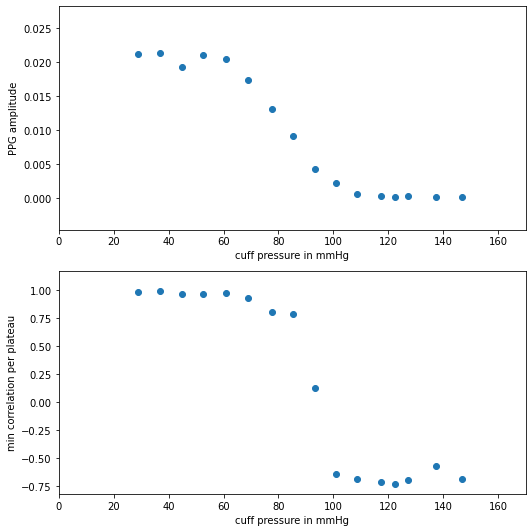

In [ ]:
patients=[]
lsys=[]
na=[]
d0=[]
d1=[]
d2=[]
d3=[]
d4=[]
d5=[]
d6=[]
d7=[]
d08=[]
d8=[]
d9=[]
d10=[]
d11=[]
d12=[]
d13=[]
d14=[]
d015=[]
d15=[]
d16=[]
d17=[]
d18=[]
d19=[]
d20=[]
d21=[]
d22=[]
folder = '/content/drive/MyDrive/data40/sphygmo/'
# for patient in [x for x in os.listdir(folder)if x.find('P')!=-1]:
for patient in ['210715AP']:
  nibp = NIBPProcessor(folder+patient+'/nibp1.txt')
  nibp.save_peak_locations()
  nibp.detect_plateaus()
  print(f'{patient}:')
  ita1, sys1 = nibp.compute_ita()
  # print(f'{patient}: {sys1}')
  patients.append(patient)
  lsys.append(sys1)
  nibp.fitting(folder+patient+'/nibp1.txt',patient)

rangedf = pd.DataFrame()  
dia_fin = pd.DataFrame()  
dia_fin['patient']=na
dia_fin['d0']=d0
dia_fin['d1']=d1
dia_fin['d2']=d2
dia_fin['d3']=d3
dia_fin['d4']=d4
dia_fin['d5']=d5
dia_fin['d6']=d6
dia_fin['d7']=d7
dia_fin['d08']=d08
dia_fin['d8']=d8
dia_fin['d9']=d9
dia_fin['d10']=d10
dia_fin['d11']=d11
dia_fin['d12']=d12
dia_fin['d13']=d13
dia_fin['d14']=d14
dia_fin['d015']=d015
dia_fin['d15']=d15
dia_fin['d16']=d16
dia_fin['d17']=d17
dia_fin['d18']=d18
dia_fin['d19']=d19
dia_fin['d20']=d20
dia_fin['d21']=d21
# dia_fin['d22updated']=d22
save_df(dia_fin, 'diastolica2.csv')
# rangedf['Low_sys']=lsys


In [ ]:
save_df(dia_fin, 'diastolic.csv')

use median for thresh insead of mean          
also thresh, threshold1,2 chnaged with respect to minimum presssures median value

In [ ]:
class NIBPProcessor(object):
 
  def __init__(self, filepath=''):
    time, ch1, ch2, ch3= np.loadtxt(filepath, dtype=('f4, f4, f4, f4'),unpack=True,delimiter = '\t')
    ip = pd.DataFrame()
    ip['time'] = time
    ip['ref_ppg'] = ch2 + 4
    ip['occ_ppg'] = ch3 + 4
    ip['pressure'] = ch1
    self.ip = ip
    self.op=0
    self.op_new=0
    self.op_new1=0
    self.op_new2=0


  
  
  def save_peak_locations(self):
    self.ip['ref_peaks'],ref_wid, inxref,inx1ref = peak_and_valley_detect(self.ip['ref_ppg'])
    self.ip['occ_peaks'],occ_wid, inxocc, inx1occ = peak_and_valley_detect(self.ip['occ_ppg'], prominence=0.00005)

    self.ip['std']= self.ip['occ_ppg'].rolling(2000).std()
    self.ip['stdr']= self.ip['ref_ppg'].rolling(2000).std()
    self.ip['occ1d'] = np.gradient(self.ip['occ_ppg'].values,100)
    self.ip['occ1d_peaks'] = peak_detect(self.ip['occ1d'])
    self.ip['ref1d'] = np.gradient(self.ip['ref_ppg'].values)
    self.ip['ref1d_peaks'] = peak_detect(self.ip['ref1d'])

  def detect_plateaus(self):
    plateau_width = 3000
    # Making a list of plateaus
    hts = np.linspace(0.0001, 1, 100)
    peaks, _ = find_peaks(self.ip['pressure'], width=plateau_width)

    plateaus = []
    for peak in peaks:
      for ht in hts:
        width, height, left, right = peak_widths(self.ip['pressure'], np.array([peak]), rel_height=ht)
        if width > plateau_width:
          break
      plateaus.append(self.ip.loc[left[0]:right[0]])
    # Finding mean pressure for each plateau
    mean_pressures = []
    mean_occppg=[]
    mean_refppg=[]
    for plateau in plateaus:
      # plateau.drop(plateau.head(1000).index, inplace=True) 
      # plateau.drop(plateau.tail(500).index, inplace=True)
      mean_pressures.extend([plateau['pressure'].mean()] * len(plateau))
      mean_occppg.extend([plateau[plateau['occ_peaks']>0]['occ_peaks'].median()] * len(plateau))
      mean_refppg.extend([plateau[plateau['ref_peaks']>0]['ref_peaks'].median()] * len(plateau))

    self.ip = pd.concat(plateaus)
    self.ip['mean_pressure'] = mean_pressures
    self.ip['mean_occppg'] = mean_occppg
    self.ip['mean_refppg'] = mean_refppg
    self.ip = self.ip[np.invert(self.ip.index.duplicated())]
    return plateaus
  


  def separate_into_cycles(self, ppg='ref', separate_by_peak=True):
    detected_plateaus = self.ip['mean_pressure'].reindex(self.ip.index, fill_value=0).values

    # Making a list of occ ppg cycles
    cycles = []
    peaks = (self.ip[self.ip[f'{ppg}_peaks'] > 0].index).tolist()
    valleys = (self.ip[self.ip[f'{ppg}_peaks'] < 0].index).tolist()

    separator = peaks if separate_by_peak else valleys
    not_separator = valleys if separate_by_peak else peaks
    for i in range(1, len(separator)):
      # if (not_separator[i]>separator[i-1])&(not_separator[i]<separator[i]):
      cycles.append(self.ip.loc[separator[i - 1]:separator[i]])
    # to check if there are cycles with no valleys in between in ref arm, such cycles are ignored.
    cycles = [cycle for cycle in cycles if len(np.where((not_separator>cycle.index[0])&(not_separator<cycle.index[-1]))[0]) != 0]
    begin = self.ip.loc[:separator[0]]
    return cycles



  def separate_into_occcycles(self):
    detected_plateaus = self.ip['mean_pressure'].reindex(self.ip.index, fill_value=0).values

    # Making a list of occ ppg cycles
    cycles = []
    peaks = (self.ip[self.ip['occ_peaks'] > 0].index).tolist()
    for i in range(1, len(peaks)):
      cycles.append(self.ip.loc[peaks[i - 1]:peaks[i]])
    # to check if there are cycles with no valleys in between in ref arm, such cycles are ignored.
    cycles = [cycle for cycle in cycles if len(cycle[(cycle['occ_peaks'] < 0)]) != 0]
    begin = self.ip.loc[:peaks[0]]
    return cycles
    
  

  def separate_into_refcycles(self):

    detected_plateaus = self.ip['mean_pressure'].reindex(self.ip.index, fill_value=0).values

    # Making a list of ref ppg cycles
    cycles = []
    valleys = (self.ip[self.ip['ref_peaks'] < 0].index).tolist()
    for i in range(1, len(valleys)):
      cycles.append(self.ip.loc[valleys[i - 1]:valleys[i]])
    # to check if there are cycles with no peaks in between in ref arm, such cycles are ignored.
    cycles = [cycle for cycle in cycles if len(cycle[(cycle['ref_peaks'] > 0)]) != 0]
    begin = self.ip.loc[:valleys[0]]
    return cycles

    

  def compute_ita(self):
    ita=[]
    cycle_pressure=[]
    cycles = self.separate_into_occcycles()
    for i,cycle in enumerate(cycles):
      if (cycle ['mean_pressure'].values[0] == cycle['mean_pressure'].values).all():
        tt1=cycle[cycle['occ_peaks']>0]['time'].values[0]
        pp1=cycle[cycle['occ_peaks']>0]['occ_peaks'].values[0]

        tt2=cycle[cycle['occ_peaks']<0]['time'].values[0]
        pp2=cycle[cycle['occ_peaks']<0]['occ_peaks'].values[0]

        tt3=cycle[cycle['occ_peaks']>0]['time'].values[-1]
        pp3=cycle[cycle['occ_peaks']>0]['occ_peaks'].values[-1]

        cycle_pressure.append(cycle['mean_pressure'].values[0])

        tt4=tt2-tt1
        tt5=tt3-tt2
        ita_cycle=(0.5*( (pp1*tt5) + (pp3*tt4)))
        ita.append(ita_cycle)

    itapd = pd.DataFrame()
    itapd['ita']=ita
    itapd['pressure']=cycle_pressure
    threshold = itapd['ita'].max()/50

    if len(itapd[itapd['ita']<threshold])!=0:
      first_zero = itapd[itapd['ita']<threshold]['pressure'].min()
    else:
      first_zero = itapd[itapd['ita']==(itapd['ita'].min())]['pressure'].min()
    return itapd, first_zero

  def fit_sigmoid(self, data, x, y):
    (a, b, c, d, e), _ = curve_fit(sigmoid_5pl, data[x], data[y], maxfev=5000)
    
    data['fit'] = sigmoid_5pl(data[x], a, b, c, d, e)
    # save_df(self.op, '_profile_pd.csv')

    fit = pd.DataFrame()
    fit['x'] = list(range(int(data[x].min()), int(data[x].max())))
    fit['y'] = np.interp(fit['x'], data[x], data['fit'])
    order = (fit['x'].max() - fit['x'].min()) / 10
    fit['d1'] = np.gradient(gaussian_filter1d(fit['y'], order))
    fit['d2'] = np.gradient(fit['d1'])
    return fit

  def fitting(self,input_file='', name=''):
    amplitude = []
    cycle_pressure = []
    plateau_pressure = []
    ref_amplitude = []
    # na=[]
    na.append(name)
    print(name)

    stdev = []
    auc = []
    occ1d = []
    delay = []
    ref_auc = []
    vol = []
    ref_vol = []
    full_auc = []
    corr=[]
    auc_r=[]
    list_pres=[]
    list_ratio=[]
    list_cor=[]
    list_amp=[]
    list_amponly=[]
    cycles = self.separate_into_refcycles()
    # added 24th
    diast=0
    upd=0
    upd1=0
    diamax=0
    diafinal=0
    auci=0
    refi=0
    ai=0
    for i in range(len(cycles)):
      if (cycles[i]['mean_pressure'].values[0] == cycles[i]['mean_pressure'].values).all():
        stdev.append(cycles[i]['std'].values[0])
        c,v=scipy.stats.pearsonr(cycles[i]['ref_ppg'], cycles[i]['occ_ppg'])
        corr.append (c )
        ref_amplitude.append(
          cycles[i][(cycles[i]['ref_peaks'] >0)]['ref_peaks'].values[0])
        ri=(cycles[i][(cycles[i]['ref_peaks'] >0)]['ref_peaks'].values[0])
        plateau_pressure.append(cycles[i]['mean_pressure'].values[0])
        ppi=(cycles[i]['mean_pressure'].values[0])
        cycle_pressure.append(cycles[i]['pressure'].mean())
        max = cycles[i]['occ_ppg'].values.max()
        maxref = cycles[i]['ref_ppg'].values.max()
        min = cycles[i]['occ_ppg'].values.min()
        minref = cycles[i]['ref_ppg'].values.min()
        delay_samples = abs(cycles[i][cycles[i]['ref_ppg']==maxref].index[0] - cycles[i][cycles[i]['occ_ppg']==max].index[0])
        # dich_inx = cycles[i][cycles[i]['ref1d_peaks']>0].index[-1]+delay_samples
        ref_inx = np.sort(np.array([cycles[i][cycles[i]['ref_ppg']==maxref].index[0],cycles[i][cycles[i]['ref_ppg']==minref].index[0]]))
        occ_inx = np.sort(np.array([cycles[i][cycles[i]['occ_ppg']==max].index[0],cycles[i][cycles[i]['occ_ppg']==min].index[0]]))
        # amplitude.append(max - cycles[i]['occ_ppg'].min())
        # ai=(max - cycles[i]['occ_ppg'].max())
        delay.append(delay_samples)
        occ1d.append(cycles[i]['occ1d'].max())
        auc.append((cycles[i].loc[:cycles[i][cycles[i]['occ_ppg']==max].index[0]]['occ_ppg'].values - cycles[i]['occ_ppg'].min()).sum())
        auci=((cycles[i].loc[:cycles[i][cycles[i]['occ_ppg']==max].index[0]]['occ_ppg'].values - cycles[i]['occ_ppg'].min()).sum())

        full_auc.append((cycles[i]['occ_ppg'].values - cycles[i]['occ_ppg'].min()).sum())
        ref_auc.append((cycles[i].loc[:cycles[i][cycles[i]['ref_ppg']==maxref].index[0]]['ref_ppg'].values - cycles[i]['ref_ppg'].min()).sum())
        refi=((cycles[i].loc[:cycles[i][cycles[i]['ref_ppg']==maxref].index[0]]['ref_ppg'].values - cycles[i]['ref_ppg'].min()).sum())
        vol.append((cycles[i].loc[occ_inx[0]:occ_inx[1]]['occ_ppg'].values - min).sum())
        ref_vol.append((cycles[i].loc[ref_inx[0]:ref_inx[1]]['ref_ppg'].values - minref).sum())




        if len(cycles[i][(cycles[i]['occ_peaks'] >0)]) != 0:
          ai=cycles[i][(cycles[i]['occ_peaks'] >0)]['occ_peaks'].values[0]
          amplitude.append(
            cycles[i][(cycles[i]['occ_peaks'] >0)]['occ_peaks'].values[0])
        else:
          ai=0
          amplitude.append(0)

        auc_r=(np.divide(auci,refi))
        amp_r=(np.divide(ai,ri))

        # if(c>=0):
        # print(ppi, auc_r)
        list_pres.append(ppi)
        list_ratio.append(auc_r)
        list_amp.append(amp_r)
        list_cor.append(c)
        list_amponly.append(ai)

    


    # Putting the output variables in anot
    op = pd.DataFrame()
    op['plateau_pressure'] = plateau_pressure
    op['amplitude'] = amplitude
    op['cycle_pressure'] = cycle_pressure
    op['ref_amplitude'] = ref_amplitude
    op['ratio'] = np.divide(np.array(amplitude), np.array(ref_amplitude))


    op['stdev'] = stdev
    op['auc'] = auc
    op['occ1d'] = occ1d
    op['delay'] = delay
    op['ref_auc'] = ref_auc
    op['vol'] = vol
    op['ref_vol'] = ref_vol
    op['full_auc'] = full_auc
    op['occ_radius'] = np.sqrt(np.divide(op['auc'].values, np.ones(len(op))*np.pi))
    op['ref_radius'] = np.sqrt(np.divide(op['ref_auc'].values, np.ones(len(op))*np.pi))
    op['auc_ratio'] = np.divide(op['auc'].values, op['ref_auc'])
    op['corr']=corr

    op_new = pd.DataFrame()
    op_new['ppi']= list_pres
    op_new['aucr']=list_ratio
    op_new['ampr']=list_amp
    op_new['corl']=list_cor
    op_new['amponly']=list_amponly
    op_new = op_new[(np.abs(stats.zscore(op_new)) < 3).all(axis=1)]
    op_new = op_new.sort_values('ppi')
    self.op_new=op_new

    op_new1=pd.DataFrame()
    

    op_new2=pd.DataFrame()
    

    # Removing outliers (helps fitting)
    op = op[(np.abs(stats.zscore(op)) < 3).all(axis=1)]
    op = op.sort_values('plateau_pressure')
    self.op=op

    threshold = np.max(op.groupby('plateau_pressure').median()['auc_ratio'].values)
    threshold1 = np.max(op.groupby('plateau_pressure').median()['ratio'].values)
    threshold2 = np.max(op.groupby('plateau_pressure').median()['amplitude'].values)
    # bins = 4
    # threshold= np.quantile(op['corr'],(bins-1)/bins)
    # sys=op[op['corr']==np.min(op['corr'])]['plateau_pressure'].min()
    # dia1= op[op['plateau_pressure']<sys][op['corr']>=threshold]['plateau_pressure'].max()
    # dia2= op[op['plateau_pressure']>dia1]['plateau_pressure'].values[0]
    n=pd.DataFrame()
    pr=[]
    co=[]
    ampi=[]
    cori=[]
    ari=[]
    amponlyi=[]
    cormin=[]

    n['P']=np.unique(nibp.op['plateau_pressure'].values)
    pr=np.unique(nibp.op['plateau_pressure'])
    # n['corr']=nibp.op.groupby('plateau_pressure').max()['corr'].values
    n['corr']=nibp.op.groupby('plateau_pressure').mean()['corr'].values
    # co=nibp.op.groupby('plateau_pressure').max()['corr']
    co=nibp.op.groupby('plateau_pressure').mean()['auc_ratio']
    co2=nibp.op.groupby('plateau_pressure').min()['auc_ratio']
    co3=nibp.op.groupby('plateau_pressure').max()['auc_ratio']
    co4=nibp.op.groupby('plateau_pressure').median()['auc_ratio']
    de=nibp.op.groupby('plateau_pressure').min()['delay']
    de1=nibp.op.groupby('plateau_pressure').max()['delay']
    de2=nibp.op.groupby('plateau_pressure').mean()['delay']
    de3=nibp.op.groupby('plateau_pressure').median()['delay']
    ard=list(zip(pr,de))
    ard1=list(zip(pr,de1))
    ard2=list(zip(pr,de2))
    ard3=list(zip(pr,de3))
    ar=list(zip(pr,co))
    ar2=list(zip(pr,co2))
    ar3=list(zip(pr,co3))
    ar4=list(zip(pr,co4))
    pr=[]
    
    prppi=np.unique(op_new['ppi'])
    try:
      ari=nibp.op_new.groupby('ppi').median()['aucr'].values
      cori=nibp.op_new.groupby('ppi').mean()['corl'].values
      cormin=nibp.op_new.groupby('ppi').min()['corl'].values
      ampi=nibp.op_new.groupby('ppi').median()['ampr'].values
      amponlyi=nibp.op_new.groupby('ppi').median()['amponly'].values
    except:
      ari=[]
      cori=[]
      ampi=[]
      amponlyi=[]
      cormin=[]
    
    
    # threshold = np.max(ari)
    # threshold1 = np.max(ampi)
    # threshold2 = np.max(amponlyi)



    op_new1['ppi']= prppi
    op_new1['aucr']=ari
    op_new1['corl']=cori
    op_new1['ampr']=ampi
    op_new1['amponly']=amponlyi
    op_new1['cormin']=cormin
    self.op_new1=op_new1
    print(op_new1)
    print(np.min(prppi))
    threshold=nibp.op_new1[op_new1['ppi']==np.min(prppi)]['aucr'].values[0]
    threshold1=nibp.op_new1[op_new1['ppi']==np.min(prppi)]['ampr'].values[0]
    threshold2=nibp.op_new1[op_new1['ppi']==np.min(prppi)]['amponly'].values[0]
    print(threshold)
    print(threshold1)
    print(threshold2)

    
    
    # d1=[]
    # d2=[]
    # d3=[]
    # d4=[]
    # d5=[]
    # d6=[]
    # d7=[]
    # d8=[]
    # d9=[]
    # d10=[]
    # d11=[]
    # d12=[]
    # d13=[]
    # d14=[]
    # d15=[]
    # d16=[]
    # d17=[]
    # d18=[]
    # d19=[]
    # d20=[]
    # d21=[]
    # d22=[]

    try:

      print("--------threshold----------")
      print(threshold)
      print(threshold*0.9)
      print('\n')
      diast1=op_new1[op_new1['corl']>=0.89]['ppi'].max()
      diast2=op_new1[op_new1['cormin']>=0.89]['ppi'].max()
      print("-----based on corr>0.89-----")
      d1.append(diast1)
      d0.append(diast2)
      print(diast1)
      print(diast2)
      # op_new2['patient']=na
      # op_new2['d1']=d1
      print('\n')
      print("-----based on auc ratio-----")
      d2.append(op_new1[op_new1['aucr']>=threshold*0.7]['ppi'].max())
      # op_new2['d2']=d2
      print(threshold*0.7)
      print('\n')
      print("-----based on amp ratio-----")
      d3.append(op_new1[op_new1['ampr']>=threshold1*0.7]['ppi'].max())
      # op_new2['d3']=d3
      print(threshold1*0.7)
      print('\n')
      print("-----based on amponly -----")
      d4.append(op_new1[op_new1['amponly']>=threshold2*0.7]['ppi'].max())
      # op_new2['d4']=d4
      print(threshold2*0.7)
      print('\n')
      print("-----based on amp ratio and corr-----")
      d5.append(op_new1[(op_new1['ampr']>=threshold1*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d5']=d5
      print(op_new1[(op_new1['ampr']>=threshold1*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      print('\n')
      print("-----based on auc ratio and corr-----")
      d6.append(op_new1[(op_new1['aucr']>=threshold*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      print(op_new1[(op_new1['aucr']>=threshold*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d6']=d6
      print('\n')
      print("-----based on amp and corr-----")
      d7.append(op_new1[(op_new1['amponly']>=threshold2*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      print(op_new1[(op_new1['amponly']>=threshold2*0.7) & (op_new1['corl']>=0.89)]['ppi'].max())
      print(threshold2*0.7)
      print(op_new1[(op_new1['amponly']>=threshold2*0.7)]['ppi'].max())
      print(op_new1[ (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d7']=d7
      print('\n')


      print('\n')
      print("--------NEW PARAMS I----------")
      print("---threshold----")
      print(threshold)
      print(threshold*0.9)
      print('\n')
      diast=op_new1[op_new1['corl']>=0.95]['ppi'].max()
      diast3=op_new1[op_new1['cormin']>=0.95]['ppi'].max()
      print("-----based on corr>0.95-----")
      d8.append(diast)
      d08.append(diast3)
      print(diast)
      # op_new2['d8']=d8
      print('\n')
      print("-----based on auc ratio-----")
      d9.append(op_new1[op_new1['aucr']>=threshold*0.75]['ppi'].max())
      # op_new2['d9']=d9
      print(threshold*0.75)
      print('\n')
      print("-----based on amp ratio-----")
      d10.append(op_new1[op_new1['ampr']>=threshold1*0.75]['ppi'].max())
      # op_new2['d10']=d10
      print(threshold1*0.75)
      print('\n')
      print("-----based on amponly -----")
      d11.append(op_new1[op_new1['amponly']>=threshold2*0.75]['ppi'].max())
      # op_new2['d11']=d11
      print(threshold2*0.75)
      print('\n')
      print("-----based on amp ratio and corr-----")
      d12.append(op_new1[(op_new1['ampr']>=threshold1*0.75) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d12']=d12
      print('\n')
      print("-----based on auc ratio and corr-----")
      d13.append(op_new1[(op_new1['aucr']>=threshold*0.75) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d13']=d13
      print('\n')
      print("-----based on amp and corr-----")
      d14.append(op_new1[(op_new1['amponly']>=threshold2*0.75) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d14']=d14
      print('\n')

      print('\n')
      print("--------NEW PARAMS II----------")
      print("--------threshold----------")
      print(threshold)
      print(threshold*0.9)
      print('\n')
      diast=op_new1[op_new1['corl']>=0.98]['ppi'].max()
      diast4=op_new1[op_new1['cormin']>=0.98]['ppi'].max()
      print("-----based on corr>0.98-----")
      d15.append(diast)
      d015.append(diast4)
      # op_new2['d15']=d15
      print('\n')
      print("-----based on auc ratio-----")
      d16.append(op_new1[op_new1['aucr']>=threshold*0.68]['ppi'].max())
      # op_new2['d16']=d16
      print(threshold*0.68)
      print('\n')
      print("-----based on amp ratio-----")
      d17.append(op_new1[op_new1['ampr']>=threshold1*0.68]['ppi'].max())
      # op_new2['d17']=17
      print(threshold1*0.68)
      print('\n')
      print("-----based on amponly -----")
      d18.append(op_new1[op_new1['amponly']>=threshold2*0.68]['ppi'].max())
      # op_new2['d18']=d18
      print(threshold2*0.68)
      print('\n')
      print("-----based on amp ratio and corr-----")
      d19.append(op_new1[(op_new1['ampr']>=threshold1*0.68) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d19']=d19
      print('\n')
      print("-----based on auc ratio and corr-----")
      d20.append(op_new1[(op_new1['aucr']>=threshold*0.68) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d20']=d20
      print('\n')
      print("-----based on amp and corr-----")
      d21.append(op_new1[(op_new1['amponly']>=threshold2*0.68) & (op_new1['corl']>=0.89)]['ppi'].max())
      # op_new2['d21']=d21
      print('\n')


    except:
      print("except for this patient")



    # for i in range (1,len(ar)):
    #   pr.append((ar[i][0], ar[i][1]-ar[i-1][1]))
    # n1=[i for i, j in pr]
    # n2=[j for i, j in pr]
    # da=pd.DataFrame()
    # da['pres']=n1
    # n2=[x * 100 for x in n2]
    # da['cor']=n2
    # dia1=da[abs(da['cor'])>5]['pres'].values[0]
    # dia2=da[(da['pres'])<dia1]['pres'].values[-1]
    # print(dia1,dia2)
    # [print(x) for x in ar]
    # print("-------*mean")
    # print('\n')
    # [print(x) for x in ar2]
    # # scatter(n['P'],n['corr'])
    # print("-------**min")
    # [print(x) for x in ar3]
    # # [print(x) for x in pr]
    # print("-------***max")
    # [print(x) for x in ar4]
    # [print(x) for x in pr]
    # print("-------***median")
    # [print(x) for x in ard]
    # print("-------****min")
    # [print(x) for x in ard1]
    # print("-------****max")
    # [print(x) for x in ard2]
    # print("-------****mean")
    # [print(x) for x in ard3]
    # print("-------****meadian")
    # print (diast)
    # print("updated dia:")






    try:
      (a, b, c, d, e), _ = curve_fit(sigmoid_5pl, self.op['plateau_pressure'], self.op['auc_ratio'], maxfev=5000)
      print("5tttttttttttttttttttttttttt5555555tt5")
    except:
      w = plt.scatter(self.op['plateau_pressure'], self.op['auc_ratio'])
      plt.subplots_adjust(bottom=0.3)
      plt.gcf().text(0.05, 1.05, input_file.split('/')[-1].split('.')[0], fontsize=16)

      axes = plt.gca()
      num = (self.op['auc_ratio'].max()-self.op['auc_ratio'].min())/5
      axes.set_ylim([self.op['auc_ratio'].min()-num, self.op['auc_ratio'].max()+num])
      axes.set_xlim([0, 200])

      plt.xlabel('Pressures in mmHg');
      plt.ylabel('PPG');
      plt.title('Peak Detect: 5PL Sigmoid Fit Failed')
      plt.savefig(input_file[:-4]+'_pd.png')
      plt.tight_layout(h_pad=1)
      plt.show()
      print("5tttttttttttttttttttttttttttt5")
      return [np.nan, np.nan, np.nan, np.nan], [np.nan, np.nan, np.nan, np.nan]
    print("5tttt66666666666666666666666666tttttttttttttttttttttt5555555tt5")
    self.op['fit'] = sigmoid_5pl(self.op['plateau_pressure'], a, b, c, d, e)
    # save_df(self.op, '_profile_pd.csv')
    
    print("55")

    fit = pd.DataFrame()
    fit['x'] = list(range(int(self.op['plateau_pressure'].min()), int(self.op['plateau_pressure'].max())))
    fit['y'] = np.interp(fit['x'], self.op['plateau_pressure'], self.op['fit'])
    order = (fit['x'].max() - fit['x'].min()) / 10
    fit['d1'] = np.gradient(gaussian_filter1d(fit['y'], order))
    fit['d2'] = np.gradient(fit['d1'])
    # save_df(fit, '_slopes_pd.csv')

    temp = pd.DataFrame()
    temp['pressures'] = np.sort(list(set(op['plateau_pressure'])))
    temp['variances'] = [self.op[self.op['plateau_pressure'] == pressure]['auc_ratio'].var() for pressure in temp['pressures']]
    temp['median'] = [self.op[self.op['plateau_pressure'] == pressure]['auc_ratio'].median() for pressure in temp['pressures']]
    print("66")
    plt.figure(figsize=(7.5, 7.5))
    print("77")
    # Max and min of 2nd derivative
    up_dias = fit[fit['d2'] == fit['d2'].min()]['x'].values[0]
    low_sys = fit[fit['d2'] == fit['d2'].max()]['x'].values[0]
    print("88")
    # nearest cuff pressure value
    temp['up_dias_diff'] = abs(temp['pressures'].values-up_dias)
    temp['low_sys_diff'] = abs(temp['pressures'].values-low_sys)
    up_dias = int(temp[temp['up_dias_diff']==temp['up_dias_diff'].min()]['pressures'].values[0])
    low_sys = int(temp[temp['low_sys_diff']==temp['low_sys_diff'].min()]['pressures'].values[0])
    print("99")
    x = temp[temp['pressures'] < up_dias]
    try:
      # take last values with median below fit line before up_dias
      low_dias = int(x[x['median']<fit['y'].max()]['pressures'].values[-1])
    except:
      if len(x)==0:
        # there are no pressure values below up_dias
        low_dias = up_dias
      else:
        # in case of no median below fit, take the lowest point
        low_dias = int(x[x['median']==x['median'].min()]['pressures'].values[0])
    x = temp[(temp['pressures']- low_sys)>1]
    print("99999")
    try:
      up_sys = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])
    except:
      # there are no values greater than low_sys
      up_sys = low_sys

    infls = [low_dias, up_dias, low_sys, up_sys]
    upd1=up_dias
    # print(upd1)
    # print("f")
    plt.subplot(2, 1, 1)
    print("5445")
    w = plt.scatter(self.op['plateau_pressure'], self.op['auc_ratio'])
    plt.plot(fit['x'], fit['y'])
    for i, inf in enumerate(infls, 1):
      plt.axvline(x=inf, color='k', label=f'Inflection Point {i}')

    textstr = 'systolic range: ' + str(low_sys) + ' - ' + str(up_sys) + ' mmHg\ndiastolic range: ' + str(
      low_dias) + ' - ' + str(up_dias) + ' mmHg'
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    plt.gcf().text(0.6, 0.9, textstr, fontsize=10, bbox=props)

    axes = plt.gca()
    num = (self.op['auc_ratio'].max()-self.op['auc_ratio'].min())/5
    axes.set_ylim([self.op['auc_ratio'].min()-num, self.op['auc_ratio'].max()+num ])
    axes.set_xlim([0, 200])

    plt.xlabel('Pressures in mmHg');
    plt.ylabel('PPG');
    plt.title('Peak Detect Inflection Points')
    print("5    5")
    # Intersection of lines through max, min, infl of fit
    try:
      infl = [x for x in fit[np.sign(fit['d2']).diff() != 0]['x'].values if (x > up_dias) & (x < low_sys)][0]
    except:
      plt.subplot(2,1,2)
      w = plt.scatter(self.op['plateau_pressure'], self.op['auc_ratio'])
      plt.subplots_adjust(bottom=0.3)
      plt.gcf().text(0.05, 1.05, input_file.split('/')[-1].split('.')[0], fontsize=16)

      axes = plt.gca()
      num = (self.op['auc_ratio'].max()-self.op['auc_ratio'].min())/5
      axes.set_ylim([self.op['auc_ratio'].min()-num, self.op['auc_ratio'].max()+num ])
      axes.set_xlim([0, 200])

      plt.xlabel('Pressures in mmHg');
      plt.ylabel('PPG');
      plt.title('Peak Detect: Intersection Failed')    
      plt.tight_layout(h_pad=1)
      plt.savefig(input_file[:-4]+'_pd.png')
      plt.show()
      return infls, [np.nan, np.nan, np.nan, np.nan]
    print("5ffrf5")
    x1_high = fit['x'].min()
    y1_high = fit[fit['x'] == fit['x'].min()]['y'].values[0]
    # m_high = fit[fit['x'] == fit['x'].min()]['d1'].values[0]
    m_high= (fit[fit['x'] == fit['x'].min()+10]['y'].values[0] -y1_high)/10
    fit['line_high'] = (fit['x'] - x1_high) * m_high + y1_high

    # x1_infl = infl
    # y1_infl = fit[fit['x'] == infl]['y'].values[0]
    # m_infl = fit[fit['x'] == infl]['d1'].values[0]
    # fit['line_infl'] = (fit['x'] - x1_infl) * m_infl + y1_infl

    x1 = infl-5
    y1 = fit[fit['x'] == (infl-5)]['y'].values[0]
    # m = fit[fit['x'] == infl]['d1'].values[0]
    m=  (fit[fit['x'] == (infl+5)]['y'].values[0] - y1)/10
    # m= fit['d1'].min()
    # m = fit[fit.index==fit[fit['x']==infl].index[0]+10]['d1'].values[0]
    # print(m)
    fit['line_infl'] = (fit['x'] - x1) * m + y1

    x1_low = fit['x'].max()
    y1_low = fit[fit['x'] == fit['x'].max()]['y'].values[0]
    m_low = fit[fit['x'] == fit['x'].max()]['d1'].values[0]
    fit['line_low'] = (fit['x'] - x1_low) * m_low + y1_low

    plt.subplot(2, 1, 2)
    w = plt.scatter(self.op['plateau_pressure'], self.op['auc_ratio'])
    plt.plot(fit['x'], fit['y'])
    plt.plot(fit['x'], fit['line_high'], '--', linewidth=1.2)
    plt.plot(fit['x'], fit['line_infl'], '--', linewidth=1.2)
    plt.plot(fit['x'], fit['line_low'], '--', linewidth=1.2)

    plt.plot(infl, fit[fit['x'] == infl]['y'].values[0], 'ro')
    print("5tttttttt5")
    try:
      idx1 = np.argwhere(np.diff(np.sign(fit['line_high'] - fit['line_infl']))).flatten()[0]
    except:
      # there's no intersection
      idx1 = 0
    up_dias = fit['x'].values[idx1] 
    try:
      idx2 = np.argwhere(np.diff(np.sign(fit['line_infl'] - fit['line_low']))).flatten()[0]    
    except:
      # there's no intersection
      idx2 = -1
    low_sys = fit['x'].values[idx2]
    print("dewdew55")
    # take nearest cuff pressure value
    temp['up_dias_diff'] = abs(temp['pressures'].values-up_dias)
    temp['low_sys_diff'] = abs(temp['pressures'].values-low_sys)
    up_dias = int(temp[temp['up_dias_diff']==temp['up_dias_diff'].min()]['pressures'].values[0])
    low_sys = int(temp[temp['low_sys_diff']==temp['low_sys_diff'].min()]['pressures'].values[0])

    plt.plot(up_dias, fit['line_high'].values[idx1], 'ro')
    plt.plot(low_sys, fit['line_low'].values[idx2], 'ro')

    

    x = temp[temp['pressures'] < up_dias]
    try:
      # take last values with median below fit line before up_dias
      low_dias = int(x[x['median']<fit['y'].max()]['pressures'].values[-1])
    except:
      if len(x)==0:
        # there are no pressure values below up_dias
        low_dias = up_dias
      else:
        # in case of no median below fit, take the lowest point
        low_dias = int(x[x['median']==x['median'].min()]['pressures'].values[0])
    x = temp[(temp['pressures']-low_sys)>1]
    # added 24th
    print("5errrrrrr5")
    upd=up_dias
    diafinal=0
    print(",,,,,,,,")
    dialist=[]
    dialist2=[]
    dialist.append(diast1)
    dialist.append(upd)
    dialist.append(upd1)
    # print(dialist)
    diamax= ((np.max(dialist)))
    print("=====")
    print(diamax)
    try:
      up_sys = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])
    except:
      # no values greater than low_sys
      up_sys = low_sys
    # added 24th
    if (diamax<up_sys):
      print("qqqqq")
      print(diamax)
      diafinal=diamax
    else:
      print("eeeee")
      dialist2.append(upd)
      dialist2.append(upd1)
      print(np.max(dialist2))
      diafinal=np.max(dialist2)
    # op_new2['d22updated']=diafinal
    d22.append(diafinal)
    print(diafinal)
    self.op_new2=op_new2
    
    
    
    

    plt.plot(low_dias, fit[fit['x'] > low_dias]['y'].max(), 'ro')
    plt.plot(up_sys, fit[fit['x'] < up_sys]['y'].min(), 'ro')

    textstr = 'systolic range: ' + str(low_sys) + ' - ' + str(up_sys) + ' mmHg\ndiastolic range: ' + str(
      low_dias) + ' - ' + str(up_dias) + ' mmHg'
    plt.subplots_adjust(bottom=0.3)
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    plt.gcf().text(0.6, 0.4, textstr, fontsize=10, bbox=props)
    plt.gcf().text(0.05, 1.05, input_file.split('/')[-1].split('.')[0], fontsize=16)

    axes = plt.gca()
    num = (self.op['auc_ratio'].max()-self.op['auc_ratio'].min())/5
    axes.set_ylim([self.op['auc_ratio'].min()-num, self.op['auc_ratio'].max()+num ])
    axes.set_xlim([0, 200])

    plt.xlabel('Pressures in mmHg');
    plt.ylabel('PPG');
    plt.title('Peak Detect Intersection Points')  
    plt.tight_layout(h_pad=1)
    plt.savefig(input_file[:-4]+'_pd.png')
    plt.show()
    inters = [low_dias, up_dias, low_sys, up_sys]

    return infls, inters

      

210715BP:
210715BP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.399391  0.805461  0.989406  0.769834  0.008116  0.978689
1    53.079773  0.495605  0.911481  0.584400  0.006492  0.779263
2    56.940723  0.627211  0.936361  0.593239  0.006231  0.848611
3    61.024216  0.505792  0.959944  0.558750  0.008614  0.892416
4    64.941582  0.408299  0.871844  0.385778  0.004125  0.785763
5    68.966133  0.251660  0.838718  0.234874  0.002251  0.541840
6    72.638275  0.409294  0.850412  0.437504  0.005560  0.541450
7    76.745102  0.257050  0.805283  0.275694  0.003144  0.268053
8    98.352783  0.164823  0.834773  0.171179  0.001857  0.563991
9   102.208260  0.127936  0.462811  0.079162  0.001058 -0.540299
10  106.350136  0.174433  0.768692  0.185194  0.002245  0.576080
11  110.223213  0.372967  0.135989  0.174991  0.001891 -0.339122
12  114.130829  0.068212 -0.066785  0.009220  0.000112 -0.569934
13  117.847023  0.142329 -0.266092  0.049057  0.000435 -0.791803
14  12

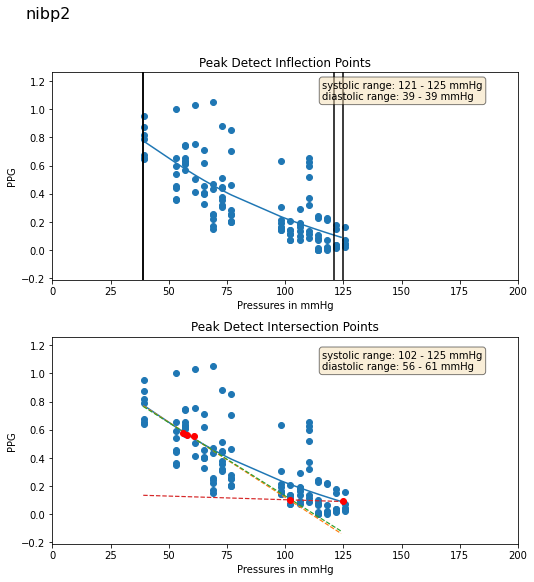

210715CP:
210715CP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.187641  0.564944  0.964721  0.478216  0.004545  0.910032
1    54.836872  0.478245  0.987174  0.457584  0.003365  0.979434
2    58.932674  0.549131  0.965463  0.483518  0.003436  0.938497
3    63.026905  0.400246  0.966845  0.384157  0.002696  0.925770
4    66.974083  0.441116  0.954167  0.482535  0.001918  0.894708
5    70.540222  0.341999  0.863369  0.309538  0.003051  0.617362
6    74.662552  0.333331  0.869957  0.325572  0.002741  0.763898
7    78.745842  0.270506  0.866091  0.255522  0.001925  0.802893
8    94.094978  0.195616  0.032280  0.100482  0.000904 -0.161003
9    98.012840  0.147277 -0.036943  0.074074  0.000629 -0.295233
10  102.129517  0.071924 -0.293052  0.042852  0.000415 -0.576849
11  106.018593  0.050115  0.208072  0.030492  0.000260 -0.135646
12  109.927437  0.063184  0.089537  0.019304  0.000162 -0.688750
13  113.931328  0.033492  0.280221  0.038532  0.000256 -0.354166
39.187

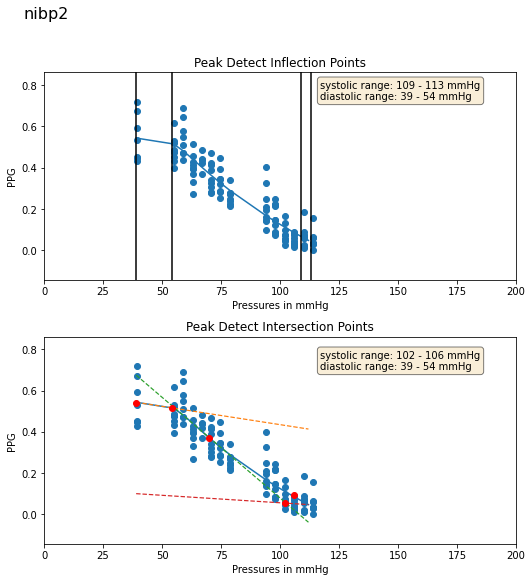

210715AP:
210715AP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.375187  0.732723  0.990287  0.677421  0.019326  0.978202
1    57.051964  0.657260  0.986482  0.613301  0.017268  0.972669
2    60.980843  0.617267  0.985900  0.580195  0.015406  0.971407
3    65.008774  0.590367  0.986665  0.551400  0.013829  0.964490
4    69.113129  0.485893  0.937362  0.487284  0.013077  0.883036
5    72.926529  0.482263  0.862508  0.426265  0.013072  0.842318
6    94.547928  0.195195  0.751731  0.170952  0.004850  0.625931
7    98.303574  0.098330 -0.119146  0.055040  0.001234 -0.626749
8   102.215340  0.103540  0.047232  0.048379  0.001135 -0.384908
9   106.163383  0.055295 -0.153986  0.025248  0.000701 -0.653512
10  110.032990  0.061929  0.238353  0.026049  0.000405 -0.002628
11  114.289284  0.040306 -0.445568  0.015436  0.000417 -0.734246
12  117.802345  0.011267  0.099006  0.005797  0.000176 -0.527749
13  121.707710  0.009793 -0.015007  0.008885  0.000249 -0.667756
39.375

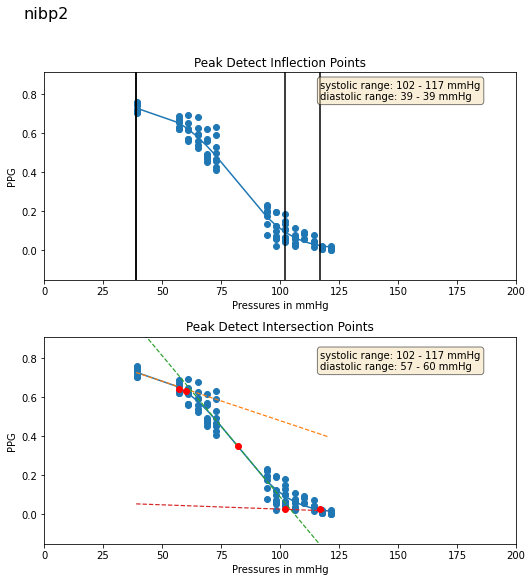

210716AP:
210716AP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.395714  1.008969  0.992878  0.999711  0.014767  0.985777
1    73.034424  1.090233  0.994532  1.124054  0.017196  0.990780
2    77.577385  1.129157  0.979903  1.130944  0.018102  0.953088
3    81.283470  1.274934  0.981975  1.287691  0.016626  0.970669
4    85.281548  1.140893  0.983987  1.126776  0.016674  0.978629
5    89.390335  1.104297  0.935624  1.119448  0.017633  0.858642
6    93.499779  0.912501  0.917985  0.945311  0.014886  0.857015
7   124.475815  0.462929  0.501373  0.424935  0.006784  0.127967
8   128.426193  0.304268  0.320757  0.254180  0.003403 -0.167848
9   132.430618  0.177622 -0.090513  0.092052  0.000479 -0.504405
10  136.389664  0.171773 -0.466581  0.066666  0.001001 -0.961160
11  140.288208  0.012911 -0.132753  0.014144  0.000240 -0.678118
12  143.984039  0.040721  0.206645  0.009408  0.000141 -0.620014
13  148.032776  0.018813  0.022752  0.010509  0.000142 -0.682775
39.395

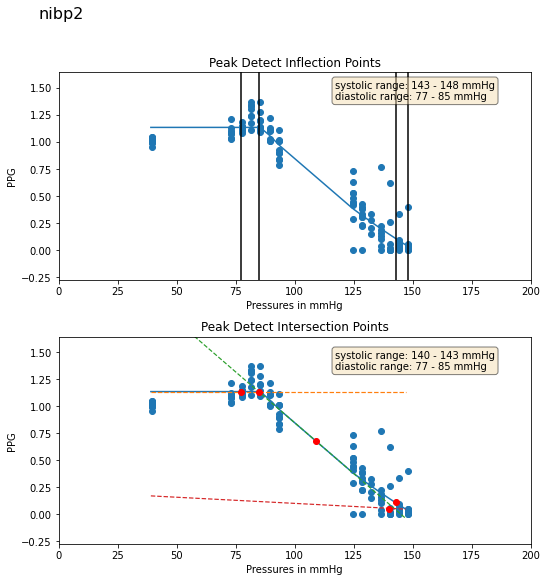

210717AP:
210717AP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.161438  1.656494  0.980715  1.604533  0.014794  0.924533
1    67.001251  1.306848  0.961349  1.287743  0.008372  0.871287
2    68.952644  1.474401  0.961869  1.466150  0.009353  0.906610
3    72.712471  1.303522  0.971295  1.362880  0.009853  0.924248
4    76.797829  1.094461  0.937638  1.291569  0.009393  0.925748
5    80.838852  1.198249  0.921784  1.302367  0.008369  0.828018
6    84.741776  1.037260  0.928442  1.160559  0.006976  0.881500
7    94.234108  0.672057  0.895926  0.792921  0.006175  0.874815
8    98.155144  0.446907  0.859672  0.512147  0.003792  0.818564
9   102.447296  0.287366  0.732253  0.311081  0.002838  0.532665
10  106.197090  0.278601  0.720021  0.288500  0.001966  0.662802
11  110.237427  0.179246  0.472025  0.195117  0.001636  0.135498
12  114.078003  0.175809 -0.124760  0.067717  0.000560 -0.366474
13  117.827614  0.102402 -0.385889  0.042604  0.000427 -0.655930
14  12

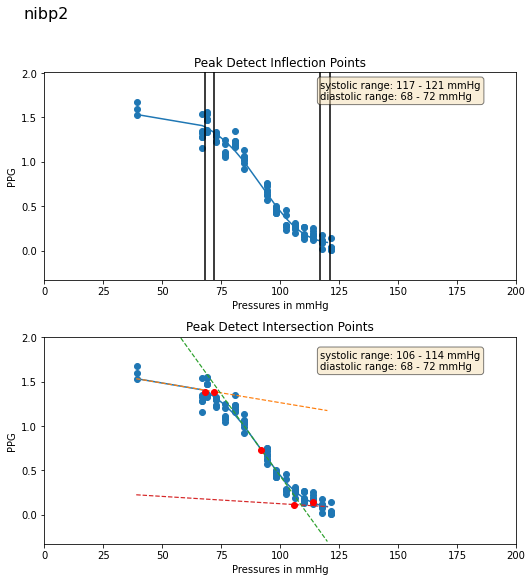

210719AP:
210719AP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.954281  1.030196  0.976396  0.985176  0.003993  0.936884
1    88.676140  1.060171  0.973710  1.035243  0.005589  0.950834
2    92.863480  0.839233  0.960937  0.905445  0.004607  0.922434
3    94.228912  0.868279  0.976045  0.921341  0.004586  0.965368
4    98.444099  0.886663  0.965712  1.076324  0.006391  0.952461
5   102.417564  1.049034  0.938576  1.147858  0.009449  0.915831
6   106.389557  0.685631  0.939808  0.890696  0.004547  0.869772
7   110.454323  0.686943  0.924058  0.853081  0.002993  0.878665
8   124.221359  0.461816  0.865361  0.546857  0.003610  0.810826
9   128.341156  0.338983  0.782572  0.513527  0.001448  0.691047
10  132.125793  0.302563  0.275840  0.229577  0.001698 -0.053554
11  136.244400  0.302277  0.446367  0.306448  0.001930  0.072686
12  139.967438  0.305045  0.279049  0.207938  0.001538 -0.443525
13  143.814102  0.227619  0.150454  0.210989  0.000936 -0.224353
14  14

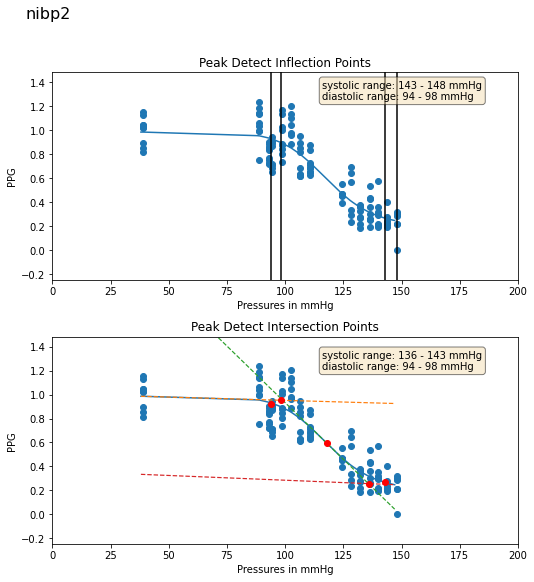

210719BP:
210719BP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.695385  0.767665  0.956291  0.760870  0.004776  0.817852
1    68.797569  0.549759  0.894337  0.580411  0.004141  0.787394
2    72.365158  0.666262  0.866817  0.666142  0.008314  0.749075
3    76.573189  0.846211  0.856443  0.771549  0.006359  0.754978
4    80.437340  0.740218  0.912036  0.732324  0.005324  0.807675
5    84.661133  0.695767  0.882249  0.780225  0.007685  0.859725
6    88.798653  0.448837  0.794385  0.440609  0.006348  0.725280
7   104.190819  0.371053  0.482960  0.269367  0.003166  0.296890
8   108.300613  0.361809  0.362540  0.216360  0.001796  0.275034
9   112.337448  0.313571 -0.007196  0.118991  0.000876 -0.719895
10  115.740410  0.241040 -0.055580  0.103421  0.000733 -0.747442
11  119.895882  0.035799  0.343521  0.017435  0.000266 -0.000439
12  123.943970  0.039898 -0.173018  0.022924  0.000303 -0.712970
13  127.511482  0.121452 -0.221371  0.035926  0.000216 -0.686793
38.695

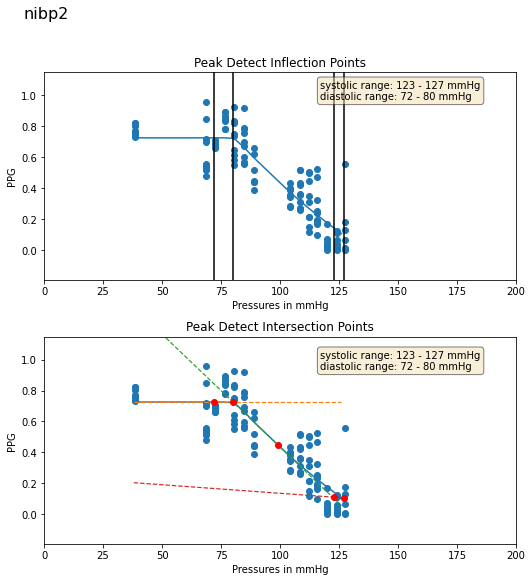

210720AP:
210720AP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.519547  0.895044  0.992358  0.883213  0.011715  0.988801
1    72.004845  0.853258  0.976510  0.879575  0.011461  0.953082
2    76.038666  0.810040  0.989070  0.846427  0.011841  0.972074
3    80.132164  0.760283  0.961633  0.805991  0.011548  0.939725
4    84.161751  0.712950  0.965917  0.771053  0.011073  0.935826
5    87.978836  0.621275  0.952415  0.660529  0.010081  0.936925
6   109.700455  0.371564  0.295920  0.299612  0.004636  0.208981
7   113.431282  0.103879 -0.486007  0.053481  0.000855 -0.815121
8   117.253128  0.029252  0.162788  0.009812  0.000161 -0.634771
9   121.091377  0.029182  0.248171  0.008087  0.000120 -0.728061
10  125.065247  0.019229  0.163181  0.010170  0.000157 -0.506782
11  129.048248  0.014764  0.399831  0.010882  0.000178 -0.518957
12  132.791611  0.013786  0.130115  0.011978  0.000186 -0.698419
38.51954650878906
0.8950437
0.8832127592650841
0.011715412139892578
---

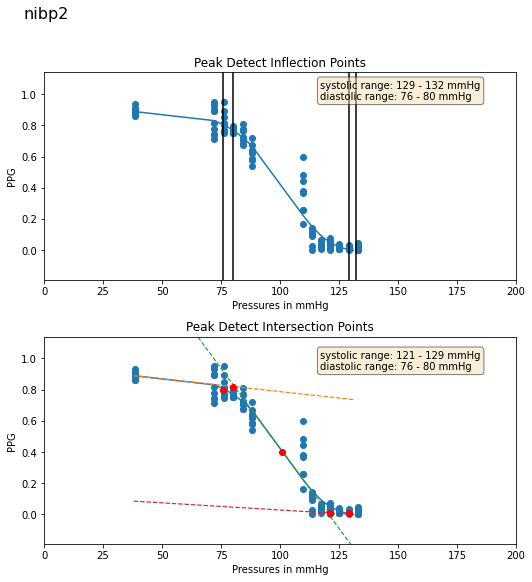

210720BP:
210720BP
           ppi      aucr      corl      ampr   amponly    cormin
0     2.578356  0.690713  0.994573  0.683742  0.005226  0.986862
1    39.109806  0.625292  0.985993  0.590113  0.003087  0.974204
2    58.877430  0.609813  0.971903  0.586245  0.003401  0.929641
3    63.099472  0.568725  0.969028  0.569515  0.004144  0.936822
4    66.879951  0.667521  0.959248  0.677912  0.005050  0.942892
5    70.623329  0.554492  0.953737  0.598770  0.004085  0.908585
6    74.772003  0.556983  0.888263  0.581660  0.002982  0.644742
7    78.615524  0.421870  0.898194  0.455265  0.002556  0.861264
8    92.739052  0.189036  0.475635  0.177852  0.000994  0.173208
9    96.226814  0.164498  0.063979  0.099083  0.000695 -0.259908
10  100.305847  0.135566  0.128926  0.122815  0.000650 -0.731943
11  104.303329  0.040835 -0.116191  0.025340  0.000170 -0.762891
12  108.319061  0.064084  0.098202  0.044020  0.000200 -0.871515
13  112.279510  0.089431 -0.117911  0.052692  0.000226 -0.607863
2.5783

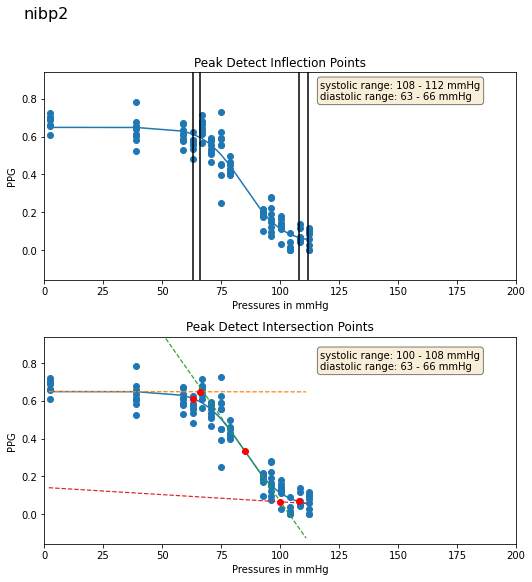

210723AP:
210723AP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.857368  0.463132  0.991597  0.427971  0.002433  0.981299
1    78.593887  0.429204  0.986391  0.452999  0.004338  0.972909
2    82.584396  0.373336  0.968157  0.430339  0.004844  0.939922
3    86.714699  0.484178  0.966430  0.565186  0.004322  0.936392
4    90.591484  0.469055  0.970952  0.559497  0.003885  0.955602
5    94.433647  0.431706  0.967923  0.524007  0.003191  0.951571
6    98.314331  0.337862  0.960495  0.429003  0.002723  0.942547
7   110.341270  0.199110  0.817342  0.232653  0.001837  0.742985
8   114.259048  0.164073  0.825104  0.206573  0.001430  0.721393
9   117.744392  0.158381  0.676003  0.164436  0.000966  0.547271
10  121.896561  0.113311  0.739271  0.118605  0.000641  0.632647
11  125.822174  0.217440  0.720327  0.214481  0.000733  0.544816
12  129.941620  0.098441 -0.235472  0.040617  0.000179 -0.732391
13  133.721695  0.040446  0.120300  0.014104  0.000146 -0.526091
14  13

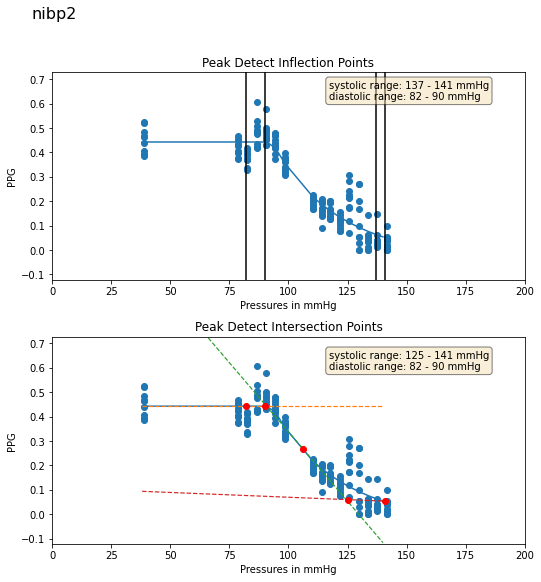

210724AP:
210724AP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.381207  0.277049  0.984316  0.291714  0.003869  0.976458
1    63.374454  0.317807  0.985361  0.260520  0.002932  0.975630
2    65.354568  0.432814  0.974712  0.383199  0.001599  0.956847
3    69.258858  0.236432  0.957739  0.225080  0.003345  0.904153
4    73.839958  0.256246  0.971725  0.221733  0.002762  0.940742
5    76.955742  0.231636  0.968034  0.207150  0.002937  0.916368
6    81.226494  0.273365  0.959171  0.239493  0.003288  0.926059
7    85.335205  0.232968  0.934963  0.196277  0.003255  0.864338
8   114.764168  0.135033  0.441355  0.097153  0.001546  0.302571
9   118.318138  0.087136  0.368424  0.044481  0.000580 -0.006147
10  122.577835  0.121704  0.287907  0.045892  0.000656 -0.232741
11  126.459618  0.072788 -0.174567  0.046725  0.000311 -0.838770
12  130.355591  0.097572  0.112611  0.030392  0.000250 -0.541122
13  134.455978  0.046322  0.015754  0.008354  0.000139 -0.804981
14  13

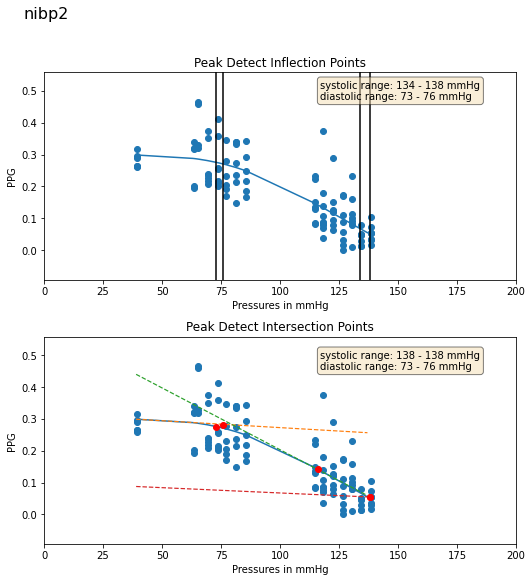

210724BP:
210724BP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.178875  0.671530  0.991294  0.697827  0.008587  0.983810
1    57.170734  0.547112  0.969036  0.650083  0.008071  0.923186
2    61.128872  0.428294  0.921315  0.397794  0.002748  0.873476
3    65.184441  0.520770  0.919023  0.551014  0.008060  0.849366
4    70.091942  0.594794  0.940202  0.639939  0.008356  0.906139
5    73.530655  0.428904  0.853679  0.422001  0.006268  0.654049
6    77.009453  0.589889  0.921440  0.688918  0.008957  0.890405
7    81.092354  0.475224  0.819590  0.514402  0.005102  0.784084
8    94.718857  0.173797  0.735548  0.176529  0.002763  0.681669
9    98.784012  0.166633  0.667503  0.179153  0.002286  0.443559
10  102.599617  0.140614  0.396516  0.134718  0.002240  0.259219
11  106.572319  0.059621 -0.331894  0.019510  0.000198 -0.925796
12  110.494209  0.016362 -0.326336  0.004132  0.000086 -0.927941
13  114.808990  0.039352  0.106504  0.014046  0.000192 -0.504295
14  11

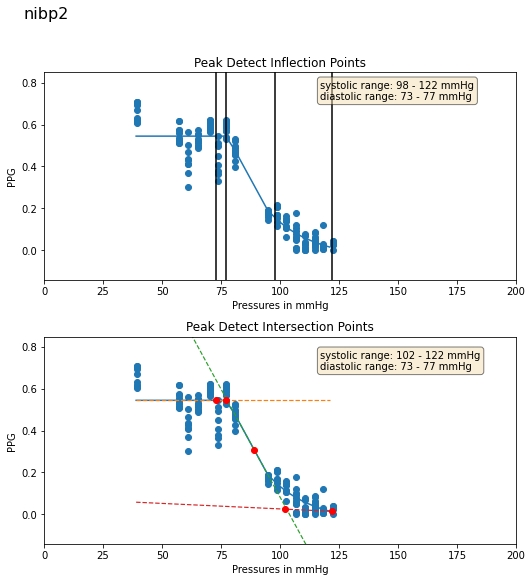

210726AP:
210726AP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.314377  0.809031  0.987434  0.836081  0.007485  0.966121
1    94.882996  0.564595  0.994252  0.681063  0.004671  0.990351
2    98.768044  0.594755  0.993727  0.661420  0.008790  0.983444
3   103.086067  0.563479  0.994577  0.617147  0.008012  0.985196
4   107.059036  0.586196  0.988434  0.732769  0.009460  0.980072
5   111.268257  0.505969  0.982340  0.647979  0.008662  0.975649
6   115.441750  0.432394  0.978361  0.570399  0.007941  0.963661
7   119.414413  0.388645  0.967659  0.510931  0.006390  0.920596
8   140.244232  0.125392  0.673158  0.154536  0.002378 -0.071489
9   144.156677  0.196644  0.073389  0.165522  0.002558 -0.364543
10  148.201828  0.170818  0.114698  0.140402  0.001702 -0.332446
11  152.525620  0.127461 -0.018689  0.026800  0.000407 -0.536134
12  156.158432  0.026934  0.002204  0.014880  0.000207 -0.641026
13  160.132538  0.022486 -0.253509  0.011113  0.000171 -0.832294
14  16

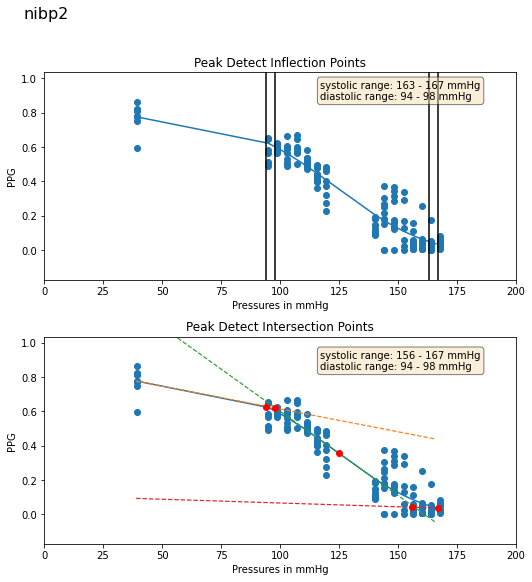

210726BP:
210726BP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.982029  0.691709  0.980707  0.708896  0.006966  0.965420
1    68.866257  0.689834  0.978729  0.700833  0.007667  0.969354
2    72.546959  0.643262  0.976002  0.730236  0.008555  0.965242
3    76.683098  0.726844  0.967965  0.829373  0.009674  0.936507
4    80.766441  0.591776  0.978010  0.681416  0.011105  0.966103
5    85.021210  0.512031  0.968058  0.611503  0.011000  0.954458
6    88.937843  0.591347  0.970440  0.651447  0.007834  0.952086
7    92.819298  0.436941  0.924007  0.540424  0.007496  0.875723
8   114.501945  0.175590  0.624280  0.222642  0.003686  0.515875
9   118.023033  0.171372  0.610534  0.214110  0.003364  0.392890
10  122.103157  0.190022  0.076165  0.179477  0.003240 -0.202961
11  126.186409  0.129577 -0.247182  0.124887  0.001996 -0.647938
12  130.136185  0.130248  0.238391  0.135783  0.001889 -0.222349
13  134.024323  0.015506 -0.266888  0.016345  0.000261 -0.965058
14  13

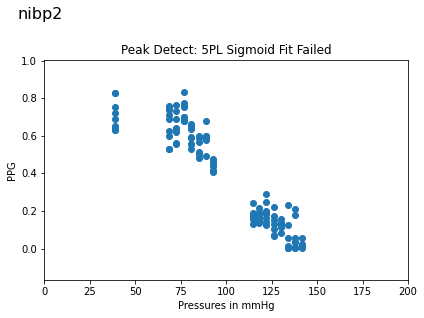

5tttttttttttttttttttttttttttt5
210726CP:
210726CP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.627647  1.285707  0.994774  1.254188  0.006320  0.979065
1    90.398361  1.188076  0.976093  1.177901  0.007085  0.915320
2    94.040749  1.237450  0.979106  1.271843  0.008376  0.953192
3    98.223701  1.099818  0.957322  1.287765  0.007856  0.889702
4   102.264854  1.181791  0.971236  1.416727  0.007238  0.953713
5   106.349892  1.100878  0.951183  1.456890  0.006047  0.936783
6   110.324677  1.058572  0.939395  1.329659  0.005912  0.808786
7   114.451668  1.018340  0.946928  1.161608  0.006751  0.898095
8   129.868301  0.483714  0.861051  0.603287  0.002651  0.704779
9   134.042053  0.481594  0.724905  0.500449  0.003176  0.431127
10  137.880356  0.410132  0.485817  0.341713  0.002062  0.193426
11  141.450058  0.352457  0.243450  0.252240  0.001394  0.056100
12  145.309677  0.189536 -0.109363  0.125802  0.001189 -0.432929
13  149.365143  0.095664 -0.000393  0.06

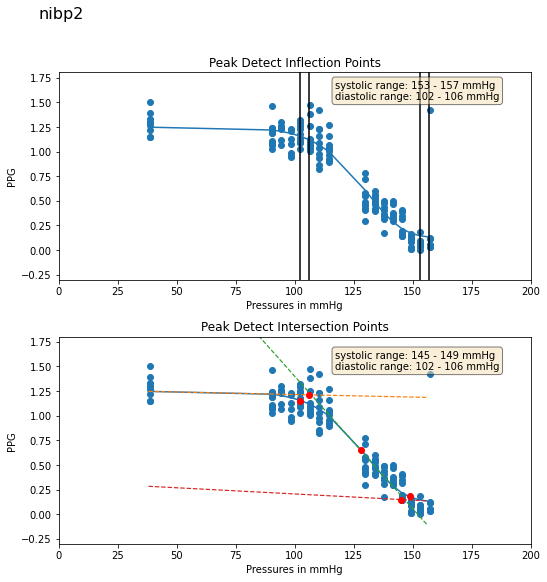

210728AP:
210728AP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.000687  1.274586  0.967336  1.179937  0.011194  0.938818
1    68.310699  1.286538  0.971539  1.209418  0.012939  0.951645
2    72.507179  0.886099  0.976647  0.852146  0.007739  0.955940
3    76.545547  1.230438  0.953222  1.118724  0.012453  0.941971
4    80.451836  1.125146  0.951859  0.996680  0.013498  0.938870
5    84.640640  1.058305  0.934805  0.963728  0.012994  0.881060
6    88.444527  0.947724  0.918839  0.908979  0.012436  0.863398
7    92.517609  0.683299  0.817692  0.695939  0.009518  0.749201
8   108.094849  0.703017  0.549337  0.479945  0.005108  0.451942
9   112.143013  0.348436  0.548677  0.264557  0.002079  0.430354
10  115.481606  0.353212  0.569130  0.238770  0.002550  0.266516
11  119.698097  0.159027  0.443137  0.109243  0.001136  0.190291
12  123.605988  0.141977  0.636088  0.148647  0.001308  0.551516
13  127.722054  0.087764  0.234960  0.042299  0.000395 -0.036563
14  13

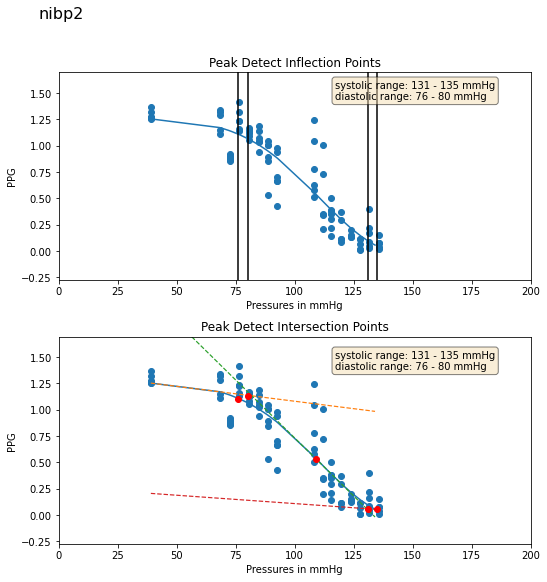

210728BP:
210728BP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.931789  1.044295  0.942746  1.273944  0.004233  0.932716
1    66.878723  0.819330  0.925945  0.970251  0.003849  0.918792
2    74.426628  1.052642  0.952670  1.474685  0.004315  0.894913
3    78.369774  1.059808  0.958796  1.232038  0.004436  0.958796
4    82.580711  1.257259  0.961152  1.490765  0.004715  0.941145
5    98.031227  0.307197  0.895724  0.515050  0.001758  0.863349
6   102.044952  0.463429  0.909185  0.568335  0.001846  0.851077
7   105.988113  0.344874  0.750214  0.415822  0.001584  0.575440
8   109.975037  0.289856  0.605820  0.292990  0.000875  0.246669
9   113.938423  0.237730  0.229277  0.208538  0.000595 -0.086938
10  117.506447  0.046774  0.150735  0.024873  0.000186 -0.531797
11  121.539612  0.099706  0.149480  0.059654  0.000194 -0.488006
12  125.596893  0.001368  0.036777  0.000000  0.000000  0.036777
38.93178939819336
1.0442948
1.2739437651343213
0.004233360290527344
---

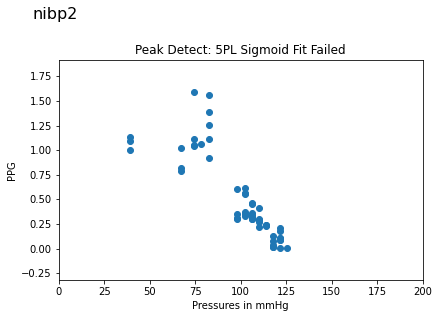

5tttttttttttttttttttttttttttt5
210729AP:
210729AP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.461967  0.683736  0.983723  0.665115  0.002766  0.958253
1    85.998543  0.522519  0.992968  0.583346  0.003808  0.986736
2    89.981544  0.569068  0.989591  0.664530  0.003699  0.975502
3    93.684662  0.538160  0.992448  0.631592  0.005138  0.986092
4    97.758919  0.550775  0.993598  0.625098  0.003399  0.986272
5   101.647957  0.528130  0.981853  0.664090  0.003789  0.969863
6   105.589371  0.440048  0.979337  0.568163  0.005481  0.954343
7   109.549400  0.406754  0.980738  0.525864  0.004104  0.961591
8   131.090820  0.163879  0.856980  0.223230  0.001789  0.701452
9   135.186707  0.218698  0.804732  0.269909  0.001473  0.683731
10  138.598129  0.335241  0.155620  0.228530  0.001621 -0.001782
11  142.715897  0.132285 -0.181844  0.051074  0.000641 -0.859209
12  146.836227  0.079404 -0.312600  0.051635  0.000416 -0.872123
13  150.321442  0.119382  0.243104  0.09

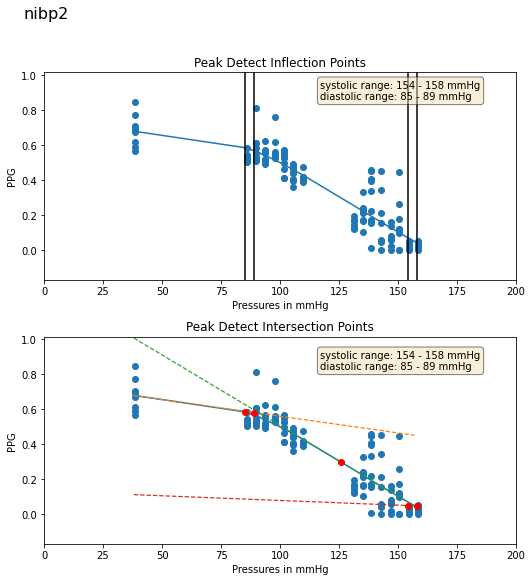

210729BP:
210729BP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.340275  0.928034  0.989812  1.043958  0.004080  0.973309
1    67.091507  1.217710  0.979504  1.147552  0.003556  0.978508
2    69.050240  0.977462  0.991350  1.106815  0.004737  0.980894
3    72.741432  1.152727  0.978173  1.203478  0.004029  0.954063
4    76.822006  0.837512  0.987633  1.008397  0.004600  0.973354
5    80.837181  0.814045  0.982971  1.012900  0.006827  0.966121
6    84.861855  0.999165  0.959429  1.264101  0.004385  0.931914
7    88.791924  0.592679  0.976510  0.775653  0.006109  0.962067
8    93.115913  0.548959  0.965101  0.734314  0.004545  0.950471
9   114.547287  0.210795  0.905142  0.287542  0.001799  0.891784
10  117.688446  0.185170  0.872416  0.247355  0.001341  0.787774
11  122.021805  0.221824  0.251651  0.164512  0.001796  0.040521
12  125.359993  0.227586  0.100100  0.124878  0.001192 -0.211074
13  129.637482  0.075712 -0.041848  0.051046  0.000415 -0.429504
14  13

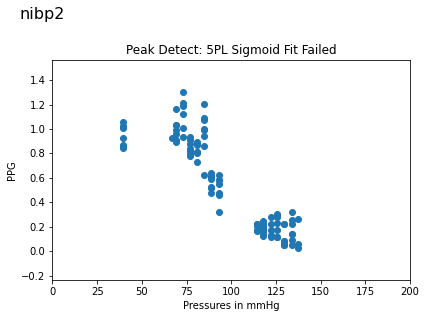

5tttttttttttttttttttttttttttt5
210730AP:
210730AP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.859539  0.953898  0.984795  0.887595  0.003165  0.970255
1    68.782150  0.859396  0.980813  0.989677  0.003337  0.968363
2    72.796257  0.820533  0.977845  1.015093  0.003518  0.963566
3    76.638474  0.879579  0.971657  0.970471  0.003495  0.926404
4    80.731232  0.739177  0.948847  1.027964  0.003920  0.914293
5    84.689285  0.803902  0.934720  0.954258  0.003944  0.835932
6    89.325607  0.650351  0.933242  0.808743  0.002951  0.913416
7    92.998726  0.471291  0.910102  0.616766  0.001768  0.843865
8   114.292374  0.341810  0.615446  0.379320  0.001357  0.486745
9   118.005104  0.337988  0.608590  0.399545  0.001676  0.487520
10  121.970871  0.437112  0.396161  0.429987  0.001950  0.314086
11  125.828766  0.188929 -0.081456  0.046329  0.000206 -0.769460
12  129.867615  0.117297 -0.095696  0.062852  0.000254 -0.836751
13  134.599487  0.086067  0.062302  0.03

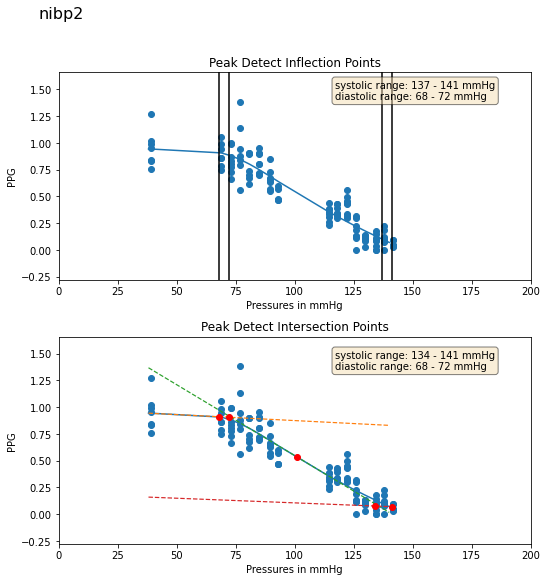

210730BP:
210730BP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.282608  0.623631  0.981480  0.655800  0.014302  0.952684
1    65.160362  0.574217  0.986946  0.614553  0.013515  0.965514
2    69.235794  0.601495  0.992288  0.632101  0.013388  0.984090
3    72.808662  0.615622  0.983199  0.647139  0.012321  0.972649
4    77.036407  0.573372  0.968108  0.611978  0.012523  0.945465
5    81.078011  0.628668  0.960283  0.645078  0.011188  0.945820
6    85.177574  0.575596  0.953915  0.629511  0.008554  0.937100
7    89.055496  0.475658  0.931645  0.493143  0.007417  0.902319
8   104.744705  0.266037  0.577315  0.235663  0.004618  0.241402
9   108.682465  0.071611  0.433729  0.057326  0.001039  0.010441
10  112.732353  0.071770  0.048447  0.032313  0.000446 -0.621950
11  116.225105  0.075728  0.365990  0.045601  0.000655 -0.163415
12  120.376556  0.107723  0.187082  0.062227  0.000570 -0.526945
13  124.288239  0.039904  0.273715  0.019653  0.000201 -0.410357
14  12

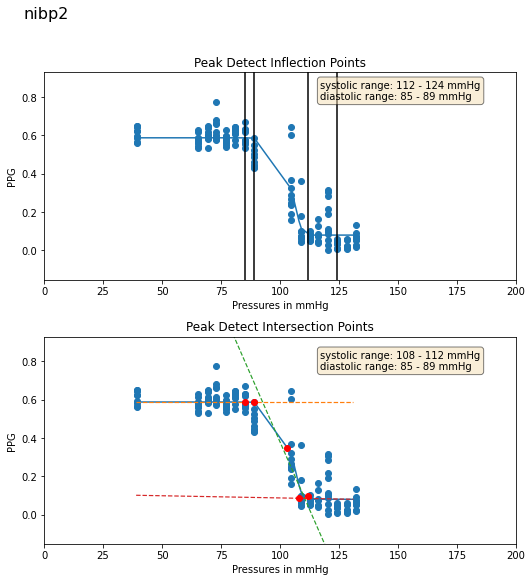

210730CP:
210730CP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.935848  0.424301  0.985109  0.428441  0.009442  0.927606
1    72.599365  0.287491  0.980582  0.300757  0.006972  0.962809
2    76.857742  0.251768  0.955945  0.270043  0.006038  0.774867
3    80.764053  0.263113  0.931389  0.281420  0.006576  0.862841
4    84.682388  0.265852  0.934503  0.285722  0.006024  0.867612
5    89.038651  0.218111  0.911535  0.240408  0.005778  0.721138
6    93.246353  0.199643  0.882365  0.208539  0.005038  0.615071
7    96.764839  0.233618  0.837086  0.233799  0.005244  0.640805
8   110.616394  0.217546  0.369016  0.146893  0.003178  0.285790
9   114.714272  0.208702  0.256086  0.179133  0.003280  0.012034
10  117.956879  0.177420  0.379198  0.122017  0.002049  0.275437
11  122.019646  0.166894  0.174118  0.132174  0.001563 -0.407907
12  125.932045  0.043137 -0.442155  0.016762  0.000319 -0.892603
13  130.003372  0.043326  0.230414  0.016231  0.000169 -0.511815
14  13

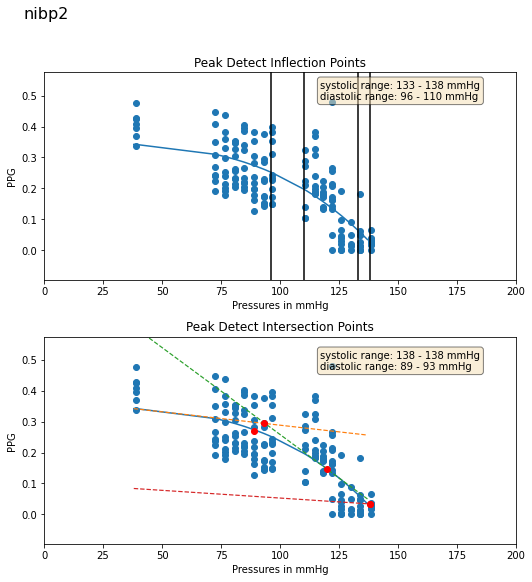

210731AP:
210731AP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.965130  1.534892  0.977415  1.429389  0.006798  0.973792
1    64.686211  1.879070  0.953063  1.726812  0.008038  0.939084
2    68.791550  1.146169  0.974919  1.469558  0.009443  0.960107
3    72.267952  1.590309  0.949752  1.549815  0.005998  0.933372
4    76.470016  1.285935  0.952313  1.228635  0.007571  0.927298
5    80.404549  1.507261  0.942333  1.542688  0.010576  0.918707
6    84.437454  1.080714  0.931846  1.256196  0.012223  0.878629
7    88.356117  1.415062  0.924327  1.506504  0.007370  0.863250
8   109.907669  0.579800  0.768539  0.603988  0.002431  0.726452
9   113.868057  0.250163  0.769655  0.249693  0.001590  0.675661
10  117.398994  0.227452  0.717376  0.255133  0.002194  0.542667
11  121.581200  0.326122  0.453661  0.251764  0.001990  0.334658
12  125.470810  0.141752  0.313510  0.098182  0.000618  0.014174
13  129.459656  0.037018  0.173234  0.034888  0.000289 -0.392720
14  13

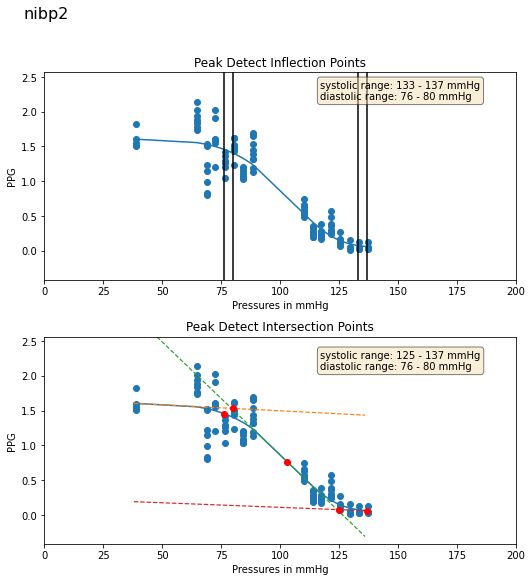

210731BP:
210731BP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.784538  1.053178  0.989697  1.173781  0.009424  0.970964
1    64.941399  0.921662  0.988569  1.001730  0.006453  0.979138
2    68.827049  0.962874  0.985995  1.103768  0.007107  0.961597
3    72.440170  1.031294  0.984327  1.208000  0.008493  0.978332
4    76.586967  0.789477  0.986781  0.915462  0.006678  0.981768
5    80.445366  0.873403  0.970187  1.007398  0.006918  0.940787
6    84.746742  0.825751  0.963873  0.991583  0.007082  0.937304
7    88.901291  0.744522  0.964456  0.907171  0.006658  0.947969
8   114.570549  0.303961  0.883606  0.402410  0.002882  0.752332
9   118.250450  0.267386  0.874893  0.322172  0.002638  0.794275
10  121.995995  0.217589  0.560967  0.188263  0.001626 -0.095391
11  125.892654  0.252187  0.519203  0.138688  0.001052  0.146797
12  130.040359  0.094377  0.389441  0.065865  0.000649  0.071788
13  133.935043  0.059006  0.135998  0.016030  0.000151 -0.509016
14  13

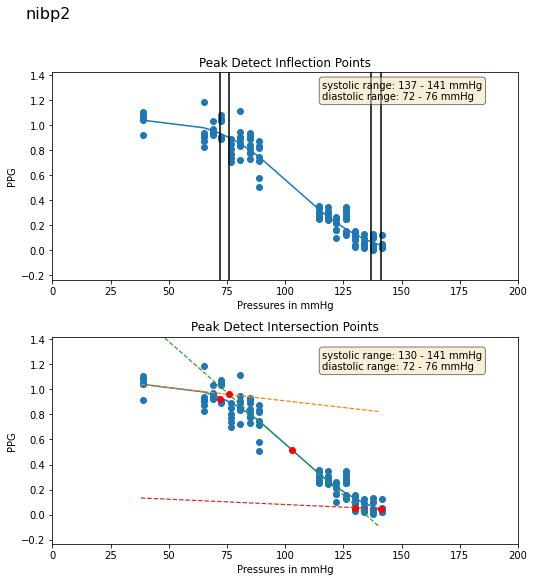

210803AP:
210803AP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.897442  1.195461  0.991782  1.132229  0.030189  0.971458
1    65.662247  1.035540  0.979718  0.951188  0.030578  0.951391
2    69.729439  1.152030  0.976165  1.104463  0.027366  0.949667
3    73.333412  1.126118  0.966956  1.101607  0.027608  0.949925
4    77.388939  1.143757  0.960189  1.096118  0.026617  0.913490
5    81.476082  0.932402  0.928453  0.841303  0.025731  0.869132
6    85.567932  1.014460  0.897787  0.965213  0.026782  0.873053
7    89.673744  0.817135  0.734123  0.775857  0.020171  0.347134
8    99.139694  0.933754  0.469286  0.743508  0.022001  0.316368
9   103.466469  1.100565  0.440919  0.924271  0.024548  0.330125
10  107.140335  0.492502  0.407435  0.454718  0.007932  0.023257
11  111.272369  0.150745  0.277985  0.091678  0.001638 -0.289851
12  115.182533  0.074380 -0.035431  0.030876  0.000984 -0.553248
13  118.823112  0.036937  0.029624  0.013670  0.000383 -0.417692
14  12

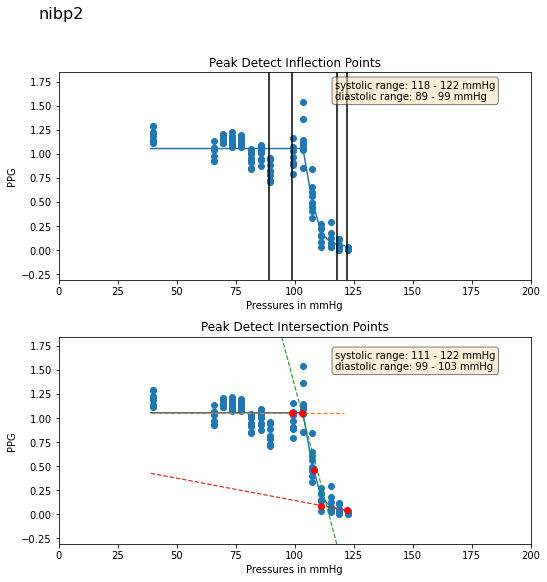

210803BP:
210803BP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.173168  0.172329  0.936695  0.161924  0.008637  0.812236
1    58.914204  0.195391  0.835866  0.156695  0.008034  0.605563
2    63.049442  0.202358  0.870319  0.175716  0.008139  0.723027
3    67.084290  0.176067  0.763903  0.155660  0.007936  0.662100
4    70.652626  0.150877  0.696270  0.133696  0.006963  0.489776
5    74.615181  0.093692  0.722910  0.086119  0.004338  0.297260
6    78.807152  0.059595  0.644380  0.057253  0.002883  0.201775
7    82.820724  0.061101  0.463952  0.058197  0.003157  0.092947
8    86.713127  0.055690  0.241542  0.051235  0.002538 -0.269443
9    90.549934  0.036421 -0.355954  0.019545  0.001076 -0.738184
10   94.281296  0.066732 -0.592768  0.036780  0.002177 -0.929558
11   98.376633  0.035911 -0.720658  0.018099  0.001013 -0.911922
12  102.218422  0.008310  0.211051  0.006498  0.000282 -0.584759
13  106.019936  0.020189 -0.000181  0.003499  0.000200 -0.808749
14  11

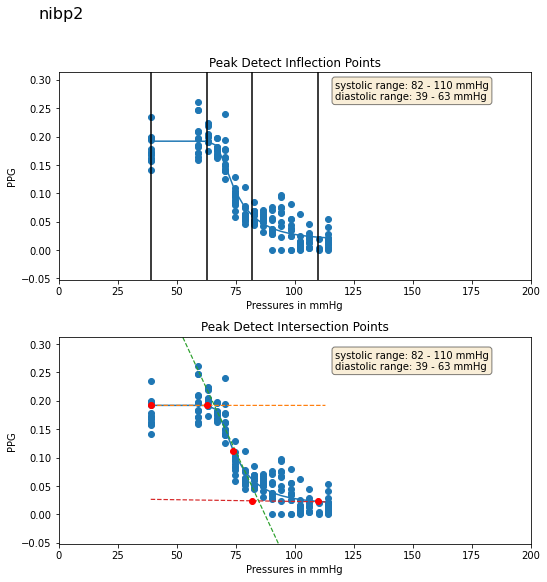

210804AP:
210804AP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.650875  0.658433  0.962283  0.656623  0.005180  0.899037
1    64.517776  1.064893  0.940844  0.997805  0.011587  0.925666
2    68.356857  0.563983  0.954788  0.544598  0.004506  0.864856
3    72.074982  0.988284  0.966341  0.994179  0.012504  0.933006
4    76.153656  0.499692  0.901999  0.461805  0.003020  0.737591
5    80.074417  0.921163  0.890340  0.850451  0.010340  0.749102
6    84.161163  0.625720  0.864747  0.648589  0.009466  0.791145
7    88.094070  0.724104  0.795890  0.756510  0.007653  0.483510
8    99.593246  0.216946 -0.025202  0.138749  0.001932 -0.560766
9   103.499062  0.192055  0.013104  0.134204  0.001699 -0.306796
10  107.739517  0.165373  0.214232  0.138468  0.001584 -0.855485
11  111.596283  0.020636 -0.236387  0.018438  0.000158 -0.580594
12  115.434486  0.054970 -0.137824  0.024731  0.000324 -0.675748
13  119.159294  0.047180 -0.021640  0.015905  0.000193 -0.718844
14  12

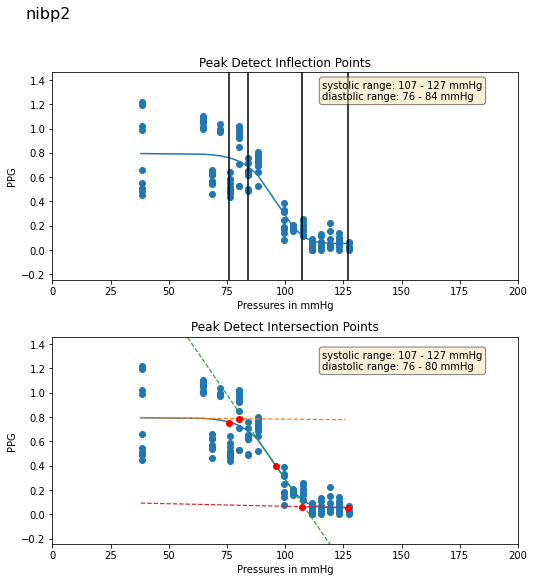

210729CP:
210729CP
           ppi      aucr      corl      ampr   amponly    cormin
0    82.468704  0.731606  0.953657  0.854865  0.002352  0.953657
1    86.743095  0.800653  0.967848  0.955777  0.003071  0.955924
2    90.687706  0.789824  0.943044  0.932184  0.002995  0.913546
3    94.702988  0.720026  0.946926  0.912303  0.003142  0.921845
4    98.614983  0.680402  0.903757  1.018209  0.002642  0.890688
5   102.746857  0.638029  0.897521  0.845791  0.002514  0.861160
6   128.143677  0.179718  0.638449  0.168855  0.000651 -0.002439
7   136.186020  0.119273  0.246933  0.089452  0.000297 -0.205384
8   139.861771  0.114805  0.017098  0.047239  0.000373 -0.538259
9   143.916641  0.179716 -0.444374  0.053766  0.000204 -0.768676
10  147.822876  0.090984 -0.059027  0.032601  0.000206 -0.861434
11  151.867767  0.067453  0.169139  0.050508  0.000212 -0.390820
82.46870422363281
0.73160607
0.8548652629754787
0.0023522377014160156
--------threshold----------
0.73160607
0.6584454596042634


-----b

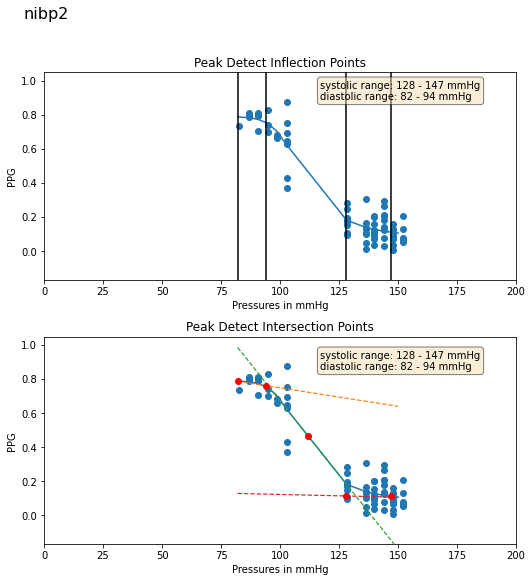

210804BP:
210804BP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.151646  0.867266  0.993946  0.863580  0.009039  0.985075
1    65.052383  0.906909  0.989972  0.941077  0.012249  0.982977
2    69.048988  0.845361  0.985401  0.839678  0.012867  0.976495
3    73.079613  0.806367  0.975721  0.840773  0.012021  0.965598
4    76.770836  0.876106  0.985199  0.903327  0.013099  0.980237
5    80.835266  0.863121  0.984149  0.899585  0.014971  0.979262
6    84.916832  0.778722  0.958722  0.808880  0.007990  0.939726
7    89.040794  0.816641  0.947220  0.857007  0.011048  0.934016
8   100.555656  0.781194  0.929127  0.806449  0.009977  0.893595
9   104.941467  0.632500  0.906448  0.713710  0.007207  0.872156
10  108.715836  0.519852  0.883816  0.613140  0.005227  0.627321
11  112.664047  0.665987  0.468306  0.615830  0.011744  0.219231
12  116.366737  0.593611  0.473417  0.555262  0.009380  0.427374
13  120.149078  0.566114  0.438588  0.549723  0.008888  0.349855
14  12

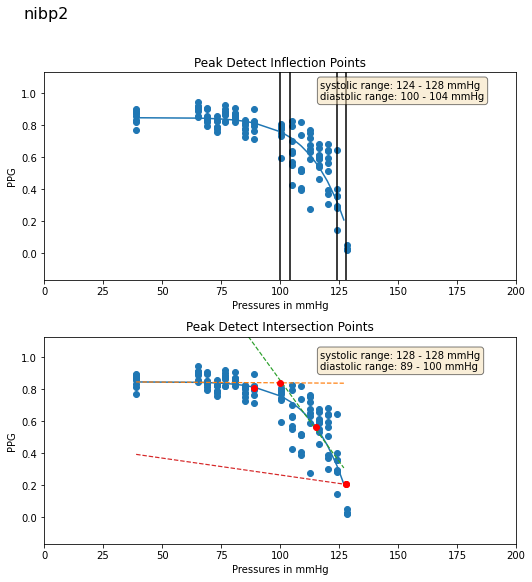

210805AP:
210805AP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.819092  0.815703  0.987098  0.764312  0.008020  0.971303
1    76.477783  0.777431  0.978903  0.738553  0.005497  0.958065
2    80.774384  0.702510  0.962036  0.665544  0.007275  0.924609
3    84.606628  0.951745  0.873327  0.897345  0.005285  0.646364
4    88.755569  0.629391  0.919573  0.597241  0.007212  0.876972
5    92.757309  0.672194  0.874891  0.659797  0.006656  0.687611
6    96.492546  0.603956  0.836252  0.586964  0.006691  0.697136
7   118.351158  0.276236  0.725614  0.250018  0.002545  0.039346
8   122.038223  0.145976  0.449706  0.131132  0.001723  0.046360
9   125.980461  0.132311  0.331857  0.109295  0.001209 -0.431301
10  130.082382  0.187245 -0.142409  0.116997  0.001398 -0.773031
11  133.925949  0.159460 -0.401597  0.064112  0.000797 -0.786329
12  138.019592  0.061368 -0.317106  0.024830  0.000327 -0.867704
13  141.682190  0.045491 -0.133129  0.013647  0.000135 -0.597101
14  14

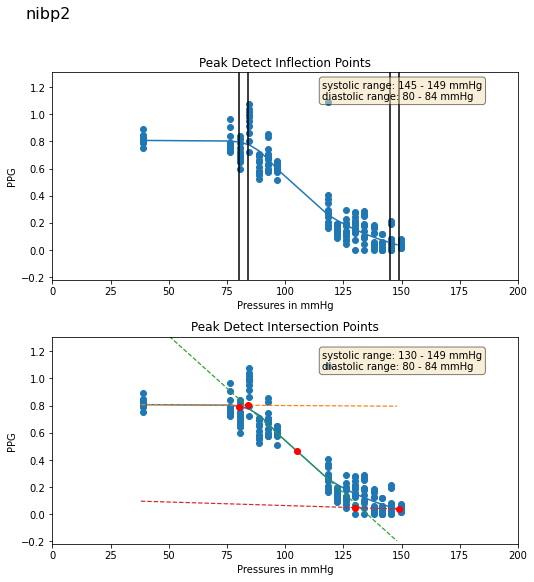

210806AP:
210806AP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.557495  0.991287  0.957463  0.778828  0.005208  0.916318
1    64.350464  0.614514  0.932496  0.551008  0.006389  0.898122
2    68.435226  1.106904  0.847577  0.902168  0.013524  0.816739
3    72.011330  1.168484  0.863750  0.968072  0.014208  0.820116
4    76.210075  1.135507  0.793024  0.975842  0.012314  0.734109
5    80.229401  0.938758  0.804168  0.802196  0.013398  0.763224
6    84.261406  1.224796  0.817408  1.089934  0.013493  0.757860
7    87.971840  0.431113  0.846419  0.403895  0.005639  0.793334
8    97.696030  0.531579  0.736708  0.452941  0.004268  0.658789
9   101.541397  0.154923  0.437480  0.093543  0.001001  0.293873
10  105.628319  0.222812  0.483338  0.142279  0.002218  0.227077
11  109.408546  0.202709  0.322732  0.114263  0.001733  0.203752
12  113.661804  0.063061  0.160758  0.025209  0.000415 -0.266983
13  117.002327  0.040673  0.002563  0.010843  0.000183 -0.457878
14  12

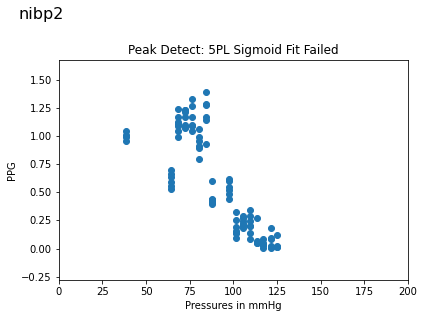

5tttttttttttttttttttttttttttt5
210806BP:
210806BP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.582645  0.478682  0.981589  0.553928  0.004714  0.974641
1    65.702797  0.521301  0.996311  0.536827  0.005790  0.992826
2    69.822495  0.461318  0.994120  0.489133  0.005097  0.983593
3    73.405197  0.455109  0.989867  0.527675  0.005380  0.977730
4    77.831528  0.474736  0.965664  0.512363  0.005872  0.937503
5    81.956497  0.388561  0.951024  0.438778  0.005575  0.924837
6    86.360451  0.305943  0.950643  0.296248  0.004591  0.926607
7    89.693558  0.260975  0.908563  0.287363  0.004518  0.882022
8   103.057106  0.158889  0.754851  0.142423  0.002366  0.690428
9   106.896423  0.110727  0.322205  0.071334  0.001036  0.121966
10  111.037636  0.115119  0.063174  0.065307  0.001120 -0.404103
11  114.936226  0.027077  0.009355  0.014958  0.000256 -0.683850
12  118.461845  0.001041 -0.258470  0.016518  0.000238 -0.804389
13  122.509491  0.039013 -0.115094  0.01

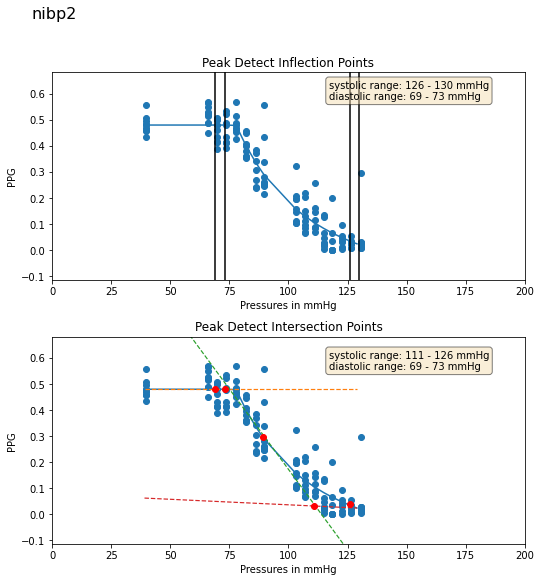

210806CP:
210806CP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.330753  0.823045  0.972957  0.913932  0.009168  0.953046
1    79.091545  0.510182  0.922671  0.587912  0.006274  0.792068
2    83.363571  0.580124  0.945448  0.722824  0.006439  0.911055
3    87.147148  0.611448  0.943691  0.765148  0.005950  0.864743
4    91.418388  0.522800  0.927949  0.689439  0.005327  0.826528
5    95.338509  0.923668  0.926937  0.922672  0.008453  0.857632
6    98.963707  0.456212  0.926711  0.601947  0.005235  0.828581
7   103.192749  0.437263  0.937849  0.536935  0.006037  0.864464
8   124.675926  0.297480  0.707520  0.369348  0.003480  0.616751
9   128.456192  0.407245  0.638364  0.428546  0.003168  0.452619
10  132.509247  0.506791  0.115328  0.326946  0.002704 -0.198831
11  136.617950  0.416536 -0.039626  0.275707  0.002723 -0.198265
12  139.965881  0.325472 -0.042617  0.163819  0.001654 -0.597250
13  144.109787  0.097267 -0.439107  0.051345  0.000486 -0.933197
14  14

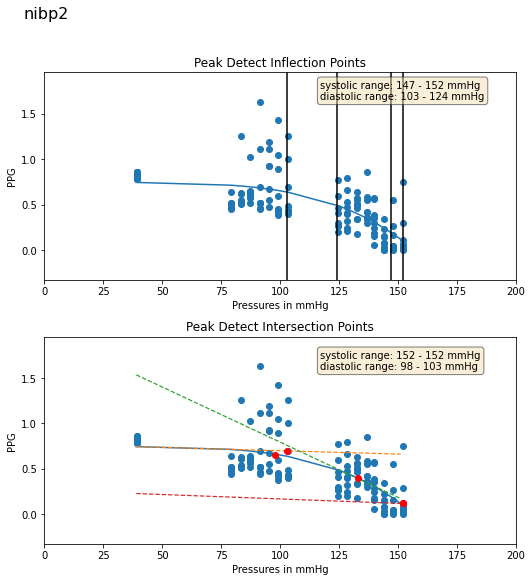

210810AP:
210810AP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.165562  0.864351  0.974545  0.803895  0.008621  0.914569
1    57.099819  0.635106  0.967797  0.633426  0.006760  0.881289
2    61.208279  0.796690  0.980455  0.788244  0.009304  0.959323
3    65.527000  0.673467  0.963576  0.743273  0.008746  0.883908
4    69.384377  0.597647  0.956097  0.551886  0.007013  0.825248
5    72.868073  0.571567  0.946295  0.540881  0.006249  0.895980
6    77.116325  0.692655  0.939829  0.819503  0.010427  0.873903
7    80.910973  0.592920  0.923253  0.579689  0.006739  0.866086
8    91.341759  0.491355  0.780238  0.461936  0.005558  0.667716
9    94.913025  0.531566  0.477787  0.570028  0.006780  0.280791
10   98.662117  0.646603  0.138760  0.427489  0.004926 -0.184583
11  102.825592  0.405639  0.120747  0.289837  0.002884 -0.351685
12  106.791092  0.242770 -0.178425  0.026465  0.000291 -0.894562
13  110.854828  0.133154  0.066655  0.015474  0.000188 -0.922135
14  11

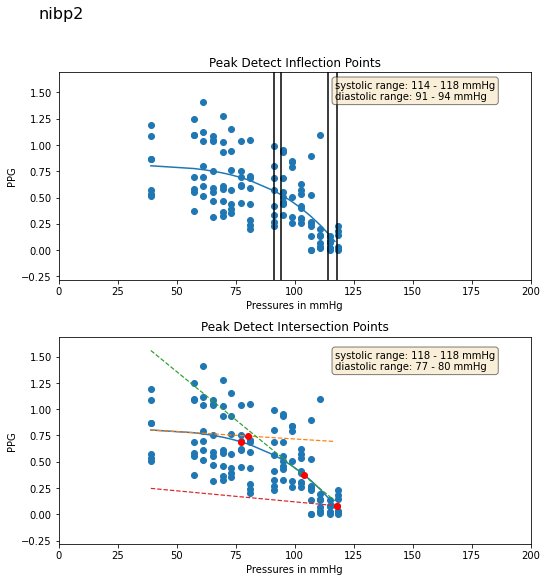

210810BP:
210810BP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.881584  0.856104  0.985473  0.822933  0.017098  0.969664
1    75.178741  0.734246  0.963331  0.781325  0.014409  0.939827
2    78.852432  0.792136  0.975866  0.849287  0.018568  0.955091
3    82.985176  0.757646  0.956775  0.849186  0.017975  0.924504
4    87.321281  0.807689  0.948721  0.905482  0.018606  0.929928
5    91.563667  0.673958  0.906265  0.799707  0.016421  0.871628
6    95.131828  0.671648  0.877320  0.831028  0.017274  0.835892
7    99.316269  0.685548  0.894442  0.866165  0.017172  0.846489
8   120.814972  0.323517  0.740586  0.419573  0.008196  0.676210
9   125.171471  0.283200  0.682638  0.380325  0.006725  0.615327
10  128.704849  0.121340  0.187472  0.111241  0.002348 -0.040213
11  132.633743  0.223634  0.212002  0.228957  0.004981 -0.374262
12  136.290787  0.256507 -0.343899  0.181799  0.004032 -0.861696
13  139.925797  0.089539 -0.182484  0.019118  0.000444 -0.795469
14  14

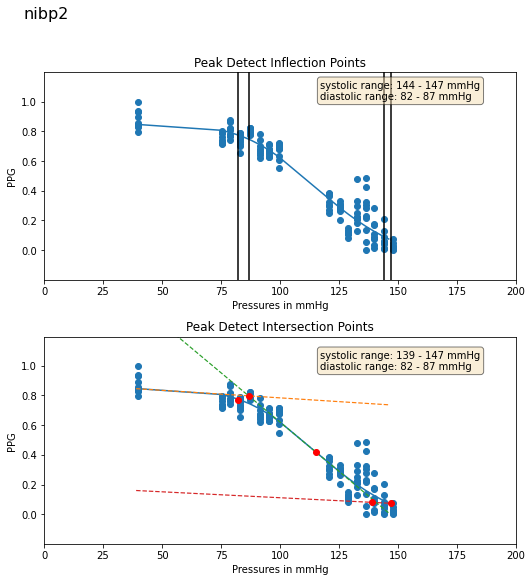

210807AP:
210807AP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.503555  0.491172  0.972129  0.509903  0.004046  0.949658
1    74.704872  0.341531  0.980898  0.351456  0.003796  0.931832
2    78.921082  0.371033  0.987044  0.376763  0.003642  0.971502
3    82.642494  0.375187  0.936250  0.347886  0.002901  0.803357
4    86.872429  0.421380  0.962411  0.409329  0.003395  0.920027
5    90.850227  0.397159  0.953486  0.404539  0.003780  0.806046
6    94.697380  0.324515  0.937312  0.310536  0.003313  0.895033
7    98.849594  0.302643  0.867861  0.291855  0.002956  0.732930
8   110.858231  0.212272  0.800764  0.218485  0.001685  0.210877
9   114.889671  0.204137  0.276778  0.163450  0.000625 -0.700873
10  118.566284  0.207914  0.302716  0.122607  0.001281 -0.150583
11  122.391495  0.139173 -0.179809  0.090287  0.001106 -0.812563
12  126.288910  0.056496 -0.256491  0.033676  0.000440 -0.841909
13  130.433502  0.202844  0.319893  0.120236  0.000837 -0.589775
14  13

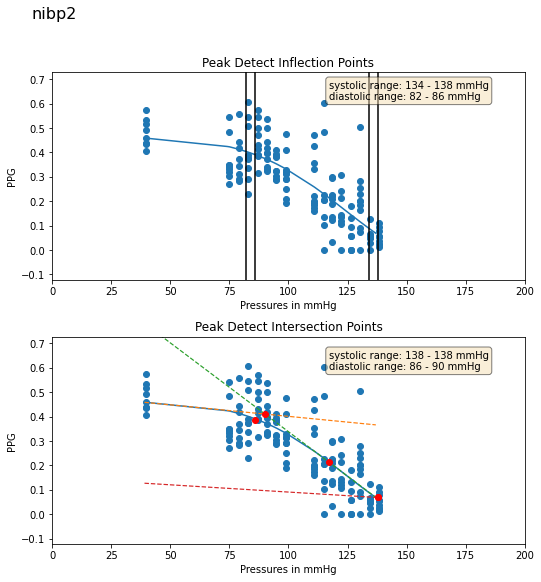

210810CP:
210810CP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.087124  0.657484  0.926647  0.593807  0.004443  0.890398
1    69.086586  0.893626  0.896301  0.835490  0.008168  0.851320
2    72.591446  0.764467  0.880696  0.661672  0.006060  0.844495
3    76.521805  0.537090  0.908246  0.524465  0.004413  0.875012
4    80.736557  0.793407  0.816533  0.709680  0.006688  0.753186
5    84.599289  0.486968  0.866701  0.451336  0.002693  0.816828
6    88.606171  0.479523  0.798049  0.434648  0.003709  0.730765
7   104.244743  0.416719  0.708668  0.389784  0.002615  0.576683
8   108.339043  0.271674  0.506945  0.245505  0.001796  0.389587
9   112.478363  0.299468  0.032458  0.243629  0.001992 -0.087194
10  116.012215  0.391388 -0.146185  0.220173  0.001793 -0.705771
11  119.946426  0.127295 -0.247488  0.091680  0.000662 -0.815842
12  124.225235  0.127123  0.061709  0.082916  0.000525 -0.541804
13  128.208847  0.058720 -0.206334  0.025493  0.000190 -0.606782
14  13

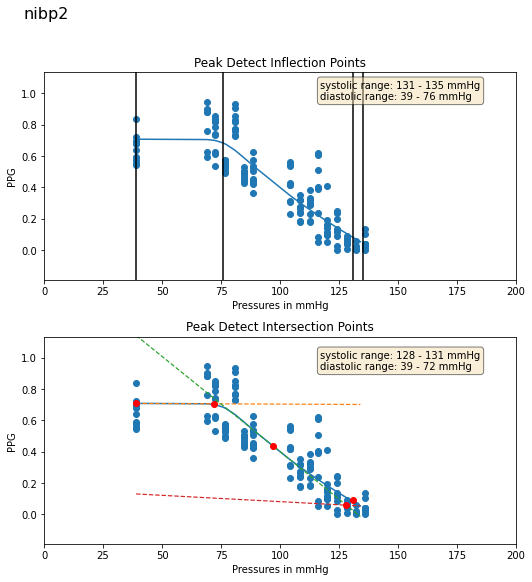

210811AP:
210811AP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.890377  0.802805  0.947458  0.798275  0.009778  0.932737
1    62.768406  0.702742  0.919452  0.718771  0.009703  0.779992
2    64.720695  0.719046  0.840277  0.727553  0.009635  0.629891
3    68.578911  0.704009  0.875005  0.658730  0.008258  0.822571
4    72.364876  0.684122  0.896152  0.667536  0.005589  0.875926
5    76.311035  0.681071  0.843699  0.645835  0.007532  0.736939
6    80.142113  0.591495  0.856990  0.587779  0.008961  0.697639
7    84.355232  0.546415  0.843306  0.558293  0.006534  0.716156
8   105.766640  0.155937  0.423904  0.171245  0.002201  0.135612
9   109.988358  0.088257  0.001409  0.066025  0.000926 -0.223560
10  113.859665  0.082920 -0.741904  0.045930  0.000633 -0.957337
11  117.529205  0.037564 -0.465537  0.014508  0.000215 -0.897334
12  121.597733  0.012449  0.129500  0.013652  0.000203 -0.273803
13  125.506615  0.025120  0.062673  0.011755  0.000166 -0.758682
14  12

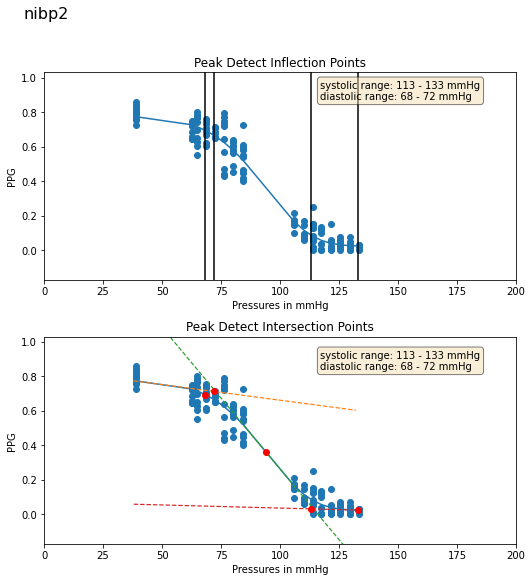

210811CP:
210811CP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.638283  1.498335  0.977741  1.412665  0.006798  0.954852
1    64.531624  0.824125  0.970537  0.754864  0.005469  0.949412
2    68.473518  1.130434  0.961015  1.059597  0.006227  0.848471
3    72.147484  1.066469  0.928914  1.108214  0.006894  0.860747
4    76.058731  1.396460  0.926756  1.396824  0.006303  0.785138
5    84.030571  0.797169  0.878897  0.670298  0.004437  0.812659
6    87.980202  0.789624  0.860667  0.766603  0.004676  0.750003
7    92.077728  0.575028  0.840126  0.562067  0.003773  0.768416
8    95.743912  0.417328  0.638827  0.345364  0.002257 -0.106415
9    99.781502  0.276140  0.450173  0.205096  0.001259 -0.077002
10  103.697456  0.338964 -0.177516  0.203421  0.001229 -0.668960
11  107.792252  0.176639 -0.644712  0.096434  0.000609 -0.892089
12  111.919121  0.068355 -0.461192  0.022204  0.000144 -0.872222
13  115.367729  0.025465 -0.217503  0.036770  0.000239 -0.889330
14  11

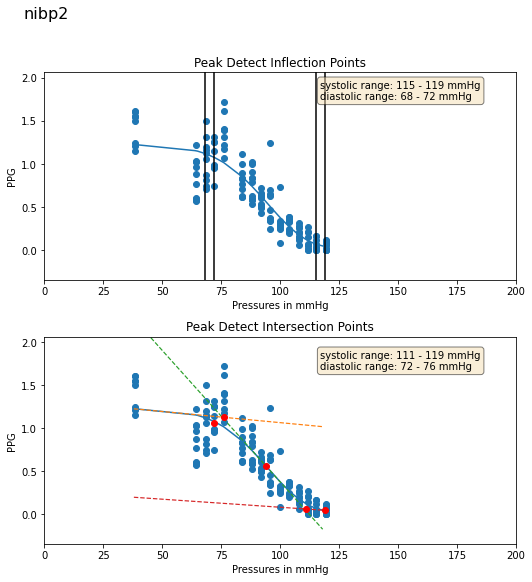

210812AP:
210812AP
           ppi      aucr      corl      ampr   amponly    cormin
0    38.907345  0.683556  0.956626  0.761850  0.010153  0.948805
1    78.355385  0.779691  0.955785  0.845853  0.009836  0.910817
2    82.366425  0.633678  0.974888  0.805175  0.009197  0.958140
3    86.333405  0.683566  0.989215  0.775040  0.010145  0.972177
4    90.361748  0.639739  0.968460  0.804713  0.007281  0.959807
5    94.063049  0.355151  0.902222  0.486695  0.004078  0.864452
6    97.958344  0.413859  0.931409  0.531584  0.005588  0.907319
7   101.878822  0.422310  0.906176  0.604510  0.003486  0.868999
8   108.090042  0.349354  0.854785  0.464607  0.003375  0.803541
9   112.007278  0.281852  0.508891  0.313154  0.002302  0.398568
10  115.487297  0.049723  0.273847  0.021858  0.000214 -0.429781
11  119.492714  0.041004  0.250561  0.025583  0.000324 -0.127314
12  123.671066  0.043918  0.033312  0.029062  0.000228 -0.464073
13  127.674927  0.027828 -0.015871  0.013166  0.000146 -0.778964
14  13

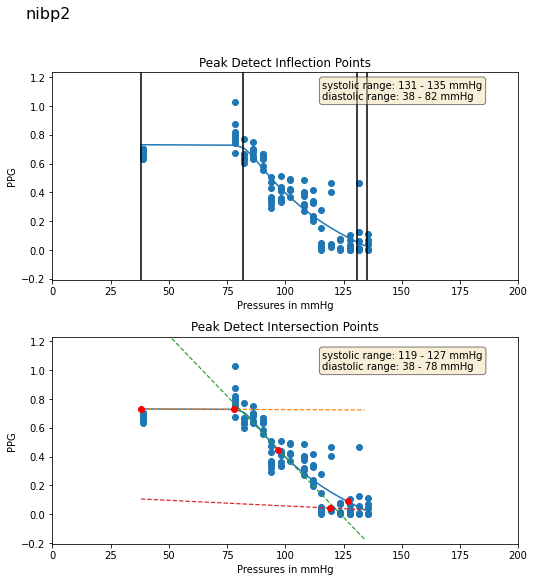

210717BP:
210717BP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.062466  0.849720  0.943634  0.742366  0.007101  0.879595
1    62.797478  0.792473  0.952651  0.784264  0.008299  0.915668
2    66.883942  0.872879  0.918165  0.782268  0.009147  0.865866
3    70.753334  0.925434  0.948896  0.914771  0.008055  0.935267
4    74.559296  0.571460  0.959064  0.578038  0.004746  0.940500
5    78.601761  0.688705  0.915237  0.712181  0.005587  0.804837
6    83.025299  0.607886  0.917834  0.622841  0.004670  0.887597
7    86.671196  0.505467  0.941678  0.550489  0.003568  0.906301
8   108.167030  0.238654  0.831860  0.243265  0.001717  0.741705
9   112.122627  0.188666  0.709741  0.161138  0.001122  0.558277
10  115.564781  0.163112  0.720826  0.177257  0.001584  0.379363
11  119.574799  0.117915 -0.174924  0.059581  0.000598 -0.519925
12  123.502449  0.081571  0.236700  0.060010  0.000419 -0.005603
13  127.587494  0.038541 -0.107320  0.026266  0.000244 -0.619138
14  13

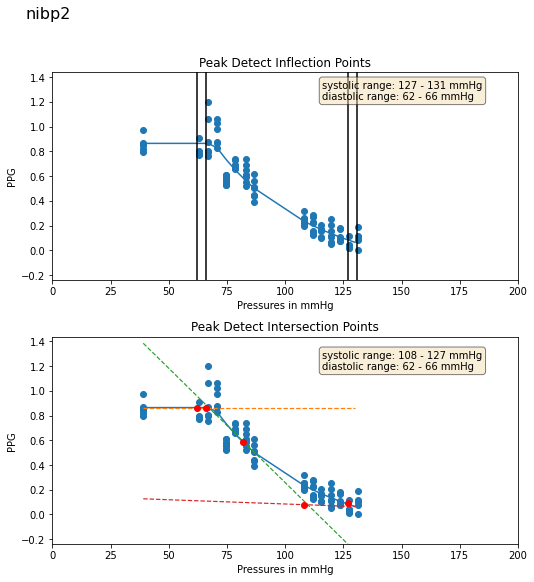

210716BP:
210716BP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.074558  0.930689  0.989487  1.034933  0.003713  0.942853
1    63.042835  0.915303  0.984261  0.955193  0.005763  0.954359
2    66.788177  1.048283  0.987333  1.090645  0.005685  0.973788
3    70.357338  0.976816  0.980174  1.072759  0.005209  0.963611
4    74.508865  0.822275  0.978805  0.961441  0.004574  0.957475
5    78.669525  0.777950  0.973888  0.943203  0.004759  0.964605
6    82.948219  0.708108  0.946301  0.875041  0.004177  0.916363
7    86.655441  0.638886  0.930943  0.837616  0.003489  0.870286
8    98.067284  0.482323  0.803067  0.609618  0.002304  0.302253
9   102.206528  0.254331  0.703000  0.334359  0.001476  0.514937
10  106.376640  0.189347  0.694543  0.249990  0.000955  0.491892
11  110.250153  0.159755 -0.327121  0.095112  0.000442 -0.828730
12  114.166466  0.037794 -0.217144  0.036699  0.000198 -0.928538
13  117.835541  0.079073 -0.152288  0.061002  0.000219 -0.597596
14  12

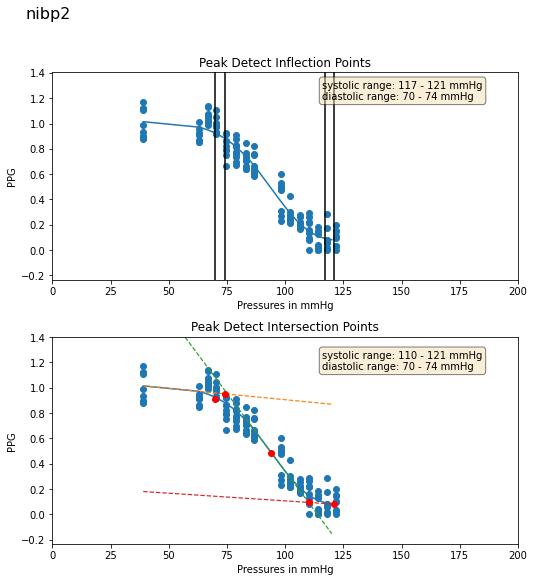

210819BP:
210819BP
           ppi      aucr      corl      ampr   amponly    cormin
0    39.841873  0.628284  0.987289  0.645386  0.006236  0.980196
1    55.357849  0.657387  0.974928  0.695718  0.007670  0.968369
2    59.775608  0.940836  0.936957  0.903676  0.003963  0.905036
3    63.709194  0.832422  0.941710  0.840358  0.004549  0.918206
4    68.207619  0.697688  0.926911  0.698018  0.005048  0.837897
5    71.437454  0.969563  0.834434  0.945459  0.003626  0.776264
6    75.581879  0.602694  0.831970  0.569929  0.003797  0.744056
7    79.868660  0.533117  0.872277  0.503288  0.003103  0.804508
8    89.489136  0.282620  0.704147  0.226517  0.001810  0.355651
9    93.724945  0.178518  0.299171  0.148408  0.000947 -0.231412
10   97.248726  0.282854  0.025857  0.145984  0.001306 -0.361212
11  101.130096  0.166402  0.042971  0.112193  0.000513 -0.750900
12  104.927658  0.099173 -0.005622  0.035638  0.000237 -0.805461
13  109.258507  0.078568 -0.073817  0.045109  0.000357 -0.650763
14  11

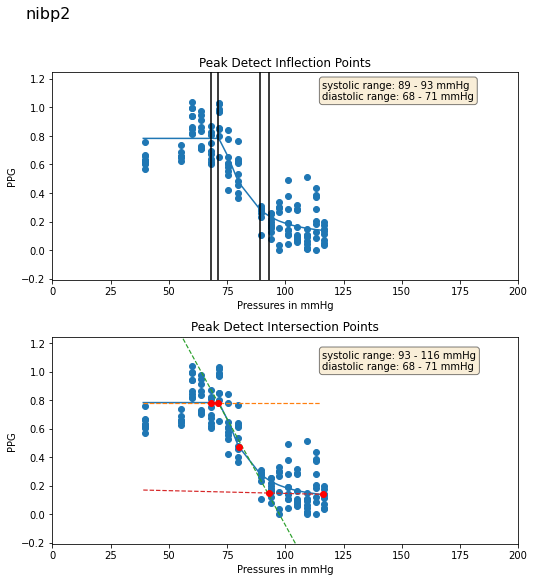

In [ ]:
patients=[]
lsys=[]
na=[]
d0=[]
d1=[]
d2=[]
d3=[]
d4=[]
d5=[]
d6=[]
d7=[]
d08=[]
d8=[]
d9=[]
d10=[]
d11=[]
d12=[]
d13=[]
d14=[]
d015=[]
d15=[]
d16=[]
d17=[]
d18=[]
d19=[]
d20=[]
d21=[]
d22=[]
folder = '/content/drive/MyDrive/data40/sphygmo/'
for patient in [x for x in os.listdir(folder)if x.find('P')!=-1]:
# for patient in ['210717BP']:
  nibp = NIBPProcessor(folder+patient+'/nibp2.txt')
  nibp.save_peak_locations()
  nibp.detect_plateaus()
  print(f'{patient}:')
  ita1, sys1 = nibp.compute_ita()
  # print(f'{patient}: {sys1}')
  patients.append(patient)
  lsys.append(sys1)
  nibp.fitting(folder+patient+'/nibp2.txt',patient)

rangedf = pd.DataFrame()  
dia_fin = pd.DataFrame()  
dia_fin['patient']=na
dia_fin['d0']=d0
dia_fin['d1']=d1
dia_fin['d2']=d2
dia_fin['d3']=d3
dia_fin['d4']=d4
dia_fin['d5']=d5
dia_fin['d6']=d6
dia_fin['d7']=d7
dia_fin['d08']=d08
dia_fin['d8']=d8
dia_fin['d9']=d9
dia_fin['d10']=d10
dia_fin['d11']=d11
dia_fin['d12']=d12
dia_fin['d13']=d13
dia_fin['d14']=d14
dia_fin['d015']=d015
dia_fin['d15']=d15
dia_fin['d16']=d16
dia_fin['d17']=d17
dia_fin['d18']=d18
dia_fin['d19']=d19
dia_fin['d20']=d20
dia_fin['d21']=d21
# dia_fin['d22updated']=d22
save_df(dia_fin, 'diastolica2.csv')
# rangedf['Low_sys']=lsys


In [ ]:
save_df(dia_fin, 'diastolica2.csv')

In [ ]:
class NIBPProcessor(object):
  def __init__(self, filepath=''):
    time, ch1, ch2, ch3= np.loadtxt(filepath, dtype=('f4, f4, f4, f4'),unpack=True,delimiter = '\t')
    ip = pd.DataFrame()
    ip['time'] = time
    ip['ref_ppg'] = ch2 + 4
    ip['occ_ppg'] = ch3 + 4
    ip['pressure'] = ch1
    self.ip = ip
    self.op=0

  
  
  def save_peak_locations(self):
    self.ip['ref_peaks'],ref_wid, inxref,inx1ref = peak_and_valley_detect(self.ip['ref_ppg'])
    self.ip['occ_peaks'],occ_wid, inxocc, inx1occ = peak_and_valley_detect(self.ip['occ_ppg'], prominence=0.00005)

    self.ip['std']= self.ip['occ_ppg'].rolling(2000).std()
    self.ip['stdr']= self.ip['ref_ppg'].rolling(2000).std()
    self.ip['occ1d'] = np.gradient(self.ip['occ_ppg'].values,100)
    self.ip['occ1d_peaks'] = peak_detect(self.ip['occ1d'])
    self.ip['ref1d'] = np.gradient(self.ip['ref_ppg'].values)
    self.ip['ref1d_peaks'] = peak_detect(self.ip['ref1d'])

  def detect_plateaus(self):
    plateau_width = 3000
    # Making a list of plateaus
    hts = np.linspace(0.0001, 1, 100)
    peaks, _ = find_peaks(self.ip['pressure'], width=plateau_width)

    plateaus = []
    for peak in peaks:
      for ht in hts:
        width, height, left, right = peak_widths(self.ip['pressure'], np.array([peak]), rel_height=ht)
        if width > plateau_width:
          break
      plateaus.append(self.ip.loc[left[0]:right[0]])
    # Finding mean pressure for each plateau
    mean_pressures = []
    mean_occppg=[]
    mean_refppg=[]
    for plateau in plateaus:
      # plateau.drop(plateau.head(1000).index, inplace=True) 
      # plateau.drop(plateau.tail(500).index, inplace=True)
      mean_pressures.extend([plateau['pressure'].mean()] * len(plateau))
      mean_occppg.extend([plateau[plateau['occ_peaks']>0]['occ_peaks'].median()] * len(plateau))
      mean_refppg.extend([plateau[plateau['ref_peaks']>0]['ref_peaks'].median()] * len(plateau))

    self.ip = pd.concat(plateaus)
    self.ip['mean_pressure'] = mean_pressures
    self.ip['mean_occppg'] = mean_occppg
    self.ip['mean_refppg'] = mean_refppg
    self.ip = self.ip[np.invert(self.ip.index.duplicated())]
    return plateaus
  


  def separate_into_cycles(self, ppg='ref', separate_by_peak=True):
    detected_plateaus = self.ip['mean_pressure'].reindex(self.ip.index, fill_value=0).values

    # Making a list of occ ppg cycles
    cycles = []
    peaks = (self.ip[self.ip[f'{ppg}_peaks'] > 0].index).tolist()
    valleys = (self.ip[self.ip[f'{ppg}_peaks'] < 0].index).tolist()

    separator = peaks if separate_by_peak else valleys
    not_separator = valleys if separate_by_peak else peaks
    for i in range(1, len(separator)):
      # if (not_separator[i]>separator[i-1])&(not_separator[i]<separator[i]):
      cycles.append(self.ip.loc[separator[i - 1]:separator[i]])
    # to check if there are cycles with no valleys in between in ref arm, such cycles are ignored.
    cycles = [cycle for cycle in cycles if len(np.where((not_separator>cycle.index[0])&(not_separator<cycle.index[-1]))[0]) != 0]
    begin = self.ip.loc[:separator[0]]
    return cycles



  def separate_into_occcycles(self):
    detected_plateaus = self.ip['mean_pressure'].reindex(self.ip.index, fill_value=0).values

    # Making a list of occ ppg cycles
    cycles = []
    peaks = (self.ip[self.ip['occ_peaks'] > 0].index).tolist()
    for i in range(1, len(peaks)):
      cycles.append(self.ip.loc[peaks[i - 1]:peaks[i]])
    # to check if there are cycles with no valleys in between in ref arm, such cycles are ignored.
    cycles = [cycle for cycle in cycles if len(cycle[(cycle['occ_peaks'] < 0)]) != 0]
    begin = self.ip.loc[:peaks[0]]
    return cycles
    
  

  def separate_into_refcycles(self):

    detected_plateaus = self.ip['mean_pressure'].reindex(self.ip.index, fill_value=0).values

    # Making a list of ref ppg cycles
    cycles = []
    valleys = (self.ip[self.ip['ref_peaks'] < 0].index).tolist()
    for i in range(1, len(valleys)):
      cycles.append(self.ip.loc[valleys[i - 1]:valleys[i]])
    # to check if there are cycles with no peaks in between in ref arm, such cycles are ignored.
    cycles = [cycle for cycle in cycles if len(cycle[(cycle['ref_peaks'] > 0)]) != 0]
    begin = self.ip.loc[:valleys[0]]
    return cycles

    

  def compute_ita(self):
    ita=[]
    cycle_pressure=[]
    cycles = self.separate_into_occcycles()
    for i,cycle in enumerate(cycles):
      if (cycle ['mean_pressure'].values[0] == cycle['mean_pressure'].values).all():
        tt1=cycle[cycle['occ_peaks']>0]['time'].values[0]
        pp1=cycle[cycle['occ_peaks']>0]['occ_peaks'].values[0]

        tt2=cycle[cycle['occ_peaks']<0]['time'].values[0]
        pp2=cycle[cycle['occ_peaks']<0]['occ_peaks'].values[0]

        tt3=cycle[cycle['occ_peaks']>0]['time'].values[-1]
        pp3=cycle[cycle['occ_peaks']>0]['occ_peaks'].values[-1]

        cycle_pressure.append(cycle['mean_pressure'].values[0])

        tt4=tt2-tt1
        tt5=tt3-tt2
        ita_cycle=(0.5*( (pp1*tt5) + (pp3*tt4)))
        ita.append(ita_cycle)

    itapd = pd.DataFrame()
    itapd['ita']=ita
    itapd['pressure']=cycle_pressure
    threshold = itapd['ita'].max()/50

    if len(itapd[itapd['ita']<threshold])!=0:
      first_zero = itapd[itapd['ita']<threshold]['pressure'].min()
    else:
      first_zero = itapd[itapd['ita']==(itapd['ita'].min())]['pressure'].min()
    return itapd, first_zero

  def fit_sigmoid(self, data, x, y):
    (a, b, c, d, e), _ = curve_fit(sigmoid_5pl, data[x], data[y], maxfev=5000)
    
    data['fit'] = sigmoid_5pl(data[x], a, b, c, d, e)
    # save_df(self.op, '_profile_pd.csv')

    fit = pd.DataFrame()
    fit['x'] = list(range(int(data[x].min()), int(data[x].max())))
    fit['y'] = np.interp(fit['x'], data[x], data['fit'])
    order = (fit['x'].max() - fit['x'].min()) / 10
    fit['d1'] = np.gradient(gaussian_filter1d(fit['y'], order))
    fit['d2'] = np.gradient(fit['d1'])
    return fit

  def fitting(self,input_file=''):
    amplitude = []
    cycle_pressure = []
    plateau_pressure = []
    ref_amplitude = []

    stdev = []
    auc = []
    occ1d = []
    delay = []
    ref_auc = []
    vol = []
    ref_vol = []
    full_auc = []
    corr=[]
    auc_r=[]
    list_pres=[]
    list_ratio=[]
    cycles = self.separate_into_refcycles()
    # added 24th
    diast=0
    upd=0
    upd1=0
    diamax=0
    for i in range(len(cycles)):
      if (cycles[i]['mean_pressure'].values[0] == cycles[i]['mean_pressure'].values).all():
        stdev.append(cycles[i]['std'].values[0])
        c,v=scipy.stats.pearsonr(cycles[i]['ref_ppg'], cycles[i]['occ_ppg'])
        corr.append (c )
        ref_amplitude.append(
          cycles[i][(cycles[i]['ref_peaks'] >0)]['ref_peaks'].values[0])
        ri=(cycles[i][(cycles[i]['ref_peaks'] >0)]['ref_peaks'].values[0])
        plateau_pressure.append(cycles[i]['mean_pressure'].values[0])
        ppi=(cycles[i]['mean_pressure'].values[0])
        cycle_pressure.append(cycles[i]['pressure'].mean())
        max = cycles[i]['occ_ppg'].values.max()
        maxref = cycles[i]['ref_ppg'].values.max()
        min = cycles[i]['occ_ppg'].values.min()
        minref = cycles[i]['ref_ppg'].values.min()
        delay_samples = abs(cycles[i][cycles[i]['ref_ppg']==maxref].index[0] - cycles[i][cycles[i]['occ_ppg']==max].index[0])
        # dich_inx = cycles[i][cycles[i]['ref1d_peaks']>0].index[-1]+delay_samples
        ref_inx = np.sort(np.array([cycles[i][cycles[i]['ref_ppg']==maxref].index[0],cycles[i][cycles[i]['ref_ppg']==minref].index[0]]))
        occ_inx = np.sort(np.array([cycles[i][cycles[i]['occ_ppg']==max].index[0],cycles[i][cycles[i]['occ_ppg']==min].index[0]]))
        amplitude.append(max - cycles[i]['occ_ppg'].min())
        ai=(max - cycles[i]['occ_ppg'].max())
        delay.append(delay_samples)
        occ1d.append(cycles[i]['occ1d'].max())
        auc.append((cycles[i].loc[:cycles[i][cycles[i]['occ_ppg']==max].index[0]]['occ_ppg'].values - cycles[i]['occ_ppg'].min()).sum())
        auci=((cycles[i].loc[:cycles[i][cycles[i]['occ_ppg']==max].index[0]]['occ_ppg'].values - cycles[i]['occ_ppg'].min()).sum())

        full_auc.append((cycles[i]['occ_ppg'].values - cycles[i]['occ_ppg'].min()).sum())
        ref_auc.append((cycles[i].loc[:cycles[i][cycles[i]['ref_ppg']==maxref].index[0]]['ref_ppg'].values - cycles[i]['ref_ppg'].min()).sum())
        refi=((cycles[i].loc[:cycles[i][cycles[i]['ref_ppg']==maxref].index[0]]['ref_ppg'].values - cycles[i]['ref_ppg'].min()).sum())
        vol.append((cycles[i].loc[occ_inx[0]:occ_inx[1]]['occ_ppg'].values - min).sum())
        ref_vol.append((cycles[i].loc[ref_inx[0]:ref_inx[1]]['ref_ppg'].values - minref).sum())
        auc_r=(np.divide(auci,refi))
        amp_r=(np.divide(ai,ri))
        if(c>=0.95):
          # print(ppi, auc_r)
          list_pres.append(ppi)
          list_ratio.append(auc_r)

    
        # if len(cycles[i][(cycles[i]['occ_peaks'] >0)]) != 0:
        #   amplitude.append(
        #     cycles[i][(cycles[i]['occ_peaks'] >0)]['occ_peaks'].values[0])
        # else:
        #   amplitude.append(0)

    # Putting the output variables in anot
    op = pd.DataFrame()
    op['plateau_pressure'] = plateau_pressure
    op['amplitude'] = amplitude
    op['cycle_pressure'] = cycle_pressure
    op['ref_amplitude'] = ref_amplitude
    op['ratio'] = np.divide(np.array(amplitude), np.array(ref_amplitude))


    op['stdev'] = stdev
    op['auc'] = auc
    op['occ1d'] = occ1d
    op['delay'] = delay
    op['ref_auc'] = ref_auc
    op['vol'] = vol
    op['ref_vol'] = ref_vol
    op['full_auc'] = full_auc
    op['occ_radius'] = np.sqrt(np.divide(op['auc'].values, np.ones(len(op))*np.pi))
    op['ref_radius'] = np.sqrt(np.divide(op['ref_auc'].values, np.ones(len(op))*np.pi))
    op['auc_ratio'] = np.divide(op['auc'].values, op['ref_auc'])
    op['corr']=corr

    op_new = pd.DataFrame()
    op_new['ppi']= list_pres
    op_new['aucr']=list_ratio

    # Removing outliers (helps fitting)
    op = op[(np.abs(stats.zscore(op)) < 2).all(axis=1)]
    op = op.sort_values('plateau_pressure')
    self.op=op

    threshold = np.max(op.groupby('plateau_pressure').max()['auc_ratio'].values)
    # bins = 4
    # threshold= np.quantile(op['corr'],(bins-1)/bins)
    # sys=op[op['corr']==np.min(op['corr'])]['plateau_pressure'].min()
    # dia1= op[op['plateau_pressure']<sys][op['corr']>=threshold]['plateau_pressure'].max()
    # dia2= op[op['plateau_pressure']>dia1]['plateau_pressure'].values[0]
    n=pd.DataFrame()
    pr=[]
    co=[]
    n['P']=np.unique(nibp.op['plateau_pressure'].values)
    pr=np.unique(nibp.op['plateau_pressure'])
    # n['corr']=nibp.op.groupby('plateau_pressure').max()['corr'].values
    n['corr']=nibp.op.groupby('plateau_pressure').mean()['corr'].values
    # co=nibp.op.groupby('plateau_pressure').max()['corr']
    co=nibp.op.groupby('plateau_pressure').mean()['auc_ratio']
    co2=nibp.op.groupby('plateau_pressure').min()['auc_ratio']
    co3=nibp.op.groupby('plateau_pressure').max()['auc_ratio']
    co4=nibp.op.groupby('plateau_pressure').median()['auc_ratio']
    de=nibp.op.groupby('plateau_pressure').min()['delay']
    de1=nibp.op.groupby('plateau_pressure').max()['delay']
    de2=nibp.op.groupby('plateau_pressure').mean()['delay']
    de3=nibp.op.groupby('plateau_pressure').median()['delay']
    ard=list(zip(pr,de))
    ard1=list(zip(pr,de1))
    ard2=list(zip(pr,de2))
    ard3=list(zip(pr,de3))
    ar=list(zip(pr,co))
    ar2=list(zip(pr,co2))
    ar3=list(zip(pr,co3))
    ar4=list(zip(pr,co4))
    pr=[]
    diast=op_new[op_new['aucr']<=threshold*0.95]['ppi'].max()


    # for i in range (1,len(ar)):
    #   pr.append((ar[i][0], ar[i][1]-ar[i-1][1]))
    # n1=[i for i, j in pr]
    # n2=[j for i, j in pr]
    # da=pd.DataFrame()
    # da['pres']=n1
    # n2=[x * 100 for x in n2]
    # da['cor']=n2
    # dia1=da[abs(da['cor'])>5]['pres'].values[0]
    # dia2=da[(da['pres'])<dia1]['pres'].values[-1]
    # print(dia1,dia2)
    # [print(x) for x in ar]
    # print("-------*mean")
    # print('\n')
    # [print(x) for x in ar2]
    # # scatter(n['P'],n['corr'])
    # print("-------**min")
    # [print(x) for x in ar3]
    # # [print(x) for x in pr]
    # print("-------***max")
    # [print(x) for x in ar4]
    # [print(x) for x in pr]
    # print("-------***median")
    # [print(x) for x in ard]
    # print("-------****min")
    # [print(x) for x in ard1]
    # print("-------****max")
    # [print(x) for x in ard2]
    # print("-------****mean")
    # [print(x) for x in ard3]
    # print("-------****meadian")
    print (diast)
    print("updated dia:")




    try:
      (a, b, c, d, e), _ = curve_fit(sigmoid_5pl, self.op['plateau_pressure'], self.op['ratio'], maxfev=5000)
    except:
      w = plt.scatter(self.op['plateau_pressure'], self.op['ratio'])
      plt.subplots_adjust(bottom=0.3)
      plt.gcf().text(0.05, 1.05, input_file.split('/')[-1].split('.')[0], fontsize=16)

      axes = plt.gca()
      num = (self.op['ratio'].max()-self.op['ratio'].min())/5
      axes.set_ylim([self.op['ratio'].min()-num, self.op['ratio'].max()+num])
      axes.set_xlim([0, 200])

      plt.xlabel('Pressures in mmHg');
      plt.ylabel('PPG');
      plt.title('Peak Detect: 5PL Sigmoid Fit Failed')
      plt.savefig(input_file[:-4]+'_pd.png')
      plt.tight_layout(h_pad=1)
      plt.show()
      return [np.nan, np.nan, np.nan, np.nan], [np.nan, np.nan, np.nan, np.nan]
  
    self.op['fit'] = sigmoid_5pl(self.op['plateau_pressure'], a, b, c, d, e)
    save_df(self.op, '_profile_pd.csv')

    fit = pd.DataFrame()
    fit['x'] = list(range(int(self.op['plateau_pressure'].min()), int(self.op['plateau_pressure'].max())))
    fit['y'] = np.interp(fit['x'], self.op['plateau_pressure'], self.op['fit'])
    order = (fit['x'].max() - fit['x'].min()) / 10
    fit['d1'] = np.gradient(gaussian_filter1d(fit['y'], order))
    fit['d2'] = np.gradient(fit['d1'])
    save_df(fit, '_slopes_pd.csv')

    temp = pd.DataFrame()
    temp['pressures'] = np.sort(list(set(op['plateau_pressure'])))
    temp['variances'] = [self.op[self.op['plateau_pressure'] == pressure]['ratio'].var() for pressure in temp['pressures']]
    temp['median'] = [self.op[self.op['plateau_pressure'] == pressure]['ratio'].median() for pressure in temp['pressures']]

    plt.figure(figsize=(7.5, 7.5))

    # Max and min of 2nd derivative
    up_dias = fit[fit['d2'] == fit['d2'].min()]['x'].values[0]
    low_sys = fit[fit['d2'] == fit['d2'].max()]['x'].values[0]

    # nearest cuff pressure value
    temp['up_dias_diff'] = abs(temp['pressures'].values-up_dias)
    temp['low_sys_diff'] = abs(temp['pressures'].values-low_sys)
    up_dias = int(temp[temp['up_dias_diff']==temp['up_dias_diff'].min()]['pressures'].values[0])
    low_sys = int(temp[temp['low_sys_diff']==temp['low_sys_diff'].min()]['pressures'].values[0])

    x = temp[temp['pressures'] < up_dias]
    try:
      # take last values with median below fit line before up_dias
      low_dias = int(x[x['median']<fit['y'].max()]['pressures'].values[-1])
    except:
      if len(x)==0:
        # there are no pressure values below up_dias
        low_dias = up_dias
      else:
        # in case of no median below fit, take the lowest point
        low_dias = int(x[x['median']==x['median'].min()]['pressures'].values[0])
    x = temp[(temp['pressures']- low_sys)>1]
    try:
      up_sys = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])
    except:
      # there are no values greater than low_sys
      up_sys = low_sys

    infls = [low_dias, up_dias, low_sys, up_sys]
    upd1=up_dias
    # print(upd1)
    # print("f")
    plt.subplot(2, 1, 1)
    w = plt.scatter(self.op['plateau_pressure'], self.op['ratio'])
    plt.plot(fit['x'], fit['y'])
    for i, inf in enumerate(infls, 1):
      plt.axvline(x=inf, color='k', label=f'Inflection Point {i}')

    textstr = 'systolic range: ' + str(low_sys) + ' - ' + str(up_sys) + ' mmHg\ndiastolic range: ' + str(
      low_dias) + ' - ' + str(up_dias) + ' mmHg'
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    plt.gcf().text(0.6, 0.9, textstr, fontsize=10, bbox=props)

    axes = plt.gca()
    num = (self.op['ratio'].max()-self.op['ratio'].min())/5
    axes.set_ylim([self.op['ratio'].min()-num, self.op['ratio'].max()+num ])
    axes.set_xlim([0, 200])

    plt.xlabel('Pressures in mmHg');
    plt.ylabel('PPG');
    plt.title('Peak Detect Inflection Points')

    # Intersection of lines through max, min, infl of fit
    try:
      infl = [x for x in fit[np.sign(fit['d2']).diff() != 0]['x'].values if (x > up_dias) & (x < low_sys)][0]
    except:
      plt.subplot(2,1,2)
      w = plt.scatter(self.op['plateau_pressure'], self.op['ratio'])
      plt.subplots_adjust(bottom=0.3)
      plt.gcf().text(0.05, 1.05, input_file.split('/')[-1].split('.')[0], fontsize=16)

      axes = plt.gca()
      num = (self.op['ratio'].max()-self.op['ratio'].min())/5
      axes.set_ylim([self.op['ratio'].min()-num, self.op['ratio'].max()+num ])
      axes.set_xlim([0, 200])

      plt.xlabel('Pressures in mmHg');
      plt.ylabel('PPG');
      plt.title('Peak Detect: Intersection Failed')    
      plt.tight_layout(h_pad=1)
      plt.savefig(input_file[:-4]+'_pd.png')
      plt.show()
      return infls, [np.nan, np.nan, np.nan, np.nan]

    x1_high = fit['x'].min()
    y1_high = fit[fit['x'] == fit['x'].min()]['y'].values[0]
    # m_high = fit[fit['x'] == fit['x'].min()]['d1'].values[0]
    m_high= (fit[fit['x'] == fit['x'].min()+10]['y'].values[0] -y1_high)/10
    fit['line_high'] = (fit['x'] - x1_high) * m_high + y1_high

    # x1_infl = infl
    # y1_infl = fit[fit['x'] == infl]['y'].values[0]
    # m_infl = fit[fit['x'] == infl]['d1'].values[0]
    # fit['line_infl'] = (fit['x'] - x1_infl) * m_infl + y1_infl

    x1 = infl-5
    y1 = fit[fit['x'] == (infl-5)]['y'].values[0]
    # m = fit[fit['x'] == infl]['d1'].values[0]
    m=  (fit[fit['x'] == (infl+5)]['y'].values[0] - y1)/10
    # m= fit['d1'].min()
    # m = fit[fit.index==fit[fit['x']==infl].index[0]+10]['d1'].values[0]
    # print(m)
    fit['line_infl'] = (fit['x'] - x1) * m + y1

    x1_low = fit['x'].max()
    y1_low = fit[fit['x'] == fit['x'].max()]['y'].values[0]
    m_low = fit[fit['x'] == fit['x'].max()]['d1'].values[0]
    fit['line_low'] = (fit['x'] - x1_low) * m_low + y1_low

    plt.subplot(2, 1, 2)
    w = plt.scatter(self.op['plateau_pressure'], self.op['ratio'])
    plt.plot(fit['x'], fit['y'])
    plt.plot(fit['x'], fit['line_high'], '--', linewidth=1.2)
    plt.plot(fit['x'], fit['line_infl'], '--', linewidth=1.2)
    plt.plot(fit['x'], fit['line_low'], '--', linewidth=1.2)

    plt.plot(infl, fit[fit['x'] == infl]['y'].values[0], 'ro')
    try:
      idx1 = np.argwhere(np.diff(np.sign(fit['line_high'] - fit['line_infl']))).flatten()[0]
    except:
      # there's no intersection
      idx1 = 0
    up_dias = fit['x'].values[idx1] 
    try:
      idx2 = np.argwhere(np.diff(np.sign(fit['line_infl'] - fit['line_low']))).flatten()[0]    
    except:
      # there's no intersection
      idx2 = -1
    low_sys = fit['x'].values[idx2]

    # take nearest cuff pressure value
    temp['up_dias_diff'] = abs(temp['pressures'].values-up_dias)
    temp['low_sys_diff'] = abs(temp['pressures'].values-low_sys)
    up_dias = int(temp[temp['up_dias_diff']==temp['up_dias_diff'].min()]['pressures'].values[0])
    low_sys = int(temp[temp['low_sys_diff']==temp['low_sys_diff'].min()]['pressures'].values[0])

    plt.plot(up_dias, fit['line_high'].values[idx1], 'ro')
    plt.plot(low_sys, fit['line_low'].values[idx2], 'ro')

    

    x = temp[temp['pressures'] < up_dias]
    try:
      # take last values with median below fit line before up_dias
      low_dias = int(x[x['median']<fit['y'].max()]['pressures'].values[-1])
    except:
      if len(x)==0:
        # there are no pressure values below up_dias
        low_dias = up_dias
      else:
        # in case of no median below fit, take the lowest point
        low_dias = int(x[x['median']==x['median'].min()]['pressures'].values[0])
    x = temp[(temp['pressures']-low_sys)>1]
    # added 24th
    upd=up_dias
    dialist=[]
    dialist2=[]
    dialist.append(diast)
    dialist.append(upd)
    dialist.append(upd1)
    # print(dialist)
    diamax= ((np.max(dialist)))
    try:
      up_sys = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])
    except:
      # no values greater than low_sys
      up_sys = low_sys
    # added 24th
    if (diamax<low_sys):
      print(diamax)
    else:
      dialist2.append(upd)
      dialist2.append(upd1)
      print(np.max(dialist2))

    plt.plot(low_dias, fit[fit['x'] > low_dias]['y'].max(), 'ro')
    plt.plot(up_sys, fit[fit['x'] < up_sys]['y'].min(), 'ro')

    textstr = 'systolic range: ' + str(low_sys) + ' - ' + str(up_sys) + ' mmHg\ndiastolic range: ' + str(
      low_dias) + ' - ' + str(up_dias) + ' mmHg'
    plt.subplots_adjust(bottom=0.3)
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    plt.gcf().text(0.6, 0.4, textstr, fontsize=10, bbox=props)
    plt.gcf().text(0.05, 1.05, input_file.split('/')[-1].split('.')[0], fontsize=16)

    axes = plt.gca()
    num = (self.op['ratio'].max()-self.op['ratio'].min())/5
    axes.set_ylim([self.op['ratio'].min()-num, self.op['ratio'].max()+num ])
    axes.set_xlim([0, 200])

    plt.xlabel('Pressures in mmHg');
    plt.ylabel('PPG');
    plt.title('Peak Detect Intersection Points')  
    plt.tight_layout(h_pad=1)
    plt.savefig(input_file[:-4]+'_pd.png')
    plt.show()
    inters = [low_dias, up_dias, low_sys, up_sys]

    return infls, inters

      

In [ ]:
patients=[]
lsys=[]
folder = '/content/drive/MyDrive/data40/sphygmo/'
for patient in [x for x in os.listdir(folder)if x.find('P')!=-1]:
# for patient in ['210716AP']:
  nibp = NIBPProcessor(folder+patient+'/nibp1.txt')
  nibp.save_peak_locations()
  nibp.detect_plateaus()
  print(f'{patient}:')
  ita1, sys1 = nibp.compute_ita()
  # print(f'{patient}: {sys1}')
  patients.append(patient)
  lsys.append(sys1)
  nibp.fitting()


rangedf = pd.DataFrame()  
rangedf['patient']=patients
rangedf['Low_sys']=lsys
  # save_df(nibp.ip)

KeyboardInterrupt: ignored

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


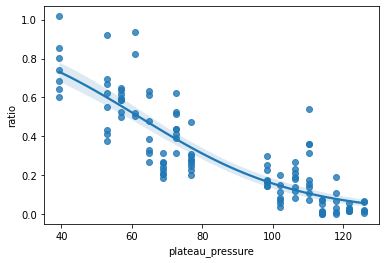

In [ ]:
# sns.regplot(data=nibp.op, x='plateau_pressure', y='ratio', logistic=True)

In [ ]:
 def save_df(df=None, filename=''):
    df.to_csv(filename, index=True)
    !cp -r $filename "/content/drive/My Drive/data40/sphygmo/"

# folder = '/content/drive/MyDrive/data40/sphygmo/'
save_df(rangedf, 'low_sys_a1.csv')

In [ ]:
time, ch1, ch2, ch3= np.loadtxt('/content/drive/MyDrive/data40/sphygmo/210806AP/nibp2.txt', dtype=('f4, f4, f4, f4'),unpack=True,delimiter = '\t')


In [ ]:
# ch2=(ch2[7500:20000])
# ch3=(ch3[7500:20000])
# ch1=(ch1[7500:20000])
# time=(time[7500:20000])


In [ ]:
# plot(ch1)

In [ ]:
# time1, ch11, ch21, ch31= np.loadtxt('/content/drive/MyDrive/data40/sphygmo/210715CP/nibp2.txt', dtype=('f4, f4, f4, f4'),unpack=True,delimiter = '\t')
time, ch1, ch2, ch3= np.loadtxt('/content/drive/MyDrive/data40/sphygmo/210806AP/nibp2.txt', dtype=('f4, f4, f4, f4'),unpack=True,delimiter = '\t')


In [ ]:
# # fft of pressure
# from scipy import interpolate, signal
# N = len(ch2)
# fft_pres = np.fft.fft(ch2)
# fft_pres = 2.0/N * np.abs(fft_pres[0:N//2])
# freq_pres = np.fft.fftfreq(N, 1/500)[:N//2]
# indices, _ = signal.find_peaks(fft_pres, distance=17)
# new_inx = np.sort(np.array(fft_pres[indices]).argsort()[-4:][::-1])


# plt.title('Ref PPG FFT')
# plt.plot(freq_pres, fft_pres)
# plt.scatter(freq_pres[indices][new_inx], fft_pres[indices][new_inx], color='r')
# plt.scatter(0, fft_pres[0], color='r')
# plt.xlim(1,2)
# plt.ylim(0,0.005)

# pres_peaks = np.append(fft_pres[0], fft_pres[indices][new_inx])

# print('Peak frequencies: '+ str(np.round(np.append(0, freq_pres[indices][new_inx]),2)))

In [ ]:
# from scipy.signal import butter, lfilter

# def butter_bandpass(lowcut, highcut, fs, order=5):
#     nyq = 0.5 * fs
#     low = lowcut / nyq
#     high = highcut / nyq
#     b, a = butter(order, [low, high], btype='band')
#     return b, a


# def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
#     b, a = butter_bandpass(lowcut, highcut, fs, order=order)
#     y = lfilter(b, a, data)
#     return y


In [ ]:
# t = time  # 1 second
# sig = ch3 +4
# fig, (ax1, ax2, ax3) = plt.subplots(3, 1, sharex=True)
# ax1.plot(t, sig)
# ax1.set_title('occ_ppg')
# ax1.axis([0, 50, 3.99, 4.02])


# sos = signal.butter(2, (1,1.4), 'bp', fs=500, output='sos')
# filtered = signal.sosfilt(sos, sig)
# ax2.plot(t, filtered)
# ax2.set_title('After band-pass filter')
# ax2.axis([0, 50, -0.05, 0.05])

# chnew=ch3+ (50*filtered)

# ax3.plot(t, chnew)
# ax3.set_title('After adding')
# ax3.axis([0, 50, -0.07, 0.07])

# ax3.set_xlabel('Time [seconds]')
# plt.tight_layout()
# plt.show()


# ch3=chnew

In [ ]:

# ch3filt=scipy.signal.medfilt(ch3,51)
# ip['occ_ppg'] = ch3filt + 4

In [ ]:
ip = pd.DataFrame()
ip['time'] = time
ip['ref_ppg'] = ch2 + 4
ip['occ_ppg'] = ch3 + 4
ip['pressure'] = ch1


# ip1 = pd.DataFrame()
# ip1['time'] = time1
# ip1['ref_ppg'] = ch21 + 4
# ip1['occ_ppg'] = ch31 + 4
# ip1['pressure'] = ch11

In [ ]:
# ip=pd.concat([ip,ip1]).reset_index()

In [ ]:
ip['ref_peaks'],ref_wid, inxref,inx1ref = peak_and_valley_detect(ip['ref_ppg'])
ip['occ_peaks'],occ_wid, inxocc, inx1occ = peak_and_valley_detect(ip['occ_ppg'], prominence=0.0001)

ip['std']= ip['occ_ppg'].rolling(2000).std()
ip['stdr']= ip['ref_ppg'].rolling(2000).std()
ip['occ1d'] = np.gradient(ip['occ_ppg'].values,100)
ip['occ1d_peaks'] = peak_detect(ip['occ1d'])
ip['ref1d'] = np.gradient(ip['ref_ppg'].values)
ip['ref1d_peaks'] = peak_detect(ip['ref1d'])




NameError: ignored

In [ ]:
t1 = pd.DataFrame()
t2 = pd.DataFrame()
t1['pktime']=ip[ip['ref_peaks']>0]['time']
t2['valleytime']=ip[ip['ref_peaks']<0]['time']
t1.reset_index()
t=pd.concat([t1,t2])
t.sort_index(ascending=True)

pktime=ip[ip['ref_peaks']>0]['time'].to_numpy()
valleytime=ip[ip['ref_peaks']<0]['time'].to_numpy()

In [ ]:
tdiff=[]
tindex=[]
tdiff2=[]
pk1=[]
pk2=[]
ita=[]
flag=1
for i in range(1, len(pktime)-1):
  if(valleytime[i]>pktime[i]  and flag==1):
    # print("****")
    tindex.append(i)
    tdiff.append(valleytime[i]-pktime[i])

  elif (valleytime[i]<pktime[i]):
      # print ("-")
      flag=0
      tindex.append(i)
      tdiff.append(pktime[i]-valleytime[i])
      tdiff2.append(valleytime[i]-pktime[i-1])
      pk1.append(ip[ip['time']==pktime[i]]['ref_ppg'].values[0])
      pk2.append(ip[ip['time']==pktime[i-1]]['ref_ppg'].values[0])
      # ita.append(0.5*((pk2[i]*tdiff[i])+(pk1[i]*tdiff2[i])))


  # print(pktime[i])
  # print(valleytime[i])
  # if(valleytime[i]>pktime[i])

  # tdiff.append(ip.loc[valleys[i - 1]:valleys[i]])

In [ ]:

# # fft of pressure
# from scipy import interpolate, signal
# N = len(filtered)
# fft_pres = np.fft.fft(filtered)
# fft_pres = 2.0/N * np.abs(fft_pres[0:N//2])
# freq_pres = np.fft.fftfreq(N, 1/500)[:N//2]
# indices, _ = signal.find_peaks(fft_pres, distance=17)
# new_inx = np.sort(np.array(fft_pres[indices]).argsort()[-4:][::-1])


# plt.title('Pressure')
# plt.plot(freq_pres, fft_pres)
# plt.scatter(freq_pres[indices][new_inx], fft_pres[indices][new_inx], color='r')
# plt.scatter(0, fft_pres[0], color='r')
# plt.xlim(1,10)
# plt.ylim(0,0.01)

# pres_peaks = np.append(fft_pres[0], fft_pres[indices][new_inx])

# print('Peak frequencies: '+ str(np.round(np.append(0, freq_pres[indices][new_inx]),2)))

In [ ]:


plateau_width = 3000
# Making a list of plateaus
hts = np.linspace(0.0001, 1, 100)
peaks, _ = find_peaks(ip['pressure'], width=plateau_width)

plateaus = []
for peak in peaks:
  for ht in hts:
    width, height, left, right = peak_widths(ip['pressure'], np.array([peak]), rel_height=ht)
    if width > plateau_width:
      break
  plateaus.append(ip.loc[left[0]:right[0]])




In [ ]:
# Finding mean pressure for each plateau
mean_pressures = []
mean_occppg=[]
mean_refppg=[]
for plateau in plateaus:
  # plateau.drop(plateau.head(1000).index, inplace=True) 
  # plateau.drop(plateau.tail(500).index, inplace=True)
  mean_pressures.extend([plateau['pressure'].mean()] * len(plateau))
  mean_occppg.extend([plateau[plateau['occ_peaks']>0]['occ_peaks'].median()] * len(plateau))
  mean_refppg.extend([plateau[plateau['ref_peaks']>0]['ref_peaks'].median()] * len(plateau))

ip = pd.concat(plateaus)
ip['mean_pressure'] = mean_pressures
ip['mean_occppg'] = mean_occppg
ip['mean_refppg'] = mean_refppg
ip = ip[np.invert(ip.index.duplicated())]




In [ ]:

ip['ref_peaks'],ref_wid, in1,in2= peak_and_valley_detect(ip['ref_ppg'])
ip['occ_peaks'],occ_wid,in3,in4 = peak_and_valley_detect(ip['occ_ppg'], prominence=0.00005)


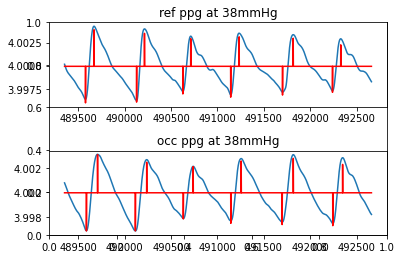

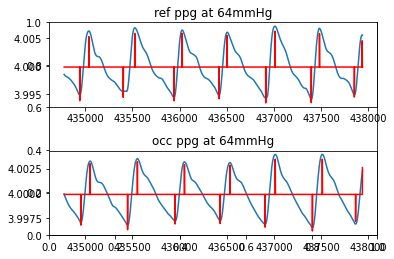

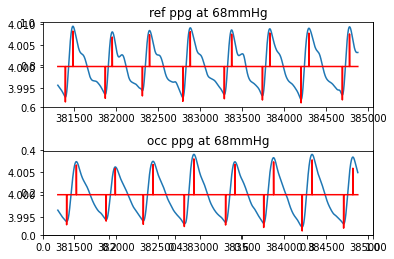

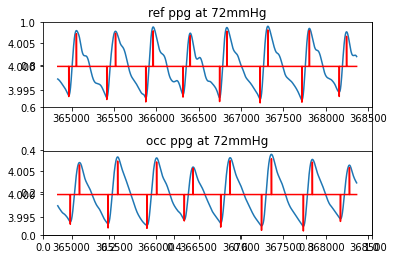

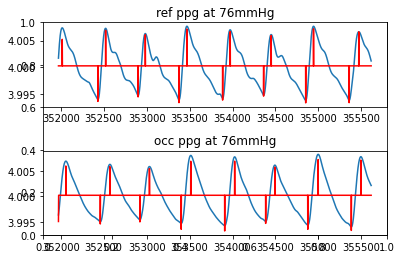

...

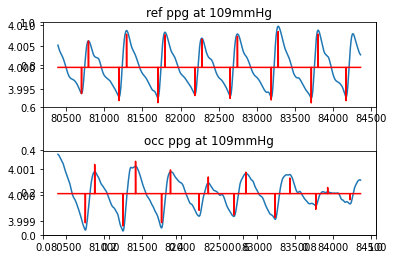

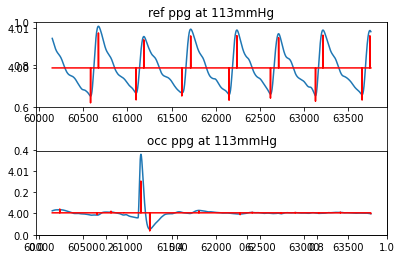

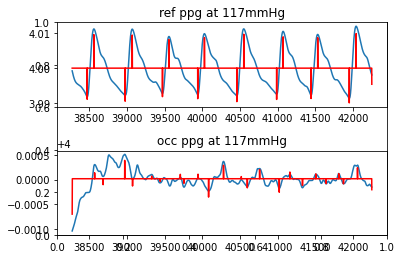

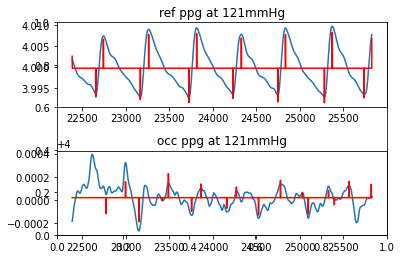

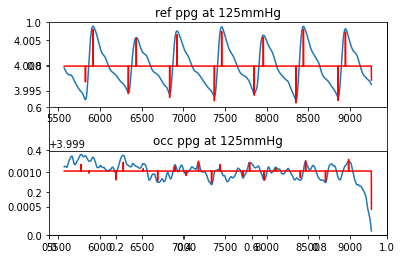

In [ ]:
pdf = PdfPages('debug15BP.pdf')
for i,plateau in ip.groupby('mean_pressure'):
  fig, ax = plt.subplots()
  f1 = fig.add_subplot(2,1,1)
  f1.set_title('ref ppg at '+str(int(i))+'mmHg')
  f1.plot(plateau['ref_ppg'])
  f1.plot(0.5*plateau['ref_peaks']+plateau['ref_ppg'].mean(), 'r')


  f2 = fig.add_subplot(2,1,2)
  f2.set_title('occ ppg at '+str(int(i))+'mmHg')
  f2.plot(plateau['occ_ppg'])
  f2.plot(0.5*plateau['occ_peaks']+plateau['occ_ppg'].mean(), 'r')
  fig.tight_layout()
  pdf.savefig(fig)

pdf.close()
!cp -r 'debug15BP.pdf' "/content/drive/My Drive/n33/"

In [ ]:
detected_plateaus = ip['mean_pressure'].reindex(ip.index, fill_value=0).values

# Making a list of ref ppg cycles
cycles = []
peaks = (ip[ip['ref_peaks'] > 0].index).tolist()
for i in range(1, len(peaks)):
  cycles.append(ip.loc[peaks[i - 1]:peaks[i]])
# to check if there are cycles with no valleys in between in ref arm, such cycles are ignored.
cycles = [cycle for cycle in cycles if len(cycle[(cycle['ref_peaks'] < 0)]) != 0]
begin = ip.loc[:peaks[0]]

In [ ]:
ita=[]
for cycle in cycles:
  if (cycle ['mean_pressure'].values[0] == cycle['mean_pressure'].values).all():
    tt1=cycle[cycle['ref_peaks']>0]['time'].values[0]
    pp1=cycle[cycle['ref_peaks']>0]['ref_peaks'].values[0]

    tt2=cycle[cycle['ref_peaks']<0]['time'].values[0]
    pp2=cycle[cycle['ref_peaks']<0]['ref_peaks'].values[0]

    tt3=cycle[cycle['ref_peaks']>0]['time'].values[-1]
    pp3=cycle[cycle['ref_peaks']>0]['ref_peaks'].values[-1]

    tt4=tt2-tt1
    tt5=tt3-tt2
    # print(cycle['time'])

    ita.append (0.5*( (pp1*tt5) + (pp3*tt4)))



In [ ]:
detected_plateaus = ip['mean_pressure'].reindex(ip.index, fill_value=0).values

# Making a list of occ ppg cycles
cycles = []
peaks = (ip[ip['occ_peaks'] > 0].index).tolist()
for i in range(1, len(peaks)):
  cycles.append(ip.loc[peaks[i - 1]:peaks[i]])
# to check if there are cycles with no valleys in between in ref arm, such cycles are ignored.
cycles = [cycle for cycle in cycles if len(cycle[(cycle['occ_peaks'] < 0)]) != 0]
begin = ip.loc[:peaks[0]]

In [ ]:
ita=[]
cycle_pressure=[]
a=0.7
b=0.9
th=0
for i,cycle in enumerate(cycles):
  if (cycle ['mean_pressure'].values[0] == cycle['mean_pressure'].values).all():
    tt1=cycle[cycle['occ_peaks']>0]['time'].values[0]
    pp1=cycle[cycle['occ_peaks']>0]['occ_peaks'].values[0]

    tt2=cycle[cycle['occ_peaks']<0]['time'].values[0]
    pp2=cycle[cycle['occ_peaks']<0]['occ_peaks'].values[0]

    tt3=cycle[cycle['occ_peaks']>0]['time'].values[-1]
    pp3=cycle[cycle['occ_peaks']>0]['occ_peaks'].values[-1]

    cycle_pressure.append(cycle['mean_pressure'].values[0])

    tt4=tt2-tt1
    tt5=tt3-tt2
  # print(cycle['time'])
    ita_cycle=(0.5*( (pp1*tt5) + (pp3*tt4)))
    ita.append(ita_cycle)

    # if (i==0):
    #   th=ita_cycle
    #   ita.append(ita_cycle)
    # elif ((ita_cycle> (0.1)*th) and (ita_cycle<(4*th))):
    #   th= a*th +(1-a)*ita_cycle
    #   ita.append(ita_cycle)
    # else:
    #   th= b*th +(1-b)*ita_cycle
    #   ita.append(0)
    
    # print(cycle['mean_pressure'].values[0], ita_cycle)
    # print(ita_cycle)

itapd = pd.DataFrame()
itapd['ita']=ita
itapd['pressure']=cycle_pressure




  


    





  # print(cycle['occ_peaks'])
 


In [ ]:
(itapd[itapd['ita']< ( (itapd['ita'].max()/50))]['pressure'].min())

113.66180419921875

In [ ]:
print(itapd[itapd['ita']== ( (itapd['ita'].min()))]['pressure'].min())

121.34940338134766


In [ ]:
if ((itapd[itapd['ita']< ( (itapd['ita'].max()/50))]['pressure'].min()) !=np.nan):
  print(1)
  print(itapd[itapd['ita']< ( (itapd['ita'].max()/50))]['pressure'].min())
else:
  print(itapd[itapd['ita']== ( (itapd['ita'].min()))]['pressure'].min())







1
113.66180419921875


In [ ]:
itapd[itapd['ita']== ( (itapd['ita'].min()))]['pressure'].min()

121.34940338134766

In [ ]:
itapd[itapd['ita']< ( (itapd['ita'].max()/50))]['pressure']

0     125.123322
1     125.123322
2     125.123322
3     125.123322
4     125.123322
5     125.123322
6     125.123322
7     125.123322
8     121.349403
9     121.349403
10    121.349403
11    121.349403
12    121.349403
13    121.349403
14    117.002327
16    117.002327
17    117.002327
18    117.002327
19    117.002327
20    117.002327
21    117.002327
22    117.002327
23    117.002327
28    113.661804
29    113.661804
Name: pressure, dtype: float64

In [ ]:
(itapd['ita'].max()/10)

0.0008724342435016297

In [ ]:
(itapd['ita']).min()

2.9657444429176394e-05

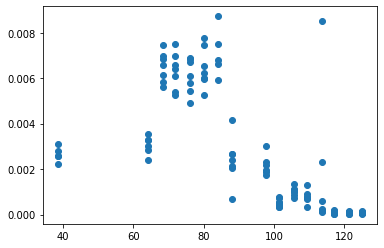

In [ ]:
scatter(cycle_pressure,ita)

In [ ]:
len(ita)
len(cycle_pressure)

In [ ]:
detected_plateaus = ip['mean_pressure'].reindex(ip.index, fill_value=0).values

# Making a list of ref ppg cycles
cycles = []
valley = (ip[ip['occ_peaks'] < 0].index).tolist()
for i in range(1, len(valley)):
  cycles.append(ip.loc[valley[i - 1]:valley[i]])
# to check if there are cycles with no valleys in between in ref arm, such cycles are ignored.
occ_cycles = [cycle for cycle in cycles if len(cycle[(cycle['occ_peaks'] >0)]) != 0]
begin = ip.loc[:valley[0]]

In [ ]:

detected_plateaus = ip['mean_pressure'].reindex(ip.index, fill_value=0).values

# Making a list of ref ppg cycles
cycles = []
valleys = (ip[ip['ref_peaks'] < 0].index).tolist()
for i in range(1, len(valleys)):
  cycles.append(ip.loc[valleys[i - 1]:valleys[i]])
# to check if there are cycles with no peaks in between in ref arm, such cycles are ignored.
cycles = [cycle for cycle in cycles if len(cycle[(cycle['ref_peaks'] > 0)]) != 0]
begin = ip.loc[:valleys[0]]

ref_corr = cycles[1][['ref_ppg']].values.reshape(-1)

In [ ]:
def interp_to_larger(larger, smaller):
  x = np.arange(len(smaller))
  xnew = np.linspace(0,len(smaller)-1, len(larger))
  f = interpolate.interp1d(x, smaller)
  
  return f(xnew)

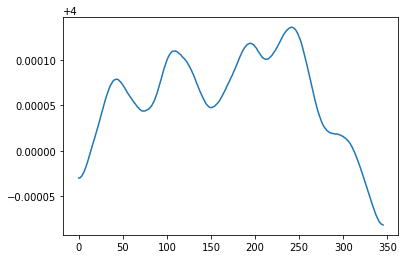

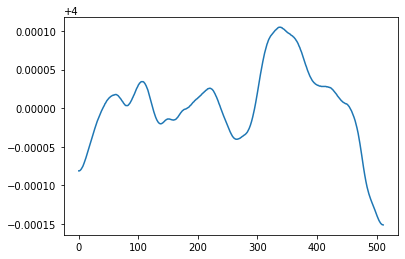

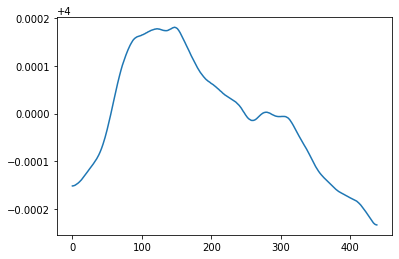

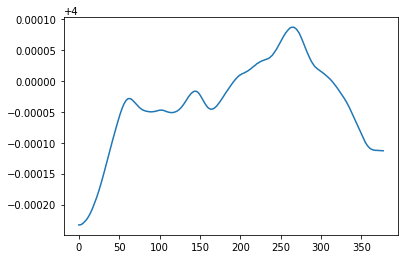

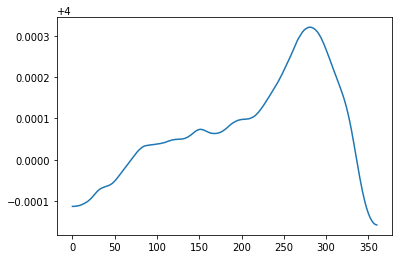

...

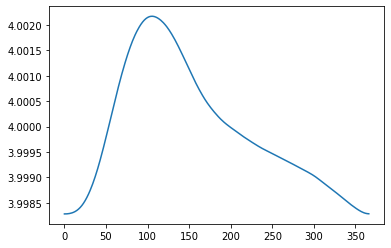

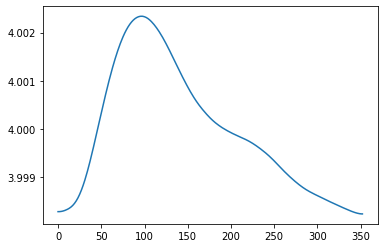

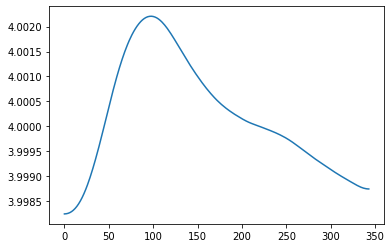

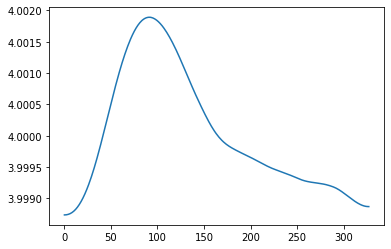

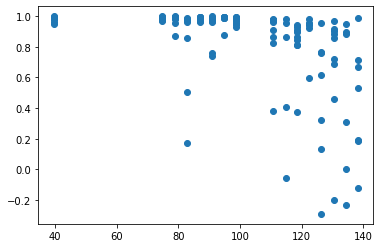

In [ ]:
occ_corr = []
pres=[]
for occ_cycle in occ_cycles:
  if (occ_cycle['mean_pressure'].values[0] == occ_cycle['mean_pressure'].values).all():
    occ = occ_cycle[['occ_ppg']].values.reshape(-1)
    plt.figure()
    plt.plot(occ)
    plt.show()
    if len(occ)<len(ref_corr):
      corr, _ = scipy.stats.pearsonr(interp_to_larger(ref_corr, occ), ref_corr)
    else:
      corr,_ = scipy.stats.pearsonr(occ, interp_to_larger(occ, ref_corr))
    occ_corr.append(corr)
    pres.append(occ_cycle[['mean_pressure']].values[0])

plt.scatter(pres, occ_corr)

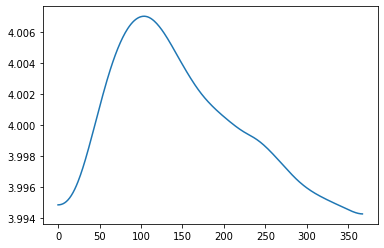

In [ ]:

plt.plot(ref_corr)

In [ ]:

# Generating amplitude, auc, mean cycle pressure and mean plateau pressure for each cycle
amplitude = []
cycle_pressure = []
plateau_pressure = []
ref_amplitude = []

stdev = []
auc = []
occ1d = []
delay = []
ref_auc = []
vol = []
ref_vol = []
full_auc = []
corr=[]

for i in range(len(cycles)):
  if (cycles[i]['mean_pressure'].values[0] == cycles[i]['mean_pressure'].values).all():
    stdev.append(cycles[i]['std'].values[0])
    c,v=scipy.stats.pearsonr(cycles[i]['ref_ppg'], cycles[i]['occ_ppg'])
    corr.append (c )
    ref_amplitude.append(
      cycles[i][(cycles[i]['ref_peaks'] >0)]['ref_peaks'].values[0])
    plateau_pressure.append(cycles[i]['mean_pressure'].values[0])
    cycle_pressure.append(cycles[i]['pressure'].mean())
    max = cycles[i]['occ_ppg'].values.max()
    maxref = cycles[i]['ref_ppg'].values.max()
    min = cycles[i]['occ_ppg'].values.min()
    minref = cycles[i]['ref_ppg'].values.min()
    delay_samples = abs(cycles[i][cycles[i]['ref_ppg']==maxref].index[0] - cycles[i][cycles[i]['occ_ppg']==max].index[0])
    # dich_inx = cycles[i][cycles[i]['ref1d_peaks']>0].index[-1]+delay_samples
    ref_inx = np.sort(np.array([cycles[i][cycles[i]['ref_ppg']==maxref].index[0],cycles[i][cycles[i]['ref_ppg']==minref].index[0]]))
    occ_inx = np.sort(np.array([cycles[i][cycles[i]['occ_ppg']==max].index[0],cycles[i][cycles[i]['occ_ppg']==min].index[0]]))
    amplitude.append(max - cycles[i]['occ_ppg'].min())
    delay.append(delay_samples)
    occ1d.append(cycles[i]['occ1d'].max())
    auc.append((cycles[i].loc[:cycles[i][cycles[i]['occ_ppg']==max].index[0]]['occ_ppg'].values - cycles[i]['occ_ppg'].min()).sum())
    full_auc.append((cycles[i]['occ_ppg'].values - cycles[i]['occ_ppg'].min()).sum())
    ref_auc.append((cycles[i].loc[:cycles[i][cycles[i]['ref_ppg']==maxref].index[0]]['ref_ppg'].values - cycles[i]['ref_ppg'].min()).sum())
    vol.append((cycles[i].loc[occ_inx[0]:occ_inx[1]]['occ_ppg'].values - min).sum())
    ref_vol.append((cycles[i].loc[ref_inx[0]:ref_inx[1]]['ref_ppg'].values - minref).sum())
    # if len(cycles[i][(cycles[i]['occ_peaks'] >0)]) != 0:
    #   amplitude.append(
    #     cycles[i][(cycles[i]['occ_peaks'] >0)]['occ_peaks'].values[0])
    # else:
    #   amplitude.append(0)

# Putting the output variables in another dataframe
op = pd.DataFrame()
op['plateau_pressure'] = plateau_pressure
op['amplitude'] = amplitude
op['cycle_pressure'] = cycle_pressure
op['ref_amplitude'] = ref_amplitude
op['ratio'] = np.divide(np.array(amplitude), np.array(ref_amplitude))


op['stdev'] = stdev
op['auc'] = auc
op['occ1d'] = occ1d
op['delay'] = delay
op['ref_auc'] = ref_auc
op['vol'] = vol
op['ref_vol'] = ref_vol
op['full_auc'] = full_auc
op['occ_radius'] = np.sqrt(np.divide(op['auc'].values, np.ones(len(op))*np.pi))
op['ref_radius'] = np.sqrt(np.divide(op['ref_auc'].values, np.ones(len(op))*np.pi))
op['auc_ratio'] = np.divide(op['auc'].values, op['ref_auc'])
op['corr']=corr
# op['ita'] =ita

# Removing outliers (helps fitting)
op = op[(np.abs(stats.zscore(op)) < 3).all(axis=1)]
op = op.sort_values('plateau_pressure')

In [ ]:
len(op['cycle_pressure'])

141

In [ ]:
c

0.9496580468527808

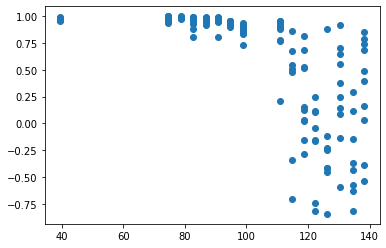

In [ ]:
scatter((op['plateau_pressure']),op['corr'])

In [ ]:
op['plateau_pressure'].values.reshape(-1)

array([ 39.5035553 ,  39.5035553 ,  39.5035553 ,  39.5035553 ,
        39.5035553 ,  39.5035553 ,  39.5035553 ,  39.5035553 ,
        74.70487213,  74.70487213,  74.70487213,  74.70487213,
        74.70487213,  74.70487213,  74.70487213,  74.70487213,
        74.70487213,  78.92108154,  78.92108154,  78.92108154,
        78.92108154,  78.92108154,  78.92108154,  78.92108154,
        78.92108154,  82.6424942 ,  82.6424942 ,  82.6424942 ,
        82.6424942 ,  82.6424942 ,  82.6424942 ,  82.6424942 ,
        86.87242889,  86.87242889,  86.87242889,  86.87242889,
        86.87242889,  86.87242889,  86.87242889,  86.87242889,
        86.87242889,  86.87242889,  90.85022736,  90.85022736,
        90.85022736,  90.85022736,  90.85022736,  90.85022736,
        90.85022736,  90.85022736,  90.85022736,  90.85022736,
        94.69738007,  94.69738007,  94.69738007,  94.69738007,
        94.69738007,  94.69738007,  94.69738007,  94.69738007,
        94.69738007,  98.84959412,  98.84959412,  98.84

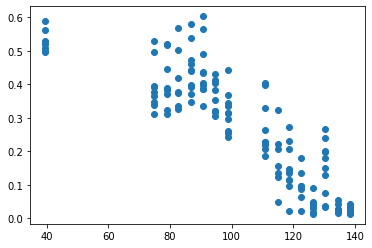

In [ ]:


scatter((op['plateau_pressure']),op['ratio'])

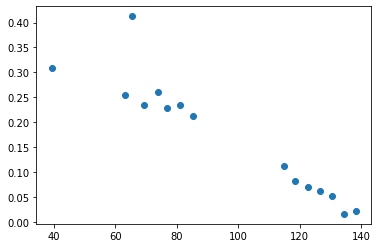

In [ ]:
scatter(np.unique(op['plateau_pressure']),op.groupby('plateau_pressure').mean()['ratio'])

In [ ]:
ip['dif']=(60+2500*((ip['occ_ppg'] -ip['ref_ppg']).values)) 
# plot((ip['pressure']).values) 

next 3 cells are for mean ratio fit

In [ ]:
(a, b, c, d, e), _ = curve_fit(sigmoid_5pl, np.unique(op['plateau_pressure']), op.groupby('plateau_pressure').mean()['ratio'], maxfev=5000)
# except:
#   op['temp'] = [int(x) for x in op['plateau_pressure']]
#   row = pd.DataFrame(op[op['temp']==0].median()).transpose()
#   op = op[op['temp']>0]
#   op = pd.concat([row, op])
#   (a, b, c, d, e), _ = curve_fit(sigmoid_5pl, op['plateau_pressure'], op['ratio'], maxfev=5000)
fity = sigmoid_5pl(np.unique(op['plateau_pressure']), a, b, c, d, e)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in power
  


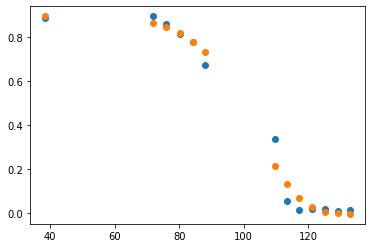

In [ ]:
scatter(np.unique(op['plateau_pressure']),op.groupby('plateau_pressure').mean()['ratio'])
scatter(np.unique(op['plateau_pressure']), fity)

In [ ]:

# dummy = [filtrd[i+int(n/2)] - filtrd[i-int(n/2)] for i in range(len(filtrd)-n)]

def getslope(array,n):
  dummy = [array[i+int(n/2)] - array[i-int(n/2)] for i in range(int(n/2), len(array)-int(n/2))]
  return dummy



-0.023658304242030182


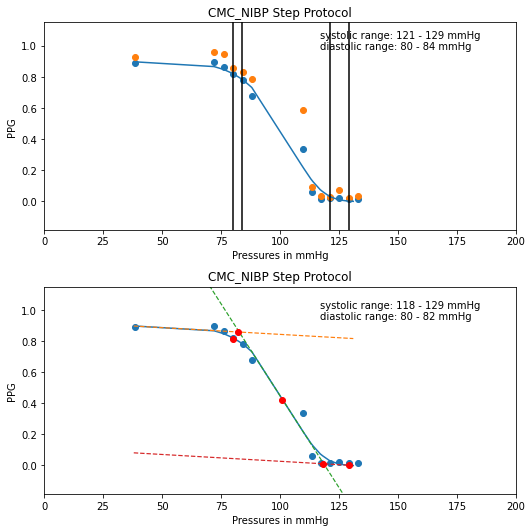

In [ ]:
# # try:
# (a, b, c, d, e), _ = curve_fit(sigmoid_5pl, op['plateau_pressure'], op['ratio'], maxfev=5000)
# # except:
# #   op['temp'] = [int(x) for x in op['plateau_pressure']]
# #   row = pd.DataFrame(op[op['temp']==0].median()).transpose()
# #   op = op[op['temp']>0]
# #   op = pd.concat([row, op])
# #   (a, b, c, d, e), _ = curve_fit(sigmoid_5pl, op['plateau_pressure'], op['ratio'], maxfev=5000)
# op['fit'] = sigmoid_5pl(op['plateau_pressure'], a, b, c, d, e)
# # op.to_csv('C:/CMC_NIBP/'+'cmc_step1_profile.csv', index=False)

fit = pd.DataFrame()
fit['x'] = list(range(int(op['plateau_pressure'].min()), int(op['plateau_pressure'].max())))
fit['y'] = np.interp(fit['x'], np.unique(op['plateau_pressure']), fity)
order = (fit['x'].max() - fit['x'].min()) / 10

fit['d1'] =np.gradient(gaussian_filter1d(fit['y'], order))

# n=2
# filtrd = (gaussian_filter1d(fit['y'], order))
# dy = getslope(filtrd,n)
# dx= getslope(fit['x'].values,n)
# fit=fit[int(n/2):-int(n/2)].reset_index()
# fit['d1']= np.array(dy)/np.array(dx)


fit['d2'] = np.gradient(fit['d1'])
# fit.to_csv('C:/CMC_NIBP/'+'slopes.csv', index=False)

temp = pd.DataFrame()
temp['meanratio']=op.groupby('plateau_pressure').mean()['ratio']
temp['pressures'] = np.sort(list(set(op['plateau_pressure'])))
temp['variances'] = [op[op['plateau_pressure'] == pressure]['ratio'].var() for pressure in temp['pressures']]


plt.figure(figsize=(7.5, 7.5))
# Max and min of 2nd derivative
up_dias = fit[fit['d2'] == fit['d2'].min()]['x'].values[0]
low_sys = fit[fit['d2'] == fit['d2'].max()]['x'].values[0]

x = temp[temp['pressures'] < up_dias]
low_dias = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])
x = temp[temp['pressures'] > low_sys]
up_sys = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])

infls = [low_dias, up_dias, low_sys, up_sys]

plt.subplot(2, 1, 1)
w = plt.scatter(np.unique(op['plateau_pressure']), op.groupby('plateau_pressure').mean()['ratio'])
plt.scatter(np.unique(op['plateau_pressure']), op.groupby('plateau_pressure').max()['ratio'])
# datacursor(w)
plt.plot(fit['x'], fit['y'])
for i, inf in enumerate(infls, 1):
  plt.axvline(x=inf, color='k', label=f'Inflection Point {i}')

textstr = 'systolic range: ' + str(low_sys) + ' - ' + str(up_sys) + ' mmHg\ndiastolic range: ' + str(
  low_dias) + ' - ' + str(up_dias) + ' mmHg'
plt.gcf().text(0.6, 0.9, textstr, fontsize=10)

axes = plt.gca()
num = (op['ratio'].max()-op['ratio'].min())/5
axes.set_ylim([op['ratio'].min()-num, op['ratio'].max()+num ])
axes.set_xlim([0, 200])

plt.xlabel('Pressures in mmHg');
plt.ylabel('PPG');
plt.title('CMC_NIBP Step Protocol')

# Intersection of lines through max, min, infl of fit
infl = [x for x in fit[np.sign(fit['d2']).diff() != 0]['x'].values if (x > up_dias) & (x < low_sys)][0]

x1 = fit['x'].min()
y1 = fit[fit['x'] == fit['x'].min()]['y'].values[0]
# m = fit[fit['x'] == fit['x'].min()]['d1'].values[0]
m= (fit[fit['x'] == fit['x'].min()+10]['y'].values[0] -y1)/10
fit['line_high'] = (fit['x'] - x1) * m + y1 




x1 = infl-5
y1 = fit[fit['x'] == (infl-5)]['y'].values[0]
# m = fit[fit['x'] == infl]['d1'].values[0]
m=  (fit[fit['x'] == (infl+5)]['y'].values[0] - y1)/10
# m= fit['d1'].min()
# m = fit[fit.index==fit[fit['x']==infl].index[0]+10]['d1'].values[0]
print(m)
fit['line_infl'] = (fit['x'] - x1) * m + y1

x1 = fit['x'].max()
y1 = fit[fit['x'] == fit['x'].max()]['y'].values[0]
m = fit[fit['x'] == fit['x'].max()]['d1'].values[0]
fit['line_low'] = (fit['x'] - x1) * m + y1

plt.subplot(2, 1, 2)
w = plt.scatter(np.unique(op['plateau_pressure']), op.groupby('plateau_pressure').mean()['ratio'])
# datacursor(w)
plt.plot(fit['x'], fit['y'])
plt.plot(fit['x'], fit['line_high'], '--', linewidth=1.2)
plt.plot(fit['x'], fit['line_infl'], '--', linewidth=1.2)
plt.plot(fit['x'], fit['line_low'], '--', linewidth=1.2)

plt.plot(infl, fit[fit['x'] == infl]['y'].values[0], 'ro')

idx1 = np.argwhere(np.diff(np.sign(fit['line_high'] - fit['line_infl']))).flatten()[0]
up_dias = fit['x'].values[idx1]
plt.plot(up_dias, fit['line_high'].values[idx1], 'ro')

idx2 = np.argwhere(np.diff(np.sign(fit['line_infl'] - fit['line_low']))).flatten()[0]
low_sys = fit['x'].values[idx2]
plt.plot(low_sys, fit['line_low'].values[idx2], 'ro')

x = temp[temp['pressures'] < up_dias]
low_dias = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])
x = temp[temp['pressures'] > low_sys]
up_sys = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])

plt.plot(low_dias, fit[fit['x'] > low_dias]['y'].max(), 'ro')
plt.plot(up_sys, fit[fit['x'] < up_sys]['y'].min(), 'ro')

textstr = 'systolic range: ' + str(low_sys) + ' - ' + str(up_sys) + ' mmHg\ndiastolic range: ' + str(
  low_dias) + ' - ' + str(up_dias) + ' mmHg'
plt.subplots_adjust(bottom=0.3)
plt.gcf().text(0.6, 0.4, textstr, fontsize=10)

axes = plt.gca()
num = (op['ratio'].max()-op['ratio'].min())/5
axes.set_ylim([op['ratio'].min()-num, op['ratio'].max()+num ])
axes.set_xlim([0, 200])

plt.xlabel('Pressures in mmHg');
plt.ylabel('PPG');
plt.title('CMC_NIBP Step Protocol')
# plt.savefig('C:/CMC_NIBP/'+'CMC_NIBP Step 1 Plot')
plt.tight_layout(h_pad=1)
plt.show()



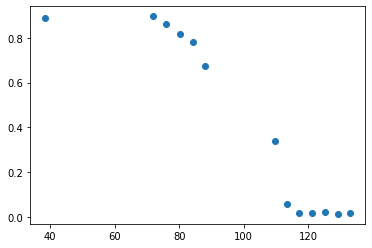

In [ ]:
plt.scatter(np.unique(op['plateau_pressure']), op.groupby('plateau_pressure').mean()['ratio'])

In [ ]:
(op.groupby('plateau_pressure').mean()['ratio'])

plateau_pressure
38.519547     0.889452
72.004845     0.896015
76.038666     0.861626
80.132164     0.817564
84.161751     0.780375
87.978836     0.674909
109.700455    0.336807
113.431282    0.057149
117.253128    0.016019
121.091377    0.018311
125.065247    0.019968
129.048248    0.013337
132.791611    0.016904
Name: ratio, dtype: float64

In [ ]:
 op

,plateau_pressure,amplitude,cycle_pressure,ref_amplitude,ratio,stdev,auc,occ1d,delay,ref_auc,vol,ref_vol,full_auc,occ_radius,ref_radius,auc_ratio,corr
121,38.519547,0.012868,38.569668,0.014500,0.887447,0.003913,0.654741,0.000244,6,0.752255,0.654741,0.752255,2.063132,0.456520,0.489336,0.870371,0.989356
114,38.519547,0.011634,38.459221,0.013077,0.889592,0.003828,0.602262,0.000208,5,0.698570,1.242894,1.450484,1.833709,0.437842,0.471553,0.862135,0.993384
115,38.519547,0.011715,38.540264,0.013585,0.862403,0.003841,0.608687,0.000219,6,0.704259,1.251104,0.704259,1.848428,0.440172,0.473469,0.864294,0.991479
116,38.519547,0.012036,38.519169,0.013354,0.901289,0.003839,0.619654,0.000219,7,0.691036,1.387884,0.691036,1.995502,0.444119,0.469003,0.896702,0.989344
120,38.519547,0.012572,38.696415,0.014389,0.873737,0.003865,0.660659,0.000232,4,0.738131,1.393661,1.625853,2.041818,0.458579,0.484721,0.895044,0.993139
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5,132.791611,0.000260,132.936020,0.015996,0.016246,0.000247,0.015328,0.000006,7,0.785754,0.015116,1.728588,0.049785,0.069850,0.500113,0.019507,0.699829
4,132.791611,0.000224,132.741135,0.015496,0.014432,0.000502,0.033488,0.000003,196,0.729052,0.006770,0.729052,0.040034,0.103244,0.481731,0.045933,-0.405793
3,132.791611,0.000293,132.592941,0.016503,0.017770,0.000970,0.010683,0.000003,50,0.774935,0.030645,0.774935,0.042645,0.058314,0.496658,0.013786,0.416848
1,132.791611,0.000138,132.572281,0.015742,0.008784,0.002267,0.006917,0.000003,23,0.755880,0.005600,0.755880,0.026974,0.046921,0.490514,0.009150,0.159574


In [ ]:
np.unique(op['plateau_pressure'])

array([ 38.51954651,  72.00484467,  76.03866577,  80.132164  ,
        84.16175079,  87.97883606, 109.70045471, 113.43128204,
       117.25312805, 121.09137726, 125.06524658, 129.04824829,
       132.79161072])

In [ ]:
 op.groupby('plateau_pressure').mean()['ratio']

plateau_pressure
38.519547     0.889452
72.004845     0.896015
76.038666     0.861626
80.132164     0.817564
84.161751     0.780375
87.978836     0.674909
109.700455    0.336807
113.431282    0.057149
117.253128    0.016019
121.091377    0.018311
125.065247    0.019968
129.048248    0.013337
132.791611    0.016904
Name: ratio, dtype: float64

normal ppg ratio fit

-0.023993796533119605


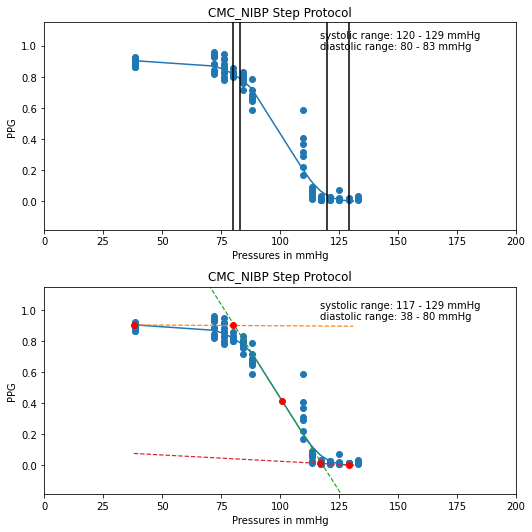

In [ ]:
# try:
(a, b, c, d, e), _ = curve_fit(sigmoid_5pl, op['plateau_pressure'], op['ratio'], maxfev=5000)
# except:
#   op['temp'] = [int(x) for x in op['plateau_pressure']]
#   row = pd.DataFrame(op[op['temp']==0].median()).transpose()
#   op = op[op['temp']>0]
#   op = pd.concat([row, op])
#   (a, b, c, d, e), _ = curve_fit(sigmoid_5pl, op['plateau_pressure'], op['ratio'], maxfev=5000)
op['fit'] = sigmoid_5pl(op['plateau_pressure'], a, b, c, d, e)
# op.to_csv('C:/CMC_NIBP/'+'cmc_step1_profile.csv', index=False)

fit = pd.DataFrame()
fit['x'] = list(range(int(op['plateau_pressure'].min()), int(op['plateau_pressure'].max())))
fit['y'] = np.interp(fit['x'], op['plateau_pressure'], op['fit'])
order = (fit['x'].max() - fit['x'].min()) / 10
fit['d1'] = np.gradient(gaussian_filter1d(fit['y'], order))
fit['d2'] = np.gradient(fit['d1'])
# fit.to_csv('C:/CMC_NIBP/'+'slopes.csv', index=False)

temp = pd.DataFrame()
temp['pressures'] = np.sort(list(set(op['plateau_pressure'])))
temp['variances'] = [op[op['plateau_pressure'] == pressure]['ratio'].var() for pressure in temp['pressures']]

plt.figure(figsize=(7.5, 7.5))
# Max and min of 2nd derivative
up_dias = fit[fit['d2'] == fit['d2'].min()]['x'].values[0]
low_sys = fit[fit['d2'] == fit['d2'].max()]['x'].values[0]

x = temp[temp['pressures'] < up_dias]
low_dias = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])
x = temp[temp['pressures'] > low_sys]
up_sys = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])

infls = [low_dias, up_dias, low_sys, up_sys]

plt.subplot(2, 1, 1)
w = plt.scatter(op['plateau_pressure'], op['ratio'])
# datacursor(w)
plt.plot(fit['x'], fit['y'])
for i, inf in enumerate(infls, 1):
  plt.axvline(x=inf, color='k', label=f'Inflection Point {i}')

textstr = 'systolic range: ' + str(low_sys) + ' - ' + str(up_sys) + ' mmHg\ndiastolic range: ' + str(
  low_dias) + ' - ' + str(up_dias) + ' mmHg'
plt.gcf().text(0.6, 0.9, textstr, fontsize=10)

axes = plt.gca()
num = (op['ratio'].max()-op['ratio'].min())/5
axes.set_ylim([op['ratio'].min()-num, op['ratio'].max()+num ])
axes.set_xlim([0, 200])

plt.xlabel('Pressures in mmHg');
plt.ylabel('PPG');
plt.title('CMC_NIBP Step Protocol')

# Intersection of lines through max, min, infl of fit
infl = [x for x in fit[np.sign(fit['d2']).diff() != 0]['x'].values if (x > up_dias) & (x < low_sys)][0]

x1 = fit['x'].min()
y1 = fit[fit['x'] == fit['x'].min()]['y'].values[0]
m = fit[fit['x'] == fit['x'].min()]['d1'].values[0]
fit['line_high'] = (fit['x'] - x1) * m + y1

# x1 = infl
# y1 = fit[fit['x'] == infl]['y'].values[0]
# m = fit[fit['x'] == infl]['d1'].values[0]
# fit['line_infl'] = (fit['x'] - x1) * m + y1

x1 = infl-5
y1 = fit[fit['x'] == (infl-5)]['y'].values[0]
# m = fit[fit['x'] == infl]['d1'].values[0]
m=  (fit[fit['x'] == (infl+5)]['y'].values[0] - y1)/10
# m= fit['d1'].min()
# m = fit[fit.index==fit[fit['x']==infl].index[0]+10]['d1'].values[0]
print(m)
fit['line_infl'] = (fit['x'] - x1) * m + y1


x1 = fit['x'].max()
y1 = fit[fit['x'] == fit['x'].max()]['y'].values[0]
m = fit[fit['x'] == fit['x'].max()]['d1'].values[0]
fit['line_low'] = (fit['x'] - x1) * m + y1

plt.subplot(2, 1, 2)
w = plt.scatter(op['plateau_pressure'], op['ratio'])
# datacursor(w)
plt.plot(fit['x'], fit['y'])
plt.plot(fit['x'], fit['line_high'], '--', linewidth=1.2)
plt.plot(fit['x'], fit['line_infl'], '--', linewidth=1.2)
plt.plot(fit['x'], fit['line_low'], '--', linewidth=1.2)

plt.plot(infl, fit[fit['x'] == infl]['y'].values[0], 'ro')

idx1 = np.argwhere(np.diff(np.sign(fit['line_high'] - fit['line_infl']))).flatten()[0]
up_dias = fit['x'].values[idx1]
plt.plot(up_dias, fit['line_high'].values[idx1], 'ro')

idx2 = np.argwhere(np.diff(np.sign(fit['line_infl'] - fit['line_low']))).flatten()[0]
low_sys = fit['x'].values[idx2]
plt.plot(low_sys, fit['line_low'].values[idx2], 'ro')

x = temp[temp['pressures'] < up_dias]
low_dias = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])
x = temp[temp['pressures'] > low_sys]
up_sys = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])

plt.plot(low_dias, fit[fit['x'] > low_dias]['y'].max(), 'ro')
plt.plot(up_sys, fit[fit['x'] < up_sys]['y'].min(), 'ro')

textstr = 'systolic range: ' + str(low_sys) + ' - ' + str(up_sys) + ' mmHg\ndiastolic range: ' + str(
  low_dias) + ' - ' + str(up_dias) + ' mmHg'
plt.subplots_adjust(bottom=0.3)
plt.gcf().text(0.6, 0.4, textstr, fontsize=10)

axes = plt.gca()
num = (op['ratio'].max()-op['ratio'].min())/5
axes.set_ylim([op['ratio'].min()-num, op['ratio'].max()+num ])
axes.set_xlim([0, 200])

plt.xlabel('Pressures in mmHg');
plt.ylabel('PPG');
plt.title('CMC_NIBP Step Protocol')
# plt.savefig('C:/CMC_NIBP/'+'CMC_NIBP Step 1 Plot')
plt.tight_layout(h_pad=1)
plt.show()
# except:
#   # op.to_csv('C:/CMC_NIBP/'+'cmc_step1_profile.csv', index=False)
#   w = plt.scatter(op['plateau_pressure'], op['ratio'])
#   # datacursor(w)
#   textstr = 'cannot fit'
#   # plt.subplots_adjust(bottom=0.3)
#   plt.gcf().text(0.8, 0.9, textstr, fontsize=10)

#   axes = plt.gca()
#   num = (op['ratio'].max()-op['ratio'].min())/5
#   axes.set_ylim([op['ratio'].min()-num, op['ratio'].max()+num ])
#   axes.set_xlim([0, 200])

#   plt.xlabel('Pressures in mmHg');
#   plt.ylabel('PPG');
#   plt.title('CMC_NIBP Step Protocol')
#   # plt.savefig('C:/CMC_NIBP/'+'CMC_NIBP Step 1 Plot')
#   plt.tight_layout(h_pad=1)
#   plt.show()


The following is with peak-detect 0.0001


-0.02377481671712072


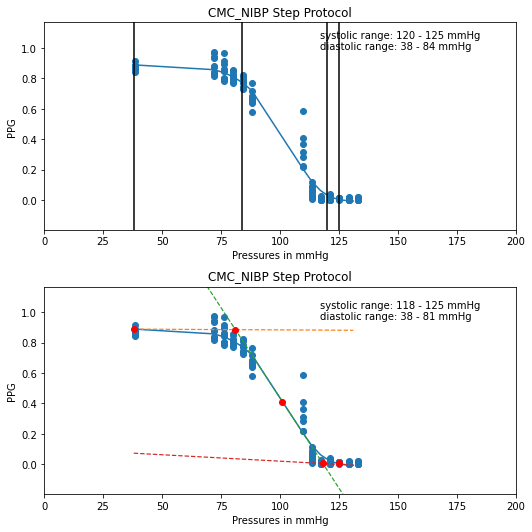

In [ ]:
# Generating amplitude, auc, mean cycle pressure and mean plateau pressure for each cycle
amplitude = []
cycle_pressure = []
plateau_pressure = []
ref_amplitude = []

stdev = []
auc = []
occ1d = []
delay = []
ref_auc = []
vol = []
ref_vol = []
full_auc = []

for i in range(len(cycles)):
  if (cycles[i]['mean_pressure'].values[0] == cycles[i]['mean_pressure'].values).all():
    stdev.append(cycles[i]['std'].values[0])
    ref_amplitude.append(
      cycles[i][(cycles[i]['ref_peaks'] >0)]['ref_peaks'].values[0])
    plateau_pressure.append(cycles[i]['mean_pressure'].values[0])
    cycle_pressure.append(cycles[i]['pressure'].mean())
    max = cycles[i]['occ_ppg'].values.max()
    maxref = cycles[i]['ref_ppg'].values.max()
    min = cycles[i]['occ_ppg'].values.min()
    minref = cycles[i]['ref_ppg'].values.min()
    delay_samples = abs(cycles[i][cycles[i]['ref_ppg']==maxref].index[0] - cycles[i][cycles[i]['occ_ppg']==max].index[0])
    # dich_inx = cycles[i][cycles[i]['ref1d_peaks']>0].index[-1]+delay_samples
    ref_inx = np.sort(np.array([cycles[i][cycles[i]['ref_ppg']==maxref].index[0],cycles[i][cycles[i]['ref_ppg']==minref].index[0]]))
    occ_inx = np.sort(np.array([cycles[i][cycles[i]['occ_ppg']==max].index[0],cycles[i][cycles[i]['occ_ppg']==min].index[0]]))
    # amplitude.append(max - cycles[i]['occ_ppg'].min())
    delay.append(delay_samples)
    occ1d.append(cycles[i]['occ1d'].max())
    auc.append((cycles[i].loc[:cycles[i][cycles[i]['occ_ppg']==max].index[0]]['occ_ppg'].values - cycles[i]['occ_ppg'].min()).sum())
    full_auc.append((cycles[i]['occ_ppg'].values - cycles[i]['occ_ppg'].min()).sum())
    ref_auc.append((cycles[i].loc[:cycles[i][cycles[i]['ref_ppg']==maxref].index[0]]['ref_ppg'].values - cycles[i]['ref_ppg'].min()).sum())
    vol.append((cycles[i].loc[occ_inx[0]:occ_inx[1]]['occ_ppg'].values - min).sum())
    ref_vol.append((cycles[i].loc[ref_inx[0]:ref_inx[1]]['ref_ppg'].values - minref).sum())
    if len(cycles[i][(cycles[i]['occ_peaks'] >0)]) != 0:
      amplitude.append(
        cycles[i][(cycles[i]['occ_peaks'] >0)]['occ_peaks'].values[0])
    else:
      amplitude.append(0)

# Putting the output variables in another dataframe
op = pd.DataFrame()
op['plateau_pressure'] = plateau_pressure
op['amplitude'] = amplitude
op['cycle_pressure'] = cycle_pressure
op['ref_amplitude'] = ref_amplitude
op['ratio'] = np.divide(np.array(amplitude), np.array(ref_amplitude))


op['stdev'] = stdev
op['auc'] = auc
op['occ1d'] = occ1d
op['delay'] = delay
op['ref_auc'] = ref_auc
op['vol'] = vol
op['ref_vol'] = ref_vol
op['full_auc'] = full_auc
op['occ_radius'] = np.sqrt(np.divide(op['auc'].values, np.ones(len(op))*np.pi))
op['ref_radius'] = np.sqrt(np.divide(op['ref_auc'].values, np.ones(len(op))*np.pi))
op['auc_ratio'] = np.divide(op['auc'].values, op['ref_auc'])

# Removing outliers (helps fitting)
op = op[(np.abs(stats.zscore(op)) < 3).all(axis=1)]
op = op.sort_values('plateau_pressure')






# try:
(a, b, c, d, e), _ = curve_fit(sigmoid_5pl, op['plateau_pressure'], op['ratio'], maxfev=5000)
# except:
#   op['temp'] = [int(x) for x in op['plateau_pressure']]
#   row = pd.DataFrame(op[op['temp']==0].median()).transpose()
#   op = op[op['temp']>0]
#   op = pd.concat([row, op])
#   (a, b, c, d, e), _ = curve_fit(sigmoid_5pl, op['plateau_pressure'], op['ratio'], maxfev=5000)
op['fit'] = sigmoid_5pl(op['plateau_pressure'], a, b, c, d, e)
# op.to_csv('C:/CMC_NIBP/'+'cmc_step1_profile.csv', index=False)

fit = pd.DataFrame()
fit['x'] = list(range(int(op['plateau_pressure'].min()), int(op['plateau_pressure'].max())))
fit['y'] = np.interp(fit['x'], op['plateau_pressure'], op['fit'])
order = (fit['x'].max() - fit['x'].min()) / 10
fit['d1'] = np.gradient(gaussian_filter1d(fit['y'], order))
fit['d2'] = np.gradient(fit['d1'])
# fit.to_csv('C:/CMC_NIBP/'+'slopes.csv', index=False)

temp = pd.DataFrame()
temp['pressures'] = np.sort(list(set(op['plateau_pressure'])))
temp['variances'] = [op[op['plateau_pressure'] == pressure]['ratio'].var() for pressure in temp['pressures']]

plt.figure(figsize=(7.5, 7.5))
# Max and min of 2nd derivative
up_dias = fit[fit['d2'] == fit['d2'].min()]['x'].values[0]
low_sys = fit[fit['d2'] == fit['d2'].max()]['x'].values[0]

x = temp[temp['pressures'] < up_dias]
low_dias = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])
x = temp[temp['pressures'] > low_sys]
up_sys = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])

infls = [low_dias, up_dias, low_sys, up_sys]

plt.subplot(2, 1, 1)
w = plt.scatter(op['plateau_pressure'], op['ratio'])
# datacursor(w)
plt.plot(fit['x'], fit['y'])
for i, inf in enumerate(infls, 1):
  plt.axvline(x=inf, color='k', label=f'Inflection Point {i}')

textstr = 'systolic range: ' + str(low_sys) + ' - ' + str(up_sys) + ' mmHg\ndiastolic range: ' + str(
  low_dias) + ' - ' + str(up_dias) + ' mmHg'
plt.gcf().text(0.6, 0.9, textstr, fontsize=10)

axes = plt.gca()
num = (op['ratio'].max()-op['ratio'].min())/5
axes.set_ylim([op['ratio'].min()-num, op['ratio'].max()+num ])
axes.set_xlim([0, 200])

plt.xlabel('Pressures in mmHg');
plt.ylabel('PPG');
plt.title('CMC_NIBP Step Protocol')

# Intersection of lines through max, min, infl of fit
infl = [x for x in fit[np.sign(fit['d2']).diff() != 0]['x'].values if (x > up_dias) & (x < low_sys)][0]

x1 = fit['x'].min()
y1 = fit[fit['x'] == fit['x'].min()]['y'].values[0]
m = fit[fit['x'] == fit['x'].min()]['d1'].values[0]
fit['line_high'] = (fit['x'] - x1) * m + y1

# x1 = infl
# y1 = fit[fit['x'] == infl]['y'].values[0]
# m = fit[fit['x'] == infl]['d1'].values[0]
# fit['line_infl'] = (fit['x'] - x1) * m + y1

x1 = infl-5
y1 = fit[fit['x'] == (infl-5)]['y'].values[0]
# m = fit[fit['x'] == infl]['d1'].values[0]
m=  (fit[fit['x'] == (infl+5)]['y'].values[0] - y1)/10
# m= fit['d1'].min()
# m = fit[fit.index==fit[fit['x']==infl].index[0]+10]['d1'].values[0]
print(m)
fit['line_infl'] = (fit['x'] - x1) * m + y1


x1 = fit['x'].max()
y1 = fit[fit['x'] == fit['x'].max()]['y'].values[0]
m = fit[fit['x'] == fit['x'].max()]['d1'].values[0]
fit['line_low'] = (fit['x'] - x1) * m + y1

plt.subplot(2, 1, 2)
w = plt.scatter(op['plateau_pressure'], op['ratio'])
# datacursor(w)
plt.plot(fit['x'], fit['y'])
plt.plot(fit['x'], fit['line_high'], '--', linewidth=1.2)
plt.plot(fit['x'], fit['line_infl'], '--', linewidth=1.2)
plt.plot(fit['x'], fit['line_low'], '--', linewidth=1.2)

plt.plot(infl, fit[fit['x'] == infl]['y'].values[0], 'ro')

idx1 = np.argwhere(np.diff(np.sign(fit['line_high'] - fit['line_infl']))).flatten()[0]
up_dias = fit['x'].values[idx1]
plt.plot(up_dias, fit['line_high'].values[idx1], 'ro')

idx2 = np.argwhere(np.diff(np.sign(fit['line_infl'] - fit['line_low']))).flatten()[0]
low_sys = fit['x'].values[idx2]
plt.plot(low_sys, fit['line_low'].values[idx2], 'ro')

x = temp[temp['pressures'] < up_dias]
low_dias = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])
x = temp[temp['pressures'] > low_sys]
up_sys = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])

plt.plot(low_dias, fit[fit['x'] > low_dias]['y'].max(), 'ro')
plt.plot(up_sys, fit[fit['x'] < up_sys]['y'].min(), 'ro')

textstr = 'systolic range: ' + str(low_sys) + ' - ' + str(up_sys) + ' mmHg\ndiastolic range: ' + str(
  low_dias) + ' - ' + str(up_dias) + ' mmHg'
plt.subplots_adjust(bottom=0.3)
plt.gcf().text(0.6, 0.4, textstr, fontsize=10)

axes = plt.gca()
num = (op['ratio'].max()-op['ratio'].min())/5
axes.set_ylim([op['ratio'].min()-num, op['ratio'].max()+num ])
axes.set_xlim([0, 200])

plt.xlabel('Pressures in mmHg');
plt.ylabel('PPG');
plt.title('CMC_NIBP Step Protocol')
# plt.savefig('C:/CMC_NIBP/'+'CMC_NIBP Step 1 Plot')
plt.tight_layout(h_pad=1)
plt.show()
# except:
#   # op.to_csv('C:/CMC_NIBP/'+'cmc_step1_profile.csv', index=False)
#   w = plt.scatter(op['plateau_pressure'], op['ratio'])
#   # datacursor(w)
#   textstr = 'cannot fit'
#   # plt.subplots_adjust(bottom=0.3)
#   plt.gcf().text(0.8, 0.9, textstr, fontsize=10)

#   axes = plt.gca()
#   num = (op['ratio'].max()-op['ratio'].min())/5
#   axes.set_ylim([op['ratio'].min()-num, op['ratio'].max()+num ])
#   axes.set_xlim([0, 200])

#   plt.xlabel('Pressures in mmHg');
#   plt.ylabel('PPG');
#   plt.title('CMC_NIBP Step Protocol')
#   # plt.savefig('C:/CMC_NIBP/'+'CMC_NIBP Step 1 Plot')
#   plt.tight_layout(h_pad=1)
#   plt.show()


-0.023658304242030182


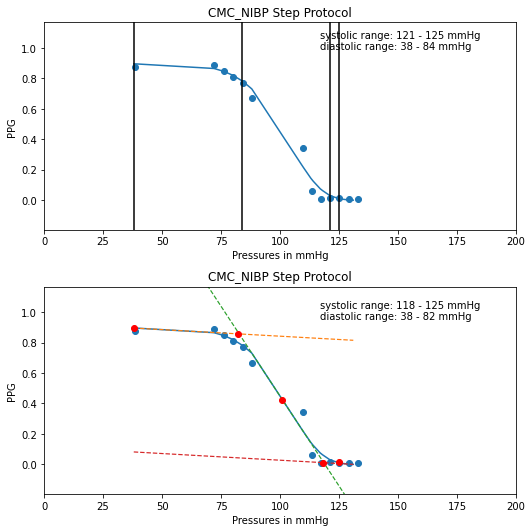

In [ ]:
# # try:
# (a, b, c, d, e), _ = curve_fit(sigmoid_5pl, op['plateau_pressure'], op['ratio'], maxfev=5000)
# # except:
# #   op['temp'] = [int(x) for x in op['plateau_pressure']]
# #   row = pd.DataFrame(op[op['temp']==0].median()).transpose()
# #   op = op[op['temp']>0]
# #   op = pd.concat([row, op])
# #   (a, b, c, d, e), _ = curve_fit(sigmoid_5pl, op['plateau_pressure'], op['ratio'], maxfev=5000)
# op['fit'] = sigmoid_5pl(op['plateau_pressure'], a, b, c, d, e)
# # op.to_csv('C:/CMC_NIBP/'+'cmc_step1_profile.csv', index=False)

fit = pd.DataFrame()
fit['x'] = list(range(int(op['plateau_pressure'].min()), int(op['plateau_pressure'].max())))
fit['y'] = np.interp(fit['x'], np.unique(op['plateau_pressure']), fity)
order = (fit['x'].max() - fit['x'].min()) / 10

fit['d1'] =np.gradient(gaussian_filter1d(fit['y'], order))

# n=2
# filtrd = (gaussian_filter1d(fit['y'], order))
# dy = getslope(filtrd,n)
# dx= getslope(fit['x'].values,n)
# fit=fit[int(n/2):-int(n/2)].reset_index()
# fit['d1']= np.array(dy)/np.array(dx)


fit['d2'] = np.gradient(fit['d1'])
# fit.to_csv('C:/CMC_NIBP/'+'slopes.csv', index=False)

temp = pd.DataFrame()
temp['meanratio']=op.groupby('plateau_pressure').mean()['ratio']
temp['pressures'] = np.sort(list(set(op['plateau_pressure'])))
temp['variances'] = [op[op['plateau_pressure'] == pressure]['ratio'].var() for pressure in temp['pressures']]


plt.figure(figsize=(7.5, 7.5))
# Max and min of 2nd derivative
up_dias = fit[fit['d2'] == fit['d2'].min()]['x'].values[0]
low_sys = fit[fit['d2'] == fit['d2'].max()]['x'].values[0]

x = temp[temp['pressures'] < up_dias]
low_dias = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])
x = temp[temp['pressures'] > low_sys]
up_sys = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])

infls = [low_dias, up_dias, low_sys, up_sys]

plt.subplot(2, 1, 1)
w = plt.scatter(np.unique(op['plateau_pressure']), op.groupby('plateau_pressure').mean()['ratio'])
# datacursor(w)
plt.plot(fit['x'], fit['y'])
for i, inf in enumerate(infls, 1):
  plt.axvline(x=inf, color='k', label=f'Inflection Point {i}')

textstr = 'systolic range: ' + str(low_sys) + ' - ' + str(up_sys) + ' mmHg\ndiastolic range: ' + str(
  low_dias) + ' - ' + str(up_dias) + ' mmHg'
plt.gcf().text(0.6, 0.9, textstr, fontsize=10)

axes = plt.gca()
num = (op['ratio'].max()-op['ratio'].min())/5
axes.set_ylim([op['ratio'].min()-num, op['ratio'].max()+num ])
axes.set_xlim([0, 200])

plt.xlabel('Pressures in mmHg');
plt.ylabel('PPG');
plt.title('CMC_NIBP Step Protocol')

# Intersection of lines through max, min, infl of fit
infl = [x for x in fit[np.sign(fit['d2']).diff() != 0]['x'].values if (x > up_dias) & (x < low_sys)][0]

x1 = fit['x'].min()
y1 = fit[fit['x'] == fit['x'].min()]['y'].values[0]
# m = fit[fit['x'] == fit['x'].min()]['d1'].values[0]
m= (fit[fit['x'] == fit['x'].min()+10]['y'].values[0] -y1)/10
fit['line_high'] = (fit['x'] - x1) * m + y1 




x1 = infl-5
y1 = fit[fit['x'] == (infl-5)]['y'].values[0]
# m = fit[fit['x'] == infl]['d1'].values[0]
m=  (fit[fit['x'] == (infl+5)]['y'].values[0] - y1)/10
# m= fit['d1'].min()
# m = fit[fit.index==fit[fit['x']==infl].index[0]+10]['d1'].values[0]
print(m)
fit['line_infl'] = (fit['x'] - x1) * m + y1

x1 = fit['x'].max()
y1 = fit[fit['x'] == fit['x'].max()]['y'].values[0]
m = fit[fit['x'] == fit['x'].max()]['d1'].values[0]
fit['line_low'] = (fit['x'] - x1) * m + y1

plt.subplot(2, 1, 2)
w = plt.scatter(np.unique(op['plateau_pressure']), op.groupby('plateau_pressure').mean()['ratio'])
# datacursor(w)
plt.plot(fit['x'], fit['y'])
plt.plot(fit['x'], fit['line_high'], '--', linewidth=1.2)
plt.plot(fit['x'], fit['line_infl'], '--', linewidth=1.2)
plt.plot(fit['x'], fit['line_low'], '--', linewidth=1.2)

plt.plot(infl, fit[fit['x'] == infl]['y'].values[0], 'ro')

idx1 = np.argwhere(np.diff(np.sign(fit['line_high'] - fit['line_infl']))).flatten()[0]
up_dias = fit['x'].values[idx1]
plt.plot(up_dias, fit['line_high'].values[idx1], 'ro')

idx2 = np.argwhere(np.diff(np.sign(fit['line_infl'] - fit['line_low']))).flatten()[0]
low_sys = fit['x'].values[idx2]
plt.plot(low_sys, fit['line_low'].values[idx2], 'ro')

x = temp[temp['pressures'] < up_dias]
low_dias = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])
x = temp[temp['pressures'] > low_sys]
up_sys = int(x[x['variances'] == x['variances'].min()]['pressures'].values[0])

plt.plot(low_dias, fit[fit['x'] > low_dias]['y'].max(), 'ro')
plt.plot(up_sys, fit[fit['x'] < up_sys]['y'].min(), 'ro')

textstr = 'systolic range: ' + str(low_sys) + ' - ' + str(up_sys) + ' mmHg\ndiastolic range: ' + str(
  low_dias) + ' - ' + str(up_dias) + ' mmHg'
plt.subplots_adjust(bottom=0.3)
plt.gcf().text(0.6, 0.4, textstr, fontsize=10)

axes = plt.gca()
num = (op['ratio'].max()-op['ratio'].min())/5
axes.set_ylim([op['ratio'].min()-num, op['ratio'].max()+num ])
axes.set_xlim([0, 200])

plt.xlabel('Pressures in mmHg');
plt.ylabel('PPG');
plt.title('CMC_NIBP Step Protocol')
# plt.savefig('C:/CMC_NIBP/'+'CMC_NIBP Step 1 Plot')
plt.tight_layout(h_pad=1)
plt.show()



In [ ]:
%history -g -f delay and correlation Jan 24 